In [64]:
import io
import tempfile
from anndata import AnnData
import muon as mu
import numpy as np
import requests
import os
import scanpy as sc
import scvi
import seaborn as sns
import torch
import pandas as pd
import sys
import scrublet as scr
import skimage
import pybiomart
from bioservices import BioMart
import rdata
import matplotlib.pyplot as plt
from adjustText import adjust_text
from scipy.stats import beta
import leidenalg
import igraph
import tqdm
import time
import gc
import polars as pl
import pyarrow

In [2]:
from Bio import SeqIO

# Show the first 5 records in the FASTA file
for i, record in enumerate(SeqIO.parse("transcriptome.fa", "fasta")):
    print(f">{record.description}\n{record.seq[:80]}...\n")
    if i >= 4:
        break 

>ENST00000832824
CGCAGAGACGGGTAGAACCTCAGTAATCCGAAAAGCCGGGATCGACCGCCCCTTGCTTGCAGCCGGGCACTACAGGACCC...

>ENST00000832825
GAGACGGGTAGAACCTCAGTAATCCGAAAAGCCGGGATCGACCGCCCCTTGCTTGCAGCCGGGCACTACAGGACCCGCTT...

>ENST00000832826
CCTGCTGGCAGCTGGGGACACTGCCGGGCCCTCTTGCTCCAACAGTACTGGCGGATTATAGGGAAACACCCGGAGCATAT...

>ENST00000832827
CTGCTGGCAGCTGGGGACACTGCCGGGCCCTCTTGCTCCAACAGTACTGGCGGATTATAGGGAAACACCCGGAGCATATG...

>ENST00000832828
GACACTGCCGGGCCCTCTTGCTCCAACAGTACTGGCGGATTATAGGGAAACACCCGGAGCATATGCTGTTTGGTCTCAGT...



In [3]:
from Bio import SeqIO; [print(f">{r.description}\n{r.seq}") for r in SeqIO.parse("transcriptome.fa", "fasta") if r.id.startswith("BambuTx")]

>BambuTx1
AGGAAAACCCATTATTAAACAGTTGAAAGCCTAAGGCAAAGAGAATCTTCAAAGCATCCAAGGGATCCTCAATCAGGTCATCAGATTAAAGCATCCAAGGGATCCTCTATAAGATCATCAGATTTCTCATCAGAAACTTTGGAGGCCAGAAGACAATGGGCTGAAATAGTCCAAGTGAAAAGGAAAAACTGTCAGCTAGGCATGAGGGTTCCTTGAGCCCAGGAATTCAAGACCAGCCTGGGCAATACAGGGACACCTTGTTTCTACTGAAAAATGAGCCAGGTGTGGTGGCACACGCTACGCCTGTAGGTCCCAGCTACGCGGGAGGCTGAGGTGGGAAGATCACTTGTGCCCAGGAGTTCGAGGTTGCAGTGAGCTATGATCGCTCCACTGCACTCCAGCCTGGGCAACAGAAGAAGACTCTGTCTCAAAACAACAACAACAAAATTGTCAACCAAGAACCACGTATCCAGCAAACTTTCCTTCAAAGATGAGGGAGAAATGAGGATATTCTCAGATAAACAAAAGCAGAGGGAGTTCATTACTACTAGACCTAGACCTGCCTTGAAGAATAAGCTCCAGGGAGTTGTGTGGGGTGTAAGGAAAGGACGCGAGACAGAAACCGGAAGCTGGGTGAAGAAATAAAGATCTCCATTAAGAGACGAGGTCTCCCTGTGTTGCCCAGGCTGGTCTTGAACTCCTGGGCTGAAGTGATCTGCCTGCCTCGGCCTCCCAAAGTGCTGGGATTACAGGCGTGAGCTGCCGCGTCCGGCCAATATGAACATTTCTCATCAGCGGCCCTCCTCAGAATAGATTTTGGGCTCACCTGCGACATTTGGAAGTACAAAAGAACTTCACCGAAGAAGCGTTGTTCTAATGGAAAAATGAGGGCAAAGAAATTAAATCTCCTTTAAGAAAACCA
>BambuTx2
GTTCCACTCGCTGGCGTCCGGGCCGCTGGTGATCTCCGGTAGCACTCGGGCCGGCGG

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,

In [5]:
#!/usr/bin/env python3
import re

# Path to your GTF file
gtf_file = "extended_annotations.gtf"

with open(gtf_file) as f:
    for line in f:
        if line.startswith("#"):
            continue
        fields = line.strip().split("\t")
        if len(fields) < 9:
            continue

        chrom, source, feature, start, end, score, strand, frame, attrs = fields

        # Only keep transcript features
        if feature != "transcript":
            continue

        # Extract transcript_id
        m = re.search(r'transcript_id "([^"]+)"', attrs)
        if not m:
            continue
        tid = m.group(1)

        # Only BambuTx transcripts
        if tid.startswith("BambuTx"):
            print(f"{tid}\t{chrom}:{start}-{end}({strand})")

BambuTx1	1:1644018-1657351(+)
BambuTx2	1:9943445-9949801(+)
BambuTx3	1:12612318-12614648(-)
BambuTx159	1:28572044-28572943(+)
BambuTx4	1:30750339-30752360(-)
BambuTx5	1:39202807-39205159(-)
BambuTx6	1:43237346-43270965(-)
BambuTx7	1:54851740-54852747(+)
BambuTx8	1:89125971-89127141(-)
BambuTx9	1:91766355-91767894(+)
BambuTx10	1:95234207-95252789(+)
BambuTx134	1:174462234-174463805(+)
BambuTx11	1:184845395-184851793(-)
BambuTx12	1:205321379-205325745(+)
BambuTx13	1:235294322-235294983(-)
BambuTx135	10:450287-451081(-)
BambuTx150	10:14964785-15132361(-)
BambuTx14	10:26452037-26454493(-)
BambuTx15	10:28132611-28133430(-)
BambuTx136	10:35160901-35161509(+)
BambuTx16	10:63492051-63492747(-)
BambuTx17	10:110005082-110008630(-)
BambuTx18	10:120354657-120355223(+)
BambuTx19	10:122371056-122375200(-)
BambuTx20	11:18588769-18603883(+)
BambuTx21	11:62791619-62792866(+)
BambuTx22	11:63552770-63553943(-)
BambuTx23	11:65499045-65499964(-)
BambuTx24	11:65892135-65897495(+)
BambuTx137	11:104078574-104

In [65]:
from scanpy import read_h5ad

output_dir = 'Intermediate_Files/Clustering_07282025/'

# Load the mdata object from the file
adata_g_filtered = read_h5ad(os.path.join(output_dir, "PBMC_gene_AutoZI_clustered_celltypes_reannotated_AutoZILatent_08132025.h5mu"))
adata_i_filtered = read_h5ad(os.path.join(output_dir, "PBMC_iso_AutoZI_clustered_celltypes_reannotated_AutoZILatent_08132025.h5mu"))

In [3]:
import re
import pandas as pd

# ---------- your target list ----------
target = [
    "BambuTx21","BambuTx24","BambuTx27","BambuTx137","BambuTx7","BambuTx25","BambuTx26",
    "BambuTx32","BambuTx33","BambuTx30","BambuTx31","BambuTx138","BambuTx9","BambuTx151",
    "BambuTx36","BambuTx139","BambuTx38","BambuTx39","BambuTx40","BambuTx41","BambuTx42",
    "BambuTx37","BambuTx43","BambuTx44","BambuTx50","BambuTx47","BambuTx48","BambuTx49",
    "BambuTx134","BambuTx51","BambuTx52","BambuTx54","BambuTx56","BambuTx12","BambuTx152",
    "BambuTx57","BambuTx1","BambuTx59","BambuTx58","BambuTx143","BambuTx144","BambuTx63",
    "BambuTx61","BambuTx62","BambuTx161","BambuTx3","BambuTx67","BambuTx153","BambuTx71",
    "BambuTx154","BambuTx155","BambuTx5","BambuTx75","BambuTx77","BambuTx80","BambuTx81",
    "BambuTx146","BambuTx162","BambuTx83","BambuTx89","BambuTx157","BambuTx90","BambuTx163",
    "BambuTx147","BambuTx158","BambuTx99","BambuTx100","BambuTx105","BambuTx93","BambuTx148",
    "BambuTx165","BambuTx109","BambuTx110","BambuTx111","BambuTx115","BambuTx11","BambuTx166",
    "BambuTx113","BambuTx119","BambuTx120","BambuTx117","BambuTx13","BambuTx127","BambuTx128",
    "BambuTx149","BambuTx159","BambuTx129","BambuTx130","BambuTx131","BambuTx132","BambuTx136",
    "BambuTx18","BambuTx135","BambuTx150","BambuTx14","BambuTx15","BambuTx16","BambuTx19",
    "BambuTx106","BambuTx107","BambuTx145","BambuTx82","BambuTx95","BambuTx94","BambuTx84",
    "BambuTx22","BambuTx70","BambuTx160","BambuTx141","BambuTx86","BambuTx88","BambuTx103",
    "BambuTx122","BambuTx72","BambuTx121","BambuTx28","BambuTx29","BambuTx156","BambuTx66",
    "BambuTx79","BambuTx76","BambuTx97","BambuTx101","BambuTx102","BambuTx74","BambuTx123",
    "BambuTx17","BambuTx73","BambuTx85","BambuTx2","BambuTx142","BambuTx108","BambuTx164",
    "BambuTx87","BambuTx20","BambuTx92","BambuTx112","BambuTx34","BambuTx140","BambuTx45",
    "BambuTx46","BambuTx53","BambuTx60","BambuTx55","BambuTx91","BambuTx116","BambuTx114",
    "BambuTx10","BambuTx8","BambuTx23","BambuTx64","BambuTx69","BambuTx35","BambuTx65",
    "BambuTx133","BambuTx118","BambuTx6","BambuTx126","BambuTx68","BambuTx124","BambuTx98",
    "BambuTx78","BambuTx104","BambuTx125","BambuTx4","BambuTx96"
]
target_set = set(target)

bt_rx = re.compile(r"\bBambuTx\d+\b")

def _series_to_strings(s: pd.Series):
    """Coerce any dtype (including categorical) to strings safely."""
    return s.dropna().astype(str)

def collect_bambutx_from_anndata_like(adata_like, label=""):
    """Return a set of BambuTx IDs found in var/obs *indexes* and *columns*."""
    found = set()
    sources = {}

    # 1) from indexes
    for name, idx in (("var_names", getattr(adata_like, "var_names", None)),
                      ("obs_names", getattr(adata_like, "obs_names", None))):
        if idx is not None:
            hits = set(bt_rx.findall("\n".join(map(str, idx))))
            if hits:
                found |= hits
                sources[f"{label}.{name}"] = len(hits)

    # 2) from dataframes (.var, .obs), scanning all columns (string/categorical)
    for df_name in ("var", "obs"):
        df = getattr(adata_like, df_name, None)
        if df is None: 
            continue
        for col in df.columns:
            s = df[col]
            if s.dtype.kind in ("O", "U", "S") or str(s.dtype).startswith(("string", "category")):
                text = "\n".join(_series_to_strings(s))
                hits = set(bt_rx.findall(text))
                if hits:
                    found |= hits
                    sources[f"{label}.{df_name}.{col}"] = len(hits)

    return found, sources

def collect_from_object(obj, label):
    """
    Handles AnnData or MuData:
      - If MuData, iterates over obj.mod[...] (e.g., 'rna', 'prot', etc.)
      - If AnnData, collects directly.
    """
    all_found = set()
    all_sources = {}
    if hasattr(obj, "mod"):  # MuData
        for mod_name, ad in obj.mod.items():
            f, src = collect_bambutx_from_anndata_like(ad, label=f"{label}.mod[{mod_name}]")
            all_found |= f
            all_sources.update(src)
    else:  # AnnData
        f, src = collect_bambutx_from_anndata_like(obj, label=label)
        all_found |= f
        all_sources.update(src)
    return all_found, all_sources

# ---------- run over your two datasets ----------
present_i, sources_i = collect_from_object(adata_i_filtered, "iso")

missing = sorted(target_set - present_i, key=lambda x: int(x.replace("BambuTx","")))
present = sorted(target_set & present_i, key=lambda x: int(x.replace("BambuTx","")))

print(f"Found in iso object : {len(present_i)} unique BambuTx (from {len(sources_i)} sources)")
print(f"Of your {len(target_set)} targets: present={len(present)}, missing={len(missing)}\n")

if sources_i:
    print("Top iso sources (up to 10):")
    for k in list(sources_i)[:10]:
        print(f"  {k}: {sources_i[k]} hits")

print("\nMissing list:")
for tx in missing:
    print(tx)

Found in iso object : 126 unique BambuTx (from 1 sources)
Of your 166 targets: present=126, missing=40

Top iso sources (up to 10):
  iso.var_names: 126 hits

Missing list:
BambuTx5
BambuTx6
BambuTx11
BambuTx12
BambuTx19
BambuTx31
BambuTx43
BambuTx54
BambuTx59
BambuTx67
BambuTx75
BambuTx82
BambuTx89
BambuTx103
BambuTx109
BambuTx115
BambuTx117
BambuTx120
BambuTx126
BambuTx127
BambuTx130
BambuTx135
BambuTx137
BambuTx140
BambuTx142
BambuTx143
BambuTx144
BambuTx145
BambuTx149
BambuTx151
BambuTx152
BambuTx153
BambuTx154
BambuTx155
BambuTx157
BambuTx158
BambuTx160
BambuTx161
BambuTx164
BambuTx165


In [3]:
# Function to plot UMAP with labels reflecting cluster sizes
def plot_umap_with_labels_g(adata, resolutions, use_rep_key=None):
    """
    Plots UMAP with cluster labels and prints what 'use_rep' is assigned to.

    Parameters:
    - adata: AnnData object
    - resolutions: List of resolution values to plot
    - use_rep_key: The key to use for coloring clusters (defaults to '20lat_1e2' if not provided)
    """

    print(f"Using representation: {use_rep_key}")  # Print assigned representation

    vibrant_palette = plt.get_cmap('tab20').colors  # Set color palette

    for res in resolutions:
        # Plot UMAP with cluster labels
        sc.pl.umap(
            adata,
            color=f'{res}_{use_rep_key}',
            title=f'UMAP with Clusters (Gene-Level, {use_rep_key}, Res={res})',
            frameon=True,
            palette=vibrant_palette,
            legend_loc='on data',
            legend_fontsize=10,
            legend_fontoutline=2,
        )

# Function to plot UMAP with labels reflecting cluster sizes
def plot_umap_with_labels_i(adata, resolutions, use_rep_key=None):
    """
    Plots UMAP with cluster labels and prints what 'use_rep' is assigned to.

    Parameters:
    - adata: AnnData object
    - resolutions: List of resolution values to plot
    - use_rep_key: The key to use for coloring clusters (defaults to '20lat_1e2' if not provided)
    """

    print(f"Using representation: {use_rep_key}")  # Print assigned representation

    vibrant_palette = plt.get_cmap('tab20').colors  # Set color palette

    for res in resolutions:
        # Plot UMAP with cluster labels
        sc.pl.umap(
            adata,
            color=f'{res}_{use_rep_key}',
            title=f'UMAP with Clusters (Isoform-Level, {use_rep_key}, Res={res})',
            frameon=True,
            palette=vibrant_palette,
            legend_loc='on data',
            legend_fontsize=10,
            legend_fontoutline=2,
        )

In [3]:
adata_g_filtered.X = adata_g_filtered.layers["log_denoised"]
adata_i_filtered.X = adata_i_filtered.layers["log_denoised"]

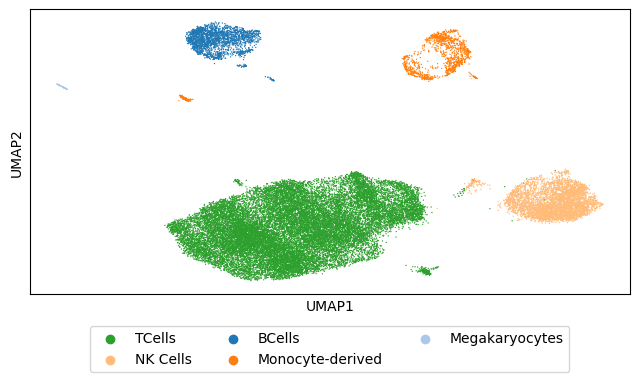

In [14]:
sc.settings.figdir = "Intermediate_Files/Paper_Figs/UMAPs"
# Only use the desired resolution
resolutions = ['0.26_log_AutoZI']

import matplotlib.pyplot as plt
import scanpy as sc


# Define desired order
legend_order = ["TCells", "NK Cells", "BCells", "Monocyte-derived", "Megakaryocytes"]

# Plot UMAP without saving yet
sc.pl.umap(
    adata_i_filtered,
    color='gen_cell_type',
    title='',  # No title for publication version
    frameon=True,
    palette=plt.get_cmap('tab20').colors,
    legend_loc='lower center',
    legend_fontsize=10,
    legend_fontoutline=1,
    show=False  # Important: allow to edit figure after plotting
)

# Adjust figure
fig = plt.gcf()
fig.set_size_inches(6.5, 4)

# Get legend and reorder
ax = plt.gca()
handles, labels = ax.get_legend_handles_labels()

# Build a new legend with desired order
order = [labels.index(l) for l in legend_order if l in labels]
ordered_handles = [handles[i] for i in order]
ordered_labels = [labels[i] for i in order]

# Remove old legend
ax.get_legend().remove()

# Add new ordered legend
ax.legend(ordered_handles, ordered_labels,
          loc='lower center',
          bbox_to_anchor=(0.5, -0.3),  # Centered below, negative y pushes down
          fontsize=10,
          frameon=True,
          ncol=3)  # vertical layout

plt.tight_layout()

# Save manually
plt.savefig("Intermediate_Files/Paper_Figs/UMAP/UMAP_0.26_log_autoZI_isoform_celltypes.pdf",
            dpi=600, transparent=True, bbox_inches="tight")

plt.show()

In [3]:
from scanpy import read_h5ad

output_dir = 'Intermediate_Files/Clustering_07282025/'

# Load the mdata object from the file
adata_g_filtered = read_h5ad(os.path.join(output_dir, "PBMC_gene_AutoZI_clustered_celltypes_reannotated_AutoZILatent_08132025.h5mu"))
adata_i_filtered = read_h5ad(os.path.join(output_dir, "PBMC_iso_AutoZI_clustered_celltypes_reannotated_AutoZILatent_08132025.h5mu"))

In [4]:
adata_g_filtered.X = adata_g_filtered.layers["log_denoised"]
adata_i_filtered.X = adata_i_filtered.layers["log_denoised"]

In [4]:
# Function to find matching genes in var_names (combined_ID format)
def find_matching_genes(prefixes, gene_list):
    return [gene for gene in gene_list if any(gene.startswith(prefix) for prefix in prefixes)]

In [5]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# ---- Define marker genes
marker_genes = {
    "TCells": ["CD3D:", "CD3E:", "CD3G:"],
    "Cytotoxic": ["CD8A:", "CD8B:", "GATA3:", "KLRB1:", "CCL5:"],
    "CD4+ Effector": ["CD4:", "IL2RA:", "GATA3:", "AHR:", "TNF:"],
    "Memory": ["CCR7:", "SELL:", "TCF7:"],
    "Transition": ["ITGAE:", "LEF1:", "TCF7:", "IL7R:", "GATA3:", "IL2RA", "CTLA4", "CD27:"],
    "Natural Killer": ["GZMB:", "KLRF1:", "NCAM1:", "ITGAM:", "IL2RB:"],
    "BCell": ["CD22:", "CD79A:", "MS4A1:", "CD19:"],
    "Monocyte-derived": ["FCGR2A:", "CLEC7A:", "CD33:", "LILRB4:"],
    "Megakaryocyte": ["ITGA2B:", "MPL:", "GP1BA:"]
}

/tmp/ipykernel_1307033/1864934978.py:35: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  g_expr = g_expr.groupby(g_expr.columns, axis=1).mean()
/tmp/ipykernel_1307033/1864934978.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  avg_expr = g_expr.groupby(g_expr.index).mean()
/tmp/ipykernel_1307033/1864934978.py:44: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  pct_expr = (g_expr > 0).astype(int).groupby(g_expr.index).mean() * 100


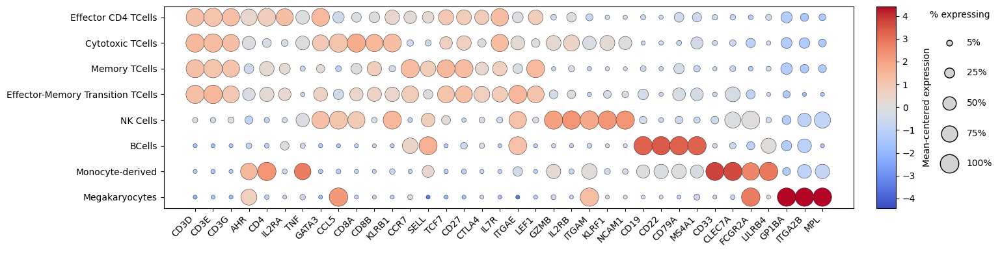

In [13]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Define marker groups you want (unchanged)
marker_groups_to_include = ["TCells", "CD4+ Effector", "Cytotoxic", "Memory", "Transition",  
                            "Natural Killer", "BCell", "Monocyte-derived", "Megakaryocyte"]

# Desired cell-type order (edit to your labels exactly as in sub_cell_type)
desired_celltype_order = ["Effector CD4 TCells", "Cytotoxic TCells", "Memory TCells", "Effector-Memory Transition TCells", 
                          "NK Cells", "BCells", "Monocyte-derived", "Megakaryocytes"]

# --- Match genes present in adata ---
gene_to_group, matched_genes = {}, []
for group, genes in marker_genes.items():
    if group not in marker_groups_to_include:
        continue
    matches = find_matching_genes(genes, adata_g_filtered.var_names)
    matched_genes.extend(matches)
    for g in matches:
        gene_to_group[g.split(":")[0]] = group

# Clean gene names
clean_gene_names = [g.split(":")[0] for g in matched_genes]

# Expression matrix (cells × genes); collapse duplicate columns
X = adata_g_filtered[:, matched_genes].X
if hasattr(X, "toarray"):
    X = X.toarray()
g_expr = pd.DataFrame(X, columns=clean_gene_names,
                      index=adata_g_filtered.obs["sub_cell_type"].astype(str))
g_expr = g_expr.groupby(g_expr.columns, axis=1).mean()

# Keep only desired cell types in order
present = [ct for ct in desired_celltype_order if ct in g_expr.index.unique()]
g_expr = g_expr.loc[g_expr.index.isin(present)]
g_expr.index = pd.CategoricalIndex(g_expr.index, categories=present, ordered=True)

# --- Per-cluster metrics ---
avg_expr = g_expr.groupby(g_expr.index).mean()
pct_expr = (g_expr > 0).astype(int).groupby(g_expr.index).mean() * 100

# --- Column ordering with GATA3 override ---
group_order = marker_groups_to_include
gene_to_first_group = {}
for grp in group_order:
    listed = set(g for g in avg_expr.columns if g in [gg.split(":")[0] for gg in marker_genes.get(grp, [])])
    for g in listed:
        gene_to_first_group.setdefault(g, grp)
if "GATA3" in avg_expr.columns:
    gene_to_first_group["GATA3"] = "CD4+ Effector"

ordered_genes = []
for grp in group_order:
    genes_in_grp = [g for g in avg_expr.columns if gene_to_first_group.get(g) == grp]
    genes_in_grp = sorted(set(genes_in_grp))
    if grp == "CD4+ Effector" and "GATA3" in genes_in_grp:
        genes_in_grp = [g for g in genes_in_grp if g != "GATA3"] + ["GATA3"]
    ordered_genes.extend(genes_in_grp)
ordered_genes = [g for g in ordered_genes if g in avg_expr.columns]

avg_expr = avg_expr[ordered_genes]
pct_expr = pct_expr[ordered_genes]

# --- Mean-center per gene ---
avg_centered = avg_expr - avg_expr.mean(axis=0)

# --- Color scaling ---
max_abs = np.nanpercentile(np.abs(avg_centered.values), 99)
norm = TwoSlopeNorm(vcenter=0, vmin=-max_abs, vmax=max_abs)

# --- Long format for plotting ---
avg_long = avg_centered.reset_index(names="cell_type").melt(id_vars="cell_type", var_name="gene", value_name="avg_c")
pct_long = pct_expr.reset_index(names="cell_type").melt(id_vars="cell_type", var_name="gene", value_name="pct")
plot_long = avg_long.merge(pct_long, on=["cell_type","gene"])

# Reverse y-axis order for seaborn (draws bottom→top)
bottom_to_top = present[::-1]
plot_long["cell_type"] = pd.Categorical(plot_long["cell_type"], categories=bottom_to_top, ordered=True)
plot_long["gene"] = pd.Categorical(plot_long["gene"], categories=ordered_genes, ordered=True)
plot_long = plot_long.sort_values(["cell_type","gene"])

# --- Draw dotplot ---
fig, ax = plt.subplots(figsize=(max(11, 0.50*len(ordered_genes)), max(2.8, 0.50*len(present))))
size_min, size_max = 20, 420

sns.scatterplot(
    data=plot_long,
    x="gene",
    y="cell_type",
    hue="avg_c",
    size="pct",
    palette="coolwarm",
    hue_norm=norm,
    sizes=(size_min, size_max),
    edgecolor="black",
    linewidth=0.3,
    legend=False,
    ax=ax
)

ax.invert_yaxis()
ax.margins(y=0.06)

# --- Colorbar + % expressing legend ---
divider = make_axes_locatable(ax)

# Colorbar
cax = divider.append_axes("right", size="2.8%", pad=0.35)
sm = plt.cm.ScalarMappable(cmap="coolwarm", norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, cax=cax)
cbar.set_label("Mean-centered expression", rotation=90, labelpad=8)

# Size legend
lax = divider.append_axes("right", size="10%", pad=0.45)
lax.set_xlim(0, 1)
lax.set_ylim(0, 1)
lax.axis("off")

levels = [5, 25, 50, 75, 100]
pct_min, pct_max = float(plot_long["pct"].min()), float(plot_long["pct"].max())
levels = [lv for lv in levels if pct_min <= lv <= pct_max] or \
         [round(pct_min), round((pct_min+pct_max)/2), round(pct_max)]

lax.text(0.5, 0.98, "% expressing", ha="center", va="top", fontsize=10)
ypos = np.linspace(0.82, 0.22, len(levels))
for y, lv in zip(ypos, levels):
    sz = np.interp(lv, [pct_min, pct_max], [size_min, size_max])
    lax.plot([0.35], [y], 'o',
             ms=np.sqrt(sz),
             markeredgecolor='black', markerfacecolor='lightgray')
    lax.text(0.60, y, f"{int(lv)}%", va="center", ha="left", fontsize=10)

# --- Cosmetics ---
ax.set_xlabel("")
ax.set_ylabel("")
for lab in ax.get_xticklabels():
    lab.set_rotation(45)
    lab.set_ha('right')
plt.yticks(rotation=0)

plt.tight_layout(rect=(0.02, 0, 0.88, 1))

fig.savefig(
    "Intermediate_Files/Paper_Figs/Markers/subcelltype_marker_all_dotplot.pdf",
    dpi=600, transparent=True, bbox_inches="tight"
)
plt.show()

/tmp/ipykernel_1373976/1456077130.py:33: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  g_expr = g_expr.groupby(g_expr.columns, axis=1).mean()
/tmp/ipykernel_1373976/1456077130.py:41: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  avg_expr = g_expr.groupby(g_expr.index).mean()
/tmp/ipykernel_1373976/1456077130.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  pct_expr = (g_expr > 0).astype(int).groupby(g_expr.index).mean() * 100


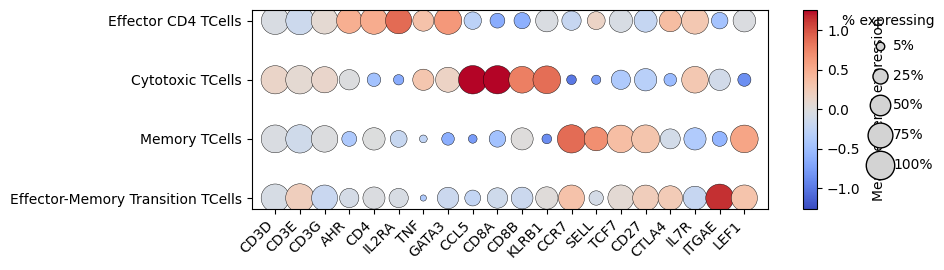

In [8]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Define marker groups you want (unchanged)
marker_groups_to_include = ["TCells", "CD4+ Effector", "Cytotoxic", "Memory", "Transition"]

# >>> Desired cell-type order (edit to your labels exactly as in sub_cell_type)
desired_celltype_order = ["Effector CD4 TCells", "Cytotoxic TCells", "Memory TCells", "Effector-Memory Transition TCells"]

# --- Match genes present in adata ---
gene_to_group, matched_genes = {}, []
for group, genes in marker_genes.items():
    if group not in marker_groups_to_include:
        continue
    matches = find_matching_genes(genes, adata_g_filtered.var_names)
    matched_genes.extend(matches)
    for g in matches:
        gene_to_group[g.split(":")[0]] = group

# Clean gene names
clean_gene_names = [g.split(":")[0] for g in matched_genes]

# Expression matrix (cells × genes); collapse duplicate columns
X = adata_g_filtered[:, matched_genes].X
if hasattr(X, "toarray"):
    X = X.toarray()
g_expr = pd.DataFrame(X, columns=clean_gene_names,
                      index=adata_g_filtered.obs["sub_cell_type"].astype(str))
g_expr = g_expr.groupby(g_expr.columns, axis=1).mean()

# Keep only desired cell types in order
present = [ct for ct in desired_celltype_order if ct in g_expr.index.unique()]
g_expr = g_expr.loc[g_expr.index.isin(present)]
g_expr.index = pd.CategoricalIndex(g_expr.index, categories=present, ordered=True)

# --- Per-cluster metrics ---
avg_expr = g_expr.groupby(g_expr.index).mean()
pct_expr = (g_expr > 0).astype(int).groupby(g_expr.index).mean() * 100

# --- Column ordering with GATA3 override ---
group_order = marker_groups_to_include
gene_to_first_group = {}
for grp in group_order:
    listed = set(g for g in avg_expr.columns if g in [gg.split(":")[0] for gg in marker_genes.get(grp, [])])
    for g in listed:
        gene_to_first_group.setdefault(g, grp)
if "GATA3" in avg_expr.columns:
    gene_to_first_group["GATA3"] = "CD4+ Effector"

ordered_genes = []
for grp in group_order:
    genes_in_grp = [g for g in avg_expr.columns if gene_to_first_group.get(g) == grp]
    genes_in_grp = sorted(set(genes_in_grp))
    if grp == "CD4+ Effector" and "GATA3" in genes_in_grp:
        genes_in_grp = [g for g in genes_in_grp if g != "GATA3"] + ["GATA3"]
    ordered_genes.extend(genes_in_grp)
ordered_genes = [g for g in ordered_genes if g in avg_expr.columns]

avg_expr = avg_expr[ordered_genes]
pct_expr = pct_expr[ordered_genes]

# --- Mean-center per gene ---
avg_centered = avg_expr - avg_expr.mean(axis=0)

# --- Color scaling ---
max_abs = np.nanpercentile(np.abs(avg_centered.values), 99)
norm = TwoSlopeNorm(vcenter=0, vmin=-max_abs, vmax=max_abs)

# --- Long format for plotting ---
avg_long = avg_centered.reset_index(names="cell_type").melt(id_vars="cell_type", var_name="gene", value_name="avg_c")
pct_long = pct_expr.reset_index(names="cell_type").melt(id_vars="cell_type", var_name="gene", value_name="pct")
plot_long = avg_long.merge(pct_long, on=["cell_type","gene"])

# Reverse y-axis order for seaborn (draws bottom→top)
bottom_to_top = present[::-1]
plot_long["cell_type"] = pd.Categorical(plot_long["cell_type"], categories=bottom_to_top, ordered=True)
plot_long["gene"] = pd.Categorical(plot_long["gene"], categories=ordered_genes, ordered=True)
plot_long = plot_long.sort_values(["cell_type","gene"])

# --- Draw dotplot ---
fig, ax = plt.subplots(figsize=(max(11, 0.50*len(ordered_genes)), max(2.8, 0.50*len(present))))
size_min, size_max = 20, 420

sns.scatterplot(
    data=plot_long,
    x="gene",
    y="cell_type",
    hue="avg_c",
    size="pct",
    palette="coolwarm",
    hue_norm=norm,
    sizes=(size_min, size_max),
    edgecolor="black",
    linewidth=0.3,
    legend=False,
    ax=ax
)

ax.invert_yaxis()
ax.margins(y=0.06)

# --- Colorbar + % expressing legend ---
divider = make_axes_locatable(ax)

# Colorbar
cax = divider.append_axes("right", size="2.8%", pad=0.35)
sm = plt.cm.ScalarMappable(cmap="coolwarm", norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, cax=cax)
cbar.set_label("Mean-centered expression", rotation=90, labelpad=8)

# Size legend
lax = divider.append_axes("right", size="10%", pad=0.45)
lax.set_xlim(0, 1)
lax.set_ylim(0, 1)
lax.axis("off")

levels = [5, 25, 50, 75, 100]
pct_min, pct_max = float(plot_long["pct"].min()), float(plot_long["pct"].max())
levels = [lv for lv in levels if pct_min <= lv <= pct_max] or \
         [round(pct_min), round((pct_min+pct_max)/2), round(pct_max)]

lax.text(0.5, 0.98, "% expressing", ha="center", va="top", fontsize=10)
ypos = np.linspace(0.82, 0.22, len(levels))
for y, lv in zip(ypos, levels):
    sz = np.interp(lv, [pct_min, pct_max], [size_min, size_max])
    lax.plot([0.35], [y], 'o',
             ms=np.sqrt(sz),
             markeredgecolor='black', markerfacecolor='lightgray')
    lax.text(0.60, y, f"{int(lv)}%", va="center", ha="left", fontsize=10)

# --- Cosmetics ---
ax.set_xlabel("")
ax.set_ylabel("")
for lab in ax.get_xticklabels():
    lab.set_rotation(45)
    lab.set_ha('right')
plt.yticks(rotation=0)

plt.tight_layout(rect=(0.02, 0, 0.88, 1))

fig.savefig(
    "Intermediate_Files/Paper_Figs/Markers/subcelltype_isoform_markers_TCellsOnly_dotplot.pdf",
    dpi=600, transparent=True, bbox_inches="tight"
)
plt.show()

/tmp/ipykernel_1086995/444643160.py:35: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  g_expr = g_expr.groupby(g_expr.columns, axis=1).mean()
/tmp/ipykernel_1086995/444643160.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  avg_expr = g_expr.groupby(g_expr.index).mean()
/tmp/ipykernel_1086995/444643160.py:44: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  pct_expr = (g_expr > 0).astype(int).groupby(g_expr.index).mean() * 100


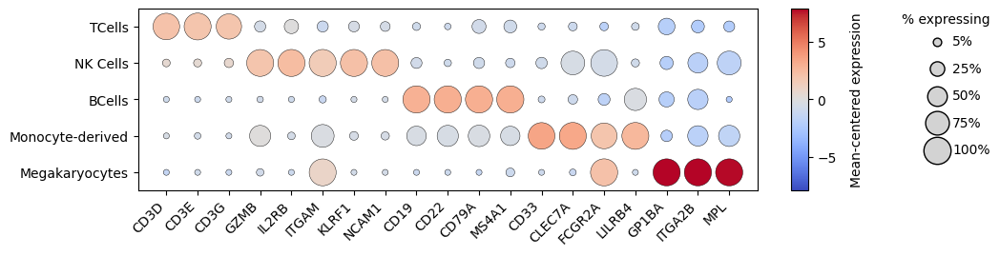

In [39]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
from matplotlib.lines import Line2D

# --- config ---
marker_groups_to_include = ["TCells", "Natural Killer", "BCell", "Monocyte-derived", "Megakaryocyte"]
desired_celltype_order = ["TCells", "NK Cells", "BCells", "Monocyte-derived", "Megakaryocytes"]

# --- match genes present in adata ---
gene_to_group = {}
matched_genes = []
for group, genes in marker_genes.items():
    if group not in marker_groups_to_include:
        continue
    matches = find_matching_genes(genes, adata_g_filtered.var_names)
    matched_genes.extend(matches)
    for g in matches:
        gene_to_group[g.split(":")[0]] = group

# Clean matched gene names to just gene symbol
clean_gene_names = [g.split(":")[0] for g in matched_genes]

# Expression matrix (cells × genes); collapse duplicate columns
X = adata_g_filtered[:, matched_genes].X
if hasattr(X, "toarray"):
    X = X.toarray()
g_expr = pd.DataFrame(
    X,
    columns=clean_gene_names,
    index=adata_g_filtered.obs["gen_cell_type"].astype(str)
)
g_expr = g_expr.groupby(g_expr.columns, axis=1).mean()

# Keep only desired cell types
present = [ct for ct in desired_celltype_order if ct in g_expr.index.unique()]
g_expr = g_expr.loc[g_expr.index.isin(present)]
g_expr.index = pd.CategoricalIndex(g_expr.index, categories=present, ordered=True)

# --- per-cluster metrics ---
avg_expr = g_expr.groupby(g_expr.index).mean()
pct_expr = (g_expr > 0).astype(int).groupby(g_expr.index).mean() * 100

# Order genes by marker group
genes_in_plot = avg_expr.columns.tolist()
gene_group_df = (
    pd.DataFrame({"gene": genes_in_plot})
      .assign(group=lambda d: d["gene"].map(gene_to_group).fillna("Other"))
)
gene_group_df = gene_group_df[gene_group_df["group"].isin(marker_groups_to_include)].copy()
gene_group_df["group_rank"] = gene_group_df["group"].apply(marker_groups_to_include.index)
gene_group_df = gene_group_df.sort_values(["group_rank", "gene"])
sorted_genes = gene_group_df["gene"].tolist()

avg_expr = avg_expr[sorted_genes]
pct_expr = pct_expr[sorted_genes]

# 1) mean-center per gene (unchanged)
avg_centered = avg_expr.copy()
for g in avg_centered.columns:
    avg_centered[g] = avg_centered[g] - avg_centered[g].mean()

# 2) enforce row order: compute both top→bottom list and seaborn category order (bottom→top)
top_to_bottom = ["TCells", "NK Cells", "BCells", "Monocyte-derived", "Megakaryocytes"]
avg_centered = avg_centered.reindex(top_to_bottom)
pct_expr     = pct_expr.reindex(top_to_bottom)

# 3) robust symmetric color limits (unchanged)
max_abs = np.nanpercentile(np.abs(avg_centered.values), 99)
norm = TwoSlopeNorm(vcenter=0, vmin=-max_abs, vmax=max_abs)

# 4) long format
avg_long = avg_centered.reset_index(names="cell_type").melt(id_vars="cell_type", var_name="gene", value_name="avg_c")
pct_long = pct_expr.reset_index(names="cell_type").melt(id_vars="cell_type", var_name="gene", value_name="pct")
plot_long = avg_long.merge(pct_long, on=["cell_type","gene"])

# IMPORTANT: seaborn draws categories bottom→top, so reverse here to make TCells appear at the TOP
bottom_to_top = top_to_bottom[::-1]
plot_long["cell_type"] = pd.Categorical(plot_long["cell_type"], categories=bottom_to_top, ordered=True)
plot_long["gene"] = pd.Categorical(plot_long["gene"], categories=sorted_genes, ordered=True)
plot_long = plot_long.sort_values(["cell_type","gene"])

# --- Draw ---
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.lines import Line2D

fig, ax = plt.subplots(
    figsize=(max(12, 0.50*len(sorted_genes)), max(2.8, 0.50*len(present))),
    constrained_layout=False  # we'll control layout with divider
)

size_min, size_max = 20, 420

sns.scatterplot(
    data=plot_long,
    x="gene",
    y="cell_type",
    hue="avg_c",
    size="pct",
    palette="coolwarm",
    hue_norm=norm,
    sizes=(size_min, size_max),
    edgecolor="black",
    linewidth=0.3,
    legend=False,
    ax=ax
)

ax.invert_yaxis()
ax.margins(y=0.12)  # top/bottom breathing room

# ---- Right-side panel: colorbar and size legend in fixed axes ----
divider = make_axes_locatable(ax)

# Colorbar axis
cax = divider.append_axes("right", size="2.8%", pad=0.35)
sm = plt.cm.ScalarMappable(cmap="coolwarm", norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, cax=cax)
cbar.set_label("Mean-centered expression", rotation=90, labelpad=8)

# Size-legend axis (below the colorbar)
lax = divider.append_axes("right", size="7%", pad=0.22)  # a bit below cbar
lax.set_axis_off()

# --- Size legend (% expressing) neatly below/next to the colorbar ---
from matplotlib.lines import Line2D

# a small axis beside the colorbar (further right than before)
lax = divider.append_axes("right", size="10%", pad=0.45)
lax.set_xlim(0, 1)
lax.set_ylim(0, 1)
lax.axis("off")

# choose levels actually present
levels = [5, 25, 50, 75, 100]
pct_min, pct_max = float(plot_long["pct"].min()), float(plot_long["pct"].max())
levels = [lv for lv in levels if pct_min <= lv <= pct_max] or \
         [round(pct_min), round((pct_min+pct_max)/2), round(pct_max)]

# title (horizontal)
lax.text(0.5, 0.98, "% expressing", ha="center", va="top", fontsize=10, rotation=0)

# draw legend dots vertically with labels
ypos = np.linspace(0.82, 0.22, len(levels))
for y, lv in zip(ypos, levels):
    sz = np.interp(lv, [pct_min, pct_max], [size_min, size_max])
    lax.plot([0.35], [y], 'o',
             ms=np.sqrt(sz),  # points^2 -> points
             markeredgecolor='black', markerfacecolor='lightgray')
    lax.text(0.60, y, f"{int(lv)}%", va="center", ha="left", fontsize=10)

# keep colorbar label tidy (vertical) and add a bit of space
cbar.ax.set_ylabel("Mean-centered expression", rotation=90, labelpad=10)
# --- Cosmetics ---
ax.set_xlabel("")
ax.set_ylabel("")
for lab in ax.get_xticklabels():
    lab.set_rotation(45)
    lab.set_ha('right')
plt.yticks(rotation=0)


# leave room on the right for cbar+legend, but don't clip them
plt.tight_layout(rect=(0, 0, 0.88, 1))

fig.savefig(
    "Intermediate_Files/Paper_Figs/Markers/gene_celltype_marker_all_dotplot_pct.pdf",
    dpi=600, transparent=True, bbox_inches="tight"
)
plt.show()

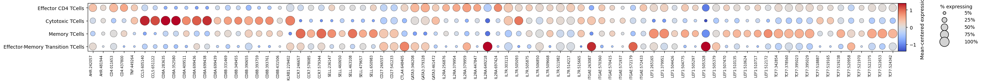

[DONE] Saved: Intermediate_Files/Paper_Figs/Markers/subcelltype_marker_isoform_dotplot.pdf


In [22]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
from mpl_toolkits.axes_grid1 import make_axes_locatable

# --- Config ---
marker_groups_to_include = ["CD4+ Effector", "Cytotoxic", "Memory", "Transition"]
celltype_order = [
    "Effector CD4 TCells", "Cytotoxic TCells", "Memory TCells", "Effector-Memory Transition TCells"
]

# --- Build isoform → group mapping & collect isoforms present ---
gene_to_group = {}
matched_isoforms = []
for group, genes in marker_genes.items():
    if group not in marker_groups_to_include:
        continue
    matches = find_matching_genes(genes, adata_i_filtered.var_names)  # isoform IDs like "GENE:ENSG:ENST"
    matched_isoforms.extend(matches)
    for iso in matches:
        gene_to_group[iso] = group

if not matched_isoforms:
    raise ValueError("No marker isoforms found for the requested groups.")

# Deduplicate isoforms while preserving order
matched_isoforms = list(dict.fromkeys(matched_isoforms))

# --- Expression matrix (cells × isoforms) ---
X = adata_i_filtered[:, matched_isoforms].X
if hasattr(X, "toarray"):
    X = X.toarray()

# IMPORTANT: subtypes live in sub_cell_type (matches your celltype_order labels)
iso_expr = pd.DataFrame(
    X,
    index=adata_i_filtered.obs["sub_cell_type"].astype(str),
    columns=matched_isoforms
)

# --- Per-cluster metrics on isoforms ---
avg_expr_iso = iso_expr.groupby(iso_expr.index, observed=True).mean()
pct_expr_iso = (iso_expr > 0).astype(int).groupby(iso_expr.index, observed=True).mean() * 100

# --- keep clusters in desired order ---
present = [ct for ct in celltype_order if ct in avg_expr_iso.index]
if not present:
    raise ValueError("None of the requested subtypes in celltype_order are present in sub_cell_type.")
avg_expr_iso = avg_expr_iso.reindex(present)
pct_expr_iso = pct_expr_iso.reindex(present)

# --- Sort isoforms by (group_rank, gene, isoform) ---
isoform_to_gene = {iso: iso.split(":")[0] for iso in avg_expr_iso.columns}
meta = pd.DataFrame({
    "isoform": avg_expr_iso.columns,
    "gene": [isoform_to_gene[i] for i in avg_expr_iso.columns],
    "group": [gene_to_group.get(i, "") for i in avg_expr_iso.columns],
})
meta["group_rank"] = meta["group"].apply(
    lambda g: marker_groups_to_include.index(g) if g in marker_groups_to_include else 999
)
meta = meta.sort_values(["group_rank", "gene", "isoform"])

# Build ordered list from what actually exists (unique!)
ordered_isoforms = meta["isoform"].astype(str)
ordered_isoforms = pd.Index(ordered_isoforms).unique().tolist()

# Reorder matrices (safe even if some groups overlap)
avg_expr_iso = avg_expr_iso[ordered_isoforms]
pct_expr_iso = pct_expr_iso[ordered_isoforms]

# --- Mean-center per isoform (white = average across clusters for that isoform) ---
avg_centered = avg_expr_iso - avg_expr_iso.mean(axis=0)

# short x labels: GENE:last 6 of transcript id (if present)
def short_label(iso):
    parts = iso.split(":")
    if len(parts) == 3:
        gene, _, enst = parts
        return f"{gene}:{enst[-6:]}"
    return iso
xlabels = [short_label(i) for i in ordered_isoforms]

# --- Long format for plotting ---
avg_long = avg_centered.reset_index(names="cell_type").melt(
    id_vars="cell_type", var_name="iso", value_name="avg_c"
)
pct_long = pct_expr_iso.reset_index(names="cell_type").melt(
    id_vars="cell_type", var_name="iso", value_name="pct"
)
plot_long = avg_long.merge(pct_long, on=["cell_type", "iso"], how="inner")

# Ensure types/uniqueness BEFORE categoricals (prevents empty merges & warnings)
plot_long["iso"] = plot_long["iso"].astype(str)
ordered_isoforms = pd.Index([str(i) for i in ordered_isoforms]).unique().tolist()

# Enforce display order
plot_long["cell_type"] = pd.Categorical(plot_long["cell_type"], categories=present, ordered=True)
plot_long["iso"]       = pd.Categorical(plot_long["iso"], categories=ordered_isoforms, ordered=True)

# IMPORTANT: drop rows with categories not present (avoids empty means)
plot_long = plot_long.dropna(subset=["cell_type", "iso"]).sort_values(["cell_type", "iso"])

# --- Dot plot ---
fig, ax = plt.subplots(figsize=(max(12, 0.42*len(ordered_isoforms)), max(2.5, 0.45*len(present))))
size_min, size_max = 18, 380

# robust symmetric color range around 0
if plot_long["avg_c"].notna().any():
    rng = float(np.nanpercentile(np.abs(avg_centered.values), 99)) or 1.0
else:
    rng = 1.0  # fallback
norm = TwoSlopeNorm(vcenter=0, vmin=-rng, vmax=rng)

sns.scatterplot(
    data=plot_long,
    x="iso", y="cell_type",
    hue="avg_c", size="pct",
    palette="coolwarm", hue_norm=norm,
    sizes=(size_min, size_max),
    edgecolor="black", linewidth=0.3,
    legend=False, ax=ax
)

# layout
ax.margins(y=0.12, x=0)
ax.set_xlim(-0.5, len(ordered_isoforms) - 0.5)

# x ticks: set ticks first, then labels (short form)
ax.set_xticks(np.arange(len(ordered_isoforms)))
ax.set_xticklabels(xlabels, rotation=90, ha="right", fontsize=7)

# --- Right side: colorbar + % expressing legend ---
divider = make_axes_locatable(ax)

cax = divider.append_axes("right", size="1%", pad=0.0)
sm = plt.cm.ScalarMappable(cmap="coolwarm", norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, cax=cax)
cbar.set_label("Mean-centered expression", rotation=90, labelpad=8)

lax = divider.append_axes("right", size="10%", pad=0.28)
lax.set_axis_off(); lax.set_xlim(0, 1); lax.set_ylim(0, 1)
levels = [5, 25, 50, 75, 100]  # fixed legend scale
lax.text(0.5, 0.98, "% expressing", ha="center", va="top", fontsize=10)
ypos = np.linspace(0.80, 0.20, len(levels))
for y, lv in zip(ypos, levels):
    sz = np.interp(lv, [0, 100], [size_min, size_max])
    lax.plot([0.35], [y], 'o', ms=np.sqrt(sz), markeredgecolor='black', markerfacecolor='lightgray')
    lax.text(0.60, y, f"{lv}%", va="center", ha="left", fontsize=10)

# Cosmetics
ax.set_xlabel(""); ax.set_ylabel("")
plt.yticks(rotation=0)

plt.tight_layout(rect=(0, 0, 0.88, 1))
out = "Intermediate_Files/Paper_Figs/Markers/subcelltype_marker_isoform_dotplot.pdf"
fig.savefig(out, dpi=600, transparent=True, bbox_inches="tight")
plt.show()
print(f"[DONE] Saved: {out}")

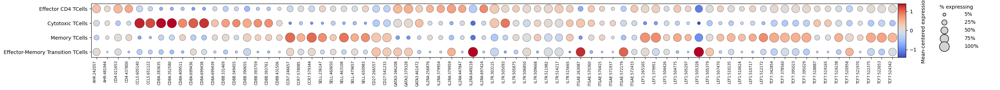

[DONE] Saved: Intermediate_Files/Paper_Figs/Markers/subcelltype_marker_isoform_dotplot_excludeN1isos.pdf


In [20]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
from mpl_toolkits.axes_grid1 import make_axes_locatable

# --- Config ---
marker_groups_to_include = ["CD4+ Effector", "Cytotoxic", "Memory", "Transition"]
celltype_order = [
    "Effector CD4 TCells", "Cytotoxic TCells", "Memory TCells", "Effector-Memory Transition TCells"
]

# --- Build isoform → group mapping & collect isoforms present ---
gene_to_group = {}
matched_isoforms = []
for group, genes in marker_genes.items():
    if group not in marker_groups_to_include:
        continue
    matches = find_matching_genes(genes, adata_i_filtered.var_names)  # isoform IDs like "GENE:ENSG:ENST"
    matched_isoforms.extend(matches)
    for iso in matches:
        gene_to_group[iso] = group

if not matched_isoforms:
    raise ValueError("No marker isoforms found for the requested groups.")

# Deduplicate isoforms while preserving order
matched_isoforms = list(dict.fromkeys(matched_isoforms))

# --- EXCLUDE specific genes ---
exclude_genes = {"TNF", "KLRB1", "CTLA4"}
matched_isoforms = [
    iso for iso in matched_isoforms
    if iso.split(":")[0] not in exclude_genes
]

# --- Expression matrix (cells × isoforms) ---
X = adata_i_filtered[:, matched_isoforms].X
if hasattr(X, "toarray"):
    X = X.toarray()

# IMPORTANT: subtypes live in sub_cell_type (matches your celltype_order labels)
iso_expr = pd.DataFrame(
    X,
    index=adata_i_filtered.obs["sub_cell_type"].astype(str),
    columns=matched_isoforms
)

# --- Per-cluster metrics on isoforms ---
avg_expr_iso = iso_expr.groupby(iso_expr.index, observed=True).mean()
pct_expr_iso = (iso_expr > 0).astype(int).groupby(iso_expr.index, observed=True).mean() * 100

# --- keep clusters in desired order ---
present = [ct for ct in celltype_order if ct in avg_expr_iso.index]
if not present:
    raise ValueError("None of the requested subtypes in celltype_order are present in sub_cell_type.")
avg_expr_iso = avg_expr_iso.reindex(present)
pct_expr_iso = pct_expr_iso.reindex(present)

# --- Sort isoforms by (group_rank, gene, isoform) ---
isoform_to_gene = {iso: iso.split(":")[0] for iso in avg_expr_iso.columns}
meta = pd.DataFrame({
    "isoform": avg_expr_iso.columns,
    "gene": [isoform_to_gene[i] for i in avg_expr_iso.columns],
    "group": [gene_to_group.get(i, "") for i in avg_expr_iso.columns],
})
meta["group_rank"] = meta["group"].apply(
    lambda g: marker_groups_to_include.index(g) if g in marker_groups_to_include else 999
)
meta = meta.sort_values(["group_rank", "gene", "isoform"])

# Build ordered list from what actually exists (unique!)
ordered_isoforms = meta["isoform"].astype(str)
ordered_isoforms = pd.Index(ordered_isoforms).unique().tolist()

# Reorder matrices (safe even if some groups overlap)
avg_expr_iso = avg_expr_iso[ordered_isoforms]
pct_expr_iso = pct_expr_iso[ordered_isoforms]

# --- Mean-center per isoform (white = average across clusters for that isoform) ---
avg_centered = avg_expr_iso - avg_expr_iso.mean(axis=0)

# short x labels: GENE:last 6 of transcript id (if present)
def short_label(iso):
    parts = iso.split(":")
    if len(parts) == 3:
        gene, _, enst = parts
        return f"{gene}:{enst[-6:]}"
    return iso
xlabels = [short_label(i) for i in ordered_isoforms]

# --- Long format for plotting ---
avg_long = avg_centered.reset_index(names="cell_type").melt(
    id_vars="cell_type", var_name="iso", value_name="avg_c"
)
pct_long = pct_expr_iso.reset_index(names="cell_type").melt(
    id_vars="cell_type", var_name="iso", value_name="pct"
)
plot_long = avg_long.merge(pct_long, on=["cell_type", "iso"], how="inner")

# Ensure types/uniqueness BEFORE categoricals (prevents empty merges & warnings)
plot_long["iso"] = plot_long["iso"].astype(str)
ordered_isoforms = pd.Index([str(i) for i in ordered_isoforms]).unique().tolist()

# Enforce display order
plot_long["cell_type"] = pd.Categorical(plot_long["cell_type"], categories=present, ordered=True)
plot_long["iso"]       = pd.Categorical(plot_long["iso"], categories=ordered_isoforms, ordered=True)

# IMPORTANT: drop rows with categories not present (avoids empty means)
plot_long = plot_long.dropna(subset=["cell_type", "iso"]).sort_values(["cell_type", "iso"])

# --- Dot plot ---
fig, ax = plt.subplots(figsize=(max(12, 0.42*len(ordered_isoforms)), max(2.6, 0.45*len(present))))
size_min, size_max = 18, 380

# robust symmetric color range around 0
if plot_long["avg_c"].notna().any():
    rng = float(np.nanpercentile(np.abs(avg_centered.values), 99)) or 1.0
else:
    rng = 1.0  # fallback
norm = TwoSlopeNorm(vcenter=0, vmin=-rng, vmax=rng)

sns.scatterplot(
    data=plot_long,
    x="iso", y="cell_type",
    hue="avg_c", size="pct",
    palette="coolwarm", hue_norm=norm,
    sizes=(size_min, size_max),
    edgecolor="black", linewidth=0.3,
    legend=False, ax=ax
)

# layout
ax.margins(y=0.12, x=0)
ax.set_xlim(-0.5, len(ordered_isoforms) - 0.5)

# x ticks: set ticks first, then labels (short form)
ax.set_xticks(np.arange(len(ordered_isoforms)))
ax.set_xticklabels(xlabels, rotation=90, ha="right", fontsize=7)

# --- Right side: colorbar + % expressing legend ---
divider = make_axes_locatable(ax)

cax = divider.append_axes("right", size="1%", pad=0.0)
sm = plt.cm.ScalarMappable(cmap="coolwarm", norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, cax=cax)
cbar.set_label("Mean-centered expression", rotation=90, labelpad=8)

lax = divider.append_axes("right", size="10%", pad=0.28)
lax.set_axis_off(); lax.set_xlim(0, 1); lax.set_ylim(0, 1)
levels = [5, 25, 50, 75, 100]  # fixed legend scale
lax.text(0.5, 0.98, "% expressing", ha="center", va="top", fontsize=10)
ypos = np.linspace(0.80, 0.20, len(levels))
for y, lv in zip(ypos, levels):
    sz = np.interp(lv, [0, 100], [size_min, size_max])
    lax.plot([0.35], [y], 'o', ms=np.sqrt(sz), markeredgecolor='black', markerfacecolor='lightgray')
    lax.text(0.60, y, f"{lv}%", va="center", ha="left", fontsize=10)

# Cosmetics
ax.set_xlabel(""); ax.set_ylabel("")
plt.yticks(rotation=0)

plt.tight_layout(rect=(0, 0, 0.88, 1))
out = "Intermediate_Files/Paper_Figs/Markers/subcelltype_marker_isoform_dotplot_excludeN1isos.pdf"
fig.savefig(out, dpi=600, transparent=True, bbox_inches="tight")
plt.show()
print(f"[DONE] Saved: {out}")

/tmp/ipykernel_1307033/3399785441.py:49: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  avg_expr = df_gene.groupby(df_gene.index).mean()                         # mean expression per cell-type
/tmp/ipykernel_1307033/3399785441.py:50: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  pct_expr = (df_gene > 0).astype(int).groupby(df_gene.index).mean() * 100 # % expressing (>0)


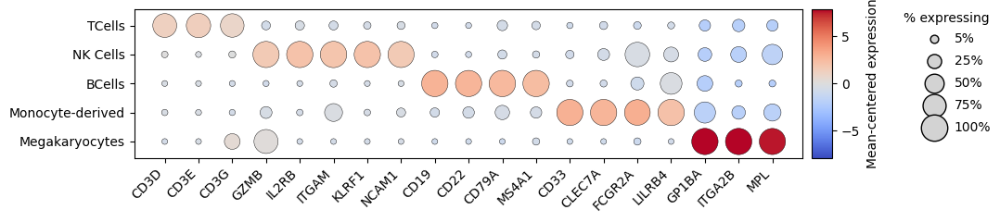

In [50]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
from mpl_toolkits.axes_grid1 import make_axes_locatable

# --- Config ---
marker_groups_to_include = ["TCells", "Natural Killer", "BCell", "Monocyte-derived", "Megakaryocyte"]
desired_celltype_order   = ["Megakaryocytes", "Monocyte-derived", "BCells", "NK Cells", "TCells"]

# --- Match isoforms present in adata (isoform -> gene; keep only selected groups) ---
gene_to_group = {}
matched_isoforms = []

for group, genes in marker_genes.items():
    if group not in marker_groups_to_include:
        continue
    matches = find_matching_genes(genes, adata_i_filtered.var_names)  # e.g., "GENE:ENSG:ENST"
    matched_isoforms.extend(matches)
    for iso in matches:
        gene_to_group[iso.split(":")[0]] = group  # gene symbol -> group

if not matched_isoforms:
    raise ValueError("No marker isoforms found in adata_i_filtered.var_names.")

# Map isoform -> gene name (collapse isoforms to gene)
isoform_to_gene = {iso: iso.split(":")[0] for iso in matched_isoforms}
gene_names = [isoform_to_gene[iso] for iso in matched_isoforms]

# --- Expression matrix (cells × isoforms) using gen_cell_type as index ---
X = adata_i_filtered[:, matched_isoforms].X
if hasattr(X, "toarray"):  # sparse
    X = X.toarray()

df_iso = pd.DataFrame(X, columns=gene_names, index=adata_i_filtered.obs["gen_cell_type"].astype(str))

# Collapse duplicate gene columns (mean across isoforms)
df_gene = df_iso.T.groupby(level=0).mean().T

# Keep only desired cell types, preserving order
present = [ct for ct in desired_celltype_order if ct in df_gene.index.unique()]
if not present:
    raise ValueError("None of desired_celltype_order present in df_gene.index.")
df_gene = df_gene.loc[df_gene.index.isin(present)]
df_gene.index = pd.CategoricalIndex(df_gene.index, categories=present, ordered=True)

# Per-cluster metrics
avg_expr = df_gene.groupby(df_gene.index).mean()                         # mean expression per cell-type
pct_expr = (df_gene > 0).astype(int).groupby(df_gene.index).mean() * 100 # % expressing (>0)

# Order genes by marker group (within-group alphabetical)
ordered_genes = []
for grp in marker_groups_to_include:
    genes_in_grp = sorted([g for g in avg_expr.columns if gene_to_group.get(g) == grp])
    ordered_genes.extend(genes_in_grp)
# keep only columns that exist
ordered_genes = [g for g in ordered_genes if g in avg_expr.columns]
avg_expr = avg_expr[ordered_genes]
pct_expr = pct_expr[ordered_genes]

# Mean-center per gene (white = average)
avg_centered = avg_expr - avg_expr.mean(axis=0)

# --- Long format for plotting ---
avg_long = avg_centered.reset_index(names="cell_type").melt(id_vars="cell_type", var_name="gene", value_name="avg_c")
pct_long = pct_expr.reset_index(names="cell_type").melt(id_vars="cell_type", var_name="gene", value_name="pct")
plot_long = avg_long.merge(pct_long, on=["cell_type", "gene"])

# Enforce plotting order; seaborn draws bottom→top; we invert later
plot_long["cell_type"] = pd.Categorical(plot_long["cell_type"], categories=present, ordered=True)
plot_long["gene"] = pd.Categorical(plot_long["gene"], categories=ordered_genes, ordered=True)
plot_long = plot_long.sort_values(["cell_type", "gene"])

# --- Draw dot plot (match T-cell figure formatting) ---
fig, ax = plt.subplots(figsize=(max(10.5, 0.65 * len(ordered_genes)), 2.5))
size_min, size_max = 20, 420

# Robust symmetric color limits (±99th percentile of |centered|)
rng = float(np.nanpercentile(np.abs(avg_centered.values), 99)) or 1.0
norm = TwoSlopeNorm(vcenter=0, vmin=-rng, vmax=rng)

sns.scatterplot(
    data=plot_long,
    x="gene", y="cell_type",
    hue="avg_c", size="pct",
    palette="coolwarm", hue_norm=norm,
    sizes=(size_min, size_max),
    edgecolor="black", linewidth=0.3,
    legend=False, ax=ax
)

# Put first category at top; add top/bottom breathing room
ax.invert_yaxis()
ax.margins(y=0.14)

# Right panel: colorbar + size legend stacked (same as T-cell figure)
divider = make_axes_locatable(ax)

# Colorbar
cax = divider.append_axes("right", size="3%", pad=0.1)
sm = plt.cm.ScalarMappable(cmap="coolwarm", norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, cax=cax)
cbar.set_label("Mean-centered expression", rotation=90, labelpad=5)

# Size legend under colorbar
lax = divider.append_axes("right", size="12%", pad=0.8)
lax.set_axis_off(); lax.set_xlim(0, 1); lax.set_ylim(0, 1)

pct_min, pct_max = float(plot_long["pct"].min()), float(plot_long["pct"].max())
levels = sorted(set([5, 25, 50, 75, 100]))

lax.text(0.5, 0.98, "% expressing", ha="center", va="top", fontsize=10)
ypos = np.linspace(0.80, 0.20, len(levels))
for y, lv in zip(ypos, levels):
    sz = np.interp(lv, [pct_min, pct_max], [size_min, size_max])
    lax.plot([0.35], [y], 'o', ms=np.sqrt(sz), markeredgecolor='black', markerfacecolor='lightgray')
    lax.text(0.60, y, f"{int(lv)}%", va="center", ha="left", fontsize=10)

# Cosmetics
ax.set_xlabel(""); ax.set_ylabel("")
for lab in ax.get_xticklabels():
    lab.set_rotation(45); lab.set_ha('right')
plt.yticks(rotation=0)

# Save (same padding block and options)
plt.tight_layout(rect=(0, 0, 0.88, 1))
out = "Intermediate_Files/Paper_Figs/Markers/iso_celltype_marker_collapsedBYgene_isoform_dotplot.pdf"
fig.savefig(out, dpi=600, transparent=True, bbox_inches="tight")
plt.show()

/tmp/ipykernel_1307033/713458854.py:45: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  avg_expr = df_gene.groupby(df_gene.index).mean()
/tmp/ipykernel_1307033/713458854.py:46: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  pct_expr = (df_gene > 0).astype(int).groupby(df_gene.index).mean() * 100


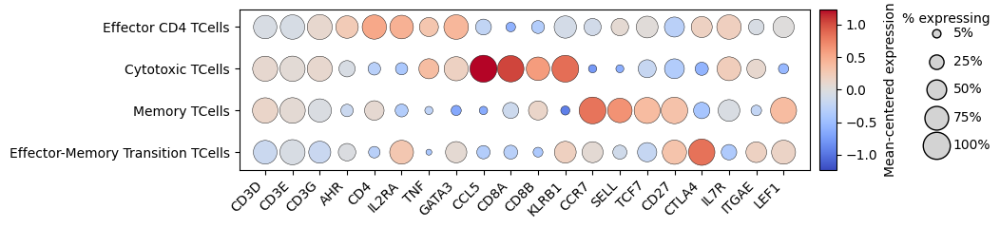

<Figure size 640x480 with 0 Axes>

In [56]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
from mpl_toolkits.axes_grid1 import make_axes_locatable

# --- Config ---
marker_groups_to_include = ["TCells", "CD4+ Effector", "Cytotoxic", "Memory", "Transition"]
tcell_order = ["Effector CD4 TCells", "Cytotoxic TCells", "Memory TCells", "Effector-Memory Transition TCells"]

#--- Match isoforms ---
gene_to_group = {}
matched_isoforms = []
for group, genes in marker_genes.items():
    if group not in marker_groups_to_include:
        continue
    matches = find_matching_genes(genes, adata_i_filtered.var_names)
    matched_isoforms.extend(matches)
    for iso in matches:
        gene_to_group[iso.split(":")[0]] = group  # gene symbol -> group

if not matched_isoforms:
    raise ValueError("No marker isoforms found for the requested groups in adata_i_filtered.")

# Map isoform → gene
isoform_to_gene = {iso: iso.split(":")[0] for iso in matched_isoforms}
gene_names = [isoform_to_gene[iso] for iso in matched_isoforms]

# --- Build expression matrix ---
X = adata_i_filtered[:, matched_isoforms].X
if hasattr(X, "toarray"):
    X = X.toarray()
df_iso = pd.DataFrame(X, columns=gene_names, index=adata_i_filtered.obs["sub_cell_type"].astype(str))
df_gene = df_iso.T.groupby(level=0).mean().T

# Keep only desired T cell types
present = [ct for ct in tcell_order if ct in df_gene.index.unique()]
if not present:
    raise ValueError("None of the requested T-cell subtypes are present in sub_cell_type.")
df_gene = df_gene.loc[df_gene.index.isin(present)]
df_gene.index = pd.CategoricalIndex(df_gene.index, categories=present, ordered=True)

# --- Metrics ---
avg_expr = df_gene.groupby(df_gene.index).mean()
pct_expr = (df_gene > 0).astype(int).groupby(df_gene.index).mean() * 100

# --- Column ordering with GATA3 override ---
group_order = marker_groups_to_include

# Build a stable "first group" map for each gene present in avg_expr
gene_to_first_group = {}
for grp in group_order:
    # genes listed for this group (symbols only)
    listed_syms = set(gg.split(":")[0] for gg in marker_genes.get(grp, []))
    # intersect with the genes actually present in the matrix
    listed = set(g for g in avg_expr.columns if g in listed_syms)
    for g in listed:
        gene_to_first_group.setdefault(g, grp)

# Force GATA3 to CD4+ Effector if present
if "GATA3" in avg_expr.columns:
    gene_to_first_group["GATA3"] = "CD4+ Effector"

# Build ordered gene list by group, alphabetical within group,
# but put GATA3 last within CD4+ Effector
ordered_genes = []
for grp in group_order:
    genes_in_grp = [g for g in avg_expr.columns if gene_to_first_group.get(g) == grp]
    genes_in_grp = sorted(set(genes_in_grp))
    if grp == "CD4+ Effector" and "GATA3" in genes_in_grp:
        genes_in_grp = [g for g in genes_in_grp if g != "GATA3"] + ["GATA3"]
    ordered_genes.extend(genes_in_grp)

# Keep only columns that exist (defensive)
ordered_genes = [g for g in ordered_genes if g in avg_expr.columns]
avg_expr = avg_expr[ordered_genes]
pct_expr = pct_expr[ordered_genes]

# --- Mean-center ---
avg_centered = avg_expr - avg_expr.mean(axis=0)

# --- Long format ---
avg_long = avg_centered.reset_index(names="cell_type").melt(id_vars="cell_type", var_name="gene", value_name="avg_c")
pct_long = pct_expr.reset_index(names="cell_type").melt(id_vars="cell_type", var_name="gene", value_name="pct")
plot_long = avg_long.merge(pct_long, on=["cell_type", "gene"])

# Enforce order (no inversion)
plot_long["cell_type"] = pd.Categorical(plot_long["cell_type"], categories=present, ordered=True)
plot_long["gene"] = pd.Categorical(plot_long["gene"], categories=ordered_genes, ordered=True)
plot_long = plot_long.sort_values(["cell_type", "gene"])

# --- Plot ---
fig, ax = plt.subplots(figsize=(max(10.5, 0.60 * len(ordered_genes)), 2.5))
size_min, size_max = 20, 420
rng = float(np.nanpercentile(np.abs(avg_centered.values), 100)) or 1.0
norm = TwoSlopeNorm(vcenter=0, vmin=-rng, vmax=rng)

sns.scatterplot(
    data=plot_long,
    x="gene", y="cell_type",
    hue="avg_c", size="pct",
    palette="coolwarm", hue_norm=norm,
    sizes=(size_min, size_max),
    edgecolor="black", linewidth=0.3,
    legend=False, ax=ax
)

ax.margins(y=0.14)

# --- Colorbar + size legend ---
from mpl_toolkits.axes_grid1 import make_axes_locatable
divider = make_axes_locatable(ax)

cax = divider.append_axes("right", size="3%", pad=0.1)
sm = plt.cm.ScalarMappable(cmap="coolwarm", norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, cax=cax)
cbar.set_label("Mean-centered expression", rotation=90, labelpad=5)

lax = divider.append_axes("right", size="12%", pad=0.8)
lax.set_axis_off(); lax.set_xlim(0, 1); lax.set_ylim(0, 1)
pct_min, pct_max = float(plot_long["pct"].min()), float(plot_long["pct"].max())
levels = sorted(set([5, 25, 50, 75, 100]))
lax.text(0.5, 0.98, "% expressing", ha="center", va="top", fontsize=10)
ypos = np.linspace(0.85, 0.15, len(levels))
for y, lv in zip(ypos, levels):
    sz = np.interp(lv, [pct_min, pct_max], [size_min, size_max])
    lax.plot([0.35], [y], 'o', ms=np.sqrt(sz), markeredgecolor='black', markerfacecolor='lightgray')
    lax.text(0.60, y, f"{int(lv)}%", va="center", ha="left", fontsize=10)

ax.set_xlabel(""); ax.set_ylabel("")
for lab in ax.get_xticklabels():
    lab.set_rotation(45); lab.set_ha('right')
plt.yticks(rotation=0)
plt.tight_layout(rect=(0, 0, 0.88, 1))
plt.show()
# Save
plt.tight_layout(rect=(0, 0, 0.88, 1))
out = "Intermediate_Files/Paper_Figs/Markers/subcelltype_marker_collapsedBYgene_isoform_dotplot_TCellsOnly.pdf"
fig.savefig(out, dpi=600, transparent=True, bbox_inches="tight")
plt.show()

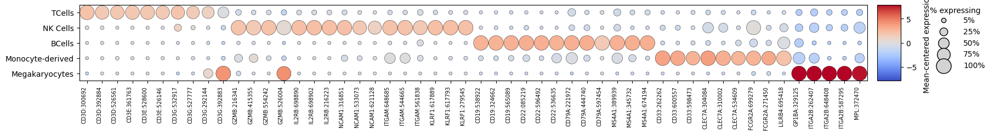

Saved to: Intermediate_Files/Paper_Figs/Markers/celltype_marker_isoform_dotplot_abbreviated.pdf


In [8]:
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
from mpl_toolkits.axes_grid1 import make_axes_locatable

# ---------------------------
# Config
# ---------------------------


marker_groups_to_include = ["TCells", "Natural Killer", "BCell", "Monocyte-derived", "Megakaryocyte"]
celltype_order = ["TCells", "NK Cells", "BCells", "Monocyte-derived", "Megakaryocytes"]

# Only include these transcripts, in this exact order
desired_transcripts = {
    "CD3D": ["ENST00000300692", "ENST00000392884", "ENST00000526561"],
    "CD3E": ["ENST00000361763", "ENST00000528600", "ENST00000526146"],
    "CD3G": ["ENST00000532917", "ENST00000527777", "ENST00000292144", "ENST00000392883"],
    "GZMB": ["ENST00000216341", "ENST00000415355", "ENST00000554242", "ENST00000526004"],
    "IL2RB": ["ENST00000698890", "ENST00000698902", "ENST00000216223"],
    "NCAM1": ["ENST00000316851", "ENST00000533073", "ENST00000621128"],
    "ITGAM": ["ENST00000648685", "ENST00000544665", "ENST00000561838"],
    "KLRF1": ["ENST00000617889", "ENST00000617793", "ENST00000279545"],
    "CD19": ["ENST00000538922", "ENST00000324662", "ENST00000565089"],
    "CD22": ["ENST00000085219", "ENST00000596492", "ENST00000536635"],
    "CD79A": ["ENST00000221972", "ENST00000444740", "ENST00000597454"],
    "MS4A1": ["ENST00000389939", "ENST00000345732", "ENST00000674194"],
    "CD33": ["ENST00000262262", "ENST00000600557", "ENST00000598473"],
    "CLEC7A": ["ENST00000304084", "ENST00000310002", "ENST00000534609"],
    "FCGR2A": ["ENST00000699279", "ENST00000271450"],
    "LILRB4": ["ENST00000695418"],
    "GP1BA": ["ENST00000329125"],
    "ITGA2B": ["ENST00000262407", "ENST00000648408", "ENST00000587295"],
    "MPL": ["ENST00000372470"],
}

# ---------------------------
# Build whitelist from adata varnames (expects "GENE:ENSG:ENST")
# ---------------------------
varnames = pd.Index(adata_i_filtered.var_names.astype(str))
whitelist_isoforms = []
missing = []

def find_iso_ids(gene, enst):
    # IDs look like "GENE:ENSG:ENST". Accept any ENSG.
    return varnames[(varnames.str.startswith(f"{gene}:")) & (varnames.str.endswith(f":{enst}"))].tolist()

for gene, ensts in desired_transcripts.items():
    for enst in ensts:
        hits = find_iso_ids(gene, enst)
        if hits:
            whitelist_isoforms.extend(hits)  # if multiple, keep stable order
        else:
            missing.append(f"{gene}:{enst}")

if not whitelist_isoforms:
    raise ValueError("None of the requested transcripts were found in adata_i_filtered.var_names.")

if missing:
    print("Warning — these requested transcripts were not found and will be skipped:")
    for m in missing:
        print("  ", m)

matched_isoforms = whitelist_isoforms

# ---------------------------
# Expression matrix (cells × isoforms)
# ---------------------------
X = adata_i_filtered[:, matched_isoforms].X
if hasattr(X, "toarray"):
    X = X.toarray()

iso_expr = pd.DataFrame(
    X,
    index=adata_i_filtered.obs["gen_cell_type"].astype(str),
    columns=matched_isoforms
)

# ---------------------------
# Per-cluster metrics on isoforms
# ---------------------------
avg_expr_iso = iso_expr.groupby(iso_expr.index, observed=True).mean()
pct_expr_iso = (iso_expr > 0).astype(int).groupby(iso_expr.index, observed=True).mean() * 100

# Keep clusters in desired order
present = [ct for ct in celltype_order if ct in avg_expr_iso.index]
avg_expr_iso = avg_expr_iso.reindex(present)
pct_expr_iso = pct_expr_iso.reindex(present)

# Fixed isoform order = whitelist order present in matrix
ordered_isoforms = [i for i in matched_isoforms if i in avg_expr_iso.columns]

# Reorder matrices
avg_expr_iso = avg_expr_iso[ordered_isoforms]
pct_expr_iso = pct_expr_iso[ordered_isoforms]

# ---------------------------
# Mean-center per isoform (white = average across clusters for that isoform)
# ---------------------------
avg_centered = avg_expr_iso - avg_expr_iso.mean(axis=0)

# Short x labels: GENE:last 6 of transcript id (if present)
def short_label(iso):
    parts = iso.split(":")
    if len(parts) == 3:
        gene, _, enst = parts
        return f"{gene}:{enst[-6:]}"
    return iso

xlabels = [short_label(i) for i in ordered_isoforms]

# ---------------------------
# Long format for plotting
# ---------------------------
avg_long = avg_centered.reset_index(names="cell_type").melt(id_vars="cell_type", var_name="iso", value_name="avg_c")
pct_long = pct_expr_iso.reset_index(names="cell_type").melt(id_vars="cell_type", var_name="iso", value_name="pct")
plot_long = avg_long.merge(pct_long, on=["cell_type", "iso"])

# Enforce display order
plot_long["cell_type"] = pd.Categorical(plot_long["cell_type"], categories=present, ordered=True)
plot_long["iso"] = pd.Categorical(plot_long["iso"], categories=ordered_isoforms, ordered=True)
plot_long = plot_long.sort_values(["cell_type", "iso"])

# ---------------------------
# Dot plot
# ---------------------------
fig, ax = plt.subplots(
    figsize=(max(12, 0.42 * len(ordered_isoforms)), max(2.6, 0.45 * len(present)))
)
size_min, size_max = 18, 380

# Robust symmetric color range around 0
vals = avg_centered.values.astype(float)
if np.all((~np.isfinite(vals)) | (vals == 0)):
    rng = 1.0
else:
    rng = float(np.nanpercentile(np.abs(vals[np.isfinite(vals)]), 99))
    if not np.isfinite(rng) or rng == 0:
        rng = 1.0

norm = TwoSlopeNorm(vcenter=0, vmin=-rng, vmax=rng)

sns.scatterplot(
    data=plot_long,
    x="iso", y="cell_type",
    hue="avg_c", size="pct",
    palette="coolwarm", hue_norm=norm,
    sizes=(size_min, size_max),
    edgecolor="black", linewidth=0.3,
    legend=False, ax=ax
)

# Layout tweaks
plot_long["cell_type"] = pd.Categorical(plot_long["cell_type"], categories=present, ordered=True)
ax.margins(y=0.12, x=0)
ax.set_xlim(-0.5, len(ordered_isoforms) - 0.5)

# Swap tick labels to the short ones (same order as categories)
ax.set_xticks(range(len(ordered_isoforms)))
ax.set_xticklabels(xlabels, rotation=90, ha="right", fontsize=7)

# ---------------------------
# Right side: colorbar + % expressing legend
# ---------------------------
divider = make_axes_locatable(ax)

# Colorbar
cax = divider.append_axes("right", size="3%", pad=0.18)
sm = plt.cm.ScalarMappable(cmap="coolwarm", norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, cax=cax)
cbar.set_label("Mean-centered expression", rotation=90, labelpad=8)

# Size legend under colorbar
lax = divider.append_axes("right", size="10%", pad=0.28)
lax.set_axis_off(); lax.set_xlim(0, 1); lax.set_ylim(0, 1)
levels = [5, 25, 50, 75, 100]  # keep consistent across plots
lax.text(0.5, 0.98, "% expressing", ha="center", va="top", fontsize=10)
ypos = np.linspace(0.80, 0.20, len(levels))
for y, lv in zip(ypos, levels):
    sz = np.interp(lv, [0, 100], [size_min, size_max])  # legend independent of data range
    lax.plot([0.35], [y], 'o', ms=np.sqrt(sz), markeredgecolor='black', markerfacecolor='lightgray')
    lax.text(0.60, y, f"{lv}%", va="center", ha="left", fontsize=10)

# Cosmetics
ax.set_xlabel(""); ax.set_ylabel("")
for lab in ax.get_xticklabels():
    lab.set_rotation(90); lab.set_ha('right')
plt.yticks(rotation=0)

# ---------------------------
# Save / show
# ---------------------------
outpath = "Intermediate_Files/Paper_Figs/Markers/celltype_marker_isoform_dotplot_abbreviated.pdf"
os.makedirs(os.path.dirname(outpath), exist_ok=True)
plt.tight_layout(rect=(0.02, 0, 0.86, 1))  # slimmer left, reserve right panel
plt.savefig(outpath, dpi=600, transparent=True, bbox_inches="tight")
plt.show()
print(f"Saved to: {outpath}")

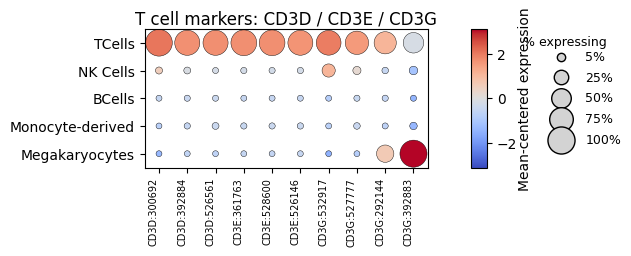

Saved to: Intermediate_Files/Paper_Figs/Markers/Tcell_selected_markers_CD3D_CD3E_CD3G.pdf


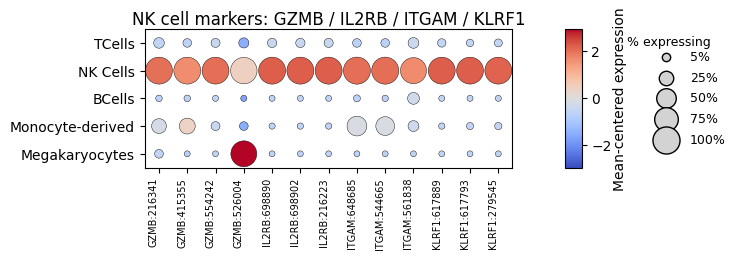

Saved to: Intermediate_Files/Paper_Figs/Markers/NKcell_selected_markers_GZMB_IL2RB_ITGAM_KLRF1.pdf


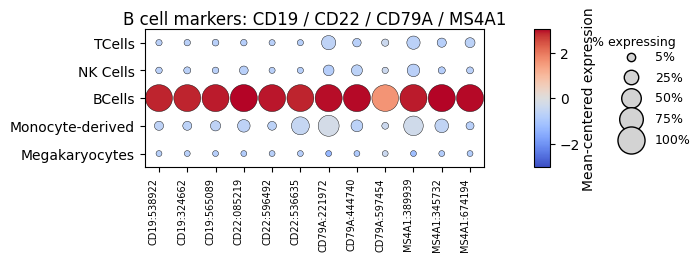

Saved to: Intermediate_Files/Paper_Figs/Markers/Bcell_selected_markers_CD19_CD22_CD79A_MS4A1.pdf


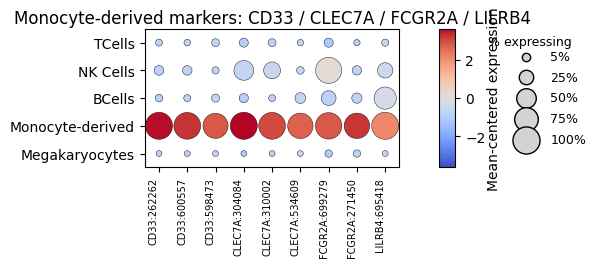

Saved to: Intermediate_Files/Paper_Figs/Markers/Monocyte_selected_markers_CD33_CLEC7A_FCGR2A_LILRB4.pdf


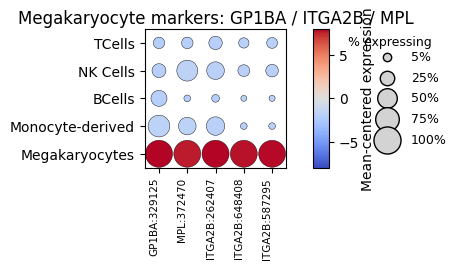

Saved to: Intermediate_Files/Paper_Figs/Markers/Megakaryocyte_selected_markers_GP1BA_ITGA2B_MPL.pdf


In [37]:
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
from mpl_toolkits.axes_grid1 import make_axes_locatable

# ---------------------------
# Config
# ---------------------------

# Cell-type order to display (must match adata_i_filtered.obs["gen_cell_type"] labels)
celltype_order = ["TCells", "NK Cells", "BCells", "Monocyte-derived", "Megakaryocytes"]

# Master list of transcripts (keep as-is; used to build each figure's whitelist)
desired_transcripts = {
    "CD3D": ["ENST00000300692", "ENST00000392884", "ENST00000526561"],
    "CD3E": ["ENST00000361763", "ENST00000528600", "ENST00000526146"],
    "CD3G": ["ENST00000532917", "ENST00000527777", "ENST00000292144", "ENST00000392883"],
    "GZMB": ["ENST00000216341", "ENST00000415355", "ENST00000554242", "ENST00000526004"],
    "IL2RB": ["ENST00000698890", "ENST00000698902", "ENST00000216223"],
    "NCAM1": ["ENST00000316851", "ENST00000533073", "ENST00000621128"],
    "ITGAM": ["ENST00000648685", "ENST00000544665", "ENST00000561838"],
    "KLRF1": ["ENST00000617889", "ENST00000617793", "ENST00000279545"],
    "CD19": ["ENST00000538922", "ENST00000324662", "ENST00000565089"],
    "CD22": ["ENST00000085219", "ENST00000596492", "ENST00000536635"],
    "CD79A": ["ENST00000221972", "ENST00000444740", "ENST00000597454"],
    "MS4A1": ["ENST00000389939", "ENST00000345732", "ENST00000674194"],
    "CD33": ["ENST00000262262", "ENST00000600557", "ENST00000598473"],
    "CLEC7A": ["ENST00000304084", "ENST00000310002", "ENST00000534609"],
    "FCGR2A": ["ENST00000699279", "ENST00000271450"],
    "LILRB4": ["ENST00000695418"],
    "GP1BA": ["ENST00000329125"],
    "MPL": ["ENST00000372470"],
    "ITGA2B": ["ENST00000262407", "ENST00000648408", "ENST00000587295"],
}

# Figure specs: (title, genes, output filename)
figure_specs = [
    ("T cell markers: CD3D / CD3E / CD3G",
     ["CD3D", "CD3E", "CD3G"],
     "Intermediate_Files/Paper_Figs/Markers/Tcell_selected_markers_CD3D_CD3E_CD3G.pdf"),

    ("NK cell markers: GZMB / IL2RB / ITGAM / KLRF1",
     ["GZMB", "IL2RB", "ITGAM", "KLRF1"],
     "Intermediate_Files/Paper_Figs/Markers/NKcell_selected_markers_GZMB_IL2RB_ITGAM_KLRF1.pdf"),

    ("B cell markers: CD19 / CD22 / CD79A / MS4A1",
     ["CD19", "CD22", "CD79A", "MS4A1"],
     "Intermediate_Files/Paper_Figs/Markers/Bcell_selected_markers_CD19_CD22_CD79A_MS4A1.pdf"),

    ("Monocyte-derived markers: CD33 / CLEC7A / FCGR2A / LILRB4",
     ["CD33", "CLEC7A", "FCGR2A", "LILRB4"],
     "Intermediate_Files/Paper_Figs/Markers/Monocyte_selected_markers_CD33_CLEC7A_FCGR2A_LILRB4.pdf"),

    ("Megakaryocyte markers: GP1BA / ITGA2B / MPL",
     ["GP1BA",  "MPL", "ITGA2B",],
     "Intermediate_Files/Paper_Figs/Markers/Megakaryocyte_selected_markers_GP1BA_ITGA2B_MPL.pdf"),
]

# ---------------------------
# Utilities
# ---------------------------

varnames = pd.Index(adata_i_filtered.var_names.astype(str))

def find_iso_ids(gene, enst):
    # varnames look like "GENE:ENSG:ENST" — match any ENSG for the gene & the exact ENST tail
    return varnames[(varnames.str.startswith(f"{gene}:")) & (varnames.str.endswith(f":{enst}"))].tolist()

def short_label(iso):
    parts = iso.split(":")
    if len(parts) == 3:
        gene, _, enst = parts
        return f"{gene}:{enst[-6:]}"
    return iso

def make_dotplot_for_genes(genes, title, outpath):
    # ---------------------------
    # Build whitelist just for these genes (respect exact ENST order)
    # ---------------------------
    whitelist_isoforms = []
    missing = []
    for gene in genes:
        if gene not in desired_transcripts:
            print(f"Warning — gene {gene} not listed in desired_transcripts; skipping.")
            continue
        for enst in desired_transcripts[gene]:
            hits = find_iso_ids(gene, enst)
            if hits:
                whitelist_isoforms.extend(hits)  # preserve order even if multiple hits
            else:
                missing.append(f"{gene}:{enst}")

    if not whitelist_isoforms:
        raise ValueError(f"No requested transcripts found in var_names for genes: {genes}")

    if missing:
        print(f"[{title}] Skipping {len(missing)} missing transcript(s):")
        for m in missing:
            print("  ", m)

    ordered_isoforms = whitelist_isoforms

    # ---------------------------
    # Expression matrix (cells × isoforms)
    # ---------------------------
    X = adata_i_filtered[:, ordered_isoforms].X
    if hasattr(X, "toarray"):
        X = X.toarray()

    iso_expr = pd.DataFrame(
        X,
        index=adata_i_filtered.obs["gen_cell_type"].astype(str),
        columns=ordered_isoforms
    )

    # ---------------------------
    # Per-cluster metrics
    # ---------------------------
    avg_expr_iso = iso_expr.groupby(iso_expr.index, observed=True).mean()
    pct_expr_iso = (iso_expr > 0).astype(int).groupby(iso_expr.index, observed=True).mean() * 100.0

    # Keep clusters in desired order if present
    present = [ct for ct in celltype_order if ct in avg_expr_iso.index]
    if not present:
        raise ValueError("None of the requested cell types were found in gen_cell_type.")

    avg_expr_iso = avg_expr_iso.reindex(present)
    pct_expr_iso = pct_expr_iso.reindex(present)

    # Reorder isoforms to our whitelist order
    avg_expr_iso = avg_expr_iso[ordered_isoforms]
    pct_expr_iso = pct_expr_iso[ordered_isoforms]

    # ---------------------------
    # Mean-center per isoform
    # ---------------------------
    avg_centered = avg_expr_iso - avg_expr_iso.mean(axis=0)
    xlabels = [short_label(i) for i in ordered_isoforms]

    # ---------------------------
    # Long format for plotting
    # ---------------------------
    avg_long = avg_centered.reset_index(names="cell_type").melt(id_vars="cell_type", var_name="iso", value_name="avg_c")
    pct_long = pct_expr_iso.reset_index(names="cell_type").melt(id_vars="cell_type", var_name="iso", value_name="pct")
    plot_long = avg_long.merge(pct_long, on=["cell_type", "iso"])
    plot_long["cell_type"] = pd.Categorical(plot_long["cell_type"], categories=present, ordered=True)
    plot_long["iso"] = pd.Categorical(plot_long["iso"], categories=ordered_isoforms, ordered=True)
    plot_long = plot_long.sort_values(["cell_type", "iso"])

    # ---------------------------
    # Dot plot
    # ---------------------------
    per_iso_width = 0.45   # inches per isoform
    per_ct_height = 0.30   # inches per cell type
    cbar_w_in = 0.26       # fixed inches for colorbar column
    size_w_in = 1.10       # fixed inches for size-legend column

    n_iso = len(ordered_isoforms)
    n_ct  = len(present)

    main_w_in = max(0.01, per_iso_width * n_iso)
    fig_w = main_w_in + cbar_w_in + size_w_in
    fig_h = max(1.8, per_ct_height * n_ct)

    fig = plt.figure(figsize=(fig_w, fig_h))

    # GridSpec widths proportional to physical inches
    gs = fig.add_gridspec(
        nrows=1, ncols=3,
        width_ratios=[main_w_in, cbar_w_in, size_w_in],
        wspace=0.35
    )
    ax  = fig.add_subplot(gs[0, 0])  # main
    cax = fig.add_subplot(gs[0, 1])  # colorbar
    lax = fig.add_subplot(gs[0, 2])  # size legend

    size_min, size_max = 18, 380
    vals = avg_centered.values.astype(float)
    if np.any(np.isfinite(vals)):
        rng = float(np.nanpercentile(np.abs(vals[np.isfinite(vals)]), 99))
        if not np.isfinite(rng) or rng == 0: rng = 1.0
    else:
        rng = 1.0
    norm = TwoSlopeNorm(vcenter=0, vmin=-rng, vmax=rng)

    sns.scatterplot(
        data=plot_long,
        x="iso", y="cell_type",
        hue="avg_c", size="pct",
        palette="coolwarm", hue_norm=norm,
        sizes=(size_min, size_max),
        edgecolor="black", linewidth=0.3,
        legend=False, ax=ax
    )

    # Title / ticks / order (put first category on TOP)
    ax.set_title(title, fontsize=12, pad=4)
    ax.set_xlim(-0.5, n_iso - 0.5)
    ax.set_xticks(range(n_iso))
    xt_fs = 8.5 if n_iso <= 4 else (7.5 if n_iso <= 8 else 7.0)
    ax.set_xticklabels([short_label(i) for i in ordered_isoforms],
                       rotation=90, ha="right", fontsize=xt_fs)
    ax.set_xlabel(""); ax.set_ylabel("")
    ax.set_ylim(-0.5, n_ct - 0.5)
    ax.invert_yaxis()      # <<< ensures TCells appears at the TOP as in your earlier plots
    ax.margins(x=0.02, y=0.04)

    # --- Colorbar in its own axis ---
    sm = plt.cm.ScalarMappable(cmap="coolwarm", norm=norm)
    sm.set_array([])
    cb = fig.colorbar(sm, cax=cax)
    cb.set_label("Mean-centered expression", rotation=90, labelpad=1)

    # --- % expressing legend in its own axis ---
    lax.set_axis_off(); lax.set_xlim(0, 1); lax.set_ylim(0, 1)
    levels = [5, 25, 50, 75, 100]
    lax.text(0.5, 0.95, "% expressing", ha="center", va="top", fontsize=9)
    ypos = np.linspace(0.80, 0.20, len(levels))
    for y, lv in zip(ypos, levels):
        sz = np.interp(lv, [0, 100], [size_min, size_max])
        lax.plot([0.45], [y], 'o', ms=np.sqrt(sz),
                 markeredgecolor='black', markerfacecolor='lightgray')
        lax.text(0.8, y, f"{lv}%", va="center", ha="left", fontsize=9)

    # Save / show (no tight bbox—GridSpec keeps everything inside)
    os.makedirs(os.path.dirname(outpath), exist_ok=True)
    fig.savefig(outpath, dpi=600, transparent=True)
    plt.show()
    print(f"Saved to: {outpath}")

# ---------------------------
# Run all five figures
# ---------------------------
for title, genes, outpath in figure_specs:
    make_dotplot_for_genes(genes, title, outpath)

Warning — these requested transcripts were not found and will be skipped:
   CD4:ENST00000544344


/tmp/ipykernel_1413971/3957175884.py:157: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=9)


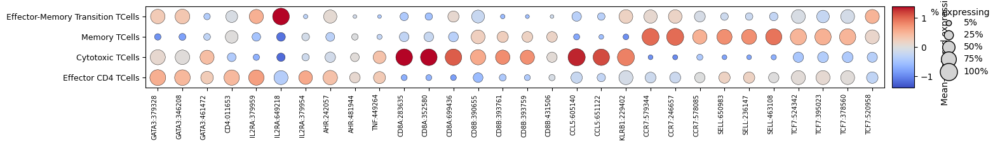

Saved to: Intermediate_Files/Paper_Figs/Markers/subcelltype_TCells_marker_isoform_dotplot_abbreviated.pdf


In [66]:
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
from mpl_toolkits.axes_grid1 import make_axes_locatable

# ---------------------------
# Config (T cell subtypes)
# ---------------------------
celltype_order = [
    "Effector CD4 TCells",
    "Cytotoxic TCells",
    "Memory TCells",
    "Effector-Memory Transition TCells",
]

# Exact gene display order you requested
gene_display_order = ["GATA3","CD4","IL2RA","AHR","TNF","CD8A","CD8B","CCL5","KLRB1","CCR7","SELL","TCF7"]

# Include ALL transcripts in your figure (full ENST IDs that match the shown tails)
desired_transcripts = {
    "GATA3": ["ENST00000379328", "ENST00000346208", "ENST00000461472"],
    "IL2RA": ["ENST00000379959", "ENST00000649218", "ENST00000379954"],
    "CD4":   ["ENST00000011653", "ENST00000544344"],
    "AHR":   ["ENST00000242057", "ENST00000481944"],
    "TNF":   ["ENST00000449264"],
    "CD8A":  ["ENST00000283635", "ENST00000352580", "ENST00000699436"],
    "CD8B":  ["ENST00000390655", "ENST00000393761", "ENST00000393759", "ENST00000431506"],
    "CCL5":  ["ENST00000605140", "ENST00000651122"],
    "KLRB1": ["ENST00000229402"],
    "CCR7":  ["ENST00000579344", "ENST00000246657", "ENST00000578085"],
    "SELL":  ["ENST00000650983", "ENST00000236147", "ENST00000463108"],
    "TCF7":  ["ENST00000524342", "ENST00000395023", "ENST00000378560", "ENST00000520958"],
}

# ---------------------------
# Build whitelist from adata varnames (expects "GENE:ENSG:ENST")
# ---------------------------
varnames = pd.Index(adata_i_filtered.var_names.astype(str))
whitelist_isoforms, missing = [], []

def find_iso_ids(gene, enst):
    # IDs look like "GENE:ENSG:ENST". Accept any ENSG.
    return varnames[(varnames.str.startswith(f"{gene}:")) & (varnames.str.endswith(f":{enst}"))].tolist()

# Enforce your GENE order first, then transcript order within each gene
for gene in gene_display_order:
    for enst in desired_transcripts.get(gene, []):
        hits = find_iso_ids(gene, enst)
        if hits:
            whitelist_isoforms.extend(hits)   # preserve requested order
        else:
            missing.append(f"{gene}:{enst}")

if not whitelist_isoforms:
    raise ValueError("None of the requested transcripts were found in adata_i_filtered.var_names.")

if missing:
    print("Warning — these requested transcripts were not found and will be skipped:")
    for m in missing:
        print("  ", m)

matched_isoforms = whitelist_isoforms

# ---------------------------
# Expression matrix (cells × isoforms); INDEX by sub_cell_type
# ---------------------------
ct_series = adata_i_filtered.obs["sub_cell_type"].astype(str).copy()
X = adata_i_filtered[:, matched_isoforms].X
if hasattr(X, "toarray"):
    X = X.toarray()

iso_expr = pd.DataFrame(X, index=ct_series.values, columns=matched_isoforms)

# ---------------------------
# Per-subcluster metrics on isoforms
# ---------------------------
avg_expr_iso = iso_expr.groupby(iso_expr.index, observed=True).mean()
pct_expr_iso = (iso_expr > 0).astype(int).groupby(iso_expr.index, observed=True).mean() * 100

present = [ct for ct in celltype_order if ct in avg_expr_iso.index]
if not present:
    raise ValueError("None of the expected T-cell subclusters are present in sub_cell_type.")

avg_expr_iso = avg_expr_iso.reindex(present)
pct_expr_iso = pct_expr_iso.reindex(present)

# Fixed isoform order = whitelist order present in matrix (already in your gene order)
ordered_isoforms = [i for i in matched_isoforms if i in avg_expr_iso.columns]
avg_expr_iso = avg_expr_iso[ordered_isoforms]
pct_expr_iso = pct_expr_iso[ordered_isoforms]

# ---------------------------
# Mean-center per isoform (white = average across subclusters)
# ---------------------------
avg_centered = avg_expr_iso - avg_expr_iso.mean(axis=0)

# Short x labels: GENE:last 6 of ENST
def short_label(iso):
    parts = iso.split(":")
    if len(parts) == 3:
        gene, _, enst = parts
        tail = enst[-6:] if len(enst) >= 6 else enst
        return f"{gene}:{tail}"
    return iso

xlabels = [short_label(i) for i in ordered_isoforms]

# ---------------------------
# Long format for plotting
# ---------------------------
avg_long = avg_centered.reset_index(names="cell_type").melt(id_vars="cell_type", var_name="iso", value_name="avg_c")
pct_long = pct_expr_iso.reset_index(names="cell_type").melt(id_vars="cell_type", var_name="iso", value_name="pct")
plot_long = avg_long.merge(pct_long, on=["cell_type", "iso"])
plot_long["cell_type"] = pd.Categorical(plot_long["cell_type"], categories=present, ordered=True)
plot_long["iso"] = pd.Categorical(plot_long["iso"], categories=ordered_isoforms, ordered=True)
plot_long = plot_long.sort_values(["cell_type", "iso"])

# --- Dot plot (tighter rows, wider columns) ---
# More horizontal space per isoform: bump width multiplier from 0.42 -> 0.60
# Less vertical space between cell types: drop per-row height 0.45 -> 0.32 and shrink y-margins

fig, ax = plt.subplots(
    figsize=(max(12, 0.60 * len(ordered_isoforms)), max(2.4, 0.32 * len(present)))
)

size_min, size_max = 18, 380

vals = avg_centered.values.astype(float)
if np.all((~np.isfinite(vals)) | (vals == 0)):
    rng = 1.0
else:
    rng = float(np.nanpercentile(np.abs(vals[np.isfinite(vals)]), 99))
    if not np.isfinite(rng) or rng == 0:
        rng = 1.0
norm = TwoSlopeNorm(vcenter=0, vmin=-rng, vmax=rng)

sns.scatterplot(
    data=plot_long,
    x="iso", y="cell_type",
    hue="avg_c", size="pct",
    palette="coolwarm", hue_norm=norm,
    sizes=(size_min, size_max),
    edgecolor="black", linewidth=0.3,
    legend=False, ax=ax
)

# Tighter vertical packing + more room horizontally
ax.margins(y=0.03, x=0.02)                     # was y=0.12
ax.set_xlim(-0.5, len(ordered_isoforms) - 0.5)
ax.set_ylim(-0.5, len(present) - 0.5)

ax.set_xticks(range(len(ordered_isoforms)))
ax.set_xticklabels(xlabels, rotation=90, ha="right", fontsize=7)
ax.set_yticklabels(ax.get_yticklabels(), fontsize=9)

# ---------------------------
# Right side: colorbar + % expressing legend (slightly tighter pads)
# ---------------------------
divider = make_axes_locatable(ax)

cax = divider.append_axes("right", size="3%", pad=0.12)   # was 0.18
sm = plt.cm.ScalarMappable(cmap="coolwarm", norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, cax=cax)
cbar.set_label("Mean-centered expression", rotation=90, labelpad=8)

lax = divider.append_axes("right", size="9%", pad=0.20)   # was size 10%, pad 0.28
lax.set_axis_off(); lax.set_xlim(0, 1); lax.set_ylim(0, 1)
levels = [5, 25, 50, 75, 100]
lax.text(0.5, 0.98, "% expressing", ha="center", va="top", fontsize=10)
ypos = np.linspace(0.80, 0.20, len(levels))
for y, lv in zip(ypos, levels):
    sz = np.interp(lv, [0, 100], [size_min, size_max])
    lax.plot([0.32], [y], 'o', ms=np.sqrt(sz), markeredgecolor='black', markerfacecolor='lightgray')
    lax.text(0.55, y, f"{lv}%", va="center", ha="left", fontsize=10)

ax.set_xlabel(""); ax.set_ylabel("")
plt.yticks(rotation=0)

# ---------------------------
# Save / show
# ---------------------------
outpath = "Intermediate_Files/Paper_Figs/Markers/subcelltype_TCells_marker_isoform_dotplot_abbreviated.pdf"
os.makedirs(os.path.dirname(outpath), exist_ok=True)

# Give right-side guides room, but keep plot compact vertically
plt.tight_layout(rect=(0.02, 0.0, 0.90, 1.0))  # slightly more room on the right
plt.savefig(outpath, dpi=600, transparent=True, bbox_inches="tight")
plt.show()
print(f"Saved to: {outpath}")

/tmp/ipykernel_1413971/3583761723.py:137: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(present, fontsize=9)


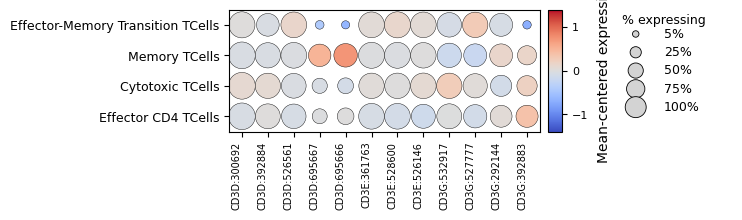

Saved to: Intermediate_Files/Paper_Figs/Markers/subcelltype_TCells_marker_CD3_isoform_dotplot_abbreviated.pdf


In [67]:
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
from mpl_toolkits.axes_grid1 import make_axes_locatable

# ---------------------------
# Config (T cell subtypes)
# ---------------------------
celltype_order = [
    "Effector CD4 TCells",
    "Cytotoxic TCells",
    "Memory TCells",
    "Effector-Memory Transition TCells",
]

# Exact gene display order you requested
gene_display_order = ["CD3D","CD3E","CD3G"]

# Include ALL transcripts in your figure (full ENST IDs that match the shown tails)
desired_transcripts = {
    "CD3D": ["ENST00000300692", "ENST00000392884", "ENST00000526561", "ENST00000695667", "ENST00000695666"],
    "CD3E": ["ENST00000361763", "ENST00000528600", "ENST00000526146"],
    "CD3G": ["ENST00000532917", "ENST00000527777", "ENST00000292144", "ENST00000392883"],
}

# ---------------------------
# Build whitelist from adata varnames (expects "GENE:ENSG:ENST")
# ---------------------------
varnames = pd.Index(adata_i_filtered.var_names.astype(str))
whitelist_isoforms, missing = [], []

def find_iso_ids(gene, enst):
    # IDs look like "GENE:ENSG:ENST". Accept any ENSG.
    return varnames[(varnames.str.startswith(f"{gene}:")) & (varnames.str.endswith(f":{enst}"))].tolist()

# Enforce your GENE order first, then transcript order within each gene
for gene in gene_display_order:
    for enst in desired_transcripts.get(gene, []):
        hits = find_iso_ids(gene, enst)
        if hits:
            whitelist_isoforms.extend(hits)   # preserve requested order
        else:
            missing.append(f"{gene}:{enst}")

if not whitelist_isoforms:
    raise ValueError("None of the requested transcripts were found in adata_i_filtered.var_names.")

if missing:
    print("Warning — these requested transcripts were not found and will be skipped:")
    for m in missing:
        print("  ", m)

matched_isoforms = whitelist_isoforms

# ---------------------------
# Expression matrix (cells × isoforms); INDEX by sub_cell_type
# ---------------------------
ct_series = adata_i_filtered.obs["sub_cell_type"].astype(str).copy()
X = adata_i_filtered[:, matched_isoforms].X
if hasattr(X, "toarray"):
    X = X.toarray()

iso_expr = pd.DataFrame(X, index=ct_series.values, columns=matched_isoforms)

# ---------------------------
# Per-subcluster metrics on isoforms
# ---------------------------
avg_expr_iso = iso_expr.groupby(iso_expr.index, observed=True).mean()
pct_expr_iso = (iso_expr > 0).astype(int).groupby(iso_expr.index, observed=True).mean() * 100

present = [ct for ct in celltype_order if ct in avg_expr_iso.index]
if not present:
    raise ValueError("None of the expected T-cell subclusters are present in sub_cell_type.")

avg_expr_iso = avg_expr_iso.reindex(present)
pct_expr_iso = pct_expr_iso.reindex(present)

# Fixed isoform order = whitelist order present in matrix (already in your gene order)
ordered_isoforms = [i for i in matched_isoforms if i in avg_expr_iso.columns]
avg_expr_iso = avg_expr_iso[ordered_isoforms]
pct_expr_iso = pct_expr_iso[ordered_isoforms]

# ---------------------------
# Mean-center per isoform (white = average across subclusters)
# ---------------------------
avg_centered = avg_expr_iso - avg_expr_iso.mean(axis=0)

# Short x labels: GENE:last 6 of ENST
def short_label(iso):
    parts = iso.split(":")
    if len(parts) == 3:
        gene, _, enst = parts
        tail = enst[-6:] if len(enst) >= 6 else enst
        return f"{gene}:{tail}"
    return iso

xlabels = [short_label(i) for i in ordered_isoforms]

# ---------------------------
# Long format for plotting
# ---------------------------
avg_long = avg_centered.reset_index(names="cell_type").melt(id_vars="cell_type", var_name="iso", value_name="avg_c")
pct_long = pct_expr_iso.reset_index(names="cell_type").melt(id_vars="cell_type", var_name="iso", value_name="pct")
plot_long = avg_long.merge(pct_long, on=["cell_type", "iso"])
plot_long["cell_type"] = pd.Categorical(plot_long["cell_type"], categories=present, ordered=True)
plot_long["iso"] = pd.Categorical(plot_long["iso"], categories=ordered_isoforms, ordered=True)
plot_long = plot_long.sort_values(["cell_type", "iso"])

# --- Dot plot (spacing matched to reference) ---
fig, ax = plt.subplots(
    figsize=(max(8, 0.28 * len(ordered_isoforms)),   # same width multiplier
             max(2.4, 0.32 * len(present)))          # same height multiplier
)

size_min, size_max = 18, 380

sns.scatterplot(
    data=plot_long,
    x="iso", y="cell_type",
    hue="avg_c", size="pct",
    palette="coolwarm", hue_norm=norm,
    sizes=(size_min, size_max),
    size_norm=(0, 100),               # 0–100% size mapping (so legend matches)
    edgecolor="black", linewidth=0.3,
    legend=False, ax=ax
)

# Lock axes and remove extra horizontal padding (match reference)
ax.set_xlim(-0.5, len(ordered_isoforms) - 0.5)
ax.set_ylim(-0.5, len(present) - 0.5)
ax.margins(y=0.03, x=0.00)            # <- zero x-margins
ax.set_xticks(range(len(ordered_isoforms)))
ax.set_xticklabels(xlabels, rotation=90, ha="right", fontsize=7)
ax.set_yticklabels(present, fontsize=9)
ax.set_xlabel(""); ax.set_ylabel("")

# ---------- Right side (spacing matched to reference) ----------
right_pad = 0.24                                        # same reserved width
plt.tight_layout(rect=(0.06, 0.02, 1.0 - right_pad, 0.98))  # do once, before adding axes
fig.canvas.draw_idle()
pos = ax.get_position()

gap_plot_to_cbar   = 0.010
gap_cbar_to_legend = 0.035
cbar_w   = 0.018
legend_w = right_pad - cbar_w - gap_plot_to_cbar - gap_cbar_to_legend

# Colorbar
cax = fig.add_axes([pos.x1 + gap_plot_to_cbar, pos.y0, cbar_w, pos.height])
sm = plt.cm.ScalarMappable(cmap="coolwarm", norm=norm)  # use the SAME 'norm' as in scatter
sm.set_array([])
cbar = fig.colorbar(sm, cax=cax, orientation="vertical")
cbar.ax.tick_params(labelsize=8)
cbar.set_label("Mean-centered expression", rotation=90, labelpad=6)

# % expressing legend (sizes match size_norm 0–100)
lax = fig.add_axes([pos.x1 + gap_plot_to_cbar + cbar_w + gap_cbar_to_legend,
                    pos.y0, legend_w, pos.height])
lax.set_axis_off(); lax.set_xlim(0, 1); lax.set_ylim(0, 1)
levels = [5, 25, 50, 75, 100]
s_vals = np.interp(levels, [0, 100], [size_min, size_max]) * 0.60  # same visual scale as ref
lax.text(0.52, 0.965, "% expressing", ha="center", va="top", fontsize=9)
ypos = np.linspace(0.80, 0.20, len(levels))
lax.scatter([0.32]*len(levels), ypos, s=s_vals, facecolor="lightgray",
            edgecolor="black", linewidth=0.6, zorder=2)
for y, lv in zip(ypos, levels):
    lax.text(0.52, y, f"{lv}%", va="center", ha="left", fontsize=9)

# Save (no more tight_layout here)
outpath = "Intermediate_Files/Paper_Figs/Markers/subcelltype_TCells_marker_CD3_isoform_dotplot_abbreviated.pdf"
os.makedirs(os.path.dirname(outpath), exist_ok=True)
fig.savefig(outpath, dpi=600, transparent=True, bbox_inches="tight")
plt.show()
print(f"Saved to: {outpath}")

Warning — these requested transcripts were not found and will be skipped:
   CTLA4:ENST00000295854


/tmp/ipykernel_1413971/4281901717.py:139: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(present, fontsize=9)


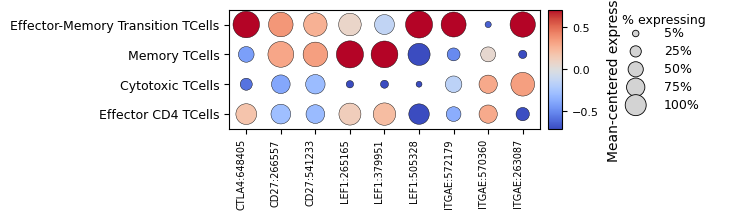

In [50]:
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
from mpl_toolkits.axes_grid1 import make_axes_locatable

# ---------------------------
# Config (T cell subtypes)
# ---------------------------
celltype_order = [
    "Effector CD4 TCells",
    "Cytotoxic TCells",
    "Memory TCells",
    "Effector-Memory Transition TCells",
]

# Exact gene display order you requested (append new genes at the end)
gene_display_order = [
                      "CTLA4","CD27","LEF1","ITGAE"]

desired_transcripts = {
    # The next four will be filled dynamically from your matrix:
    "CTLA4": ["ENST00000648405", "ENST00000295854"],
    "CD27":  ["ENST00000266557", "ENST00000541233"],
    "LEF1":  ["ENST00000265165", "ENST00000379951", "ENST00000505328"],
    "ITGAE": ["ENST00000572179", "ENST00000570360", "ENST00000263087"],
}


# ---------------------------
# Build whitelist from adata varnames (expects "GENE:ENSG:ENST")
# ---------------------------
varnames = pd.Index(adata_i_filtered.var_names.astype(str))
whitelist_isoforms, missing = [], []

def find_iso_ids(gene, enst):
    # IDs look like "GENE:ENSG:ENST". Accept any ENSG.
    return varnames[(varnames.str.startswith(f"{gene}:")) & (varnames.str.endswith(f":{enst}"))].tolist()

# Enforce your GENE order first, then transcript order within each gene
for gene in gene_display_order:
    for enst in desired_transcripts.get(gene, []):
        hits = find_iso_ids(gene, enst)
        if hits:
            whitelist_isoforms.extend(hits)   # preserve requested order
        else:
            missing.append(f"{gene}:{enst}")

if not whitelist_isoforms:
    raise ValueError("None of the requested transcripts were found in adata_i_filtered.var_names.")

if missing:
    print("Warning — these requested transcripts were not found and will be skipped:")
    for m in missing:
        print("  ", m)

matched_isoforms = whitelist_isoforms

# ---------------------------
# Expression matrix (cells × isoforms); enforce Y order now
# ---------------------------
# Make sure sub_cell_type follows the specified order (and drop others)
present = [ct for ct in celltype_order if ct in adata_i_filtered.obs["sub_cell_type"].unique().tolist()]
if not present:
    raise ValueError("None of the expected T-cell subclusters are present in sub_cell_type.")

ct_series = adata_i_filtered.obs["sub_cell_type"].astype(str)
ct_series = pd.Categorical(ct_series, categories=present, ordered=True)

X = adata_i_filtered[:, matched_isoforms].X
if hasattr(X, "toarray"):
    X = X.toarray()
iso_expr = pd.DataFrame(X, index=ct_series, columns=matched_isoforms)

# ---------------------------
# Per-subcluster metrics on isoforms
# ---------------------------
avg_expr_iso = iso_expr.groupby(iso_expr.index, observed=True).mean()
pct_expr_iso = (iso_expr > 0).astype(int).groupby(iso_expr.index, observed=True).mean() * 100

# Fixed isoform order = whitelist order present in matrix (already GENE→ENST order)
ordered_isoforms = [i for i in matched_isoforms if i in avg_expr_iso.columns]
avg_expr_iso = avg_expr_iso.loc[present, ordered_isoforms]
pct_expr_iso = pct_expr_iso.loc[present, ordered_isoforms]

# ---------------------------
# Mean-center per isoform (white = average across subclusters)
# ---------------------------
avg_centered = avg_expr_iso - avg_expr_iso.mean(axis=0)

# Short x labels: GENE:last 6 of ENST
def short_label(iso):
    parts = iso.split(":")
    if len(parts) == 3:
        gene, _, enst = parts
        tail = enst[-6:] if len(enst) >= 6 else enst
        return f"{gene}:{tail}"
    return iso

xlabels = [short_label(i) for i in ordered_isoforms]

# ---------------------------
# Long format for plotting (lock X and Y categorical orders)
# ---------------------------
avg_long = avg_centered.reset_index(names="cell_type").melt(id_vars="cell_type", var_name="iso", value_name="avg_c")
pct_long = pct_expr_iso.reset_index(names="cell_type").melt(id_vars="cell_type", var_name="iso", value_name="pct")
plot_long = avg_long.merge(pct_long, on=["cell_type", "iso"])

plot_long["cell_type"] = pd.Categorical(plot_long["cell_type"], categories=present, ordered=True)
plot_long["iso"] = pd.Categorical(plot_long["iso"], categories=ordered_isoforms, ordered=True)
plot_long = plot_long.sort_values(["cell_type", "iso"], kind="stable")

# --- Dot plot (compact horizontal, same vertical) ---
fig, ax = plt.subplots(
    figsize=(max(8, 0.28 * len(ordered_isoforms)), max(2.4, 0.32 * len(present)))
)

size_min, size_max = 18, 380

sns.scatterplot(
    data=plot_long,
    x="iso", y="cell_type",
    hue="avg_c", size="pct",
    palette="coolwarm", hue_norm=norm,
    sizes=(size_min, size_max),
    edgecolor="black", linewidth=0.3,
    legend=False, ax=ax
)

# Lock axes and remove horizontal padding
ax.set_xlim(-0.5, len(ordered_isoforms) - 0.5)
ax.set_ylim(-0.5, len(present) - 0.5)
ax.margins(y=0.03, x=0.00)

ax.set_xticks(range(len(ordered_isoforms)))
ax.set_xticklabels(xlabels, rotation=90, ha="right", fontsize=7)
ax.set_yticklabels(present, fontsize=9)

# --- Clear auto labels from seaborn ---
ax.set_xlabel("")
ax.set_ylabel("")

# --- Side panels placed explicitly in figure coords (no overlap) ---

# 1) Reserve space on the right for *both* panels
right_pad = 0.24                       # a touch wider to prevent collisions
plt.tight_layout(rect=(0.06, 0.02, 1.0 - right_pad, 0.98))  # do this ONCE

# 2) Get the axis position after tight_layout
fig.canvas.draw_idle()
pos = ax.get_position()

# 3) Sizes / gaps (figure coordinates)
gap_plot_to_cbar = 0.010
gap_cbar_to_legend = 0.035             # bigger gap so the label never kisses the legend
cbar_w = 0.018
legend_w = right_pad - cbar_w - gap_plot_to_cbar - gap_cbar_to_legend

# 4) Colorbar axis (same vertical span as the main plot)
cax = fig.add_axes([pos.x1 + gap_plot_to_cbar, pos.y0, cbar_w, pos.height])

# 5) % expressing legend axis to the RIGHT of the colorbar
lax = fig.add_axes([pos.x1 + gap_plot_to_cbar + cbar_w + gap_cbar_to_legend,
                    pos.y0, legend_w, pos.height])
lax.set_axis_off()
lax.set_xlim(0, 1); lax.set_ylim(0, 1)

# --- Colorbar ---
sm = plt.cm.ScalarMappable(cmap="coolwarm", norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, cax=cax, orientation="vertical")
cbar.ax.tick_params(labelsize=8)
# keep the label compact so it doesn't intrude into the legend column
cbar.set_label("Mean-centered expression", rotation=90, labelpad=6)

# --- % expressing legend (use area units to match main dots) ---
levels = [5, 25, 50, 75, 100]
legend_scale = 0.60                    # slightly smaller for a narrow column
s_vals = np.interp(levels, [0, 100], [size_min, size_max]) * legend_scale

lax.text(0.52, 0.965, "% expressing", ha="center", va="top", fontsize=9)
ypos = np.linspace(0.80, 0.20, len(levels))
lax.scatter([0.32]*len(levels), ypos, s=s_vals, facecolor="lightgray",
            edgecolor="black", linewidth=0.6, zorder=2)
for y, lv in zip(ypos, levels):
    lax.text(0.52, y, f"{lv}%", va="center", ha="left", fontsize=9)

# IMPORTANT: do NOT call tight_layout again here; it would reclaim the right margin.
# Just save:
outpath = "Intermediate_Files/Paper_Figs/Markers/subcelltype_transitionOnly_TCells_marker_isoform_dotplot_abbreviated.pdf"
os.makedirs(os.path.dirname(outpath), exist_ok=True)
fig.savefig(outpath, dpi=600, transparent=True, bbox_inches="tight")

/tmp/ipykernel_1307033/1638807905.py:113: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(xlabels, rotation=90, ha="right", fontsize=7)


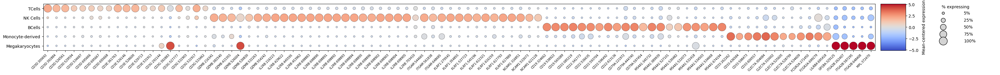

In [57]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
from mpl_toolkits.axes_grid1 import make_axes_locatable

# --- Config ---
marker_groups_to_include = ["TCells", "Natural Killer", "BCell", "Monocyte-derived", "Megakaryocyte"]
celltype_order = ["TCells", "NK Cells", "BCells", "Monocyte-derived", "Megakaryocytes"]

# --- Build isoform → group mapping & collect isoforms present ---
gene_to_group = {}
matched_isoforms = []
for group, genes in marker_genes.items():
    if group not in marker_groups_to_include:
        continue
    matches = find_matching_genes(genes, adata_i_filtered.var_names)  # isoform IDs like "GENE:ENSG:ENST"
    matched_isoforms.extend(matches)
    for iso in matches:
        gene_to_group[iso] = group

if not matched_isoforms:
    raise ValueError("No marker isoforms found for the requested groups.")

# --- Expression matrix (cells × isoforms) ---
X = adata_i_filtered[:, matched_isoforms].X
if hasattr(X, "toarray"):
    X = X.toarray()
iso_expr = pd.DataFrame(
    X,
    index=adata_i_filtered.obs["gen_cell_type"].astype(str),
    columns=matched_isoforms
)

# --- Per-cluster metrics on isoforms ---
# mean expression per cluster
avg_expr_iso = iso_expr.groupby(iso_expr.index, observed=True).mean()
# % expressing (>0) per cluster
pct_expr_iso = (iso_expr > 0).astype(int).groupby(iso_expr.index, observed=True).mean() * 100

# --- keep clusters in desired order ---
present = [ct for ct in celltype_order if ct in avg_expr_iso.index]
avg_expr_iso = avg_expr_iso.reindex(present)
pct_expr_iso = pct_expr_iso.reindex(present)

# --- Sort isoforms by (group_rank, gene, isoform) ---
isoform_to_gene = {iso: iso.split(":")[0] for iso in avg_expr_iso.columns}
meta = pd.DataFrame({
    "isoform": avg_expr_iso.columns,
    "gene": [isoform_to_gene[i] for i in avg_expr_iso.columns],
    "group": [gene_to_group.get(i, "") for i in avg_expr_iso.columns],
})
meta["group_rank"] = meta["group"].apply(lambda g: marker_groups_to_include.index(g) if g in marker_groups_to_include else 999)
meta = meta.sort_values(["group_rank", "gene", "isoform"])
ordered_isoforms = meta["isoform"].tolist()

# reorder matrices
avg_expr_iso = avg_expr_iso[ordered_isoforms]
pct_expr_iso = pct_expr_iso[ordered_isoforms]

# --- Mean-center per isoform (white = average across clusters for that isoform) ---
avg_centered = avg_expr_iso - avg_expr_iso.mean(axis=0)

# short x labels: GENE:last 6 of transcript id (if present)
def short_label(iso):
    parts = iso.split(":")
    if len(parts) == 3:
        gene, _, enst = parts
        return f"{gene}:{enst[-6:]}"
    return iso
xlabels = [short_label(i) for i in ordered_isoforms]

# --- Long format for plotting ---
avg_long = avg_centered.reset_index(names="cell_type").melt(id_vars="cell_type", var_name="iso", value_name="avg_c")
pct_long = pct_expr_iso.reset_index(names="cell_type").melt(id_vars="cell_type", var_name="iso", value_name="pct")
plot_long = avg_long.merge(pct_long, on=["cell_type", "iso"])

# enforce display order (seaborn draws bottom→top; we’ll invert)
plot_long["cell_type"] = pd.Categorical(plot_long["cell_type"], categories=present, ordered=True)
plot_long["iso"] = pd.Categorical(plot_long["iso"], categories=ordered_isoforms, ordered=True)
plot_long = plot_long.sort_values(["cell_type", "iso"])

# --- Dot plot ---
fig, ax = plt.subplots(figsize=(max(12, 0.42*len(ordered_isoforms)), max(2.6, 0.45*len(present))))
size_min, size_max = 18, 380

# robust symmetric color range around 0
rng = float(np.nanpercentile(np.abs(avg_centered.values), 99)) or 1.0
norm = TwoSlopeNorm(vcenter=0, vmin=-rng, vmax=rng)

sns.scatterplot(
    data=plot_long,
    x="iso", y="cell_type",
    hue="avg_c", size="pct",
    palette="coolwarm", hue_norm=norm,
    sizes=(size_min, size_max),
    edgecolor="black", linewidth=0.3,
    legend=False, ax=ax
)

# put first category at top; padding for big dots; remove side gutters
# enforce display order exactly as in celltype_order
plot_long["cell_type"] = pd.Categorical(
    plot_long["cell_type"], 
    categories=present,  # same order as celltype_order subset
    ordered=True
)
ax.margins(y=0.12, x=0)
ax.set_xlim(-0.5, len(ordered_isoforms) - 0.5)

# swap tick labels to the short ones (same order as categories)
ax.set_xticklabels(xlabels, rotation=90, ha="right", fontsize=7)

# --- Right side: colorbar + % expressing legend ---
divider = make_axes_locatable(ax)

# Colorbar
cax = divider.append_axes("right", size="3%", pad=0.18)
sm = plt.cm.ScalarMappable(cmap="coolwarm", norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, cax=cax)
cbar.set_label("Mean-centered expression", rotation=90, labelpad=8)

# Size legend under colorbar
lax = divider.append_axes("right", size="10%", pad=0.28)
lax.set_axis_off(); lax.set_xlim(0, 1); lax.set_ylim(0, 1)
levels = [5, 25, 50, 75, 100]  # keep consistent across plots
lax.text(0.5, 0.98, "% expressing", ha="center", va="top", fontsize=10)
ypos = np.linspace(0.80, 0.20, len(levels))
for y, lv in zip(ypos, levels):
    sz = np.interp(lv, [0, 100], [size_min, size_max])  # legend independent of data range
    lax.plot([0.35], [y], 'o', ms=np.sqrt(sz), markeredgecolor='black', markerfacecolor='lightgray')
    lax.text(0.60, y, f"{lv}%", va="center", ha="left", fontsize=10)

# Cosmetics
ax.set_xlabel(""); ax.set_ylabel("")
for lab in ax.get_xticklabels():
    lab.set_rotation(45); lab.set_ha('right')
plt.yticks(rotation=0)

plt.tight_layout(rect=(0.02, 0, 0.86, 1))  # slimmer left, reserve right panel
plt.savefig("Intermediate_Files/Paper_Figs/Markers/celltype_marker_isoform_dotplot.pdf",
            dpi=600, transparent=True, bbox_inches="tight")
plt.show()

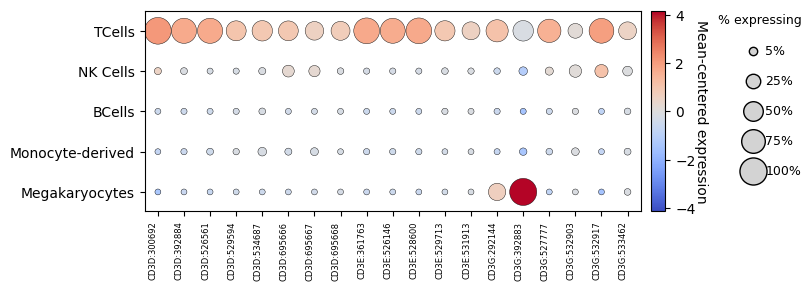

Saved: Intermediate_Files/Paper_Figs/Markers/dotplots_by_group/celltype_marker_isoform_dotplot__TCells.pdf


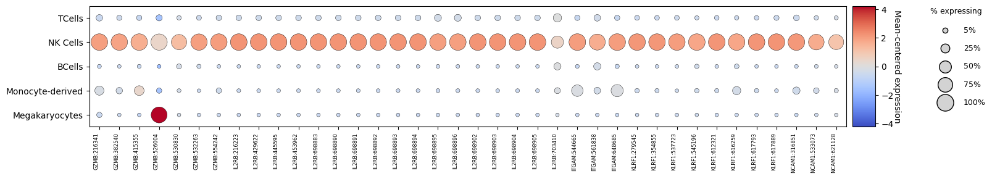

Saved: Intermediate_Files/Paper_Figs/Markers/dotplots_by_group/celltype_marker_isoform_dotplot__Natural_Killer.pdf


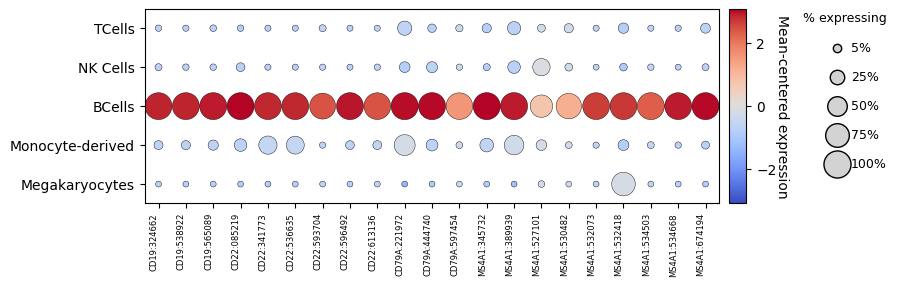

Saved: Intermediate_Files/Paper_Figs/Markers/dotplots_by_group/celltype_marker_isoform_dotplot__BCell.pdf


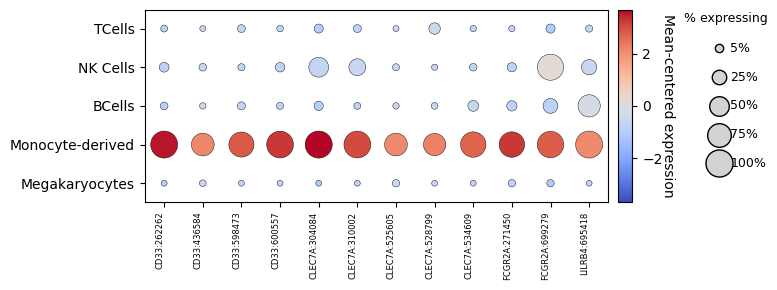

Saved: Intermediate_Files/Paper_Figs/Markers/dotplots_by_group/celltype_marker_isoform_dotplot__Monocyte-derived.pdf


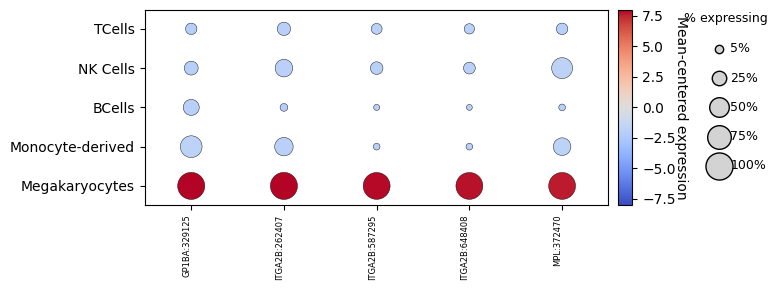

Saved: Intermediate_Files/Paper_Figs/Markers/dotplots_by_group/celltype_marker_isoform_dotplot__Megakaryocyte.pdf


In [58]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
from mpl_toolkits.axes_grid1 import make_axes_locatable

# =========================
# Config
# =========================
marker_groups_to_include = ["TCells", "Natural Killer", "BCell", "Monocyte-derived", "Megakaryocyte"]
celltype_order           = ["TCells", "NK Cells", "BCells", "Monocyte-derived", "Megakaryocytes"]
OUTDIR = "Intermediate_Files/Paper_Figs/Markers/dotplots_by_group"
os.makedirs(OUTDIR, exist_ok=True)

# =========================
# Collect isoforms present & group mapping
# =========================
gene_to_group = {}
matched_isoforms = []
for group, genes in marker_genes.items():
    if group not in marker_groups_to_include:
        continue
    m = find_matching_genes(genes, adata_i_filtered.var_names)  # isoforms like "GENE:ENSG:ENST"
    matched_isoforms.extend(m)
    for iso in m:
        gene_to_group[iso] = group

if not matched_isoforms:
    raise ValueError("No marker isoforms found for the requested groups.")

# =========================
# Expression matrix (cells × isoforms)
# =========================
X = adata_i_filtered[:, matched_isoforms].X
if hasattr(X, "toarray"):
    X = X.toarray()

iso_expr = pd.DataFrame(
    X,
    index=adata_i_filtered.obs["gen_cell_type"].astype(str),
    columns=matched_isoforms
)

# Per-cluster metrics
avg_expr_all = iso_expr.groupby(iso_expr.index, observed=True).mean()
pct_expr_all = (iso_expr > 0).astype(int).groupby(iso_expr.index, observed=True).mean() * 100

# Keep clusters in desired order
present = [ct for ct in celltype_order if ct in avg_expr_all.index]
avg_expr_all = avg_expr_all.reindex(present)
pct_expr_all = pct_expr_all.reindex(present)

# Short label helper: "GENE:...:ENST000123" -> "GENE:000123"
def short_label(iso):
    parts = iso.split(":")
    if len(parts) == 3:
        gene, _, enst = parts
        return f"{gene}:{enst[-6:]}"
    return iso

# =========================
# One dot plot per marker group
# =========================
for grp in marker_groups_to_include:
    iso_in_grp = [iso for iso in avg_expr_all.columns if gene_to_group.get(iso) == grp]
    if not iso_in_grp:
        print(f"[{grp}] no isoforms found, skipping.")
        continue

    # order columns by (gene, isoform)
    iso_to_gene = {iso: iso.split(":")[0] for iso in iso_in_grp}
    iso_in_grp = sorted(iso_in_grp, key=lambda x: (iso_to_gene[x], x))

    # subset & center
    avg_expr = avg_expr_all[iso_in_grp]
    pct_expr = pct_expr_all[iso_in_grp]
    avg_centered = avg_expr - avg_expr.mean(axis=0)

    # long format
    avg_long = avg_centered.reset_index(names="cell_type").melt(id_vars="cell_type", var_name="iso", value_name="avg_c")
    pct_long = pct_expr.reset_index(names="cell_type").melt(id_vars="cell_type", var_name="iso", value_name="pct")
    plot_long = avg_long.merge(pct_long, on=["cell_type", "iso"])
    plot_long["cell_type"] = pd.Categorical(plot_long["cell_type"], categories=present, ordered=True)
    plot_long["iso"]       = pd.Categorical(plot_long["iso"], categories=iso_in_grp, ordered=True)
    plot_long = plot_long.sort_values(["cell_type", "iso"])

    # color scaling (per-group), symmetric & robust
    rng = float(np.nanpercentile(np.abs(avg_centered.values), 100)) or 1.0
    norm = TwoSlopeNorm(vcenter=0, vmin=-rng, vmax=rng)

    # figure size proportional to #isoforms
    fig, ax = plt.subplots(figsize=(max(10.0, 0.55*len(iso_in_grp)), max(3.0, 0.55*len(present))))
    size_min, size_max = 18, 380

    sns.scatterplot(
        data=plot_long,
        x="iso", y="cell_type",
        hue="avg_c", size="pct",
        palette="coolwarm", hue_norm=norm,
        sizes=(size_min, size_max),
        edgecolor="black", linewidth=0.3,
        legend=False, ax=ax
    )

    # Layout: top row first, no x-gutters, vertical padding
   # enforce display order exactly as in celltype_order
    plot_long["cell_type"] = pd.Categorical(
        plot_long["cell_type"], 
        categories=present,  # same order as celltype_order subset
        ordered=True
    )

    ax.margins(y=0.12, x=0)
    ax.set_xlim(-0.5, len(iso_in_grp) - 0.5)

    # ---- Fixed ticks + 45° labels (auto-thin if many) ----
    ax.set_xticks(np.arange(len(iso_in_grp)))             # FixedLocator → no warning
    xt = [short_label(i) for i in iso_in_grp]
    max_visible = 90
    step = max(1, int(np.ceil(len(xt) / max_visible)))
    xt = [lab if (k % step == 0) else "" for k, lab in enumerate(xt)]
    ax.set_xticklabels(xt, rotation=90, ha="right", fontsize=6)

    ax.set_xlabel(""); ax.set_ylabel("")

    # Right-side panels: colorbar + size legend (size legend moved farther right)
    divider = make_axes_locatable(ax)

    # Colorbar
    cax = divider.append_axes("right", size="3%", pad=0.1)
    sm = plt.cm.ScalarMappable(cmap="coolwarm", norm=norm); sm.set_array([])
    cbar = fig.colorbar(sm, cax=cax)
    cbar.set_label("Mean-centered expression", rotation=270, labelpad=9)

    # Size legend (shifted right so it's not on top of the colorbar label)
    lax = divider.append_axes("right", size="10%", pad=0.70)
    lax.set_axis_off(); lax.set_xlim(0, 1); lax.set_ylim(0, 1)
    levels = [5, 25, 50, 75, 100]  # fixed legend scale
    lax.text(0.5, 0.99, "% expressing", ha="center", va="top", fontsize=9)
    ypos = np.linspace(0.80, 0.20, len(levels))
    for y, lv in zip(ypos, levels):
        sz = np.interp(lv, [0, 100], [size_min, size_max])  # legend independent of data
        lax.plot([0.35], [y], 'o', ms=np.sqrt(sz), markeredgecolor='black', markerfacecolor='lightgray')
        lax.text(0.60, y, f"{lv}%", va="center", ha="left", fontsize=9)

    # Reserve margin for side panels; keep left tight
    plt.tight_layout(rect=(0.02, 0, 0.80, 1))

    out = os.path.join(OUTDIR, f"celltype_marker_isoform_dotplot__{grp.replace(' ', '_')}.pdf")
    fig.savefig(out, dpi=600, transparent=True, bbox_inches="tight")
    plt.show()
    print(f"Saved: {out}")

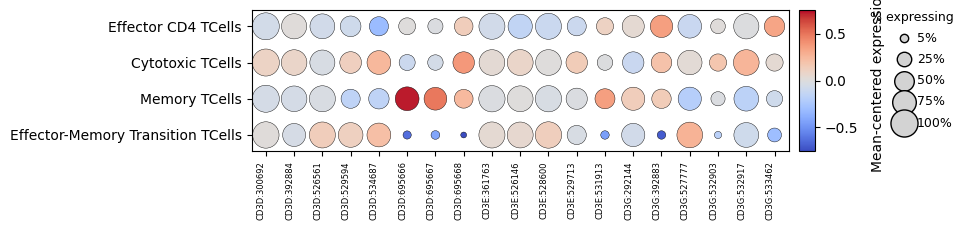

Saved: Intermediate_Files/Paper_Figs/Markers/dotplots_by_Tcell_subgroups/Tcell_subtype_isoform_dotplot__TCells.pdf


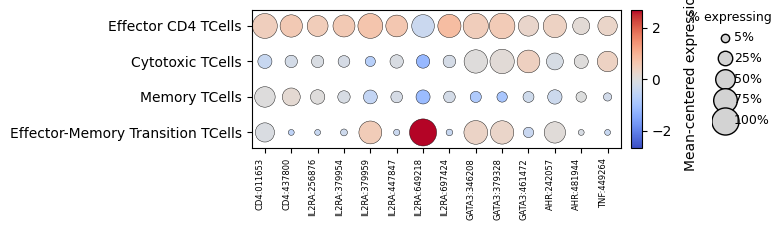

Saved: Intermediate_Files/Paper_Figs/Markers/dotplots_by_Tcell_subgroups/Tcell_subtype_isoform_dotplot__CD4+_Effector.pdf


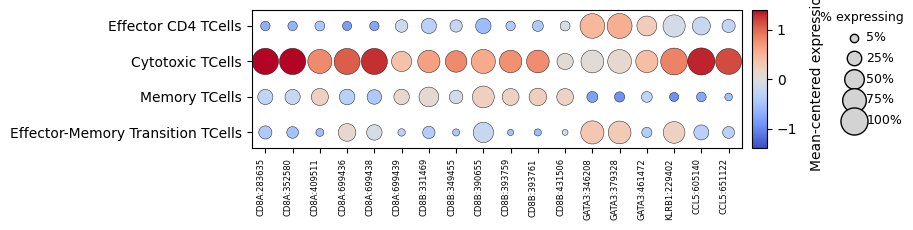

Saved: Intermediate_Files/Paper_Figs/Markers/dotplots_by_Tcell_subgroups/Tcell_subtype_isoform_dotplot__Cytotoxic.pdf


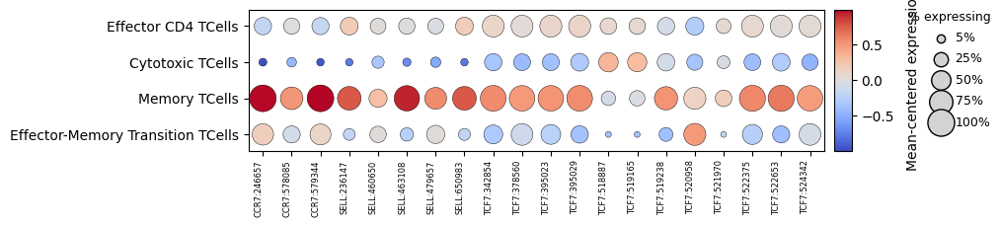

Saved: Intermediate_Files/Paper_Figs/Markers/dotplots_by_Tcell_subgroups/Tcell_subtype_isoform_dotplot__Memory.pdf


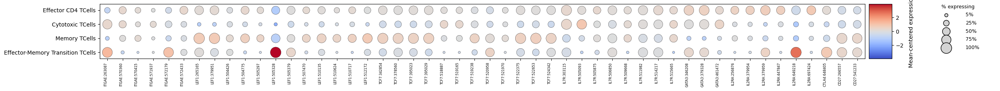

Saved: Intermediate_Files/Paper_Figs/Markers/dotplots_by_Tcell_subgroups/Tcell_subtype_isoform_dotplot__Transition.pdf


In [109]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
from mpl_toolkits.axes_grid1 import make_axes_locatable

# =========================
# Your helpers & markers
# =========================
def find_matching_genes(prefixes, gene_list):
    return [gene for gene in gene_list if any(gene.startswith(prefix) for prefix in prefixes)]

marker_genes = {
    "TCells": ["CD3D:", "CD3E:", "CD3G:"],
    "Cytotoxic": ["CD8A:", "CD8B:", "GATA3:", "KLRB1:", "CCL5:"],
    "CD4+ Effector": ["CD4:", "IL2RA:", "GATA3:", "AHR:", "TNF:"],
    "Memory": ["CCR7:", "SELL:", "TCF7:"],
    "Transition": ["ITGAE:", "LEF1:", "TCF7:", "IL7R:", "GATA3:", "IL2RA", "CTLA4", "CD27:"],
    "Natural Killer": ["GZMB:", "KLRF1:", "NCAM1:", "ITGAM:", "IL2RB:"],
    "BCell": ["CD22:", "CD79A:", "MS4A1:", "CD19:"],
    "Monocyte-derived": ["FCGR2A:", "CLEC7A:", "CD33:", "LILRB4:"],
    "Megakaryocyte": ["ITGA2B:", "MPL:", "GPS5", "GP1BA:"],
}

# normalize prefixes (ensure trailing ":")
normalized_marker_genes = {
    grp: [g if g.endswith(":") else f"{g}:" for g in lst]
    for grp, lst in marker_genes.items()
}

# =========================
# Config (T cell subgroups)
# =========================
marker_groups_to_include = ["TCells", "CD4+ Effector", "Cytotoxic", "Memory", "Transition"]
tcell_order = ["Effector CD4 TCells", "Cytotoxic TCells", "Memory TCells", "Effector-Memory Transition TCells"]
OUTDIR = "Intermediate_Files/Paper_Figs/Markers/dotplots_by_Tcell_subgroups"
os.makedirs(OUTDIR, exist_ok=True)

# =========================
# Collect union of isoforms and build matrix
# =========================
matched_isoforms = []
for grp in marker_groups_to_include:
    matched_isoforms.extend(find_matching_genes(normalized_marker_genes[grp], adata_i_filtered.var_names))
# unique, keep order
matched_isoforms = list(dict.fromkeys(matched_isoforms))

if not matched_isoforms:
    raise ValueError("No marker isoforms found for the requested groups.")

X = adata_i_filtered[:, matched_isoforms].X
if hasattr(X, "toarray"):
    X = X.toarray()

iso_expr = pd.DataFrame(
    X,
    index=adata_i_filtered.obs["sub_cell_type"].astype(str),
    columns=matched_isoforms
)

# Per-subtype metrics
avg_expr_all = iso_expr.groupby(iso_expr.index, observed=True).mean()
pct_expr_all = (iso_expr > 0).astype(int).groupby(iso_expr.index, observed=True).mean() * 100

# Keep subtypes in desired order
present = [ct for ct in tcell_order if ct in avg_expr_all.index]
if not present:
    raise ValueError("None of tcell_order present in sub_cell_type.")
avg_expr_all = avg_expr_all.reindex(present)
pct_expr_all = pct_expr_all.reindex(present)

# Short label helper
def short_label(iso):
    parts = iso.split(":")
    if len(parts) == 3:
        gene, _, enst = parts
        return f"{gene}:{enst[-6:]}"
    return iso

# =========================
# One dot plot per marker group (forced genes, all isoforms)
# =========================
for grp in marker_groups_to_include:
    prefixes = normalized_marker_genes.get(grp, [])
    if not prefixes:
        print(f"[{grp}] no marker list; skipping panel.")
        continue

    # find isoforms for this group directly from prefixes
    grp_iso_all = [c for c in avg_expr_all.columns if any(c.startswith(p) for p in prefixes)]

    # collect ALL isoforms for each listed gene, in the exact gene order provided
    iso_in_grp = []
    for prefix in prefixes:
        gene_sym = prefix[:-1]
        g_isos = [iso for iso in grp_iso_all if iso.split(":")[0] == gene_sym]
        if not g_isos:
            print(f"[WARN] {grp}: no isoforms found for required gene '{gene_sym}'")
        # stable order by transcript id token if present
        g_isos = sorted(g_isos, key=lambda s: s.split(":")[-1])
        iso_in_grp.extend(g_isos)

    # dedupe while preserving order (prevents "Categorical categories must be unique")
    iso_in_grp = list(dict.fromkeys(iso_in_grp))
    if not iso_in_grp:
        print(f"[{grp}] no isoforms available for any required genes; skipping.")
        continue

    # subset & center
    avg_expr = avg_expr_all[iso_in_grp]
    pct_expr = pct_expr_all[iso_in_grp]
    avg_centered = avg_expr - avg_expr.mean(axis=0)

    # long format
    avg_long = avg_centered.reset_index(names="cell_type").melt(id_vars="cell_type", var_name="iso", value_name="avg_c")
    pct_long = pct_expr.reset_index(names="cell_type").melt(id_vars="cell_type", var_name="iso", value_name="pct")
    plot_long = avg_long.merge(pct_long, on=["cell_type", "iso"])

    # enforce top→bottom order; NO invert_yaxis later
    plot_long["cell_type"] = pd.Categorical(plot_long["cell_type"], categories=present, ordered=True)
    plot_long["iso"]       = pd.Categorical(plot_long["iso"], categories=iso_in_grp, ordered=True)
    plot_long = plot_long.sort_values(["cell_type", "iso"])

    # robust symmetric color range
    rng = float(np.nanpercentile(np.abs(avg_centered.values), 100)) or 1.0
    norm = TwoSlopeNorm(vcenter=0, vmin=-rng, vmax=rng)

    # figure size proportional to isoforms
    fig, ax = plt.subplots(figsize=(max(10.0, 0.65 * len(iso_in_grp)), max(2.0, 0.6 * len(present))))
    size_min, size_max = 18, 380

    sns.scatterplot(
        data=plot_long,
        x="iso", y="cell_type",
        hue="avg_c", size="pct",
        palette="coolwarm", hue_norm=norm,
        sizes=(size_min, size_max),
        edgecolor="black", linewidth=0.3,
        legend=False, ax=ax
    )

    # layout
    ax.margins(y=0.15, x=0.3)
    ax.set_xlim(-0.5, len(iso_in_grp) - 0.5)

    # x tick labels
    ax.set_xticks(np.arange(len(iso_in_grp)))
    xt = [short_label(i) for i in iso_in_grp]
    max_visible = 90
    step = max(1, int(np.ceil(len(xt) / max_visible)))
    xt = [lab if (k % step == 0) else "" for k, lab in enumerate(xt)]
    ax.set_xticklabels(xt, rotation=90, ha="right", fontsize=6)

    ax.set_xlabel(""); ax.set_ylabel("")

    # right-side colorbar + size legend
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="3%", pad=0.1)
    sm = plt.cm.ScalarMappable(cmap="coolwarm", norm=norm); sm.set_array([])
    cbar = fig.colorbar(sm, cax=cax)
    cbar.set_label("Mean-centered expression", rotation=90, labelpad=9)

    lax = divider.append_axes("right", size="10%", pad=0.70)
    lax.set_axis_off(); lax.set_xlim(0, 1); lax.set_ylim(0, 1)
    levels = [5, 25, 50, 75, 100]
    lax.text(0.5, 0.99, "% expressing", ha="center", va="top", fontsize=9)
    ypos = np.linspace(0.80, 0.20, len(levels))
    for y, lv in zip(ypos, levels):
        sz = np.interp(lv, [0, 100], [size_min, size_max])
        lax.plot([0.35], [y], 'o', ms=np.sqrt(sz), markeredgecolor='black', markerfacecolor='lightgray')
        lax.text(0.60, y, f"{lv}%", va="center", ha="left", fontsize=9)

    plt.tight_layout(rect=(0.02, 0, 0.80, 1))
    out = os.path.join(OUTDIR, f"Tcell_subtype_isoform_dotplot__{grp.replace(' ', '_')}.pdf")
    fig.savefig(out, dpi=600, transparent=True, bbox_inches="tight")
    plt.show()
    print(f"Saved: {out}")

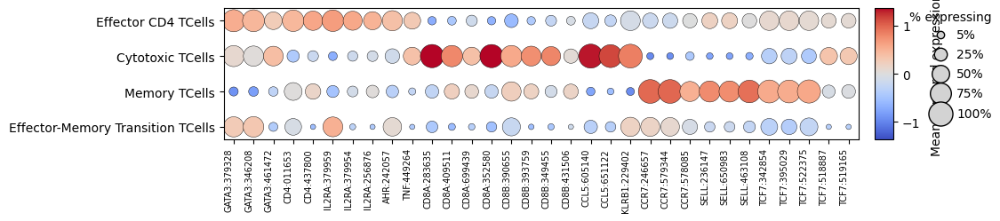

Saved to: Intermediate_Files/Paper_Figs/Markers/subcelltype_TCells_marker_isoform_dotplot_abbreviated.pdf


In [7]:
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
from mpl_toolkits.axes_grid1 import make_axes_locatable

# ---------------------------
# Config
# ---------------------------
marker_groups_to_include = ["TCells", "CD4+ Effector", "Cytotoxic", "Memory", "Transition"]
celltype_order = ["Effector CD4 TCells", "Cytotoxic TCells", "Memory TCells", "Effector-Memory Transition TCells"]

# Only include these transcripts, in this exact order
desired_transcripts = {
    "GATA3": ["ENST00000379328", "ENST00000346208", "ENST00000461472"],
    "CD4": ["ENST00000011653", "ENST00000437800"],
    "IL2RA": ["ENST00000379959", "ENST00000379954", "ENST00000256876"],
    "AHR": ["ENST00000242057"],
    "TNF": ["ENST00000449264"],
    "CD8A": ["ENST00000283635", "ENST00000409511", "ENST00000699439", "ENST00000352580"],
    "CD8B": ["ENST00000390655", "ENST00000393759", "ENST00000349455", "ENST00000431506"],
    "CCL5": ["ENST00000605140", "ENST00000651122"],
    "KLRB1": ["ENST00000229402"],
    "CCR7": ["ENST00000246657", "ENST00000579344", "ENST00000578085"],
    "SELL": ["ENST00000236147", "ENST00000650983", "ENST00000463108"],
    "TCF7": ["ENST00000342854", "ENST00000395029", "ENST00000522375", "ENST00000518887", "ENST00000519165"],
}

# ---------------------------
# Build whitelist from adata varnames (expects "GENE:ENSG:ENST")
# ---------------------------
varnames = pd.Index(adata_i_filtered.var_names.astype(str))
whitelist_isoforms = []
missing = []

def find_iso_ids(gene, enst):
    # IDs look like "GENE:ENSG:ENST". Accept any ENSG.
    return varnames[(varnames.str.startswith(f"{gene}:")) & (varnames.str.endswith(f":{enst}"))].tolist()

for gene, ensts in desired_transcripts.items():
    for enst in ensts:
        hits = find_iso_ids(gene, enst)
        if hits:
            whitelist_isoforms.extend(hits)  # if multiple, keep stable order
        else:
            missing.append(f"{gene}:{enst}")

if not whitelist_isoforms:
    raise ValueError("None of the requested transcripts were found in adata_i_filtered.var_names.")

if missing:
    print("Warning — these requested transcripts were not found and will be skipped:")
    for m in missing:
        print("  ", m)

matched_isoforms = whitelist_isoforms

# ---------------------------
# Expression matrix (cells × isoforms)
# ---------------------------
X = adata_i_filtered[:, matched_isoforms].X
if hasattr(X, "toarray"):
    X = X.toarray()

iso_expr = pd.DataFrame(
    X,
    index=adata_i_filtered.obs["sub_cell_type"].astype(str),
    columns=matched_isoforms
)

# ---------------------------
# Per-cluster metrics on isoforms
# ---------------------------
avg_expr_iso = iso_expr.groupby(iso_expr.index, observed=True).mean()
pct_expr_iso = (iso_expr > 0).astype(int).groupby(iso_expr.index, observed=True).mean() * 100

# Keep clusters in desired order
present = [ct for ct in celltype_order if ct in avg_expr_iso.index]
avg_expr_iso = avg_expr_iso.reindex(present)
pct_expr_iso = pct_expr_iso.reindex(present)

# Fixed isoform order = whitelist order present in matrix
ordered_isoforms = [i for i in matched_isoforms if i in avg_expr_iso.columns]

# Reorder matrices
avg_expr_iso = avg_expr_iso[ordered_isoforms]
pct_expr_iso = pct_expr_iso[ordered_isoforms]

# ---------------------------
# Mean-center per isoform (white = average across clusters for that isoform)
# ---------------------------
avg_centered = avg_expr_iso - avg_expr_iso.mean(axis=0)

# Short x labels: GENE:last 6 of transcript id (if present)
def short_label(iso):
    parts = iso.split(":")
    if len(parts) == 3:
        gene, _, enst = parts
        return f"{gene}:{enst[-6:]}"
    return iso

xlabels = [short_label(i) for i in ordered_isoforms]

# ---------------------------
# Long format for plotting
# ---------------------------
avg_long = avg_centered.reset_index(names="cell_type").melt(id_vars="cell_type", var_name="iso", value_name="avg_c")
pct_long = pct_expr_iso.reset_index(names="cell_type").melt(id_vars="cell_type", var_name="iso", value_name="pct")
plot_long = avg_long.merge(pct_long, on=["cell_type", "iso"])

# Enforce display order
plot_long["cell_type"] = pd.Categorical(plot_long["cell_type"], categories=present, ordered=True)
plot_long["iso"] = pd.Categorical(plot_long["iso"], categories=ordered_isoforms, ordered=True)
plot_long = plot_long.sort_values(["cell_type", "iso"])

# ---------------------------
# Dot plot
# ---------------------------
fig, ax = plt.subplots(
    figsize=(max(12, 0.42 * len(ordered_isoforms)), max(2.6, 0.45 * len(present)))
)
size_min, size_max = 18, 380

# Robust symmetric color range around 0
vals = avg_centered.values.astype(float)
if np.all((~np.isfinite(vals)) | (vals == 0)):
    rng = 1.0
else:
    rng = float(np.nanpercentile(np.abs(vals[np.isfinite(vals)]), 99))
    if not np.isfinite(rng) or rng == 0:
        rng = 1.0

norm = TwoSlopeNorm(vcenter=0, vmin=-rng, vmax=rng)

sns.scatterplot(
    data=plot_long,
    x="iso", y="cell_type",
    hue="avg_c", size="pct",
    palette="coolwarm", hue_norm=norm,
    sizes=(size_min, size_max),
    edgecolor="black", linewidth=0.3,
    legend=False, ax=ax
)

# Layout tweaks
plot_long["cell_type"] = pd.Categorical(plot_long["cell_type"], categories=present, ordered=True)
ax.margins(y=0.12, x=0)
ax.set_xlim(-0.5, len(ordered_isoforms) - 0.5)

# Swap tick labels to the short ones (same order as categories)
ax.set_xticks(range(len(ordered_isoforms)))
ax.set_xticklabels(xlabels, rotation=90, ha="right", fontsize=7)

# ---------------------------
# Right side: colorbar + % expressing legend
# ---------------------------
divider = make_axes_locatable(ax)

# Colorbar
cax = divider.append_axes("right", size="3%", pad=0.18)
sm = plt.cm.ScalarMappable(cmap="coolwarm", norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, cax=cax)
cbar.set_label("Mean-centered expression", rotation=90, labelpad=8)

# Size legend under colorbar
lax = divider.append_axes("right", size="10%", pad=0.28)
lax.set_axis_off(); lax.set_xlim(0, 1); lax.set_ylim(0, 1)
levels = [5, 25, 50, 75, 100]  # keep consistent across plots
lax.text(0.5, 0.98, "% expressing", ha="center", va="top", fontsize=10)
ypos = np.linspace(0.80, 0.20, len(levels))
for y, lv in zip(ypos, levels):
    sz = np.interp(lv, [0, 100], [size_min, size_max])  # legend independent of data range
    lax.plot([0.35], [y], 'o', ms=np.sqrt(sz), markeredgecolor='black', markerfacecolor='lightgray')
    lax.text(0.60, y, f"{lv}%", va="center", ha="left", fontsize=10)

# Cosmetics
ax.set_xlabel(""); ax.set_ylabel("")
for lab in ax.get_xticklabels():
    lab.set_rotation(90); lab.set_ha('right')
plt.yticks(rotation=0)

# ---------------------------
# Save / show
# ---------------------------
outpath = "Intermediate_Files/Paper_Figs/Markers/subcelltype_TCells_marker_isoform_dotplot_abbreviated.pdf"
os.makedirs(os.path.dirname(outpath), exist_ok=True)
plt.tight_layout(rect=(0.02, 0, 0.86, 1))  # slimmer left, reserve right panel
plt.savefig(outpath, dpi=600, transparent=True, bbox_inches="tight")
plt.show()
print(f"Saved to: {outpath}")

In [23]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
from mpl_toolkits.axes_grid1 import make_axes_locatable

# =========================
# Your helpers & markers
# =========================
def find_matching_genes(prefixes, gene_list):
    return [gene for gene in gene_list if any(gene.startswith(prefix) for prefix in prefixes)]

marker_genes = {
    "TCells": ["CD3D:", "CD3E:", "CD3G:"],
    "Cytotoxic": ["CD8A:", "CD8B:", "GATA3:", "KLRB1:", "CCL5:"],
    "CD4+ Effector": ["CD4:", "IL2RA:", "GATA3:", "AHR:", "TNF:"],
    "Memory": ["CCR7:", "SELL:", "TCF7:"],
    "Transition": ["ITGAE:", "LEF1:", "TCF7:", "IL7R:", "GATA3:", "IL2RA", "CTLA4", "CD27:"],
    "Natural Killer": ["GZMB:", "KLRF1:", "NCAM1:", "ITGAM:", "IL2RB:"],
    "BCell": ["CD22:", "CD79A:", "MS4A1:", "CD19:"],
    "Monocyte-derived": ["FCGR2A:", "CLEC7A:", "CD33:", "LILRB4:"],
    "Megakaryocyte": ["ITGA2B:", "MPL:", "GPS5", "GP1BA:"],
}

# normalize prefixes (ensure trailing ":")
normalized_marker_genes = {
    grp: [g if g.endswith(":") else f"{g}:" for g in lst]
    for grp, lst in marker_genes.items()
}

# =========================
# Config (T cell subgroups)
# =========================
marker_groups_to_include = ["TCells", "CD4+ Effector", "Cytotoxic", "Memory", "Transition"]
tcell_order = ["Effector CD4 TCells", "Cytotoxic TCells", "Memory TCells", "Effector-Memory Transition TCells"]
OUTDIR = "Intermediate_Files/Paper_Figs/Markers/dotplots_by_Tcell_subgroups"
os.makedirs(OUTDIR, exist_ok=True)

# =========================
# Collect union of isoforms and build matrix
# =========================
matched_isoforms = []
for grp in marker_groups_to_include:
    matched_isoforms.extend(find_matching_genes(normalized_marker_genes[grp], adata_i_filtered.var_names))
# unique, keep order
matched_isoforms = list(dict.fromkeys(matched_isoforms))

if not matched_isoforms:
    raise ValueError("No marker isoforms found for the requested groups.")

X = adata_i_filtered[:, matched_isoforms].X
if hasattr(X, "toarray"):
    X = X.toarray()

iso_expr = pd.DataFrame(
    X,
    index=adata_i_filtered.obs["sub_cell_type"].astype(str),
    columns=matched_isoforms
)

# Per-subtype metrics
avg_expr_all = iso_expr.groupby(iso_expr.index, observed=True).mean()
pct_expr_all = (iso_expr > 0).astype(int).groupby(iso_expr.index, observed=True).mean() * 100

# Keep subtypes in desired order
present = [ct for ct in tcell_order if ct in avg_expr_all.index]
if not present:
    raise ValueError("None of tcell_order present in sub_cell_type.")
avg_expr_all = avg_expr_all.reindex(present)
pct_expr_all = pct_expr_all.reindex(present)

# Short label helper
def short_label(iso):
    parts = iso.split(":")
    if len(parts) == 3:
        gene, _, enst = parts
        return f"{gene}:{enst[-6:]}"
    return iso

# =========================
# One dot plot per gene (all isoforms for that gene)
# =========================
for grp in marker_groups_to_include:
    prefixes = normalized_marker_genes.get(grp, [])
    if not prefixes:
        print(f"[{grp}] no marker list; skipping panel.")
        continue

    # Loop through each gene prefix individually
    for prefix in prefixes:
        gene_sym = prefix[:-1]  # remove trailing ":"
        # get isoforms for this gene from the already matched isoforms
        g_isos = [iso for iso in avg_expr_all.columns if iso.split(":")[0] == gene_sym]

        if not g_isos:
            print(f"[WARN] No isoforms found for gene '{gene_sym}' in group '{grp}'")
            continue

        # stable order by transcript ID
        g_isos = sorted(g_isos, key=lambda s: s.split(":")[-1])

        # subset & center
        avg_expr = avg_expr_all[g_isos]
        pct_expr = pct_expr_all[g_isos]
        avg_centered = avg_expr - avg_expr.mean(axis=0)

        # long format
        avg_long = avg_centered.reset_index(names="cell_type").melt(
            id_vars="cell_type", var_name="iso", value_name="avg_c"
        )
        pct_long = pct_expr.reset_index(names="cell_type").melt(
            id_vars="cell_type", var_name="iso", value_name="pct"
        )
        plot_long = avg_long.merge(pct_long, on=["cell_type", "iso"])

        # enforce order
        plot_long["cell_type"] = pd.Categorical(plot_long["cell_type"], categories=present, ordered=True)
        plot_long["iso"]       = pd.Categorical(plot_long["iso"], categories=g_isos, ordered=True)
        plot_long = plot_long.sort_values(["cell_type", "iso"])

        # robust symmetric color range
        rng = float(np.nanpercentile(np.abs(avg_centered.values), 100)) or 1.0
        norm = TwoSlopeNorm(vcenter=0, vmin=-rng, vmax=rng)

        # figure size proportional to isoforms
        fig, ax = plt.subplots(
            figsize=(max(8.0, 0.65 * len(g_isos)), max(2.0, 0.6 * len(present)))
        )
        size_min, size_max = 18, 380

        sns.scatterplot(
            data=plot_long,
            x="iso", y="cell_type",
            hue="avg_c", size="pct",
            palette="coolwarm", hue_norm=norm,
            sizes=(size_min, size_max),
            edgecolor="black", linewidth=0.3,
            legend=False, ax=ax
        )

        # layout
        ax.margins(y=0.15, x=0.3)
        ax.set_xlim(-0.5, len(g_isos) - 0.5)

        # x tick labels
        ax.set_xticks(np.arange(len(g_isos)))
        xt = [short_label(i) for i in g_isos]
        max_visible = 90
        step = max(1, int(np.ceil(len(xt) / max_visible)))
        xt = [lab if (k % step == 0) else "" for k, lab in enumerate(xt)]
        ax.set_xticklabels(xt, rotation=90, ha="right", fontsize=6)

        ax.set_xlabel(""); ax.set_ylabel("")

        # right-side colorbar + size legend
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="3%", pad=0.1)
        sm = plt.cm.ScalarMappable(cmap="coolwarm", norm=norm); sm.set_array([])
        cbar = fig.colorbar(sm, cax=cax)
        cbar.set_label("Mean-centered expression", rotation=90, labelpad=9)

        lax = divider.append_axes("right", size="10%", pad=0.70)
        lax.set_axis_off(); lax.set_xlim(0, 1); lax.set_ylim(0, 1)
        levels = [5, 25, 50, 75, 100]
        lax.text(0.5, 0.99, "% expressing", ha="center", va="top", fontsize=9)
        ypos = np.linspace(0.80, 0.20, len(levels))
        for y, lv in zip(ypos, levels):
            sz = np.interp(lv, [0, 100], [size_min, size_max])
            lax.plot([0.35], [y], 'o', ms=np.sqrt(sz),
                     markeredgecolor='black', markerfacecolor='lightgray')
            lax.text(0.60, y, f"{lv}%", va="center", ha="left", fontsize=9)

        plt.tight_layout(rect=(0.02, 0, 0.80, 1))

        # Save with group+gene name
        out = os.path.join(
            OUTDIR, f"Tcell_subtype_isoform_dotplot__{grp.replace(' ', '_')}__{gene_sym}.pdf"
        )
        fig.savefig(out, dpi=600, transparent=True, bbox_inches="tight")
        plt.close(fig)  # close to avoid too many open figures
        print(f"Saved: {out}")

Saved: Intermediate_Files/Paper_Figs/Markers/dotplots_by_Tcell_subgroups/Tcell_subtype_isoform_dotplot__TCells__CD3D.pdf
Saved: Intermediate_Files/Paper_Figs/Markers/dotplots_by_Tcell_subgroups/Tcell_subtype_isoform_dotplot__TCells__CD3E.pdf
Saved: Intermediate_Files/Paper_Figs/Markers/dotplots_by_Tcell_subgroups/Tcell_subtype_isoform_dotplot__TCells__CD3G.pdf
Saved: Intermediate_Files/Paper_Figs/Markers/dotplots_by_Tcell_subgroups/Tcell_subtype_isoform_dotplot__CD4+_Effector__CD4.pdf
Saved: Intermediate_Files/Paper_Figs/Markers/dotplots_by_Tcell_subgroups/Tcell_subtype_isoform_dotplot__CD4+_Effector__IL2RA.pdf
Saved: Intermediate_Files/Paper_Figs/Markers/dotplots_by_Tcell_subgroups/Tcell_subtype_isoform_dotplot__CD4+_Effector__GATA3.pdf
Saved: Intermediate_Files/Paper_Figs/Markers/dotplots_by_Tcell_subgroups/Tcell_subtype_isoform_dotplot__CD4+_Effector__AHR.pdf
Saved: Intermediate_Files/Paper_Figs/Markers/dotplots_by_Tcell_subgroups/Tcell_subtype_isoform_dotplot__CD4+_Effector__TNF.pd

/tmp/ipykernel_827999/2217053668.py:32: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_expr = iso_expr.groupby(iso_expr.index).mean()


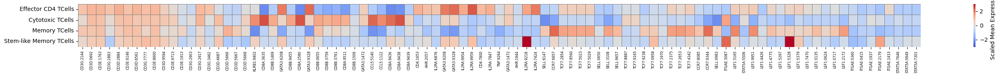

In [123]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm

# Define marker groups
marker_groups_to_include = [
    "TCells", "Cytotoxic", "CD4+ Effector", "Memory", "Stem-like"
]

# Build isoform -> group mapping
gene_to_group = {}
matched_isoforms = []

for group, genes in marker_genes.items():
    if group not in marker_groups_to_include:
        continue
    matches = find_matching_genes(genes, adata_i_filtered.var_names)
    matched_isoforms.extend(matches)
    for isoform in matches:
        gene_to_group[isoform] = group

# Get expression matrix
iso_expr = pd.DataFrame(
    adata_i_filtered[:, matched_isoforms].X.toarray(),
    columns=matched_isoforms,
    index=adata_i_filtered.obs["sub_cell_type"]
)

# Compute mean per cell type
mean_expr = iso_expr.groupby(iso_expr.index).mean()

# Z-score scaling across rows (cell types)
scaled_expr = (mean_expr - mean_expr.mean(axis=1).values[:, None]) / mean_expr.std(axis=1).values[:, None]
plot_df = scaled_expr.fillna(0).sort_index()

# Clean labels: gene:transcript or fallback
labels = []
for isoform in plot_df.columns:
    parts = isoform.split(":")
    if len(parts) == 3:
        gene = parts[0]
        tx = parts[2]
        label = f"{gene}:{tx[-4:]}"  # shorten transcript ID
    else:
        label = isoform[-8:]
    labels.append(label)

# Organize by group → gene → isoform
isoform_meta = pd.DataFrame({
    "isoform": plot_df.columns,
    "group": [gene_to_group[i] for i in plot_df.columns],
    "gene": [i.split(":")[0] for i in plot_df.columns]
})
isoform_meta["group_rank"] = isoform_meta["group"].apply(lambda x: marker_groups_to_include.index(x))
isoform_meta = isoform_meta.sort_values(["group_rank", "gene", "isoform"])
plot_df = plot_df[isoform_meta["isoform"]]

# Restrict to T-cell clusters only
tcell_order = [
    "Effector CD4 TCells", "Cytotoxic TCells",
    "Memory TCells", "Stem-like Memory TCells"]
plot_df = scaled_expr.reindex(index=tcell_order)

# Plot
plt.figure(figsize=(len(plot_df.columns) * 0.3, 2))
norm = TwoSlopeNorm(vmin=-3, vcenter=0, vmax=3)

sns.heatmap(
    plot_df,
    cmap="coolwarm",
    linewidths=0.5,
    linecolor='gray',
    cbar_kws={"label": "Scaled Mean Expression"},
    square=False,
    norm=norm
)

plt.xlabel("")
plt.ylabel("")
plt.xticks(ticks=np.arange(len(plot_df.columns)) + 0.5, labels=labels, rotation=90, fontsize=6)
plt.yticks(rotation=0)
plt.tight_layout()

plt.savefig("Intermediate_Files/Paper_Figs/Markers/subcelltype_marker_TCellsOnly_isoform_heatmap.pdf",
            dpi=600, transparent=True, bbox_inches="tight")
plt.show()

/tmp/ipykernel_4001701/1855145895.py:33: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_expr_iso = iso_expr.groupby(iso_expr.index).mean()


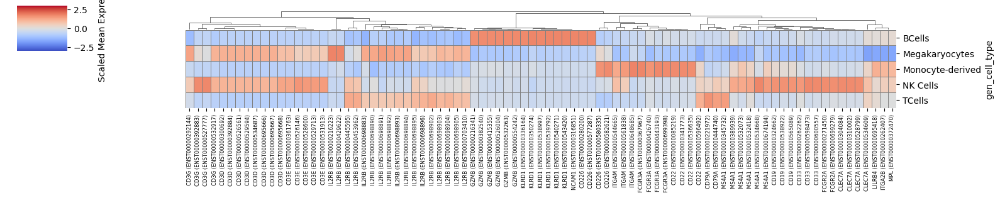

In [26]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm

# Define marker groups
marker_groups_to_include = ["TCells", "Natural Killer", "BCell", "Monocyte-derived", "Megakaryocyte"]

gene_to_group = {}
matched_isoforms = []

for group, genes in marker_genes.items():
    if group not in marker_groups_to_include:
        continue
    matches = find_matching_genes(genes, adata_i_filtered.var_names)
    matched_isoforms.extend([m for m in matches if m not in matched_isoforms])
    for isoform in matches:
        gene_to_group[isoform] = group

def format_name(x):
    parts = x.split(":")
    return f"{parts[0]} ({parts[-1]})" if len(parts) >= 3 else x

clean_names = [format_name(x) for x in matched_isoforms]

# Extract expression
iso_expr = pd.DataFrame(adata_i_filtered[:, matched_isoforms].X.toarray(), 
                        columns=clean_names, 
                        index=adata_i_filtered.obs["gen_cell_type"])

# Aggregate mean expression per cell type
mean_expr_iso = iso_expr.groupby(iso_expr.index).mean()

# Z-score per gene (across cell types, so axis=0)
scaled_expr_iso = (mean_expr_iso - mean_expr_iso.mean()) / mean_expr_iso.std()

# Replace NaNs with 0
plot_df_iso = scaled_expr_iso.fillna(0)

# Normalize color scale
norm = TwoSlopeNorm(vmin=-3, vcenter=0, vmax=3)

# Clustered heatmap with dendrogram on columns (isoforms)
g = sns.clustermap(plot_df_iso, cmap="coolwarm", linewidths=0.7, linecolor='gray',
                   figsize=(16, 4), col_cluster=True, row_cluster=False, 
                   cbar_kws={"label": "Scaled Mean Expression"},
                   norm=norm)

# Fix missing x labels
g.ax_heatmap.set_xticks(np.arange(len(plot_df_iso.columns)) + 0.5)
g.ax_heatmap.set_xticklabels(plot_df_iso.columns, rotation=90, ha='center')
g.ax_heatmap.tick_params(axis='x', labelsize=6)

g.ax_heatmap.set_yticklabels(g.ax_heatmap.get_yticklabels(), rotation=0)

plt.savefig("Intermediate_Files/Paper_Figs/Markers/celltype_marker_isoform_clustermap_dendrogram.pdf",
            dpi=600, transparent=True, bbox_inches="tight")
plt.show()

/tmp/ipykernel_534167/958897654.py:44: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_expr_iso = iso_expr.groupby(iso_expr.index).mean()


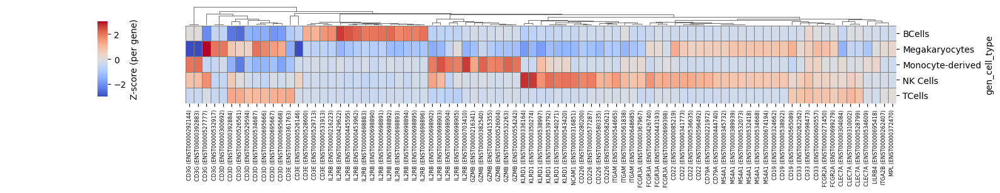

In [16]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
from collections import defaultdict
import re

# --- SETTINGS ---
marker_groups_to_include = ["TCells", "Natural Killer", "BCell", "Monocyte-derived", "Megakaryocyte"]

# --- FORMAT CLEANED ISOFORM LABELS ---
def format_name(x):
    parts = x.split(":")
    return f"{parts[0]} ({parts[-1]})" if len(parts) >= 3 else x

def get_gene_name(label):
    match = re.match(r"^(.+?) \(", label)
    return match.group(1) if match else label

# --- MATCH ISOFORMS ---
matched_isoforms = []
gene_to_group = {}

for group, genes in marker_genes.items():
    if group not in marker_groups_to_include:
        continue
    matches = find_matching_genes(genes, adata_i_filtered.var_names)
    matched_isoforms.extend([m for m in matches if m not in matched_isoforms])  # Deduplicate
    for isoform in matches:
        gene_to_group[isoform] = group

# --- FORMAT COLUMN NAMES ---
clean_names = [format_name(x) for x in matched_isoforms]

# --- EXTRACT EXPRESSION FROM log_denoised LAYER ---
iso_expr = pd.DataFrame(
    adata_i_filtered[:, matched_isoforms].layers["log_denoised"],
    columns=clean_names,
    index=adata_i_filtered.obs["gen_cell_type"]
)

# --- CALCULATE MEAN EXPRESSION PER CELL TYPE ---
mean_expr_iso = iso_expr.groupby(iso_expr.index).mean()
plot_df_iso = mean_expr_iso.copy().sort_index().fillna(0)

# --- REMOVE DUPLICATE COLUMNS ---
plot_df_iso = plot_df_iso.loc[:, ~plot_df_iso.columns.duplicated()]

# --- MAP ISOFORMS TO GENES ---
isoform_to_gene = {name: get_gene_name(name) for name in plot_df_iso.columns}
gene_to_isoforms = defaultdict(list)
for iso, gene in isoform_to_gene.items():
    gene_to_isoforms[gene].append(iso)

# --- GENE-WISE Z-SCORING ACROSS ISOFORMS ---
scaled_by_gene = pd.DataFrame(index=plot_df_iso.index)

for gene, isoforms in gene_to_isoforms.items():
    data = plot_df_iso[isoforms]
    all_values = data.values.flatten()
    mean = all_values.mean()
    std = all_values.std()
    scaled = (data - mean) / std
    scaled_by_gene = pd.concat([scaled_by_gene, scaled], axis=1)

# Replace non-finite values (inf, NaN) with 0 for clustering
scaled_by_gene = scaled_by_gene.replace([np.inf, -np.inf], np.nan).fillna(0)

# --- COLOR SCALE ---
norm = TwoSlopeNorm(vmin=-3, vcenter=0, vmax=3)

# --- CLUSTERMAP ---
g = sns.clustermap(scaled_by_gene, cmap="coolwarm", linewidths=0.7, linecolor='gray',
                   figsize=(16, 4), col_cluster=True, row_cluster=False, 
                   cbar_kws={"label": "Z-score (per gene)"},
                   norm=norm)

# --- COLORBAR POSITIONING ---
g.cax.set_position([.1, .6, .01, .3])
g.cax.xaxis.set_label_position('bottom')
g.cax.xaxis.tick_bottom()

# --- X/Y LABEL FIXES ---
g.ax_heatmap.set_xticks(np.arange(len(scaled_by_gene.columns)) + 0.5)
g.ax_heatmap.set_xticklabels(scaled_by_gene.columns, rotation=90, ha='center')
g.ax_heatmap.tick_params(axis='x', labelsize=6)
g.ax_heatmap.set_yticklabels(g.ax_heatmap.get_yticklabels(), rotation=0)

# --- SAVE FIGURE ---
plt.savefig("Intermediate_Files/Paper_Figs/Markers/celltype_marker_isoform_by_gene_clustermap.pdf",
            dpi=600, transparent=True, bbox_inches="tight")
plt.show()


In [12]:
isoforms = find_matching_genes(["CD3E", "CD3G"], adata_i_filtered.var_names)
clean = [format_name(x) for x in isoforms]

df = pd.DataFrame(
    adata_i_filtered[:, isoforms].layers["log_denoised"],
    columns=clean,
    index=adata_i_filtered.obs["gen_cell_type"]
)
print(df.groupby(df.index).mean().loc["NK Cells"])

CD3G (ENST00000292144)   -0.235414
CD3G (ENST00000392883)   -0.034777
CD3G (ENST00000527777)   -0.748949
CD3G (ENST00000532917)   -0.132892
CD3E (ENST00000361763)   -0.600110
CD3E (ENST00000526146)   -0.492769
CD3E (ENST00000528600)   -0.711344
CD3E (ENST00000529713)   -0.162248
CD3E (ENST00000531913)   -0.162077
Name: NK Cells, dtype: float32


/tmp/ipykernel_534167/2534639320.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(df.groupby(df.index).mean().loc["NK Cells"])


/tmp/ipykernel_534167/2204649750.py:44: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_expr_iso = iso_expr.groupby(iso_expr.index).mean()


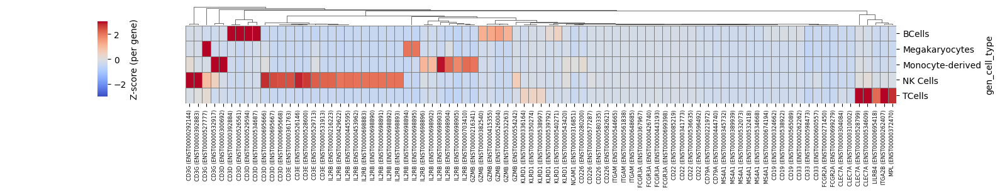

In [8]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
from collections import defaultdict
import re

# --- SETTINGS ---
marker_groups_to_include = ["TCells", "Natural Killer", "BCell", "Monocyte-derived", "Megakaryocyte"]

# --- FORMAT CLEANED ISOFORM LABELS ---
def format_name(x):
    parts = x.split(":")
    return f"{parts[0]} ({parts[-1]})" if len(parts) >= 3 else x

def get_gene_name(label):
    match = re.match(r"^(.+?) \(", label)
    return match.group(1) if match else label

# --- MATCH ISOFORMS ---
matched_isoforms = []
gene_to_group = {}

for group, genes in marker_genes.items():
    if group not in marker_groups_to_include:
        continue
    matches = find_matching_genes(genes, adata_i_filtered.var_names)
    matched_isoforms.extend([m for m in matches if m not in matched_isoforms])  # Deduplicate
    for isoform in matches:
        gene_to_group[isoform] = group

# --- FORMAT COLUMN NAMES ---
clean_names = [format_name(x) for x in matched_isoforms]

# --- EXTRACT EXPRESSION FROM log_denoised LAYER ---
iso_expr = pd.DataFrame(
    adata_i_filtered[:, matched_isoforms].layers["counts"],
    columns=clean_names,
    index=adata_i_filtered.obs["gen_cell_type"]
)

# --- CALCULATE MEAN EXPRESSION PER CELL TYPE ---
mean_expr_iso = iso_expr.groupby(iso_expr.index).mean()
plot_df_iso = mean_expr_iso.copy().sort_index().fillna(0)

# --- REMOVE DUPLICATE COLUMNS ---
plot_df_iso = plot_df_iso.loc[:, ~plot_df_iso.columns.duplicated()]

# --- MAP ISOFORMS TO GENES ---
isoform_to_gene = {name: get_gene_name(name) for name in plot_df_iso.columns}
gene_to_isoforms = defaultdict(list)
for iso, gene in isoform_to_gene.items():
    gene_to_isoforms[gene].append(iso)

# --- GENE-WISE Z-SCORING ACROSS ISOFORMS ---
scaled_by_gene = pd.DataFrame(index=plot_df_iso.index)

for gene, isoforms in gene_to_isoforms.items():
    data = plot_df_iso[isoforms]
    all_values = data.values.flatten()
    mean = all_values.mean()
    std = all_values.std()
    scaled = (data - mean) / std
    scaled_by_gene = pd.concat([scaled_by_gene, scaled], axis=1)

# --- COLOR SCALE ---
norm = TwoSlopeNorm(vmin=-3, vcenter=0, vmax=3)

# --- CLUSTERMAP ---
g = sns.clustermap(scaled_by_gene, cmap="coolwarm", linewidths=0.7, linecolor='gray',
                   figsize=(16, 4), col_cluster=True, row_cluster=False, 
                   cbar_kws={"label": "Z-score (per gene)"},
                   norm=norm)

# --- COLORBAR POSITIONING ---
g.cax.set_position([.1, .6, .01, .3])
g.cax.xaxis.set_label_position('bottom')
g.cax.xaxis.tick_bottom()

# --- X/Y LABEL FIXES ---
g.ax_heatmap.set_xticks(np.arange(len(scaled_by_gene.columns)) + 0.5)
g.ax_heatmap.set_xticklabels(scaled_by_gene.columns, rotation=90, ha='center')
g.ax_heatmap.tick_params(axis='x', labelsize=6)
g.ax_heatmap.set_yticklabels(g.ax_heatmap.get_yticklabels(), rotation=0)

# --- SAVE FIGURE ---
plt.savefig("Intermediate_Files/Paper_Figs/Markers/celltype_marker_isoform_by_gene_raw.pdf",
            dpi=600, transparent=True, bbox_inches="tight")
plt.show()


In [34]:
import pandas as pd

# Pull barcodes and gen_cell_type labels
barcodes = adata_g_filtered.obs_names.to_series()
cell_types = adata_g_filtered.obs["gen_cell_type"]

# Create dataframe to pass to R
cell_type_df = pd.DataFrame({
    "barcode": barcodes.values,
    "gen_cell_type": cell_types.values
})

In [38]:
from pathlib import Path
export_path = Path("soupX_input")
export_path.mkdir(parents=True, exist_ok=True)

In [110]:
# Get isoforms used in heatmap in correct order
isoforms_in_order = plot_df_iso.columns.tolist()

# Split GENENAME:ENSGID:ENSTID → gene_name, ensg_id, transcript_id
split_isoforms = [s.split(":") for s in isoforms_in_order]
df_names = pd.DataFrame(split_isoforms, columns=["gene_name", "ensg_id", "transcript_id"])

# Add column for clean label
df_names["isoform_full"] = isoforms_in_order  # keep original order reference

# Generate output following order
output_lines = []
current_gene = None

for _, row in df_names.iterrows():
    gene = row["gene_name"]
    transcript = row["transcript_id"]

    if gene != current_gene:
        # New gene
        if current_gene is not None:
            output_lines.append("")  # blank line between genes
        output_lines.append(f"{gene}:")
        current_gene = gene

    output_lines.append(f"{transcript}")

# Join into string
output_text = "\n".join(output_lines)

# Print
print(output_text)

# Optional: save to file
#with open("Intermediate_Files/Paper_Figs/Markers/celltype_marker_isoform_list.txt", "w") as f:
#    f.write(output_text)

CD3G:
ENST00000292144
ENST00000392883
ENST00000527777
ENST00000532917

CD3D:
ENST00000300692
ENST00000392884
ENST00000526561
ENST00000529594
ENST00000534687
ENST00000695666
ENST00000695667
ENST00000695668

CD3E:
ENST00000361763
ENST00000526146
ENST00000528600
ENST00000529713
ENST00000531913

IL2RB:
ENST00000216223
ENST00000429622
ENST00000445595
ENST00000453962
ENST00000698883
ENST00000698890
ENST00000698891
ENST00000698892
ENST00000698893
ENST00000698894
ENST00000698895
ENST00000698896
ENST00000698902
ENST00000698903
ENST00000698904
ENST00000698905
ENST00000703410

GZMB:
ENST00000216341
ENST00000382540
ENST00000415355
ENST00000526004
ENST00000532263
ENST00000554242

KLRD1:
ENST00000336164
ENST00000350274
ENST00000538997
ENST00000539792
ENST00000540271
ENST00000543420

NCAM1:
ENST00000316851

CD226:
ENST00000280200
ENST00000577287
ENST00000580335
ENST00000582621

ITGAM:
ENST00000544665
ENST00000561838
ENST00000648685

FCGR3A:
ENST00000367967
ENST00000426740
ENST00000443193
ENST00000699

In [55]:
adata_i_filtered.obs

,cell_ids,sample,n_isoforms_by_counts,log1p_n_genes_by_counts,total_counts_isoforms,log1p_total_counts_isoforms,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,total_counts_hb,...,0.76_log_AutoZI,0.8_log_AutoZI,0.84_log_AutoZI,0.86_log_AutoZI,0.9_log_AutoZI,0.94_log_AutoZI,0.96_log_AutoZI,1.0_log_AutoZI,gen_cell_type,gen_cell_type_reannotated
PBMC1_AAAAAAAAAACACAAA_filtered_mapq_10,PBMC1_AAAAAAAAAACACAAA_filtered_mapq_10,PBMC1,2047,7.624619,3894.89970,8.267680,303.0,5.717028,7.779404,1.0,...,4,4,4,4,4,3,4,2,NK Cells,NK Cells
PBMC1_AAAAAAACATATAGGC_filtered_mapq_10,PBMC1_AAAAAAACATATAGGC_filtered_mapq_10,PBMC1,1229,7.114769,3248.66635,8.086308,129.0,4.867534,3.970860,2.0,...,2,3,3,2,2,2,2,3,TCells,Effector CD4 TCells
PBMC1_AAAAAAAGCATGCCGG_filtered_mapq_10,PBMC1_AAAAAAAGCATGCCGG_filtered_mapq_10,PBMC1,432,6.070738,512.00010,6.240276,20.0,3.044522,3.906249,0.0,...,1,0,0,1,1,1,5,5,TCells,Memory TCells
PBMC1_AAAAAAATCAATACTG_filtered_mapq_10,PBMC1_AAAAAAATCAATACTG_filtered_mapq_10,PBMC1,2855,7.957177,7141.66601,8.873841,590.0,6.381816,8.261378,0.0,...,6,7,7,7,7,7,7,7,Monocyte-derived,Monocyte-derived
PBMC1_AAAAAACAAACACAGC_filtered_mapq_10,PBMC1_AAAAAACAAACACAGC_filtered_mapq_10,PBMC1,1803,7.497762,5489.90894,8.610849,320.0,5.771441,5.828876,0.0,...,0,1,1,0,0,0,0,8,TCells,Effector CD4 TCells
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
PBMC2_CCTTCCTGATATATCA_filtered_mapq_10,PBMC2_CCTTCCTGATATATCA_filtered_mapq_10,PBMC2,798,6.683361,1156.83295,7.054305,104.0,4.653960,8.990062,0.0,...,5,5,5,5,6,6,6,6,BCells,BCells
PBMC2_CCTTCCTTACCCAGAA_filtered_mapq_10,PBMC2_CCTTCCTTACCCAGAA_filtered_mapq_10,PBMC2,985,6.893656,1106.74965,7.010086,81.0,4.406719,7.318728,0.0,...,4,4,4,4,4,3,4,2,NK Cells,NK Cells
PBMC2_CCTTCCTTATTTCAGG_filtered_mapq_10,PBMC2_CCTTCCTTATTTCAGG_filtered_mapq_10,PBMC2,967,6.875232,1768.99980,7.478735,77.0,4.356709,4.352742,0.0,...,2,3,3,2,2,2,2,3,TCells,Effector CD4 TCells
PBMC2_CCTTCCTTCCACATTG_filtered_mapq_10,PBMC2_CCTTCCTTCCACATTG_filtered_mapq_10,PBMC2,504,6.224558,938.99990,6.845880,68.0,4.234107,7.241747,1.0,...,1,0,0,1,1,1,1,0,TCells,Memory TCells


In [69]:
import os
import re
import numpy as np
import pandas as pd
import scipy.sparse as sp
from scipy.stats import pearsonr
from scanpy import read_h5ad

# ---------- CONFIG ----------
output_dir = "Intermediate_Files/Clustering_07282025/"
GENE_H5 = os.path.join(output_dir, "PBMC_gene_AutoZI_clustered_celltypes_reannotated_AutoZILatent_08132025.h5mu")
ISO_H5  = os.path.join(output_dir, "PBMC_iso_AutoZI_clustered_celltypes_reannotated_AutoZILatent_08132025.h5mu")
REF_GTF = "Homo_sapiens.GRCh38.113.gtf"

OUT_SUB = "IsoformQuirks_vsCentroid_Claude"
OUT_DIR = os.path.join(output_dir, OUT_SUB)
os.makedirs(OUT_DIR, exist_ok=True)

# Filters (adjust as needed)
MIN_CELLS_NZ = 10        # isoform must be seen in ≥ this many cells overall
MIN_PREV_ANY = 0.001      # OR present in ≥1% of cells in at least one cell type
MIN_MEAN_EXPR = 0.0001    # minimum mean expression across all cells

# kNN settings
TOP_K_CENTROIDS = 30     # nearest known-gene centroids to keep per novel isoform
SIM_THRESH_C    = 0.30   # minimum Pearson r to accept a centroid neighbor (None to disable)

# Baseline centroid composition
USE_WEIGHTED_CENTROID = True  # weight neighbors by similarity when forming baseline

# ---------- REGEX PATTERNS ----------
_ENSG_RE       = re.compile(r"(ENSG\d{11})")
_ENST_RE       = re.compile(r"(ENST\d{11})")
_BAMBUGENE_RE  = re.compile(r"(BambuGene\d+)")
_BAMBUTX_RE    = re.compile(r"(BambuTx\d+)")

In [70]:
def classify_isoform(v: str) -> str:
    """
    Classify isoforms into categories:
    - reference: SYMBOL:ENSG:ENST or ENSG:ENST (known gene, reference isoform)
    - knownGeneNovelIso: ENSG:BambuTx (known gene, novel isoform)
    - novelGeneNovelIso: BambuGene:BambuTx (novel gene, novel isoform)
    - other: anything else
    """
    v = str(v).strip()
    
    # Reference isoforms: SYMBOL:ENSG:ENST or ENSG:ENST
    if re.search(r"ENSG\d{11}", v) and re.search(r"ENST\d{11}", v):
        return "reference"
    
    # Known gene novel isoform: ENSG:BambuTx
    if re.fullmatch(r"ENSG\d{11}:BambuTx\d+", v):
        return "knownGeneNovelIso"
    
    # Novel gene novel isoform: BambuGene:BambuTx
    if re.fullmatch(r"BambuGene\d+:BambuTx\d+", v):
        return "novelGeneNovelIso"
    
    return "other"

def get_ensg_from_isoform(label: str) -> str:
    """Extract ENSG ID from any isoform label format"""
    match = _ENSG_RE.search(str(label))
    return match.group(1) if match else None

def get_bambugene_from_isoform(label: str) -> str:
    """Extract BambuGene ID from isoform label"""
    match = _BAMBUGENE_RE.search(str(label))
    return match.group(1) if match else None

def normalize_isoform_label(v: str) -> str:
    """
    Normalize isoform labels to consistent format:
    - SYMBOL:ENSG:ENST -> ENSG:ENST
    - ENSG:BambuTx -> ENSG:BambuTx (unchanged)
    - BambuGene:BambuTx -> BambuGene:BambuTx (unchanged)
    """
    v = str(v).strip()
    
    ensg = get_ensg_from_isoform(v)
    enst_match = _ENST_RE.search(v)
    bambu_gene_match = _BAMBUGENE_RE.search(v)
    bambu_tx_match = _BAMBUTX_RE.search(v)
    
    # Reference isoform: normalize to ENSG:ENST
    if ensg and enst_match:
        return f"{ensg}:{enst_match.group(1)}"
    
    # Known gene novel isoform: ENSG:BambuTx
    if ensg and bambu_tx_match:
        return f"{ensg}:{bambu_tx_match.group(1)}"
    
    # Novel gene novel isoform: BambuGene:BambuTx
    if bambu_gene_match and bambu_tx_match:
        return f"{bambu_gene_match.group(1)}:{bambu_tx_match.group(1)}"
    
    return v  # leave other formats unchanged

In [73]:
# ---------- LOAD AND NORMALIZE DATA ----------
print("Loading isoform data...")
adata_i = read_h5ad(ISO_H5)
print(f"Loaded {adata_i.n_obs} cells x {adata_i.n_vars} isoforms")

# Skip gene data loading for now - only needed if we use it later
# adata_g = read_h5ad(GENE_H5)

print("Normalizing isoform labels...")
isoform_names = adata_i.var_names.astype(str)

# Vectorized classification - much faster than .map()
print("\nClassifying isoforms...")

# Pre-compile patterns for speed
has_ensg_enst = pd.Series(isoform_names).str.contains(r'ENSG\d{11}.*ENST\d{11}', regex=True)
is_ensg_bambu = pd.Series(isoform_names).str.match(r'^ENSG\d{11}:BambuTx\d+$', na=False)
is_novel_bambu = pd.Series(isoform_names).str.match(r'^BambuGene\d+:BambuTx\d+$', na=False)

before_counts = pd.Series('other', index=range(len(isoform_names)))
before_counts[has_ensg_enst] = 'reference'
before_counts[is_ensg_bambu] = 'knownGeneNovelIso'  
before_counts[is_novel_bambu] = 'novelGeneNovelIso'

print("BEFORE normalization:")
print("Isoform classification:", dict(before_counts.value_counts()))

# Vectorized normalization
print("Normalizing labels...")
normalized_names = pd.Series(isoform_names).copy()

# Only normalize the ones that need it - much faster
needs_norm = ~(is_ensg_bambu | is_novel_bambu)
if needs_norm.any():
    print(f"Normalizing {needs_norm.sum()} labels...")
    normalized_names[needs_norm] = normalized_names[needs_norm].apply(normalize_isoform_label)

adata_i.var_names = normalized_names.values

# Quick recheck on normalized data
print("\nAFTER normalization:")
norm_series = pd.Series(normalized_names)
has_ensg_enst_norm = norm_series.str.contains(r'ENSG\d{11}.*ENST\d{11}', regex=True)
is_ensg_bambu_norm = norm_series.str.match(r'^ENSG\d{11}:BambuTx\d+$', na=False)
is_novel_bambu_norm = norm_series.str.match(r'^BambuGene\d+:BambuTx\d+$', na=False)

after_counts = pd.Series('other', index=range(len(normalized_names)))
after_counts[has_ensg_enst_norm] = 'reference'
after_counts[is_ensg_bambu_norm] = 'knownGeneNovelIso'
after_counts[is_novel_bambu_norm] = 'novelGeneNovelIso'

print("Isoform classification:", dict(after_counts.value_counts()))

Loading isoform data...
Loaded 33018 cells x 87279 isoforms
Normalizing isoform labels...

Classifying isoforms...
BEFORE normalization:
Isoform classification: {'reference': np.int64(87153), 'novelGeneNovelIso': np.int64(67), 'knownGeneNovelIso': np.int64(59)}
Normalizing labels...
Normalizing 87153 labels...

AFTER normalization:
Isoform classification: {'reference': np.int64(87153), 'novelGeneNovelIso': np.int64(67), 'knownGeneNovelIso': np.int64(59)}


In [74]:
# ---------- CELL TYPE SELECTION ----------
CAND_CT_COLS = [
    "sub_cell_type", "gen_cell_type_reannotated",
]
ct_col = None
for c in CAND_CT_COLS:
    if c in adata_i.obs:
        ct_col = c
        break

if ct_col is None:
    raise ValueError(f"Could not find a cell-type column in adata_i.obs; "
                     f"looked for: {CAND_CT_COLS}")

print(f"Using cell type column: {ct_col}")

Using cell type column: sub_cell_type


In [75]:
# ---------- PREPARE MATRICES ----------
print("Preparing expression matrices...")
X = adata_i.X
if not sp.isspmatrix_csr(X):
    X = sp.csr_matrix(X)

isoforms = adata_i.var_names.astype(str).to_numpy()
cts = adata_i.obs[ct_col].astype("category")
ct_codes = cts.cat.codes.to_numpy()
ct_names = list(cts.cat.categories)
n_ct = len(ct_names)

print(f"Data shape: {X.shape[0]} cells x {X.shape[1]} isoforms")
print(f"Cell types ({n_ct}): {ct_names}")


Preparing expression matrices...
Data shape: 33018 cells x 87279 isoforms
Cell types (8): ['BCells', 'Cytotoxic TCells', 'Effector CD4 TCells', 'Effector-Memory Transition TCells', 'Megakaryocytes', 'Memory TCells', 'Monocyte-derived', 'NK Cells']


In [76]:
# ---------- CLASSIFY ISOFORMS ----------
s = pd.Series(isoforms, dtype=str)
classifications = s.map(classify_isoform)

mask_reference = (classifications == "reference").values
mask_known_novel = (classifications == "knownGeneNovelIso").values  
mask_novel_gene = (classifications == "novelGeneNovelIso").values

print(f"\nIsoform masks:")
print(f"Reference isoforms: {mask_reference.sum()}")
print(f"Known gene novel isoforms: {mask_known_novel.sum()}")
print(f"Novel gene isoforms: {mask_novel_gene.sum()}")


Isoform masks:
Reference isoforms: 87153
Known gene novel isoforms: 59
Novel gene isoforms: 67


In [80]:
# ---------- FILTERING ----------
print("Applying filters...")

# Compute global nonzero counts (this was missing in original code!)
print("Computing expression statistics...")
global_nz = np.array((X > 0).sum(axis=0)).ravel()
mean_expr = np.array(X.mean(axis=0)).ravel()

# Diagnostic information
print(f"Expression statistics:")
print(f"  Global nonzero counts - min: {global_nz.min()}, max: {global_nz.max()}, median: {np.median(global_nz)}")
print(f"  Mean expression - min: {mean_expr.min()}, max: {mean_expr.max()}, median: {np.median(mean_expr)}")
print(f"  Isoforms with >0 cells: {(global_nz > 0).sum()}/{len(global_nz)}")
print(f"  Isoforms with ≥{MIN_CELLS_NZ} cells: {(global_nz >= MIN_CELLS_NZ).sum()}/{len(global_nz)}")
print(f"  Isoforms with mean expr ≥{MIN_MEAN_EXPR}: {(mean_expr >= MIN_MEAN_EXPR).sum()}/{len(global_nz)}")

# Apply global filters
keep_nz = global_nz >= MIN_CELLS_NZ
#keep_expr = mean_expr >= MIN_MEAN_EXPR
keep_global = keep_nz #& keep_expr

print(f"\nFilter results:")
print(f"  Pass nonzero filter: {keep_nz.sum()}")
print(f"  Pass expression filter: {keep_expr.sum()}")  
print(f"  Pass both filters: {keep_global.sum()}")

if keep_global.sum() == 0:
    print("\n⚠️  NO ISOFORMS PASS FILTERS! Relaxing criteria...")
    # Emergency fallback - just use nonzero filter
    keep_global = global_nz > 0
    print(f"Using relaxed filter: {keep_global.sum()} isoforms with any expression")
    
if keep_global.sum() < 100:
    print(f"\n⚠️  Very few isoforms pass filters ({keep_global.sum()}). Consider:")
    print(f"    - Lowering MIN_CELLS_NZ from {MIN_CELLS_NZ}")
    print(f"    - Lowering MIN_MEAN_EXPR from {MIN_MEAN_EXPR}")

print(f"\nIsoforms passing global filters: {keep_global.sum()}/{len(isoforms)}")

# Apply filters
iso_kept = isoforms[keep_global]
X_filt = X[:, keep_global]
mask_ref_filt = mask_reference[keep_global]
mask_known_filt = mask_known_novel[keep_global]
mask_novel_filt = mask_novel_gene[keep_global]

Applying filters...
Computing expression statistics...
Expression statistics:
  Global nonzero counts - min: 152, max: 24115, median: 10543.0
  Mean expression - min: -0.024254826828837395, max: 0.004009557887911797, median: -0.003283294616267085
  Isoforms with >0 cells: 87279/87279
  Isoforms with ≥10 cells: 87279/87279
  Isoforms with mean expr ≥0.0001: 37/87279

Filter results:
  Pass nonzero filter: 87279
  Pass expression filter: 37
  Pass both filters: 87279

Isoforms passing global filters: 87279/87279


In [81]:
# ---------- PER-CELL-TYPE STATISTICS ----------
def compute_ct_stats_csr(X_sub, codes, n_ct):
    """Compute per-cell-type means and prevalences for sparse matrix"""
    k = X_sub.shape[1]
    means = np.zeros((n_ct, k), dtype=np.float32)
    prev = np.zeros((n_ct, k), dtype=np.float32)
    
    for i in range(n_ct):
        sel = (codes == i)
        if not np.any(sel): 
            continue
        Xi = X_sub[sel, :]
        c = int(sel.sum())
        means[i, :] = np.asarray(Xi.sum(axis=0)).ravel() / max(c, 1)
        prev[i, :] = np.asarray((Xi > 0).sum(axis=0)).ravel() / max(c, 1)
    
    return means, prev

print("Computing per-cell-type statistics...")
means_ct, prev_ct = compute_ct_stats_csr(X_filt, ct_codes, n_ct)

# Apply prevalence filter
keep_prev = (prev_ct.max(axis=0) >= MIN_PREV_ANY)
if not np.any(keep_prev):
    raise RuntimeError("All isoforms removed by prevalence filter.")

print(f"Isoforms passing prevalence filter: {keep_prev.sum()}/{len(iso_kept)}")

# Final filtered data
iso_final = iso_kept[keep_prev]
means_final = means_ct[:, keep_prev]
mask_ref_final = mask_ref_filt[keep_prev]
mask_known_final = mask_known_filt[keep_prev]
mask_novel_final = mask_novel_filt[keep_prev]

print(f"\nFinal counts:")
print(f"Reference isoforms: {mask_ref_final.sum()}")
print(f"Known gene novel isoforms: {mask_known_final.sum()}")
print(f"Novel gene isoforms: {mask_novel_final.sum()}")

Computing per-cell-type statistics...
Isoforms passing prevalence filter: 87279/87279

Final counts:
Reference isoforms: 87153
Known gene novel isoforms: 59
Novel gene isoforms: 67


In [82]:
# ---------- Z-SCORE NORMALIZATION ----------
def zscore_across_celltypes(means_ct_iso):
    """Z-score normalize each isoform across cell types"""
    M = means_ct_iso.astype(np.float32, copy=True)
    mu = M.mean(axis=0, keepdims=True)
    sd = M.std(axis=0, ddof=0, keepdims=True)
    sd[sd == 0] = 1.0  # avoid division by zero
    return (M - mu) / sd

print("Z-score normalizing across cell types...")
Z_ct_iso = zscore_across_celltypes(means_final)  # n_ct x n_iso
Z_iso_ct = Z_ct_iso.T  # n_iso x n_ct

Z-score normalizing across cell types...


In [83]:
 #---------- BUILD REFERENCE CENTROIDS ----------
print("Building reference gene centroids...")
ref_indices = np.flatnonzero(mask_ref_final)
if ref_indices.size == 0:
    raise RuntimeError("No reference isoforms remaining to build centroids.")

# Create reference dataframe with ENSG mapping
ref_df = pd.DataFrame({
    "isoform": iso_final[ref_indices],
    "ENSG": [get_ensg_from_isoform(x) for x in iso_final[ref_indices]]
})

# Remove any that couldn't be mapped to ENSG
ref_df = ref_df.dropna(subset=["ENSG"])
print(f"Reference isoforms mapped to ENSG: {len(ref_df)}")

# Build centroids by averaging reference isoforms per gene
centroids = []
ensg_order = []

for ensg, group in ref_df.groupby("ENSG"):
    # Get indices in the ref_indices array
    iso_names = group["isoform"].values
    iso_mask = np.isin(iso_final[ref_indices], iso_names)
    local_indices = np.flatnonzero(iso_mask)
    global_indices = ref_indices[local_indices]
    
    if len(global_indices) == 0:
        continue
    
    # Average z-scores across isoforms of this gene
    gene_profiles = Z_iso_ct[global_indices, :]  # isoforms x cell_types
    centroid = gene_profiles.mean(axis=0)
    
    centroids.append(centroid)
    ensg_order.append(ensg)

centroid_matrix = np.vstack(centroids)  # n_genes x n_ct
centroid_df = pd.DataFrame({"ENSG": ensg_order})

print(f"Built centroids for {len(ensg_order)} genes")

Building reference gene centroids...
Reference isoforms mapped to ENSG: 87153
Built centroids for 20147 genes


In [84]:
# ---------- SIMILARITY AND BASELINE FUNCTIONS ----------
def find_top_similar_centroids(query_vec, centroid_mat, k, thresh=None):
    """Find top-k most similar centroids to query vector"""
    n_centroids = centroid_mat.shape[0]
    similarities = np.zeros(n_centroids, dtype=np.float32)
    
    for i in range(n_centroids):
        r, _ = pearsonr(query_vec, centroid_mat[i])
        similarities[i] = r if not np.isnan(r) else 0.0
    
    # Sort by similarity (descending)
    sorted_indices = np.argsort(similarities)[::-1]
    
    # Apply threshold if specified
    if thresh is not None:
        valid_mask = similarities[sorted_indices] >= thresh
        sorted_indices = sorted_indices[valid_mask]
    
    # Take top k
    top_indices = sorted_indices[:k]
    top_sims = similarities[top_indices]
    
    return top_indices, top_sims

def compute_weighted_baseline(neighbor_indices, neighbor_sims, centroid_mat):
    """Compute baseline from neighbor centroids"""
    if len(neighbor_indices) == 0:
        return np.zeros(centroid_mat.shape[1])
    
    neighbor_centroids = centroid_mat[neighbor_indices, :]
    
    if USE_WEIGHTED_CENTROID:
        weights = np.maximum(neighbor_sims, 0)  # ensure non-negative
        if weights.sum() == 0:
            baseline = neighbor_centroids.mean(axis=0)
        else:
            weights = weights / weights.sum()  # normalize
            baseline = (neighbor_centroids * weights[:, None]).sum(axis=0)
    else:
        baseline = neighbor_centroids.mean(axis=0)
    
    return baseline

In [85]:
# ---------- ANALYSIS FUNCTIONS ----------
def analyze_novel_isoforms(novel_mask, label, gene_id_func):
    """Analyze a set of novel isoforms"""
    novel_indices = np.flatnonzero(novel_mask)
    
    if len(novel_indices) == 0:
        print(f"No {label} isoforms to analyze")
        return
    
    print(f"Analyzing {len(novel_indices)} {label} isoforms...")
    
    neighbor_results = []
    residual_results = []
    
    for idx in novel_indices:
        isoform = iso_final[idx]
        query_profile = Z_iso_ct[idx, :]  # z-score profile across cell types
        
        # Find similar reference gene centroids
        neighbor_idx, neighbor_sims = find_top_similar_centroids(
            query_profile, centroid_matrix, TOP_K_CENTROIDS, SIM_THRESH_C
        )
        
        # Store neighbor information
        if len(neighbor_idx) == 0:
            neighbor_ensgs = ""
            neighbor_sim_str = ""
        else:
            neighbor_ensgs = ";".join(centroid_df.iloc[neighbor_idx]["ENSG"].values)
            neighbor_sim_str = ";".join([f"{s:.3f}" for s in neighbor_sims])
        
        gene_id = gene_id_func(isoform)
        neighbor_results.append({
            "isoform": isoform,
            "gene_id": gene_id,
            "neighbors_ENSG": neighbor_ensgs,
            "neighbors_similarity": neighbor_sim_str
        })
        
        # Compute baseline and residuals
        if len(neighbor_idx) > 0:
            baseline = compute_weighted_baseline(neighbor_idx, neighbor_sims, centroid_matrix)
            residuals = query_profile - baseline
            
            # Store per-cell-type residuals
            for ct_idx, ct_name in enumerate(ct_names):
                residual_results.append({
                    "isoform": isoform,
                    "gene_id": gene_id,
                    "cell_type": ct_name,
                    "isoform_z": float(query_profile[ct_idx]),
                    "baseline_z": float(baseline[ct_idx]),
                    "residual": float(residuals[ct_idx])
                })
    
    # Save results
    neighbor_df = pd.DataFrame(neighbor_results)
    residual_df = pd.DataFrame(residual_results)
    
    # File paths
    neighbor_file = os.path.join(OUT_DIR, f"{label}_neighbors.tsv")
    residual_file = os.path.join(OUT_DIR, f"{label}_residuals_long.tsv")
    
    neighbor_df.to_csv(neighbor_file, sep="\t", index=False)
    residual_df.to_csv(residual_file, sep="\t", index=False)
    
    print(f"Saved {label} neighbors: {neighbor_file}")
    print(f"Saved {label} residuals: {residual_file}")
    
    # Top-5 divergent cell types per isoform
    if not residual_df.empty:
        top5_df = (
            residual_df.assign(abs_residual=lambda x: x["residual"].abs())
            .sort_values(["isoform", "abs_residual"], ascending=[True, False])
            .groupby("isoform")
            .head(5)
            .drop(columns=["abs_residual"])
        )
        
        top5_file = os.path.join(OUT_DIR, f"{label}_top5_divergent_celltypes.tsv")
        top5_df.to_csv(top5_file, sep="\t", index=False)
        print(f"Saved {label} top-5 divergent: {top5_file}")


In [86]:
# ---------- RUN ANALYSIS ----------
print("\n" + "="*60)
print("RUNNING ANALYSIS")
print("="*60)

# Analyze known gene novel isoforms
analyze_novel_isoforms(
    mask_known_final, 
    "knownGeneNovelIso", 
    get_ensg_from_isoform
)

print()

# Analyze novel gene isoforms
analyze_novel_isoforms(
    mask_novel_final, 
    "novelGeneNovelIso", 
    get_bambugene_from_isoform
)

print("\nAnalysis complete!")
print(f"Results saved in: {OUT_DIR}")


RUNNING ANALYSIS
Analyzing 59 knownGeneNovelIso isoforms...
Saved knownGeneNovelIso neighbors: Intermediate_Files/Clustering_07282025/IsoformQuirks_vsCentroid_Claude/knownGeneNovelIso_neighbors.tsv
Saved knownGeneNovelIso residuals: Intermediate_Files/Clustering_07282025/IsoformQuirks_vsCentroid_Claude/knownGeneNovelIso_residuals_long.tsv
Saved knownGeneNovelIso top-5 divergent: Intermediate_Files/Clustering_07282025/IsoformQuirks_vsCentroid_Claude/knownGeneNovelIso_top5_divergent_celltypes.tsv

Analyzing 67 novelGeneNovelIso isoforms...
Saved novelGeneNovelIso neighbors: Intermediate_Files/Clustering_07282025/IsoformQuirks_vsCentroid_Claude/novelGeneNovelIso_neighbors.tsv
Saved novelGeneNovelIso residuals: Intermediate_Files/Clustering_07282025/IsoformQuirks_vsCentroid_Claude/novelGeneNovelIso_residuals_long.tsv
Saved novelGeneNovelIso top-5 divergent: Intermediate_Files/Clustering_07282025/IsoformQuirks_vsCentroid_Claude/novelGeneNovelIso_top5_divergent_celltypes.tsv

Analysis compl

In [88]:
# =========================================================
# QA sanity checks for isoform vs centroid outputs (SPLIT)
# - Flags isoforms with large residuals in top-5 CTs
# - Verifies neighbor lists aren't empty
# - Prints tuning suggestions if needed
# =========================================================
import os
import pandas as pd
import numpy as np

# ---- Paths (adjust if different) ----
output_dir = "Intermediate_Files/Clustering_07282025/"
SPLIT_DIR = os.path.join(output_dir, "IsoformQuirks_vsCentroid_Claude")
QA_DIR = os.path.join(SPLIT_DIR, "QA")
os.makedirs(QA_DIR, exist_ok=True)

# Files produced by the split pipeline
TOP5_KNOWN = os.path.join(SPLIT_DIR, "knownGeneNovelIso_top5_divergent_celltypes.tsv")
TOP5_NOVEL = os.path.join(SPLIT_DIR, "novelGeneNovelIso_top5_divergent_celltypes.tsv")
NEI_KNOWN  = os.path.join(SPLIT_DIR, "knownGeneNovelIso_neighbors.tsv")
NEI_NOVEL  = os.path.join(SPLIT_DIR, "novelGeneNovelIso_neighbors.tsv")

# ---- Thresholds ----
RESIDUAL_WARN  = 1.0   # "large" residual (|z| > 1.0)
RESIDUAL_ALERT = 1.5   # "very large" residual (|z| > 1.5)
EMPTY_NEIGHBOR_TOLERANCE = 0.20  # if >20% empty, suggest parameter tweaks

def load_if_exists(path):
    if os.path.isfile(path):
        return pd.read_csv(path, sep="\t")
    print(f"⚠️  Missing file (skipping): {path}")
    return None

def summarize_residuals(top5_df, label):
    """
    From a top5-divergent-celltypes file, compute per-isoform max|residual|,
    count CTs above thresholds, and list those CTs.
    """
    if top5_df is None or top5_df.empty:
        print(f"— {label}: no data.")
        return None

    df = top5_df.copy()
    if "residual" not in df.columns or "isoform" not in df.columns or "cell_type" not in df.columns:
        # Older naming? try novel_isoform
        if "novel_isoform" in df.columns:
            df = df.rename(columns={"novel_isoform": "isoform"})
        assert {"isoform", "cell_type", "residual"} <= set(df.columns), \
            f"{label}: expected columns isoform/cell_type/residual."

    df["abs_residual"] = df["residual"].abs()

    # Per-isoform summary
    grp = df.groupby("isoform", as_index=False).agg(
        max_abs_residual=("abs_residual", "max"),
        n_ct_over_warn=("abs_residual", lambda x: int((x >= RESIDUAL_WARN).sum())),
        n_ct_over_alert=("abs_residual", lambda x: int((x >= RESIDUAL_ALERT).sum()))
    )

    # Collect CT lists per isoform for each threshold
    over_warn = (df[df["abs_residual"] >= RESIDUAL_WARN]
                 .groupby("isoform")["cell_type"]
                 .agg(lambda s: ";".join(sorted(s.unique())))).rename("cts_over_warn")
    over_alert = (df[df["abs_residual"] >= RESIDUAL_ALERT]
                  .groupby("isoform")["cell_type"]
                  .agg(lambda s: ";".join(sorted(s.unique())))).rename("cts_over_alert")

    out = grp.merge(over_warn, on="isoform", how="left") \
             .merge(over_alert, on="isoform", how="left") \
             .sort_values(["n_ct_over_alert", "max_abs_residual"], ascending=[False, False])

    out_path = os.path.join(QA_DIR, f"{label}_residual_QA.tsv")
    out.to_csv(out_path, sep="\t", index=False)

    print(f"✅ {label}: residual QA written → {out_path}")
    print(f"   Isoforms: {len(out):>4} | "
          f"with ≥1 CT |residual|≥{RESIDUAL_ALERT}: {int((out['n_ct_over_alert']>0).sum())} | "
          f"with ≥1 CT |residual|≥{RESIDUAL_WARN}: {int((out['n_ct_over_warn']>0).sum())}")
    return out

def check_neighbors(nei_df, label):
    """
    Check how many isoforms have empty neighbor lists.
    """
    if nei_df is None or nei_df.empty:
        print(f"— {label}: no neighbors table.")
        return None

    df = nei_df.copy()
    if "isoform" not in df.columns:
        # Older naming? try novel_isoform
        if "novel_isoform" in df.columns:
            df = df.rename(columns={"novel_isoform": "isoform"})
        assert "isoform" in df.columns, f"{label}: expected an 'isoform' column."

    if "neighbors_ENSG" not in df.columns:
        raise ValueError(f"{label}: expected 'neighbors_ENSG' column.")

    df["neighbors_ENSG"] = df["neighbors_ENSG"].fillna("")
    df["has_neighbors"] = df["neighbors_ENSG"].str.len() > 0

    total = len(df)
    empty = int((~df["has_neighbors"]).sum())
    frac_empty = empty / total if total else 0.0

    out_path = os.path.join(QA_DIR, f"{label}_neighbor_QA.tsv")
    df[["isoform","has_neighbors","neighbors_ENSG"]].to_csv(out_path, sep="\t", index=False)

    print(f"✅ {label}: neighbor QA → {out_path}")
    print(f"   Isoforms: {total:>4} | empty neighbor lists: {empty:>4} ({frac_empty:.1%})")

    if frac_empty > EMPTY_NEIGHBOR_TOLERANCE:
        print(f"⚠️  {label}: High empty-neighbor rate. Consider:")
        print("   • Lower SIM_THRESH_C from 0.30 → 0.20")
        print("   • Increase TOP_K_CENTROIDS from 30 → 50")
    return {"total": total, "empty": empty, "frac_empty": frac_empty}

# ---- Run on both classes ----
top5_known = load_if_exists(TOP5_KNOWN)
top5_novel = load_if_exists(TOP5_NOVEL)
nei_known  = load_if_exists(NEI_KNOWN)
nei_novel  = load_if_exists(NEI_NOVEL)

res_known = summarize_residuals(top5_known, "knownGeneNovelIso")
res_novel = summarize_residuals(top5_novel, "novelGeneNovelIso")

chk_known = check_neighbors(nei_known, "knownGeneNovelIso")
chk_novel = check_neighbors(nei_novel, "novelGeneNovelIso")

print("\n—— Summary ———————————————————————————————")
if res_known is not None:
    print(f"knownGeneNovelIso: median max|residual| = {res_known['max_abs_residual'].median():.2f}")
if res_novel is not None:
    print(f"novelGeneNovelIso:  median max|residual| = {res_novel['max_abs_residual'].median():.2f}")

if chk_known is not None and chk_novel is not None:
    frac_empty_all = (chk_known["empty"] + chk_novel["empty"]) / max(1, (chk_known["total"] + chk_novel["total"]))
    if frac_empty_all > EMPTY_NEIGHBOR_TOLERANCE:
        print(f"\n⚠️  Overall empty-neighbor rate {frac_empty_all:.1%} exceeds {EMPTY_NEIGHBOR_TOLERANCE:.0%}. Suggested tweaks:")
        print("   • Set SIM_THRESH_C = 0.20")
        print("   • Set TOP_K_CENTROIDS = 50")
    else:
        print("\n✅ Neighbor coverage looks OK overall.")

✅ knownGeneNovelIso: residual QA written → Intermediate_Files/Clustering_07282025/IsoformQuirks_vsCentroid_Claude/QA/knownGeneNovelIso_residual_QA.tsv
   Isoforms:   59 | with ≥1 CT |residual|≥1.5: 0 | with ≥1 CT |residual|≥1.0: 0
✅ novelGeneNovelIso: residual QA written → Intermediate_Files/Clustering_07282025/IsoformQuirks_vsCentroid_Claude/QA/novelGeneNovelIso_residual_QA.tsv
   Isoforms:   67 | with ≥1 CT |residual|≥1.5: 0 | with ≥1 CT |residual|≥1.0: 1
✅ knownGeneNovelIso: neighbor QA → Intermediate_Files/Clustering_07282025/IsoformQuirks_vsCentroid_Claude/QA/knownGeneNovelIso_neighbor_QA.tsv
   Isoforms:   59 | empty neighbor lists:    0 (0.0%)
✅ novelGeneNovelIso: neighbor QA → Intermediate_Files/Clustering_07282025/IsoformQuirks_vsCentroid_Claude/QA/novelGeneNovelIso_neighbor_QA.tsv
   Isoforms:   67 | empty neighbor lists:    0 (0.0%)

—— Summary ———————————————————————————————
knownGeneNovelIso: median max|residual| = 0.25
novelGeneNovelIso:  median max|residual| = 0.26

✅ Ne

In [89]:
# ==========================================
# Step 2: Batch plots for ALL isoforms
#  - For each isoform: bar plot of isoform_z vs baseline_z + connectors
#  - Saves one PDF per isoform AND a multi-page PDF per class
# ==========================================
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages

output_dir = "Intermediate_Files/Clustering_07282025/"
SPLIT_DIR = os.path.join(output_dir, "IsoformQuirks_vsCentroid_Claude")
PLOT_DIR  = os.path.join(SPLIT_DIR, "plots")
os.makedirs(PLOT_DIR, exist_ok=True)

def load_residuals(label):
    path = os.path.join(SPLIT_DIR, f"{label}_residuals_long.tsv")
    if not os.path.isfile(path):
        raise FileNotFoundError(path)
    df = pd.read_csv(path, sep="\t")
    # Accept older column name
    if "novel_isoform" in df.columns and "isoform" not in df.columns:
        df = df.rename(columns={"novel_isoform":"isoform"})
    return df

def plot_one_isoform(df_long, isoform, savepath=None):
    d = df_long[df_long["isoform"] == isoform].copy()
    if d.empty:
        return False
    d = d.sort_values("isoform_z", ascending=False).reset_index(drop=True)
    x = np.arange(len(d))
    iso_z = d["isoform_z"].to_numpy()
    base_z = d["baseline_z"].to_numpy()

    fig, ax = plt.subplots(figsize=(max(6, 0.45*len(d)), 4))
    ax.bar(x - 0.2, iso_z, width=0.4, label="Isoform (z)")
    ax.bar(x + 0.2, base_z, width=0.4, label="Baseline (z)")
    for j in range(len(d)):
        ax.plot([x[j], x[j]], [base_z[j], iso_z[j]], linewidth=1)
    ax.set_xticks(x)
    ax.set_xticklabels(d["cell_type"], rotation=45, ha="right")
    ax.set_ylabel("Z-scored expression")
    ax.set_title(f"{isoform}: isoform vs centroid baseline")
    ax.legend(frameon=False)
    plt.tight_layout()
    if savepath:
        plt.savefig(savepath, dpi=300, bbox_inches="tight")
        plt.close(fig)
    else:
        plt.show()
    return True

def batch_plot(label):
    df = load_residuals(label)
    klass_dir = os.path.join(PLOT_DIR, label)
    os.makedirs(klass_dir, exist_ok=True)

    # Per-isoform PDFs
    isoforms = df["isoform"].unique().tolist()
    n_plotted = 0
    for iso in isoforms:
        outp = os.path.join(klass_dir, f"{iso.replace(':','_')}_vs_centroid.pdf")
        ok = plot_one_isoform(df, iso, savepath=outp)
        if ok: n_plotted += 1

    # Multi-page PDF
    multipath = os.path.join(klass_dir, f"{label}_ALL_vs_centroid_multipage.pdf")
    with PdfPages(multipath) as pdf:
        for iso in isoforms:
            d = df[df["isoform"] == iso].copy()
            if d.empty: continue
            d = d.sort_values("isoform_z", ascending=False).reset_index(drop=True)
            x = np.arange(len(d))
            iso_z = d["isoform_z"].to_numpy()
            base_z = d["baseline_z"].to_numpy()
            fig, ax = plt.subplots(figsize=(max(6, 0.45*len(d)), 4))
            ax.bar(x - 0.2, iso_z, width=0.4, label="Isoform (z)")
            ax.bar(x + 0.2, base_z, width=0.4, label="Baseline (z)")
            for j in range(len(d)):
                ax.plot([x[j], x[j]], [base_z[j], iso_z[j]], linewidth=1)
            ax.set_xticks(x)
            ax.set_xticklabels(d["cell_type"], rotation=45, ha="right")
            ax.set_ylabel("Z-scored expression")
            ax.set_title(f"{iso}: isoform vs centroid baseline")
            ax.legend(frameon=False)
            plt.tight_layout()
            pdf.savefig(fig, dpi=300, bbox_inches="tight")
            plt.close(fig)

    print(f"✅ Plotted {n_plotted} isoforms for {label}")
    print(f"   Per-isoform PDFs → {klass_dir}")
    print(f"   Multi-page PDF   → {multipath}")

# Run for both classes
batch_plot("knownGeneNovelIso")
batch_plot("novelGeneNovelIso")

✅ Plotted 59 isoforms for knownGeneNovelIso
   Per-isoform PDFs → Intermediate_Files/Clustering_07282025/IsoformQuirks_vsCentroid_Claude/plots/knownGeneNovelIso
   Multi-page PDF   → Intermediate_Files/Clustering_07282025/IsoformQuirks_vsCentroid_Claude/plots/knownGeneNovelIso/knownGeneNovelIso_ALL_vs_centroid_multipage.pdf
✅ Plotted 67 isoforms for novelGeneNovelIso
   Per-isoform PDFs → Intermediate_Files/Clustering_07282025/IsoformQuirks_vsCentroid_Claude/plots/novelGeneNovelIso
   Multi-page PDF   → Intermediate_Files/Clustering_07282025/IsoformQuirks_vsCentroid_Claude/plots/novelGeneNovelIso/novelGeneNovelIso_ALL_vs_centroid_multipage.pdf


In [90]:
# ==========================================================
# Step 3 (symbol-space): GO enrichment for both classes
#  - Study sets: neighbors_ENSG -> map to HGNC symbols (from GRCh38 GTF)
#  - Associations: symbol -> GO (BP/MF/CC) built from GOA Human GAF
#  - Per isoform & per host (ENSG host for known, BambuGene for novel)
# ==========================================================
import os, re, gzip, shutil, urllib.request
import pandas as pd
from goatools.obo_parser import GODag
from goatools.go_enrichment import GOEnrichmentStudy

# ------------------ PATHS ------------------
output_dir = "Intermediate_Files/Clustering_07282025/"
SPLIT_DIR  = os.path.join(output_dir, "IsoformQuirks_vsCentroid_Claude")
GO_DIR     = os.path.join(SPLIT_DIR, "go_files")
os.makedirs(GO_DIR, exist_ok=True)

# GO resources
OBO_PATH = os.path.join(GO_DIR, "go-basic.obo")
GAF_GZ   = os.path.join(GO_DIR, "goa_human.gaf.gz")
GAF_PATH = os.path.join(GO_DIR, "goa_human.gaf")
OBO_URL  = "http://geneontology.org/ontology/go-basic.obo"
GAF_URL  = "http://current.geneontology.org/annotations/goa_human.gaf.gz"

# Reference GTF (for ENSG->symbol)
REF_GTF = ("Homo_sapiens.GRCh38.113.gtf")

# ------------------ CONFIG ------------------
MIN_STUDY = 3   # try 2 temporarily if sparse
ASPECTS   = [("biological_process","BP"),
             ("molecular_function","MF"),
             ("cellular_component","CC")]

# ------------------ HELPERS ------------------
def ensure_go_files():
    if not os.path.isfile(OBO_PATH):
        urllib.request.urlretrieve(OBO_URL, OBO_PATH)
    if not os.path.isfile(GAF_PATH):
        if not os.path.isfile(GAF_GZ):
            urllib.request.urlretrieve(GAF_URL, GAF_GZ)
        with gzip.open(GAF_GZ, "rb") as fi, open(GAF_PATH, "wb") as fo:
            shutil.copyfileobj(fi, fo)

def build_ensg_to_symbol_from_ref_gtf(gtf_path):
    if not os.path.isfile(gtf_path):
        return {}
    gtf = pd.read_csv(
        gtf_path, sep="\t", comment="#", header=None, dtype=str,
        names=["chrom","source","feature","start","end","score","strand","frame","attribute"]
    )
    genes = gtf[gtf["feature"] == "gene"].copy()
    genes["gene_id"]   = genes["attribute"].str.extract(r'gene_id "([^"]+)"', expand=False)
    genes["gene_name"] = genes["attribute"].str.extract(r'gene_name "([^"]+)"', expand=False)
    return (genes.dropna(subset=["gene_id","gene_name"])
                 .drop_duplicates("gene_id")
                 .set_index("gene_id")["gene_name"]
                 .to_dict())

def build_symbol2gos_from_gaf(gaf_path, namespace="biological_process", debug_tag=None):
    """
    Build symbol -> set(GO) using GOA Human GAF 2.2.
    - GO ID = p[4], Aspect = p[8] (P/F/C), official gene symbol = p[2].
    - Robust to extra whitespace; uppercases symbols for consistent matching.
    """
    asp = {"biological_process":"P","molecular_function":"F","cellular_component":"C"}[namespace]
    sym2go = {}
    with open(gaf_path, "r", encoding="utf-8") as fh:
        for line in fh:
            if not line or line.startswith("!"):
                continue
            p = line.rstrip("\n").split("\t")
            if len(p) < 9:
                continue
            go_id, aspect = p[4], p[8]
            if aspect != asp or not go_id.startswith("GO:"):
                continue
            # DB_Object_Symbol is column index 2 in GAF 2.2 (0-based)
            sym = (p[2] or "").strip()
            if not sym:
                continue
            sym = sym.upper()
            sym2go.setdefault(sym, set()).add(go_id)
    if debug_tag:
        print(f"{debug_tag}: symbols mapped = {len(sym2go)}; examples: {list(sym2go.keys())[:5]}")
    return sym2go

def parse_class_neighbors(label):
    path = os.path.join(SPLIT_DIR, f"{label}_neighbors.tsv")
    if not os.path.isfile(path):
        print(f"⚠️ Missing neighbors file: {path}")
        return pd.DataFrame()
    df = pd.read_csv(path, sep="\t")
    if "isoform" not in df.columns and "novel_isoform" in df.columns:
        df = df.rename(columns={"novel_isoform":"isoform"})
    return df

_ENSG_RE = re.compile(r"(ENSG\d{11})")

def normalize_ensg_list(raw_field: str) -> list[str]:
    """Split a neighbors_ENSG field and extract clean ENSG IDs."""
    if pd.isna(raw_field) or not str(raw_field).strip():
        return []
    toks = re.split(r"[;,| \t]+", str(raw_field))
    out = []
    seen = set()
    for t in toks:
        m = _ENSG_RE.search(t)
        if m:
            e = m.group(1)
            if e not in seen:
                seen.add(e); out.append(e)
    return out

def ensg_list_to_symbols(ensg_list, e2s: dict) -> list[str]:
    """ENSG -> HGNC symbol using GRCh38 GTF map; returns UPPERCASE, dedup, order-stable."""
    out, seen = [], set()
    for e in ensg_list:
        s = e2s.get(e)
        if s:
            u = s.upper()
            if u not in seen:
                seen.add(u); out.append(u)
    return out

def run_go_symbol_per_isoform(nei_df, e2s, sym2gos, obodag, out_path, min_study=3):
    cols = ["item","GO_ID","Term","p_uncorrected","p_fdr_bh","study_count","study_items"]
    if not sym2gos:
        pd.DataFrame(columns=cols).to_csv(out_path, sep="\t", index=False)
        print(f"⚠️ GO per-isoform → {out_path}: 0 symbols in association map.")
        return pd.DataFrame(columns=cols)
    if nei_df.empty:
        pd.DataFrame(columns=cols).to_csv(out_path, sep="\t", index=False)
        print(f"✅ GO per-isoform → {out_path} (no input rows)")
        return pd.DataFrame(columns=cols)

    bg_syms = set(sym2gos.keys())
    goea = GOEnrichmentStudy(list(bg_syms), sym2gos, obodag,
                             propagate_counts=True, alpha=0.05, methods=["fdr_bh"])

    rows, tot, cov = [], 0, 0
    for _, r in nei_df.iterrows():
        tot += 1
        iso = r["isoform"]
        ens = normalize_ensg_list(r.get("neighbors_ENSG",""))
        study_syms = [s for s in ensg_list_to_symbols(ens, e2s) if s in bg_syms]
        if len(study_syms) >= min_study:
            cov += 1
            for g in goea.run_study(study_syms):
                if getattr(g, "p_fdr_bh", 1.0) < 0.05:
                    rows.append({
                        "item": iso,
                        "GO_ID": g.GO,
                        "Term": g.name,
                        "p_uncorrected": g.p_uncorrected,
                        "p_fdr_bh": g.p_fdr_bh,
                        "study_count": g.study_count,
                        "study_items": ";".join(sorted(g.study_items))
                    })
    out = pd.DataFrame(rows, columns=cols)
    if not out.empty:
        out = out.sort_values(["item","p_fdr_bh"])
    out.to_csv(out_path, sep="\t", index=False)
    print(f"✅ GO per-isoform (symbols) → {out_path}  ({len(out)} rows) | isoforms with ≥{min_study} symbol-annotated neighbors: {cov}/{tot}")
    return out

def run_go_symbol_per_host(nei_df, e2s, sym2gos, obodag, out_path, min_study=3, label="knownGeneNovelIso"):
    cols = ["item","GO_ID","Term","p_uncorrected","p_fdr_bh","study_count","study_items"]
    if not sym2gos:
        pd.DataFrame(columns=cols).to_csv(out_path, sep="\t", index=False)
        print(f"⚠️ GO per-host → {out_path}: 0 symbols in association map.")
        return pd.DataFrame(columns=cols)
    if nei_df.empty:
        pd.DataFrame(columns=cols).to_csv(out_path, sep="\t", index=False)
        print(f"✅ GO per-host → {out_path} (no input rows)")
        return pd.DataFrame(columns=cols)

    def get_known_ensg(lbl):
        m = re.match(r"(ENSG\d{11}):", str(lbl) or "")
        return m.group(1) if m else None
    def get_bambiguene(lbl):
        m = re.match(r"(BambuGene\d+):", str(lbl) or "")
        return m.group(1) if m else None

    iso_col = "isoform"
    if label == "knownGeneNovelIso":
        host_key = nei_df[iso_col].map(get_known_ensg)   # ENSG host; symbol only for display later
    else:
        host_key = nei_df[iso_col].map(get_bambiguene)   # BambuGene host (no symbol; display as-is)

    # union neighbors per host, then map ENSG->symbol for study set
    nei_df = nei_df.assign(_host=host_key).dropna(subset=["_host"])
    ex = (nei_df.assign(_ensg_list=nei_df["neighbors_ENSG"].fillna("").map(normalize_ensg_list))
            .explode("_ensg_list")
            .dropna(subset=["_ensg_list"]))
    host2ensg = (ex.groupby("_host")["_ensg_list"]
               .agg(list).reset_index())   # keep as a list; map to symbols later

    bg_syms = set(sym2gos.keys())
    goea = GOEnrichmentStudy(list(bg_syms), sym2gos, obodag,
                             propagate_counts=True, alpha=0.05, methods=["fdr_bh"])

    rows, tot, cov = [], 0, 0
    for _, r in host2ensg.iterrows():
        tot += 1
        host = r["_host"]
        study_syms = [s for s in ensg_list_to_symbols(r["_ensg_list"], e2s) if s in bg_syms]
        if len(study_syms) >= min_study:
            cov += 1
            for g in goea.run_study(study_syms):
                if getattr(g, "p_fdr_bh", 1.0) < 0.05:
                    rows.append({
                        "item": host,   # ENSG for known; BambuGene for novel
                        "GO_ID": g.GO,
                        "Term": g.name,
                        "p_uncorrected": g.p_uncorrected,
                        "p_fdr_bh": g.p_fdr_bh,
                        "study_count": g.study_count,
                        "study_items": ";".join(sorted(g.study_items))
                    })
    out = pd.DataFrame(rows, columns=cols)
    if not out.empty:
        out = out.sort_values(["item","p_fdr_bh"])
    out.to_csv(out_path, sep="\t", index=False)
    print(f"✅ GO per-host (symbols) → {out_path}  ({len(out)} rows) | hosts with ≥{min_study} symbol-annotated neighbors: {cov}/{tot}")
    return out

def annotate_host_symbols(iso_df, nei_df, e2s):
    """For knownGeneNovelIso: attach host_ENSG and host_symbol (readability only)."""
    if iso_df.empty:
        return iso_df
    tmp = nei_df[["isoform"]].drop_duplicates().copy()
    tmp["host_ENSG"] = tmp["isoform"].map(lambda s: (re.match(r"(ENSG\d{11}):", s).group(1) if isinstance(s,str) and re.match(r"(ENSG\d{11}):", s) else ""))
    tmp["host_symbol"] = tmp["host_ENSG"].map(lambda e: e2s.get(e, ""))
    return (iso_df.merge(tmp, left_on="item", right_on="isoform", how="left")
                 .drop(columns=["isoform"]))
# --- DIAGNOSTIC: how many symbol-annotated neighbors per isoform? ---
def diag_symbol_coverage(nei_df: pd.DataFrame, e2s: dict, sym2gos: dict, label: str, tag: str, out_dir: str):
    bg = set(sym2gos.keys())
    rows = []
    for _, r in nei_df.iterrows():
        iso = r["isoform"] if "isoform" in nei_df.columns else r.get("novel_isoform")
        ens_norm = normalize_ensg_list(r.get("neighbors_ENSG",""))
        syms = ensg_list_to_symbols(ens_norm, e2s)
        k_all, k_bg = len(syms), sum(1 for s in syms if s in bg)
        rows.append((iso, k_all, k_bg))
    cov = pd.DataFrame(rows, columns=["isoform","neighbors_symbols","neighbors_symbols_in_GO"])
    cov.to_csv(os.path.join(out_dir, f"{label}_symbol_coverage_{tag}.tsv"), sep="\t", index=False)
    print(f"{label} {tag}: isoforms with ≥3 GO-annotated symbols = {(cov['neighbors_symbols_in_GO']>=3).sum()}/{len(cov)} "
          f"(median in-GO = {cov['neighbors_symbols_in_GO'].median()})")
    return cov

# --- DIAGNOSTIC: how many symbol-annotated neighbors per isoform? ---
def diag_symbol_coverage(nei_df: pd.DataFrame, e2s: dict, sym2gos: dict, label: str, tag: str, out_dir: str):
    bg = set(sym2gos.keys())
    rows = []
    for _, r in nei_df.iterrows():
        iso = r["isoform"] if "isoform" in nei_df.columns else r.get("novel_isoform")
        ens_norm = normalize_ensg_list(r.get("neighbors_ENSG",""))
        syms = ensg_list_to_symbols(ens_norm, e2s)
        k_all, k_bg = len(syms), sum(1 for s in syms if s in bg)
        rows.append((iso, k_all, k_bg))
    cov = pd.DataFrame(rows, columns=["isoform","neighbors_symbols","neighbors_symbols_in_GO"])
    cov.to_csv(os.path.join(out_dir, f"{label}_symbol_coverage_{tag}.tsv"), sep="\t", index=False)
    print(f"{label} {tag}: isoforms with ≥3 GO-annotated symbols = {(cov['neighbors_symbols_in_GO']>=3).sum()}/{len(cov)} "
          f"(median in-GO = {cov['neighbors_symbols_in_GO'].median()})")
    return cov

In [91]:
 # ------------------ RUN ------------------
ensure_go_files()
obodag      = GODag(OBO_PATH)
ensg2symbol = build_ensg_to_symbol_from_ref_gtf(REF_GTF)

for namespace, tag in ASPECTS:
    # Build symbol→GO associations for this namespace
    symbol2gos = build_symbol2gos_from_gaf(GAF_PATH, namespace=namespace, debug_tag=tag)
    print(f"Built mapping for {tag}: {len(symbol2gos)} symbols with {tag} terms.")

    if not symbol2gos:
        for label in ["knownGeneNovelIso", "novelGeneNovelIso"]:
            pd.DataFrame(columns=["item","GO_ID","Term","p_uncorrected","p_fdr_bh","study_count","study_items"]) \
              .to_csv(os.path.join(SPLIT_DIR, f"GO_{label}_per_isoform_SYMBOL_{tag}.tsv"), sep="\t", index=False)
            pd.DataFrame(columns=["item","GO_ID","Term","p_uncorrected","p_fdr_bh","study_count","study_items"]) \
              .to_csv(os.path.join(SPLIT_DIR, f"GO_{label}_per_host_SYMBOL_{tag}.tsv"), sep="\t", index=False)
        continue

    for label in ["knownGeneNovelIso", "novelGeneNovelIso"]:
        nei = parse_class_neighbors(label)
        diag_symbol_coverage(nei, ensg2symbol, symbol2gos, label, tag, SPLIT_DIR)

        # Per-isoform enrichment (neighbors mapped to symbols)
        out_iso = os.path.join(SPLIT_DIR, f"GO_{label}_per_isoform_SYMBOL_{tag}.tsv")
        iso_df  = run_go_symbol_per_isoform(nei, ensg2symbol, symbol2gos, obodag, out_iso, min_study=MIN_STUDY)

        # For knownGeneNovelIso, attach host symbol (readability)
        if label == "knownGeneNovelIso" and not iso_df.empty:
            iso_df = annotate_host_symbols(iso_df, nei, ensg2symbol)
            iso_df.to_csv(out_iso, sep="\t", index=False)

        # Per-host enrichment (host key: ENSG for known, BambuGene for novel)
        out_host = os.path.join(SPLIT_DIR, f"GO_{label}_per_host_SYMBOL_{tag}.tsv")
        host_df  = run_go_symbol_per_host(nei, ensg2symbol, symbol2gos, obodag, out_host, min_study=MIN_STUDY, label=label)

        # For knownGene hosts (ENSG), add host_symbol column for display
        if label == "knownGeneNovelIso" and not host_df.empty:
            host_df["host_symbol"] = host_df["item"].map(lambda e: ensg2symbol.get(e, "") if isinstance(e, str) and e.startswith("ENSG") else "")
            host_df.to_csv(out_host, sep="\t", index=False)

Intermediate_Files/Clustering_07282025/IsoformQuirks_vsCentroid_Claude/go_files/go-basic.obo: fmt(1.2) rel(2025-07-22) 43,230 Terms
BP: symbols mapped = 36565; examples: ['TRBV20OR9-2', 'IGKV3-7', 'IGKV1D-42', 'IGLV4-69', 'IGLV8-61']
Built mapping for BP: 36565 symbols with BP terms.
knownGeneNovelIso BP: isoforms with ≥3 GO-annotated symbols = 59/59 (median in-GO = 14.0)

Load  Ontology Enrichment Analysis ...
Propagating term counts up: is_a
100% 36,565 of 36,565 population items found in association

Runing  Ontology Analysis: current study set of 18 IDs.
100%     18 of     18 study items found in association
100%     18 of     18 study items found in population(36565)
Calculating 14,639 uncorrected p-values using fisher_scipy_stats
  14,639 terms are associated with 36,565 of 36,565 population items
     731 terms are associated with     18 of     18 study items
  METHOD fdr_bh:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): statsmodels fdr_bh
   

In [92]:
# Summarize: which GO terms recur across many isoforms/hosts?
def summarize_terms(path):
    if not os.path.isfile(path): return None
    df = pd.read_csv(path, sep="\t")
    if df.empty: return None
    df = df[df["p_fdr_bh"] < 0.05]
    term_counts = (df.groupby(["GO_ID","Term"])
                     .agg(n_items=("item","nunique"),
                          median_fdr=("p_fdr_bh","median"),
                          median_study=("study_count","median"))
                     .reset_index()
                     .sort_values(["n_items","median_fdr"], ascending=[False, True]))
    outp = path.replace(".tsv", "_termCounts.tsv")
    term_counts.to_csv(outp, sep="\t", index=False)
    return outp

# Make summaries for all outputs you just wrote
out_summaries = []
for label in ["knownGeneNovelIso","novelGeneNovelIso"]:
    for _, tag in ASPECTS:
        for kind in ["per_isoform","per_host"]:
            p = os.path.join(SPLIT_DIR, f"GO_{label}_{kind}_SYMBOL_{tag}.tsv")
            s = summarize_terms(p)
            if s: out_summaries.append(s)

print("GO summaries written:")
for p in out_summaries: print(" •", p)

GO summaries written:
 • Intermediate_Files/Clustering_07282025/IsoformQuirks_vsCentroid_Claude/GO_knownGeneNovelIso_per_isoform_SYMBOL_BP_termCounts.tsv
 • Intermediate_Files/Clustering_07282025/IsoformQuirks_vsCentroid_Claude/GO_knownGeneNovelIso_per_host_SYMBOL_BP_termCounts.tsv
 • Intermediate_Files/Clustering_07282025/IsoformQuirks_vsCentroid_Claude/GO_knownGeneNovelIso_per_isoform_SYMBOL_MF_termCounts.tsv
 • Intermediate_Files/Clustering_07282025/IsoformQuirks_vsCentroid_Claude/GO_knownGeneNovelIso_per_host_SYMBOL_MF_termCounts.tsv
 • Intermediate_Files/Clustering_07282025/IsoformQuirks_vsCentroid_Claude/GO_knownGeneNovelIso_per_isoform_SYMBOL_CC_termCounts.tsv
 • Intermediate_Files/Clustering_07282025/IsoformQuirks_vsCentroid_Claude/GO_knownGeneNovelIso_per_host_SYMBOL_CC_termCounts.tsv
 • Intermediate_Files/Clustering_07282025/IsoformQuirks_vsCentroid_Claude/GO_novelGeneNovelIso_per_isoform_SYMBOL_BP_termCounts.tsv
 • Intermediate_Files/Clustering_07282025/IsoformQuirks_vsCentr

In [93]:
# ============================
# GO visualization (by class)
# ============================
import os, glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ---- Paths ----
output_dir = "Intermediate_Files/Clustering_07282025/"
SPLIT_DIR  = os.path.join(output_dir, "IsoformQuirks_vsCentroid_Claude")
GO_PLOT_DIR = os.path.join(SPLIT_DIR, "plots", "go")
os.makedirs(GO_PLOT_DIR, exist_ok=True)

ASPECTS = [("biological_process","BP"),
           ("molecular_function","MF"),
           ("cellular_component","CC")]

LABELS = ["knownGeneNovelIso","novelGeneNovelIso"]   # keep the classes separate
KINDS  = ["per_isoform","per_host"]                  # two “views” of enrichment
TOP_N  = 20                                          # how many terms to show

In [94]:
# ---------------------------
# 1) Helpers: load summaries
# ---------------------------
def load_term_counts(label, kind, tag):
    """
    Load GO term recurrence summary created by your summarize_terms().
    File pattern: GO_{label}_{kind}_SYMBOL_{tag}_termCounts.tsv
    """
    p = os.path.join(SPLIT_DIR, f"GO_{label}_{kind}_SYMBOL_{tag}_termCounts.tsv")
    if not os.path.isfile(p):
        return None
    df = pd.read_csv(p, sep="\t")
    if df.empty: 
        return None
    df["aspect"] = tag
    df["label"]  = label
    df["kind"]   = kind
    # Convenience: -log10(median FDR)
    df["neglog10_median_fdr"] = -np.log10(df["median_fdr"].clip(lower=1e-300))
    return df

def stack_all_summaries():
    rows = []
    for label in LABELS:
        for kind in KINDS:
            for _, tag in ASPECTS:
                d = load_term_counts(label, kind, tag)
                if d is not None:
                    rows.append(d)
    if not rows:
        return pd.DataFrame()
    return pd.concat(rows, ignore_index=True)

all_terms = stack_all_summaries()
if all_terms.empty:
    raise RuntimeError("No *_termCounts.tsv files found. Run summarize_terms() first.")

In [95]:
# ---------------------------
# 2) Plots: Top-N bar & bubble
# ---------------------------
def plot_topN_bar(df, label, kind, tag, top_n=TOP_N):
    """Bar plot: top-N terms by recurrence (n_items); ties broken by median_fdr."""
    d = (df[(df["label"]==label) & (df["kind"]==kind) & (df["aspect"]==tag)]
           .sort_values(["n_items","median_fdr"], ascending=[False, True])
           .head(top_n)
           .copy())
    if d.empty:
        return
    # order with most recurrent at top
    d = d.iloc[::-1]   # reverse for horizontal bars (top = most recurrent)
    fig, ax = plt.subplots(figsize=(8, max(4, 0.35*len(d))))
    ax.barh(d["Term"], d["n_items"])
    ax.set_xlabel("Number of isoforms/hosts enriched (n_items)")
    ax.set_title(f"{label} · {kind} · {tag} · Top {len(d)} GO terms")
    plt.tight_layout()
    out = os.path.join(GO_PLOT_DIR, f"{label}_{kind}_{tag}_Top{len(d)}_BAR.pdf")
    plt.savefig(out, dpi=300, bbox_inches="tight")
    plt.close(fig)
    print("Saved:", out)

def plot_topN_bubble(df, label, kind, tag, top_n=TOP_N):
    """
    Bubble plot: x = n_items, y = term, size = median_study, color = -log10(median_fdr).
    """
    d = (df[(df["label"]==label) & (df["kind"]==kind) & (df["aspect"]==tag)]
           .sort_values(["n_items","median_fdr"], ascending=[False, True])
           .head(top_n)
           .copy())
    if d.empty:
        return
    # scale bubble size
    s = d["median_study"].fillna(0).astype(float)
    sizes = 100 + 200*(s / (s.max() if s.max() > 0 else 1.0))
    # plot
    fig, ax = plt.subplots(figsize=(9, max(4, 0.35*len(d))))
    y = np.arange(len(d))
    sc = ax.scatter(d["n_items"], y, s=sizes, c=d["neglog10_median_fdr"], cmap="viridis")
    ax.set_yticks(y)
    ax.set_yticklabels(d["Term"])
    ax.set_xlabel("Number of isoforms/hosts enriched (n_items)")
    ax.set_title(f"{label} · {kind} · {tag} · Top {len(d)} GO terms (bubble)")
    cbar = plt.colorbar(sc, ax=ax)
    cbar.set_label("-log10(median FDR)")
    plt.tight_layout()
    out = os.path.join(GO_PLOT_DIR, f"{label}_{kind}_{tag}_Top{len(d)}_BUBBLE.pdf")
    plt.savefig(out, dpi=300, bbox_inches="tight")
    plt.close(fig)
    print("Saved:", out)

# Make class-separated figures for each namespace and each view
for label in LABELS:
    for kind in KINDS:
        for _, tag in ASPECTS:
            plot_topN_bar(all_terms,   label, kind, tag, TOP_N)
            plot_topN_bubble(all_terms,label, kind, tag, TOP_N)

Saved: Intermediate_Files/Clustering_07282025/IsoformQuirks_vsCentroid_Claude/plots/go/knownGeneNovelIso_per_isoform_BP_Top20_BAR.pdf
Saved: Intermediate_Files/Clustering_07282025/IsoformQuirks_vsCentroid_Claude/plots/go/knownGeneNovelIso_per_isoform_BP_Top20_BUBBLE.pdf
Saved: Intermediate_Files/Clustering_07282025/IsoformQuirks_vsCentroid_Claude/plots/go/knownGeneNovelIso_per_isoform_MF_Top8_BAR.pdf
Saved: Intermediate_Files/Clustering_07282025/IsoformQuirks_vsCentroid_Claude/plots/go/knownGeneNovelIso_per_isoform_MF_Top8_BUBBLE.pdf
Saved: Intermediate_Files/Clustering_07282025/IsoformQuirks_vsCentroid_Claude/plots/go/knownGeneNovelIso_per_isoform_CC_Top20_BAR.pdf
Saved: Intermediate_Files/Clustering_07282025/IsoformQuirks_vsCentroid_Claude/plots/go/knownGeneNovelIso_per_isoform_CC_Top20_BUBBLE.pdf
Saved: Intermediate_Files/Clustering_07282025/IsoformQuirks_vsCentroid_Claude/plots/go/knownGeneNovelIso_per_host_BP_Top20_BAR.pdf
Saved: Intermediate_Files/Clustering_07282025/IsoformQuirk

In [96]:
# ----------------------------------------------------------
# 3) (Optional) Heatmap: isoform × GO terms (per_isoform)
#     - Builds a matrix of -log10(FDR) for the top-K recurring terms
# ----------------------------------------------------------
TOP_TERMS_PER_ASPECT = 25  # adjust
def load_per_isoform(label, tag):
    """Use the raw per-isoform enrichment table (not the termCounts)."""
    p = os.path.join(SPLIT_DIR, f"GO_{label}_per_isoform_SYMBOL_{tag}.tsv")
    if not os.path.isfile(p):
        return None
    df = pd.read_csv(p, sep="\t")
    if df.empty:
        return None
    df = df[df["p_fdr_bh"] < 0.05].copy()
    df["neglog10_fdr"] = -np.log10(df["p_fdr_bh"].clip(lower=1e-300))
    df["aspect"] = tag
    return df

def heatmap_isoform_by_terms(label, tag, top_terms=TOP_TERMS_PER_ASPECT):
    """
    Build a matrix: rows = isoforms, cols = top recurring GO terms (within this label+aspect),
    values = -log10(FDR) aggregated by max if duplicated.
    """
    # choose top terms from the summary (within label+aspect)
    d_sum = (all_terms[(all_terms["label"]==label) & (all_terms["aspect"]==tag) & (all_terms["kind"]=="per_isoform")]
             .sort_values(["n_items","median_fdr"], ascending=[False, True])
             .head(top_terms))
    if d_sum.empty:
        return
    keep_terms = set(zip(d_sum["GO_ID"], d_sum["Term"]))

    d_iso = load_per_isoform(label, tag)
    if d_iso is None or d_iso.empty:
        return
    d_iso["key"] = list(zip(d_iso["GO_ID"], d_iso["Term"]))
    d_iso = d_iso[d_iso["key"].isin(keep_terms)].copy()

    if d_iso.empty:
        return

    # pivot to matrix
    mat = (d_iso.pivot_table(index="item", columns="Term", values="neglog10_fdr",
                             aggfunc="max", fill_value=0.0))
    # order rows/cols by total signal for readability
    row_order = mat.sum(axis=1).sort_values(ascending=False).index
    col_order = mat.sum(axis=0).sort_values(ascending=False).index
    mat = mat.loc[row_order, col_order]

    # plot
    fig_w = max(6, 0.25*mat.shape[1])
    fig_h = max(6, 0.20*mat.shape[0])
    fig, ax = plt.subplots(figsize=(fig_w, fig_h))
    im = ax.imshow(mat.values, aspect="auto")
    ax.set_yticks(np.arange(mat.shape[0]))
    ax.set_yticklabels(mat.index, fontsize=6)
    ax.set_xticks(np.arange(mat.shape[1]))
    ax.set_xticklabels(mat.columns, rotation=60, ha="right", fontsize=7)
    ax.set_title(f"{label} · per_isoform · {tag} · Top {top_terms} terms (−log10 FDR)")
    cbar = plt.colorbar(im, ax=ax)
    cbar.set_label("−log10(FDR)")
    plt.tight_layout()
    out = os.path.join(GO_PLOT_DIR, f"{label}_per_isoform_{tag}_Top{top_terms}_HEATMAP.pdf")
    plt.savefig(out, dpi=300, bbox_inches="tight")
    plt.close(fig)
    print("Saved:", out)

# Build heatmaps separately for the two classes
for label in LABELS:
    for _, tag in ASPECTS:
        heatmap_isoform_by_terms(label, tag, TOP_TERMS_PER_ASPECT)

print("All GO plots written to:", GO_PLOT_DIR)

Saved: Intermediate_Files/Clustering_07282025/IsoformQuirks_vsCentroid_Claude/plots/go/knownGeneNovelIso_per_isoform_BP_Top25_HEATMAP.pdf
Saved: Intermediate_Files/Clustering_07282025/IsoformQuirks_vsCentroid_Claude/plots/go/knownGeneNovelIso_per_isoform_MF_Top25_HEATMAP.pdf
Saved: Intermediate_Files/Clustering_07282025/IsoformQuirks_vsCentroid_Claude/plots/go/knownGeneNovelIso_per_isoform_CC_Top25_HEATMAP.pdf
Saved: Intermediate_Files/Clustering_07282025/IsoformQuirks_vsCentroid_Claude/plots/go/novelGeneNovelIso_per_isoform_BP_Top25_HEATMAP.pdf
Saved: Intermediate_Files/Clustering_07282025/IsoformQuirks_vsCentroid_Claude/plots/go/novelGeneNovelIso_per_isoform_MF_Top25_HEATMAP.pdf
Saved: Intermediate_Files/Clustering_07282025/IsoformQuirks_vsCentroid_Claude/plots/go/novelGeneNovelIso_per_isoform_CC_Top25_HEATMAP.pdf
All GO plots written to: Intermediate_Files/Clustering_07282025/IsoformQuirks_vsCentroid_Claude/plots/go


In [97]:
import pandas as pd
import os

SPLIT_DIR = "Intermediate_Files/Clustering_07282025/IsoformQuirks_vsCentroid_Claude"

# Check both known and novel isoforms
for label in ["knownGeneNovelIso", "novelGeneNovelIso"]:
    path = os.path.join(SPLIT_DIR, f"GO_{label}_per_isoform_SYMBOL_CC.tsv")
    df = pd.read_csv(path, sep="\t")
    hits = df[df["Term"] == "T cell receptor complex"]
    if not hits.empty:
        print(f"\n{label} isoforms enriched for T cell receptor complex:")
        print(hits[["item","GO_ID","p_fdr_bh","study_items"]])


knownGeneNovelIso isoforms enriched for T cell receptor complex:
                          item       GO_ID  p_fdr_bh  \
13   ENSG00000161132:BambuTx72  GO:0042101  0.000529   
20  ENSG00000196284:BambuTx101  GO:0042101  0.000529   
65   ENSG00000267320:BambuTx60  GO:0042101  0.015894   
85  ENSG00000297760:BambuTx133  GO:0042101  0.037538   

                       study_items  
13  TRBV19;TRBV4-1;TRBV5-5;TRBV7-9  
20  TRAV29DV5;TRAV30;TRBV6-1;TRBV9  
65           TRAV3;TRBV23-1;TRBV30  
85       TRAV20;TRAV21;TRAV38-2DV8  

novelGeneNovelIso isoforms enriched for T cell receptor complex:
                        item       GO_ID      p_fdr_bh  \
12  BambuGene18030:BambuTx39  GO:0042101  3.792581e-04   
23  BambuGene24863:BambuTx49  GO:0042101  9.560401e-20   

                                          study_items  
12                         TRAV3;TRAV35;TRBV7-2;TRDV1  
23  TRAT1;TRAV13-2;TRAV2;TRAV25;TRAV27;TRAV36DV7;T...  


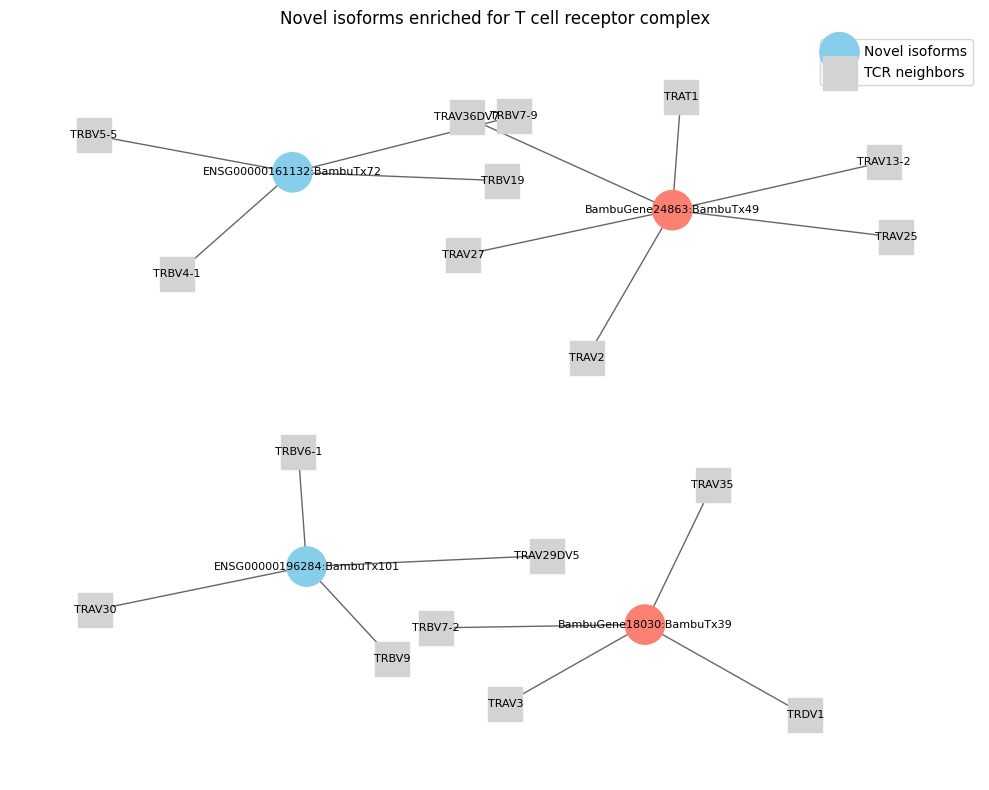

In [99]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

# Your enrichment hits (simplified for demo)
known_hits = {
    "ENSG00000161132:BambuTx72": ["TRBV19","TRBV4-1","TRBV5-5","TRBV7-9"],
    "ENSG00000196284:BambuTx101": ["TRAV29DV5","TRAV30","TRBV6-1","TRBV9"],
}
novel_hits = {
    "BambuGene18030:BambuTx39": ["TRAV3","TRAV35","TRBV7-2","TRDV1"],
    "BambuGene24863:BambuTx49": ["TRAT1","TRAV13-2","TRAV2","TRAV25","TRAV27","TRAV36DV7"],
}

# Build graph
G = nx.Graph()
for iso, genes in {**known_hits, **novel_hits}.items():
    G.add_node(iso, node_type="isoform", group="known" if iso.startswith("ENSG") else "novel")
    for g in genes:
        G.add_node(g, node_type="gene")
        G.add_edge(iso, g)

# Layout
pos = nx.spring_layout(G, seed=42, k=0.5)

# Plot
plt.figure(figsize=(10,8))
iso_nodes = [n for n,d in G.nodes(data=True) if d["node_type"]=="isoform"]
gene_nodes = [n for n,d in G.nodes(data=True) if d["node_type"]=="gene"]

nx.draw_networkx_nodes(
    G, pos,
    nodelist=iso_nodes,
    node_color=["skyblue" if G.nodes[n]["group"]=="known" else "salmon" for n in iso_nodes],
    node_shape="o", node_size=800, label="Novel isoforms"
)
nx.draw_networkx_nodes(
    G, pos,
    nodelist=gene_nodes,
    node_color="lightgray",
    node_shape="s", node_size=600, label="TCR neighbors"
)
nx.draw_networkx_edges(G, pos, alpha=0.6)
nx.draw_networkx_labels(G, pos, font_size=8)

plt.title("Novel isoforms enriched for T cell receptor complex")
plt.axis("off")
plt.legend()
plt.tight_layout()
plt.show()

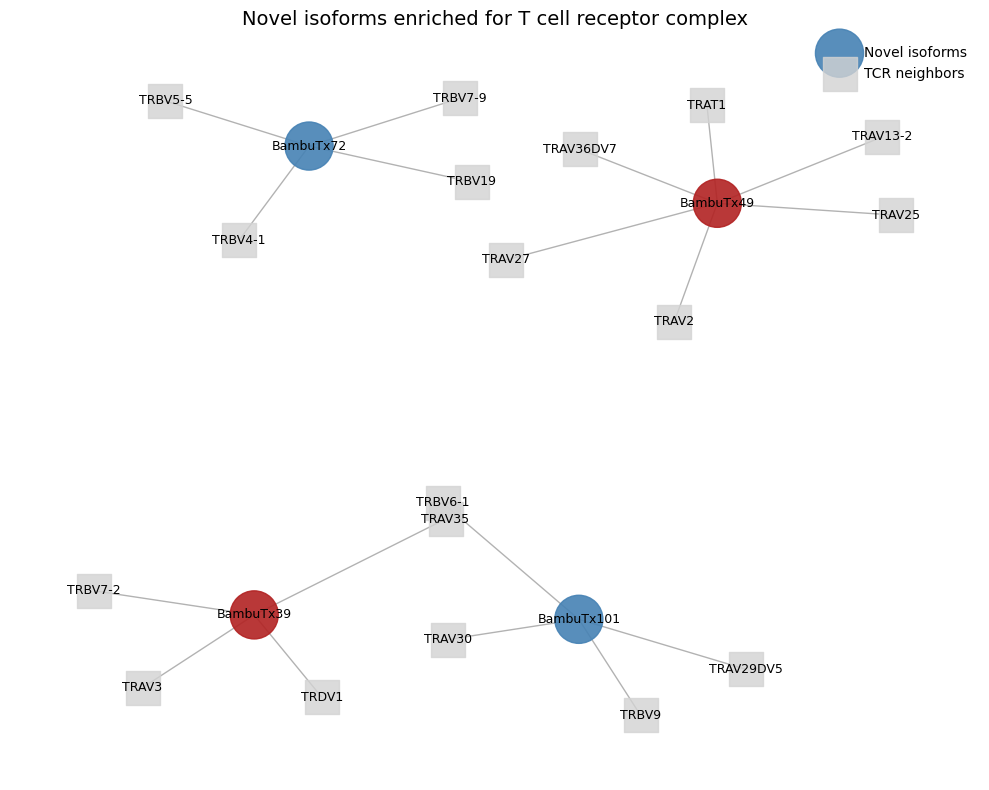

In [100]:
import matplotlib.pyplot as plt
import networkx as nx

# Layout with more spacing
pos = nx.spring_layout(G, seed=42, k=0.8, iterations=100)

plt.figure(figsize=(10, 8))

# Isoform nodes
nx.draw_networkx_nodes(
    G, pos,
    nodelist=iso_nodes,
    node_color=["steelblue" if G.nodes[n]["group"]=="known" else "firebrick" for n in iso_nodes],
    node_shape="o", node_size=1200, alpha=0.9,
    label="Novel isoforms"
)

# Neighbor gene nodes
nx.draw_networkx_nodes(
    G, pos,
    nodelist=gene_nodes,
    node_color="lightgray", node_shape="s", node_size=600, alpha=0.8,
    label="TCR neighbors"
)

# Edges
nx.draw_networkx_edges(G, pos, width=1.0, edge_color="gray", alpha=0.6)

# Labels
labels = {}
for n in G.nodes():
    if G.nodes[n]["node_type"]=="isoform":
        labels[n] = n.split(":")[-1]  # shorten isoform label
    else:
        labels[n] = n
nx.draw_networkx_labels(G, pos, labels=labels, font_size=9)

plt.title("Novel isoforms enriched for T cell receptor complex", fontsize=14)
plt.axis("off")
plt.legend(scatterpoints=1, fontsize=10, loc="upper right", frameon=False)
plt.tight_layout()
plt.show()

In [54]:
# =========================================================
# QA sanity checks for isoform vs centroid outputs (SPLIT)
# - Flags isoforms with large residuals in top-5 CTs
# - Verifies neighbor lists aren't empty
# - Prints tuning suggestions if needed
# =========================================================
import os
import pandas as pd
import numpy as np

# ---- Paths (adjust if different) ----
output_dir = "Intermediate_Files/Clustering_07282025/"
SPLIT_DIR = os.path.join(output_dir, "IsoformQuirks_vsCentroid_SPLIT")
QA_DIR = os.path.join(SPLIT_DIR, "QA")
os.makedirs(QA_DIR, exist_ok=True)

# Files produced by the split pipeline
TOP5_KNOWN = os.path.join(SPLIT_DIR, "knownGeneNovelIso_top5_divergent_celltypes.tsv")
TOP5_NOVEL = os.path.join(SPLIT_DIR, "novelGeneNovelIso_top5_divergent_celltypes.tsv")
NEI_KNOWN  = os.path.join(SPLIT_DIR, "knownGeneNovelIso_neighbors.tsv")
NEI_NOVEL  = os.path.join(SPLIT_DIR, "novelGeneNovelIso_neighbors.tsv")

# ---- Thresholds ----
RESIDUAL_WARN  = 1.0   # "large" residual (|z| > 1.0)
RESIDUAL_ALERT = 1.5   # "very large" residual (|z| > 1.5)
EMPTY_NEIGHBOR_TOLERANCE = 0.20  # if >20% empty, suggest parameter tweaks

def load_if_exists(path):
    if os.path.isfile(path):
        return pd.read_csv(path, sep="\t")
    print(f"⚠️  Missing file (skipping): {path}")
    return None

def summarize_residuals(top5_df, label):
    """
    From a top5-divergent-celltypes file, compute per-isoform max|residual|,
    count CTs above thresholds, and list those CTs.
    """
    if top5_df is None or top5_df.empty:
        print(f"— {label}: no data.")
        return None

    df = top5_df.copy()
    if "residual" not in df.columns or "isoform" not in df.columns or "cell_type" not in df.columns:
        # Older naming? try novel_isoform
        if "novel_isoform" in df.columns:
            df = df.rename(columns={"novel_isoform": "isoform"})
        assert {"isoform", "cell_type", "residual"} <= set(df.columns), \
            f"{label}: expected columns isoform/cell_type/residual."

    df["abs_residual"] = df["residual"].abs()

    # Per-isoform summary
    grp = df.groupby("isoform", as_index=False).agg(
        max_abs_residual=("abs_residual", "max"),
        n_ct_over_warn=("abs_residual", lambda x: int((x >= RESIDUAL_WARN).sum())),
        n_ct_over_alert=("abs_residual", lambda x: int((x >= RESIDUAL_ALERT).sum()))
    )

    # Collect CT lists per isoform for each threshold
    over_warn = (df[df["abs_residual"] >= RESIDUAL_WARN]
                 .groupby("isoform")["cell_type"]
                 .agg(lambda s: ";".join(sorted(s.unique())))).rename("cts_over_warn")
    over_alert = (df[df["abs_residual"] >= RESIDUAL_ALERT]
                  .groupby("isoform")["cell_type"]
                  .agg(lambda s: ";".join(sorted(s.unique())))).rename("cts_over_alert")

    out = grp.merge(over_warn, on="isoform", how="left") \
             .merge(over_alert, on="isoform", how="left") \
             .sort_values(["n_ct_over_alert", "max_abs_residual"], ascending=[False, False])

    out_path = os.path.join(QA_DIR, f"{label}_residual_QA.tsv")
    out.to_csv(out_path, sep="\t", index=False)

    print(f"✅ {label}: residual QA written → {out_path}")
    print(f"   Isoforms: {len(out):>4} | "
          f"with ≥1 CT |residual|≥{RESIDUAL_ALERT}: {int((out['n_ct_over_alert']>0).sum())} | "
          f"with ≥1 CT |residual|≥{RESIDUAL_WARN}: {int((out['n_ct_over_warn']>0).sum())}")
    return out

def check_neighbors(nei_df, label):
    """
    Check how many isoforms have empty neighbor lists.
    """
    if nei_df is None or nei_df.empty:
        print(f"— {label}: no neighbors table.")
        return None

    df = nei_df.copy()
    if "isoform" not in df.columns:
        # Older naming? try novel_isoform
        if "novel_isoform" in df.columns:
            df = df.rename(columns={"novel_isoform": "isoform"})
        assert "isoform" in df.columns, f"{label}: expected an 'isoform' column."

    if "neighbors_ENSG" not in df.columns:
        raise ValueError(f"{label}: expected 'neighbors_ENSG' column.")

    df["neighbors_ENSG"] = df["neighbors_ENSG"].fillna("")
    df["has_neighbors"] = df["neighbors_ENSG"].str.len() > 0

    total = len(df)
    empty = int((~df["has_neighbors"]).sum())
    frac_empty = empty / total if total else 0.0

    out_path = os.path.join(QA_DIR, f"{label}_neighbor_QA.tsv")
    df[["isoform","has_neighbors","neighbors_ENSG"]].to_csv(out_path, sep="\t", index=False)

    print(f"✅ {label}: neighbor QA → {out_path}")
    print(f"   Isoforms: {total:>4} | empty neighbor lists: {empty:>4} ({frac_empty:.1%})")

    if frac_empty > EMPTY_NEIGHBOR_TOLERANCE:
        print(f"⚠️  {label}: High empty-neighbor rate. Consider:")
        print("   • Lower SIM_THRESH_C from 0.30 → 0.20")
        print("   • Increase TOP_K_CENTROIDS from 30 → 50")
    return {"total": total, "empty": empty, "frac_empty": frac_empty}

# ---- Run on both classes ----
top5_known = load_if_exists(TOP5_KNOWN)
top5_novel = load_if_exists(TOP5_NOVEL)
nei_known  = load_if_exists(NEI_KNOWN)
nei_novel  = load_if_exists(NEI_NOVEL)

res_known = summarize_residuals(top5_known, "knownGeneNovelIso")
res_novel = summarize_residuals(top5_novel, "novelGeneNovelIso")

chk_known = check_neighbors(nei_known, "knownGeneNovelIso")
chk_novel = check_neighbors(nei_novel, "novelGeneNovelIso")

print("\n—— Summary ———————————————————————————————")
if res_known is not None:
    print(f"knownGeneNovelIso: median max|residual| = {res_known['max_abs_residual'].median():.2f}")
if res_novel is not None:
    print(f"novelGeneNovelIso:  median max|residual| = {res_novel['max_abs_residual'].median():.2f}")

if chk_known is not None and chk_novel is not None:
    frac_empty_all = (chk_known["empty"] + chk_novel["empty"]) / max(1, (chk_known["total"] + chk_novel["total"]))
    if frac_empty_all > EMPTY_NEIGHBOR_TOLERANCE:
        print(f"\n⚠️  Overall empty-neighbor rate {frac_empty_all:.1%} exceeds {EMPTY_NEIGHBOR_TOLERANCE:.0%}. Suggested tweaks:")
        print("   • Set SIM_THRESH_C = 0.20")
        print("   • Set TOP_K_CENTROIDS = 50")
    else:
        print("\n✅ Neighbor coverage looks OK overall.")

✅ knownGeneNovelIso: residual QA written → Intermediate_Files/Clustering_07282025/IsoformQuirks_vsCentroid_SPLIT/QA/knownGeneNovelIso_residual_QA.tsv
   Isoforms:   39 | with ≥1 CT |residual|≥1.5: 0 | with ≥1 CT |residual|≥1.0: 0
✅ novelGeneNovelIso: residual QA written → Intermediate_Files/Clustering_07282025/IsoformQuirks_vsCentroid_SPLIT/QA/novelGeneNovelIso_residual_QA.tsv
   Isoforms:   43 | with ≥1 CT |residual|≥1.5: 0 | with ≥1 CT |residual|≥1.0: 0
✅ knownGeneNovelIso: neighbor QA → Intermediate_Files/Clustering_07282025/IsoformQuirks_vsCentroid_SPLIT/QA/knownGeneNovelIso_neighbor_QA.tsv
   Isoforms:   39 | empty neighbor lists:    0 (0.0%)
✅ novelGeneNovelIso: neighbor QA → Intermediate_Files/Clustering_07282025/IsoformQuirks_vsCentroid_SPLIT/QA/novelGeneNovelIso_neighbor_QA.tsv
   Isoforms:   43 | empty neighbor lists:    0 (0.0%)

—— Summary ———————————————————————————————
knownGeneNovelIso: median max|residual| = 0.09
novelGeneNovelIso:  median max|residual| = 0.08

✅ Neighb

In [87]:
# ==========================================
# Step 2: Batch plots for ALL isoforms
#  - For each isoform: bar plot of isoform_z vs baseline_z + connectors
#  - Saves one PDF per isoform AND a multi-page PDF per class
# ==========================================
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages

output_dir = "Intermediate_Files/Clustering_07282025/"
SPLIT_DIR = os.path.join(output_dir, "IsoformQuirks_vsCentroid_SPLIT")
PLOT_DIR  = os.path.join(SPLIT_DIR, "plots")
os.makedirs(PLOT_DIR, exist_ok=True)

def load_residuals(label):
    path = os.path.join(SPLIT_DIR, f"{label}_residuals_long.tsv")
    if not os.path.isfile(path):
        raise FileNotFoundError(path)
    df = pd.read_csv(path, sep="\t")
    # Accept older column name
    if "novel_isoform" in df.columns and "isoform" not in df.columns:
        df = df.rename(columns={"novel_isoform":"isoform"})
    return df

def plot_one_isoform(df_long, isoform, savepath=None):
    d = df_long[df_long["isoform"] == isoform].copy()
    if d.empty:
        return False
    d = d.sort_values("isoform_z", ascending=False).reset_index(drop=True)
    x = np.arange(len(d))
    iso_z = d["isoform_z"].to_numpy()
    base_z = d["baseline_z"].to_numpy()

    fig, ax = plt.subplots(figsize=(max(6, 0.45*len(d)), 4))
    ax.bar(x - 0.2, iso_z, width=0.4, label="Isoform (z)")
    ax.bar(x + 0.2, base_z, width=0.4, label="Baseline (z)")
    for j in range(len(d)):
        ax.plot([x[j], x[j]], [base_z[j], iso_z[j]], linewidth=1)
    ax.set_xticks(x)
    ax.set_xticklabels(d["cell_type"], rotation=45, ha="right")
    ax.set_ylabel("Z-scored expression")
    ax.set_title(f"{isoform}: isoform vs centroid baseline")
    ax.legend(frameon=False)
    plt.tight_layout()
    if savepath:
        plt.savefig(savepath, dpi=300, bbox_inches="tight")
        plt.close(fig)
    else:
        plt.show()
    return True

def batch_plot(label):
    df = load_residuals(label)
    klass_dir = os.path.join(PLOT_DIR, label)
    os.makedirs(klass_dir, exist_ok=True)

    # Per-isoform PDFs
    isoforms = df["isoform"].unique().tolist()
    n_plotted = 0
    for iso in isoforms:
        outp = os.path.join(klass_dir, f"{iso.replace(':','_')}_vs_centroid.pdf")
        ok = plot_one_isoform(df, iso, savepath=outp)
        if ok: n_plotted += 1

    # Multi-page PDF
    multipath = os.path.join(klass_dir, f"{label}_ALL_vs_centroid_multipage.pdf")
    with PdfPages(multipath) as pdf:
        for iso in isoforms:
            d = df[df["isoform"] == iso].copy()
            if d.empty: continue
            d = d.sort_values("isoform_z", ascending=False).reset_index(drop=True)
            x = np.arange(len(d))
            iso_z = d["isoform_z"].to_numpy()
            base_z = d["baseline_z"].to_numpy()
            fig, ax = plt.subplots(figsize=(max(6, 0.45*len(d)), 4))
            ax.bar(x - 0.2, iso_z, width=0.4, label="Isoform (z)")
            ax.bar(x + 0.2, base_z, width=0.4, label="Baseline (z)")
            for j in range(len(d)):
                ax.plot([x[j], x[j]], [base_z[j], iso_z[j]], linewidth=1)
            ax.set_xticks(x)
            ax.set_xticklabels(d["cell_type"], rotation=45, ha="right")
            ax.set_ylabel("Z-scored expression")
            ax.set_title(f"{iso}: isoform vs centroid baseline")
            ax.legend(frameon=False)
            plt.tight_layout()
            pdf.savefig(fig, dpi=300, bbox_inches="tight")
            plt.close(fig)

    print(f"✅ Plotted {n_plotted} isoforms for {label}")
    print(f"   Per-isoform PDFs → {klass_dir}")
    print(f"   Multi-page PDF   → {multipath}")

# Run for both classes
batch_plot("knownGeneNovelIso")
batch_plot("novelGeneNovelIso")

✅ Plotted 39 isoforms for knownGeneNovelIso
   Per-isoform PDFs → Intermediate_Files/Clustering_07282025/IsoformQuirks_vsCentroid_SPLIT/plots/knownGeneNovelIso
   Multi-page PDF   → Intermediate_Files/Clustering_07282025/IsoformQuirks_vsCentroid_SPLIT/plots/knownGeneNovelIso/knownGeneNovelIso_ALL_vs_centroid_multipage.pdf
✅ Plotted 43 isoforms for novelGeneNovelIso
   Per-isoform PDFs → Intermediate_Files/Clustering_07282025/IsoformQuirks_vsCentroid_SPLIT/plots/novelGeneNovelIso
   Multi-page PDF   → Intermediate_Files/Clustering_07282025/IsoformQuirks_vsCentroid_SPLIT/plots/novelGeneNovelIso/novelGeneNovelIso_ALL_vs_centroid_multipage.pdf


In [56]:
# ==========================================================
# Step 3 (symbol-space): GO enrichment for both classes
#  - Study sets: neighbors_ENSG -> map to HGNC symbols (from GRCh38 GTF)
#  - Associations: symbol -> GO (BP/MF/CC) built from GOA Human GAF
#  - Per isoform & per host (ENSG host for known, BambuGene for novel)
# ==========================================================
import os, re, gzip, shutil, urllib.request
import pandas as pd
from goatools.obo_parser import GODag
from goatools.go_enrichment import GOEnrichmentStudy

# ------------------ PATHS ------------------
output_dir = "Intermediate_Files/Clustering_07282025/"
SPLIT_DIR  = os.path.join(output_dir, "IsoformQuirks_vsCentroid_SPLIT")
GO_DIR     = os.path.join(SPLIT_DIR, "go_files")
os.makedirs(GO_DIR, exist_ok=True)

# GO resources
OBO_PATH = os.path.join(GO_DIR, "go-basic.obo")
GAF_GZ   = os.path.join(GO_DIR, "goa_human.gaf.gz")
GAF_PATH = os.path.join(GO_DIR, "goa_human.gaf")
OBO_URL  = "http://geneontology.org/ontology/go-basic.obo"
GAF_URL  = "http://current.geneontology.org/annotations/goa_human.gaf.gz"

# Reference GTF (for ENSG->symbol)
REF_GTF = ("Homo_sapiens.GRCh38.113.gtf")

# ------------------ CONFIG ------------------
MIN_STUDY = 3   # try 2 temporarily if sparse
ASPECTS   = [("biological_process","BP"),
             ("molecular_function","MF"),
             ("cellular_component","CC")]

# ------------------ HELPERS ------------------
def ensure_go_files():
    if not os.path.isfile(OBO_PATH):
        urllib.request.urlretrieve(OBO_URL, OBO_PATH)
    if not os.path.isfile(GAF_PATH):
        if not os.path.isfile(GAF_GZ):
            urllib.request.urlretrieve(GAF_URL, GAF_GZ)
        with gzip.open(GAF_GZ, "rb") as fi, open(GAF_PATH, "wb") as fo:
            shutil.copyfileobj(fi, fo)

def build_ensg_to_symbol_from_ref_gtf(gtf_path):
    if not os.path.isfile(gtf_path):
        return {}
    gtf = pd.read_csv(
        gtf_path, sep="\t", comment="#", header=None, dtype=str,
        names=["chrom","source","feature","start","end","score","strand","frame","attribute"]
    )
    genes = gtf[gtf["feature"] == "gene"].copy()
    genes["gene_id"]   = genes["attribute"].str.extract(r'gene_id "([^"]+)"', expand=False)
    genes["gene_name"] = genes["attribute"].str.extract(r'gene_name "([^"]+)"', expand=False)
    return (genes.dropna(subset=["gene_id","gene_name"])
                 .drop_duplicates("gene_id")
                 .set_index("gene_id")["gene_name"]
                 .to_dict())

def build_symbol2gos_from_gaf(gaf_path, namespace="biological_process", debug_tag=None):
    """
    Build symbol -> set(GO) using GOA Human GAF 2.2.
    - GO ID = p[4], Aspect = p[8] (P/F/C), official gene symbol = p[2].
    - Robust to extra whitespace; uppercases symbols for consistent matching.
    """
    asp = {"biological_process":"P","molecular_function":"F","cellular_component":"C"}[namespace]
    sym2go = {}
    with open(gaf_path, "r", encoding="utf-8") as fh:
        for line in fh:
            if not line or line.startswith("!"):
                continue
            p = line.rstrip("\n").split("\t")
            if len(p) < 9:
                continue
            go_id, aspect = p[4], p[8]
            if aspect != asp or not go_id.startswith("GO:"):
                continue
            # DB_Object_Symbol is column index 2 in GAF 2.2 (0-based)
            sym = (p[2] or "").strip()
            if not sym:
                continue
            sym = sym.upper()
            sym2go.setdefault(sym, set()).add(go_id)
    if debug_tag:
        print(f"{debug_tag}: symbols mapped = {len(sym2go)}; examples: {list(sym2go.keys())[:5]}")
    return sym2go

def parse_class_neighbors(label):
    path = os.path.join(SPLIT_DIR, f"{label}_neighbors.tsv")
    if not os.path.isfile(path):
        print(f"⚠️ Missing neighbors file: {path}")
        return pd.DataFrame()
    df = pd.read_csv(path, sep="\t")
    if "isoform" not in df.columns and "novel_isoform" in df.columns:
        df = df.rename(columns={"novel_isoform":"isoform"})
    return df

_ENSG_RE = re.compile(r"(ENSG\d{11})")

def normalize_ensg_list(raw_field: str) -> list[str]:
    """Split a neighbors_ENSG field and extract clean ENSG IDs."""
    if pd.isna(raw_field) or not str(raw_field).strip():
        return []
    toks = re.split(r"[;,| \t]+", str(raw_field))
    out = []
    seen = set()
    for t in toks:
        m = _ENSG_RE.search(t)
        if m:
            e = m.group(1)
            if e not in seen:
                seen.add(e); out.append(e)
    return out

def ensg_list_to_symbols(ensg_list, e2s: dict) -> list[str]:
    """ENSG -> HGNC symbol using GRCh38 GTF map; returns UPPERCASE, dedup, order-stable."""
    out, seen = [], set()
    for e in ensg_list:
        s = e2s.get(e)
        if s:
            u = s.upper()
            if u not in seen:
                seen.add(u); out.append(u)
    return out

def run_go_symbol_per_isoform(nei_df, e2s, sym2gos, obodag, out_path, min_study=3):
    cols = ["item","GO_ID","Term","p_uncorrected","p_fdr_bh","study_count","study_items"]
    if not sym2gos:
        pd.DataFrame(columns=cols).to_csv(out_path, sep="\t", index=False)
        print(f"⚠️ GO per-isoform → {out_path}: 0 symbols in association map.")
        return pd.DataFrame(columns=cols)
    if nei_df.empty:
        pd.DataFrame(columns=cols).to_csv(out_path, sep="\t", index=False)
        print(f"✅ GO per-isoform → {out_path} (no input rows)")
        return pd.DataFrame(columns=cols)

    bg_syms = set(sym2gos.keys())
    goea = GOEnrichmentStudy(list(bg_syms), sym2gos, obodag,
                             propagate_counts=True, alpha=0.05, methods=["fdr_bh"])

    rows, tot, cov = [], 0, 0
    for _, r in nei_df.iterrows():
        tot += 1
        iso = r["isoform"]
        ens = normalize_ensg_list(r.get("neighbors_ENSG",""))
        study_syms = [s for s in ensg_list_to_symbols(ens, e2s) if s in bg_syms]
        if len(study_syms) >= min_study:
            cov += 1
            for g in goea.run_study(study_syms):
                if getattr(g, "p_fdr_bh", 1.0) < 0.05:
                    rows.append({
                        "item": iso,
                        "GO_ID": g.GO,
                        "Term": g.name,
                        "p_uncorrected": g.p_uncorrected,
                        "p_fdr_bh": g.p_fdr_bh,
                        "study_count": g.study_count,
                        "study_items": ";".join(sorted(g.study_items))
                    })
    out = pd.DataFrame(rows, columns=cols)
    if not out.empty:
        out = out.sort_values(["item","p_fdr_bh"])
    out.to_csv(out_path, sep="\t", index=False)
    print(f"✅ GO per-isoform (symbols) → {out_path}  ({len(out)} rows) | isoforms with ≥{min_study} symbol-annotated neighbors: {cov}/{tot}")
    return out

def run_go_symbol_per_host(nei_df, e2s, sym2gos, obodag, out_path, min_study=3, label="knownGeneNovelIso"):
    cols = ["item","GO_ID","Term","p_uncorrected","p_fdr_bh","study_count","study_items"]
    if not sym2gos:
        pd.DataFrame(columns=cols).to_csv(out_path, sep="\t", index=False)
        print(f"⚠️ GO per-host → {out_path}: 0 symbols in association map.")
        return pd.DataFrame(columns=cols)
    if nei_df.empty:
        pd.DataFrame(columns=cols).to_csv(out_path, sep="\t", index=False)
        print(f"✅ GO per-host → {out_path} (no input rows)")
        return pd.DataFrame(columns=cols)

    def get_known_ensg(lbl):
        m = re.match(r"(ENSG\d{11}):", str(lbl) or "")
        return m.group(1) if m else None
    def get_bambiguene(lbl):
        m = re.match(r"(BambuGene\d+):", str(lbl) or "")
        return m.group(1) if m else None

    iso_col = "isoform"
    if label == "knownGeneNovelIso":
        host_key = nei_df[iso_col].map(get_known_ensg)   # ENSG host; symbol only for display later
    else:
        host_key = nei_df[iso_col].map(get_bambiguene)   # BambuGene host (no symbol; display as-is)

    # union neighbors per host, then map ENSG->symbol for study set
    nei_df = nei_df.assign(_host=host_key).dropna(subset=["_host"])
    ex = (nei_df.assign(_ensg_list=nei_df["neighbors_ENSG"].fillna("").map(normalize_ensg_list))
            .explode("_ensg_list")
            .dropna(subset=["_ensg_list"]))
    host2ensg = (ex.groupby("_host")["_ensg_list"]
               .agg(list).reset_index())   # keep as a list; map to symbols later

    bg_syms = set(sym2gos.keys())
    goea = GOEnrichmentStudy(list(bg_syms), sym2gos, obodag,
                             propagate_counts=True, alpha=0.05, methods=["fdr_bh"])

    rows, tot, cov = [], 0, 0
    for _, r in host2ensg.iterrows():
        tot += 1
        host = r["_host"]
        study_syms = [s for s in ensg_list_to_symbols(r["_ensg_list"], e2s) if s in bg_syms]
        if len(study_syms) >= min_study:
            cov += 1
            for g in goea.run_study(study_syms):
                if getattr(g, "p_fdr_bh", 1.0) < 0.05:
                    rows.append({
                        "item": host,   # ENSG for known; BambuGene for novel
                        "GO_ID": g.GO,
                        "Term": g.name,
                        "p_uncorrected": g.p_uncorrected,
                        "p_fdr_bh": g.p_fdr_bh,
                        "study_count": g.study_count,
                        "study_items": ";".join(sorted(g.study_items))
                    })
    out = pd.DataFrame(rows, columns=cols)
    if not out.empty:
        out = out.sort_values(["item","p_fdr_bh"])
    out.to_csv(out_path, sep="\t", index=False)
    print(f"✅ GO per-host (symbols) → {out_path}  ({len(out)} rows) | hosts with ≥{min_study} symbol-annotated neighbors: {cov}/{tot}")
    return out

def annotate_host_symbols(iso_df, nei_df, e2s):
    """For knownGeneNovelIso: attach host_ENSG and host_symbol (readability only)."""
    if iso_df.empty:
        return iso_df
    tmp = nei_df[["isoform"]].drop_duplicates().copy()
    tmp["host_ENSG"] = tmp["isoform"].map(lambda s: (re.match(r"(ENSG\d{11}):", s).group(1) if isinstance(s,str) and re.match(r"(ENSG\d{11}):", s) else ""))
    tmp["host_symbol"] = tmp["host_ENSG"].map(lambda e: e2s.get(e, ""))
    return (iso_df.merge(tmp, left_on="item", right_on="isoform", how="left")
                 .drop(columns=["isoform"]))
# --- DIAGNOSTIC: how many symbol-annotated neighbors per isoform? ---
def diag_symbol_coverage(nei_df: pd.DataFrame, e2s: dict, sym2gos: dict, label: str, tag: str, out_dir: str):
    bg = set(sym2gos.keys())
    rows = []
    for _, r in nei_df.iterrows():
        iso = r["isoform"] if "isoform" in nei_df.columns else r.get("novel_isoform")
        ens_norm = normalize_ensg_list(r.get("neighbors_ENSG",""))
        syms = ensg_list_to_symbols(ens_norm, e2s)
        k_all, k_bg = len(syms), sum(1 for s in syms if s in bg)
        rows.append((iso, k_all, k_bg))
    cov = pd.DataFrame(rows, columns=["isoform","neighbors_symbols","neighbors_symbols_in_GO"])
    cov.to_csv(os.path.join(out_dir, f"{label}_symbol_coverage_{tag}.tsv"), sep="\t", index=False)
    print(f"{label} {tag}: isoforms with ≥3 GO-annotated symbols = {(cov['neighbors_symbols_in_GO']>=3).sum()}/{len(cov)} "
          f"(median in-GO = {cov['neighbors_symbols_in_GO'].median()})")
    return cov

# --- DIAGNOSTIC: how many symbol-annotated neighbors per isoform? ---
def diag_symbol_coverage(nei_df: pd.DataFrame, e2s: dict, sym2gos: dict, label: str, tag: str, out_dir: str):
    bg = set(sym2gos.keys())
    rows = []
    for _, r in nei_df.iterrows():
        iso = r["isoform"] if "isoform" in nei_df.columns else r.get("novel_isoform")
        ens_norm = normalize_ensg_list(r.get("neighbors_ENSG",""))
        syms = ensg_list_to_symbols(ens_norm, e2s)
        k_all, k_bg = len(syms), sum(1 for s in syms if s in bg)
        rows.append((iso, k_all, k_bg))
    cov = pd.DataFrame(rows, columns=["isoform","neighbors_symbols","neighbors_symbols_in_GO"])
    cov.to_csv(os.path.join(out_dir, f"{label}_symbol_coverage_{tag}.tsv"), sep="\t", index=False)
    print(f"{label} {tag}: isoforms with ≥3 GO-annotated symbols = {(cov['neighbors_symbols_in_GO']>=3).sum()}/{len(cov)} "
          f"(median in-GO = {cov['neighbors_symbols_in_GO'].median()})")
    return cov

In [57]:
# ------------------ RUN ------------------
ensure_go_files()
obodag      = GODag(OBO_PATH)
ensg2symbol = build_ensg_to_symbol_from_ref_gtf(REF_GTF)

for namespace, tag in ASPECTS:
    # Build symbol→GO associations for this namespace
    symbol2gos = build_symbol2gos_from_gaf(GAF_PATH, namespace=namespace, debug_tag=tag)
    print(f"Built mapping for {tag}: {len(symbol2gos)} symbols with {tag} terms.")

    if not symbol2gos:
        for label in ["knownGeneNovelIso", "novelGeneNovelIso"]:
            pd.DataFrame(columns=["item","GO_ID","Term","p_uncorrected","p_fdr_bh","study_count","study_items"]) \
              .to_csv(os.path.join(SPLIT_DIR, f"GO_{label}_per_isoform_SYMBOL_{tag}.tsv"), sep="\t", index=False)
            pd.DataFrame(columns=["item","GO_ID","Term","p_uncorrected","p_fdr_bh","study_count","study_items"]) \
              .to_csv(os.path.join(SPLIT_DIR, f"GO_{label}_per_host_SYMBOL_{tag}.tsv"), sep="\t", index=False)
        continue

    for label in ["knownGeneNovelIso", "novelGeneNovelIso"]:
        nei = parse_class_neighbors(label)
        diag_symbol_coverage(nei, ensg2symbol, symbol2gos, label, tag, SPLIT_DIR)

        # Per-isoform enrichment (neighbors mapped to symbols)
        out_iso = os.path.join(SPLIT_DIR, f"GO_{label}_per_isoform_SYMBOL_{tag}.tsv")
        iso_df  = run_go_symbol_per_isoform(nei, ensg2symbol, symbol2gos, obodag, out_iso, min_study=MIN_STUDY)

        # For knownGeneNovelIso, attach host symbol (readability)
        if label == "knownGeneNovelIso" and not iso_df.empty:
            iso_df = annotate_host_symbols(iso_df, nei, ensg2symbol)
            iso_df.to_csv(out_iso, sep="\t", index=False)

        # Per-host enrichment (host key: ENSG for known, BambuGene for novel)
        out_host = os.path.join(SPLIT_DIR, f"GO_{label}_per_host_SYMBOL_{tag}.tsv")
        host_df  = run_go_symbol_per_host(nei, ensg2symbol, symbol2gos, obodag, out_host, min_study=MIN_STUDY, label=label)

        # For knownGene hosts (ENSG), add host_symbol column for display
        if label == "knownGeneNovelIso" and not host_df.empty:
            host_df["host_symbol"] = host_df["item"].map(lambda e: ensg2symbol.get(e, "") if isinstance(e, str) and e.startswith("ENSG") else "")
            host_df.to_csv(out_host, sep="\t", index=False)

Intermediate_Files/Clustering_07282025/IsoformQuirks_vsCentroid_SPLIT/go_files/go-basic.obo: fmt(1.2) rel(2025-07-22) 43,230 Terms
BP: symbols mapped = 36565; examples: ['TRBV20OR9-2', 'IGKV3-7', 'IGKV1D-42', 'IGLV4-69', 'IGLV8-61']
Built mapping for BP: 36565 symbols with BP terms.
knownGeneNovelIso BP: isoforms with ≥3 GO-annotated symbols = 0/39 (median in-GO = 0.0)

Load  Ontology Enrichment Analysis ...
Propagating term counts up: is_a
100% 36,565 of 36,565 population items found in association
✅ GO per-isoform (symbols) → Intermediate_Files/Clustering_07282025/IsoformQuirks_vsCentroid_SPLIT/GO_knownGeneNovelIso_per_isoform_SYMBOL_BP.tsv  (0 rows) | isoforms with ≥3 symbol-annotated neighbors: 0/39

Load  Ontology Enrichment Analysis ...
Propagating term counts up: is_a
100% 36,565 of 36,565 population items found in association
✅ GO per-host (symbols) → Intermediate_Files/Clustering_07282025/IsoformQuirks_vsCentroid_SPLIT/GO_knownGeneNovelIso_per_host_SYMBOL_BP.tsv  (0 rows) | ho

In [58]:
# === Coverage diagnostic: how many annotated neighbors per isoform (BP/MF/CC) ===
import os, re, pandas as pd

output_dir = "Intermediate_Files/Clustering_07282025/"
SPLIT_DIR  = os.path.join(output_dir, "IsoformQuirks_vsCentroid_SPLIT")
GO_DIR     = os.path.join(SPLIT_DIR, "go_files")
GAF_PATH   = os.path.join(GO_DIR, "goa_human.gaf")

def parse_class_neighbors(label: str) -> pd.DataFrame:
    path = os.path.join(SPLIT_DIR, f"{label}_neighbors.tsv")
    if not os.path.isfile(path):
        print(f"⚠️ missing file: {path}")
        return pd.DataFrame(columns=["isoform","neighbors_ENSG"]) 
    df = pd.read_csv(path, sep="\t")
    if "isoform" not in df.columns and "novel_isoform" in df.columns:
        df = df.rename(columns={"novel_isoform":"isoform"})
    return df

def annotated_neighbor_counts(nei_df: pd.DataFrame, ensg2gos: dict) -> pd.DataFrame:
    bg = set(ensg2gos.keys())
    rows = []
    for _, r in nei_df.iterrows():
        ens = [x for x in str(r.get("neighbors_ENSG","")).split(";") if x]
        k_all = len(ens)
        k_ann = sum(1 for e in ens if e in bg)
        rows.append((r["isoform"], k_all, k_ann))
    out = pd.DataFrame(rows, columns=["isoform","neighbors_total","neighbors_annotated"])
    out["frac_annotated"] = out["neighbors_annotated"] / out["neighbors_total"].replace(0, pd.NA)
    return out.sort_values("neighbors_annotated", ascending=False)

# --- Build GO maps for all three aspects (fresh in this cell) ---
ensg2gos_BP = build_ensg2gos_from_gaf(GAF_PATH, namespace="biological_process",  debug_tag="BP")
ensg2gos_MF = build_ensg2gos_from_gaf(GAF_PATH, namespace="molecular_function", debug_tag="MF")
ensg2gos_CC = build_ensg2gos_from_gaf(GAF_PATH, namespace="cellular_component", debug_tag="CC")

go_maps = {"BP": ensg2gos_BP, "MF": ensg2gos_MF, "CC": ensg2gos_CC}

for label in ["knownGeneNovelIso", "novelGeneNovelIso"]:
    nei = parse_class_neighbors(label)
    print(f"\n== {label} ==")
    for tag, m in go_maps.items():
        cov = annotated_neighbor_counts(nei, m)
        n_ge3 = int((cov["neighbors_annotated"] >= 3).sum())
        print(f"{tag}: isoforms with ≥3 annotated neighbors: {n_ge3} / {len(cov)} "
              f"(median annotated = {cov['neighbors_annotated'].median()})")
        cov.to_csv(os.path.join(SPLIT_DIR, f"{label}_coverage_{tag}.tsv"), sep="\t", index=False)

BP: ENSGs mapped = 944; examples: ['ENSG00000124762', 'ENSG00000264229', 'ENSG00000207094', 'ENSG00000200753', 'ENSG00000200785']
MF: ENSGs mapped = 140; examples: ['ENSG00000228630', 'ENSG00000264229', 'ENSG00000169554', 'ENSG00000110395', 'ENSG00000261994']
CC: ENSGs mapped = 903; examples: ['ENSG00000177169', 'ENSG00000264229', 'ENSG00000207094', 'ENSG00000282800', 'ENSG00000200753']

== knownGeneNovelIso ==
BP: isoforms with ≥3 annotated neighbors: 0 / 39 (median annotated = 0.0)
MF: isoforms with ≥3 annotated neighbors: 0 / 39 (median annotated = 0.0)
CC: isoforms with ≥3 annotated neighbors: 0 / 39 (median annotated = 0.0)

== novelGeneNovelIso ==
BP: isoforms with ≥3 annotated neighbors: 0 / 43 (median annotated = 0.0)
MF: isoforms with ≥3 annotated neighbors: 0 / 43 (median annotated = 0.0)
CC: isoforms with ≥3 annotated neighbors: 0 / 43 (median annotated = 0.0)


In [25]:
# ---- run for both classes ----
ensure_go_files()
obodag = GODag(OBO_PATH)
ensg2symbol = build_ensg_to_symbol_from_gtf(EXT_GTF)
symbol2gos  = build_symbol2gos_bp_from_gaf(GAF_PATH)

for label in ["knownGeneNovelIso", "novelGeneNovelIso"]:
    nei = parse_class_neighbors(label)
    out_iso  = os.path.join(SPLIT_DIR, f"GO_{label}_per_isoform.tsv")
    out_gene = os.path.join(SPLIT_DIR, f"GO_{label}_per_gene.tsv")
    run_go_per_isoform(nei, ensg2symbol, symbol2gos, obodag, out_iso, min_study=5)
    run_go_per_gene(nei, ensg2symbol, symbol2gos, obodag, out_gene, min_study=5, label=label)

Intermediate_Files/Clustering_07282025/IsoformQuirks_vsCentroid_SPLIT/go_files/go-basic.obo: fmt(1.2) rel(2025-07-22) 43,230 Terms

Load  Ontology Enrichment Analysis ...
Propagating term counts up: is_a
100% 36,565 of 36,565 population items found in association
✅ GO per-isoform → Intermediate_Files/Clustering_07282025/IsoformQuirks_vsCentroid_SPLIT/GO_knownGeneNovelIso_per_isoform.tsv (0 rows)

Load  Ontology Enrichment Analysis ...
Propagating term counts up: is_a
100% 36,565 of 36,565 population items found in association
✅ GO per-gene → Intermediate_Files/Clustering_07282025/IsoformQuirks_vsCentroid_SPLIT/GO_knownGeneNovelIso_per_gene.tsv (0 rows)

Load  Ontology Enrichment Analysis ...
Propagating term counts up: is_a
100% 36,565 of 36,565 population items found in association
✅ GO per-isoform → Intermediate_Files/Clustering_07282025/IsoformQuirks_vsCentroid_SPLIT/GO_novelGeneNovelIso_per_isoform.tsv (0 rows)

Load  Ontology Enrichment Analysis ...
Propagating term counts up: is_

In [3]:
# ===================== STRICT SPLIT: ENSG/BambuTx vs BambuGene/BambuTx =====================
import re
import numpy as np
import pandas as pd
import scipy.sparse as sp

# ----- 0) Parse transcript->gene_id from your extended annotations (Bambu adds gene_id) -----
ext_gtf_path = "extended_annotations.gtf"  # your file with Bambu transcripts
ext = pd.read_csv(
    ext_gtf_path, sep="\t", comment="#", header=None, dtype=str,
    names=["chrom","source","feature","start","end","score","strand","frame","attribute"]
)
ext = ext[ext["feature"] == "transcript"].copy()
ext["transcript_id"] = ext["attribute"].str.extract(r'transcript_id "([^"]+)"', expand=False)
ext["gene_id"]       = ext["attribute"].str.extract(r'gene_id "([^"]+)"', expand=False)
tx_to_gene_id = (
    ext.dropna(subset=["transcript_id","gene_id"])
       .drop_duplicates("transcript_id")
       .set_index("transcript_id")["gene_id"]
       .to_dict()
)

In [4]:
# ----- 1) Get X as CSR (or keep dense) and the transcript list -----
X = adata_i_filtered.X
is_sparse = sp.isspmatrix(X)
if is_sparse:
    if not sp.isspmatrix_csr(X):
        X = X.tocsr()
else:
    X = np.asarray(X, dtype=np.float32, order="C")

transcripts = adata_i_filtered.var.index.astype(str).to_numpy()

# cell-type info
cell_types_cat = adata_i_filtered.obs["sub_cell_type"].astype("category")
ct_codes = cell_types_cat.cat.codes.to_numpy()
ct_names = cell_types_cat.cat.categories.to_numpy()
n_cells, n_iso = X.shape
n_ct = len(ct_names)

In [5]:
# ----- 2) Build *exact* masks -----
# (a) BambuTx isoforms only
is_bambu_tx = pd.Series(transcripts, dtype="string").str.startswith("BambuTx").to_numpy()

# (b) Map transcript -> gene_id, then gene class
gene_ids = pd.Series(transcripts).map(tx_to_gene_id)         # may be NaN for some
gene_ids = gene_ids.fillna("")
gene_is_ensg   = gene_ids.str.startswith("ENSG").to_numpy()
gene_is_bambu  = gene_ids.str.startswith("BambuGene").to_numpy()

# (c) Final, strict subsets
mask_ENSG_BambuTx    = is_bambu_tx & gene_is_ensg
mask_BambuGene_BambuTx = is_bambu_tx & gene_is_bambu

In [6]:
# ----- 3) Lightweight prevalence filter & column cap (adjust as desired) -----
MIN_CELLS_NZ = 20
MIN_PREV_ANY = 0.01
MAX_COLS_PER_SUBSET = 300  # None for no cap (risk of huge PDFs)

def compute_global_nz(X):
    if sp.isspmatrix_csr(X):
        return np.asarray(X.getnnz(axis=0)).ravel()
    # dense, chunk to save RAM
    B = 2000
    nz = np.zeros(X.shape[1], dtype=np.int64)
    for start in range(0, X.shape[0], B):
        stop = min(start+B, X.shape[0])
        nz += (X[start:stop, :] != 0).sum(axis=0)
    return nz

global_nz = compute_global_nz(X)

keep_cols_global = np.flatnonzero(global_nz >= MIN_CELLS_NZ)
if keep_cols_global.size == 0:
    print("[split] No isoforms pass global nonzero filter. Skipping.")
    df_known = pd.DataFrame(columns=["cell_type","clean_name","expression"])
    df_novel = pd.DataFrame(columns=["cell_type","clean_name","expression"])
else:
    # keep only globally nonzero columns
    transcripts_k = transcripts[keep_cols_global].astype(str)
    global_nz_k   = global_nz[keep_cols_global]
    Xk            = X[:, keep_cols_global]  # works for CSR or dense

    # ---------- FUNCTIONS (rename batch arg to avoid collision) ----------
    def agg_by_celltype_sparse(Xsub):
        """Aggregate per cell type (sparse). Returns means, prev arrays."""
        k = Xsub.shape[1]
        means = np.zeros((n_ct, k), dtype=np.float32)
        prev  = np.zeros((n_ct, k), dtype=np.float32)
        for i in range(n_ct):
            sel = (ct_codes == i)
            if not np.any(sel):
                continue
            Xi = Xsub[sel, :]
            c = int(sel.sum())
            means[i, :] = np.asarray(Xi.sum(axis=0)).ravel() / max(c, 1)
            Xi_nz = Xi.sign()
            prev[i, :]  = np.asarray(Xi_nz.sum(axis=0)).ravel() / max(c, 1)
        return means, prev

    def agg_by_celltype_dense(Xsub, ct_codes, n_ct, batch_rows=2000):
        """Aggregate per cell type (dense) in row-chunks. Returns means, prev arrays."""
        n_cells, k = Xsub.shape
        means = np.zeros((n_ct, k), dtype=np.float32)
        prev  = np.zeros((n_ct, k), dtype=np.float32)

        for i in range(n_ct):
            rows_i = np.flatnonzero(ct_codes == i)
            if rows_i.size == 0:
                continue
            s  = np.zeros(k, dtype=np.float64)
            nz = np.zeros(k, dtype=np.int64)
            for start in range(0, rows_i.size, batch_rows):
                sub = rows_i[start:start+batch_rows]
                Xi = Xsub[sub, :]
                s  += Xi.sum(axis=0)
                nz += (Xi != 0).sum(axis=0)
            c = float(rows_i.size)
            means[i, :] = (s / max(c, 1)).astype(np.float32)
            prev[i, :]  = (nz / max(c, 1)).astype(np.float32)
        return means, prev

    def aggregate_subset_by_cols(col_idx):
        """Aggregate per cell type for a chosen subset of columns with a prevalence filter."""
        if col_idx.size == 0:
            return None, None, col_idx
        Xs = Xk[:, col_idx]
        if is_sparse:
            m, p = agg_by_celltype_sparse(Xs)
        else:
            # pass positionally; avoids old 'batch' keyword collisions
            m, p = agg_by_celltype_dense(Xs, ct_codes, n_ct, 2000)
        keep = (p.max(axis=0) >= MIN_PREV_ANY)
        if not np.any(keep):
            return None, None, np.array([], dtype=int)
        return m[:, keep], p[:, keep], col_idx[keep]

    # ---------- STRICT SPLIT BY LABEL PATTERN ----------
    # We want ONLY:
    #   • known set:  "ENSG###########:BambuTx<id>"
    #   • novel set:  "BambuGene<id>:BambuTx<id>"
    tx_series = pd.Series(transcripts_k, dtype=str)
    mask_known_gene_btx = tx_series.str.match(r"ENSG\d{11}:BambuTx\d+$", na=False).to_numpy()
    mask_bambu_gene_btx = tx_series.str.match(r"BambuGene\d+:BambuTx\d+$", na=False).to_numpy()

    def choose_by_mask(mask_bool):
        idx = np.flatnonzero(mask_bool)
        if idx.size == 0:
            return idx
        # rank by global prevalence; cap; then sort
        take = idx if MAX_COLS_PER_SUBSET is None else idx[np.argsort(global_nz_k[idx])[-MAX_COLS_PER_SUBSET:]]
        return np.sort(take)

    cols_known_gene_btx = choose_by_mask(mask_known_gene_btx)
    cols_bambu_gene_btx = choose_by_mask(mask_bambu_gene_btx)

    means_known, prev_known, idx_known = aggregate_subset_by_cols(cols_known_gene_btx)
    means_bambu, prev_bambu, idx_bambu = aggregate_subset_by_cols(cols_bambu_gene_btx)

    def to_long_df(means, col_idx):
        if means is None or col_idx.size == 0:
            return pd.DataFrame(columns=["cell_type","clean_name","expression"])
        tx_sel = transcripts_k[col_idx]
        # gene label is the part before the colon; clean_name = "<gene>:<full_label>"
        gene_label = pd.Series(tx_sel, dtype=str).str.split(":", n=1, expand=True).iloc[:, 0]
        clean = np.where(gene_label.notna(), gene_label.values + ":" + tx_sel, tx_sel)
        small_wide = pd.DataFrame(means, index=ct_names, columns=clean)
        out = small_wide.stack().reset_index()
        out.columns = ["cell_type", "clean_name", "expression"]
        return out

    df_known = to_long_df(means_known, idx_known)   # ENSG:BambuTx only
    df_novel = to_long_df(means_bambu, idx_bambu)   # BambuGene:BambuTx only
    print(f"[split] ENSG/BambuTx rows: {len(df_known)} | BambuGene/BambuTx rows: {len(df_novel)}")

[split] ENSG/BambuTx rows: 472 | BambuGene/BambuTx rows: 536


In [7]:
# ======================= plotting =======================
import os, numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

FIG_DIR = "Intermediate_Files/Paper_Figs"
os.makedirs(FIG_DIR, exist_ok=True)

def plot_clustermap_with_coexpression(df_subset, filename_pdf, vmax, celltype_order=None):
    """Builds an expression clustermap (rows=cell types, cols=isoforms) and a
    co-expression (isoform-by-isoform) heatmap using the same column order."""
    if df_subset is None or len(df_subset) == 0:
        print(f"[plot] {os.path.basename(filename_pdf)}: empty input — skipping.")
        return

    # mean expression per (cell_type, isoform)
    summary = (df_subset
               .groupby(["cell_type", "clean_name"], observed=True)["expression"]
               .mean()
               .unstack(fill_value=0.0))

    # optional row order
    if celltype_order:
        present = [ct for ct in celltype_order if ct in summary.index]
        summary = summary.reindex(present)

    # safety: drop all-zero columns (corr would be NaN)
    if (summary == 0).all(axis=0).any():
        summary = summary.loc[:, ~(summary == 0).all(axis=0)]
        if summary.shape[1] == 0:
            print(f"[plot] {os.path.basename(filename_pdf)}: all-zero after filter — skipping.")
            return

    # sort isoforms alphabetically before clustering for stability
    summary = summary.reindex(columns=sorted(summary.columns))

    # expression clustermap (cluster columns only)
    col_cluster = summary.shape[1] >= 2
    g = sns.clustermap(
        summary, cmap="coolwarm",
        linewidths=0.4, linecolor='gray',
        vmin=-vmax, vmax=vmax, center=0,
        figsize=(max(len(summary.columns) * 0.3, 3.5), 5.5),
        row_cluster=False, col_cluster=col_cluster,
        cbar_kws={"label": ""},
        dendrogram_ratio=(0.1, 0.5) if col_cluster else (0.0, 0.0),
        cbar_pos=(0.02, 0.52, 0.03, 0.2)
    )
    g.ax_heatmap.set_xlabel(""); g.ax_heatmap.set_ylabel("")
    g.ax_heatmap.set_xticklabels(g.ax_heatmap.get_xticklabels(), rotation=90)
    g.ax_heatmap.set_yticklabels(g.ax_heatmap.get_yticklabels(), rotation=0, ha='right')

    # reorder columns by the clustermap dendrogram (if any) for co-expression
    if col_cluster:
        order = [summary.columns[i] for i in g.dendrogram_col.reordered_ind]
        summary_ord = summary[order]
    else:
        summary_ord = summary

    # isoform-by-isoform correlation
    corr = summary_ord.corr().replace([np.inf, -np.inf], np.nan).fillna(0.0)

    # save both
    base = os.path.splitext(filename_pdf)[0]
    g.savefig(base + "_dendrogram.pdf", dpi=600, transparent=True, bbox_inches="tight")
    plt.figure(figsize=(max(len(summary_ord.columns) * 0.3, 3.5), 10))
    sns.heatmap(corr, cmap="coolwarm", vmin=-1, vmax=1, center=0,
                linewidths=0.4, linecolor='gray')
    plt.xticks(rotation=90); plt.yticks(rotation=0)
    plt.tight_layout()
    plt.savefig(base + "_coexpression.pdf", dpi=600, transparent=True, bbox_inches="tight")
    plt.close()
    print(f"[plot] saved: {base}_dendrogram.pdf and {base}_coexpression.pdf")

[plot] saved: Intermediate_Files/Paper_Figs/known_gene__BambuTx_subcelltype_heatmap_clustered_coexpression_dendrogram.pdf and Intermediate_Files/Paper_Figs/known_gene__BambuTx_subcelltype_heatmap_clustered_coexpression_coexpression.pdf
[plot] saved: Intermediate_Files/Paper_Figs/bambu_gene__BambuTx_subcelltype_heatmap_clustered_coexpression_dendrogram.pdf and Intermediate_Files/Paper_Figs/bambu_gene__BambuTx_subcelltype_heatmap_clustered_coexpression_coexpression.pdf


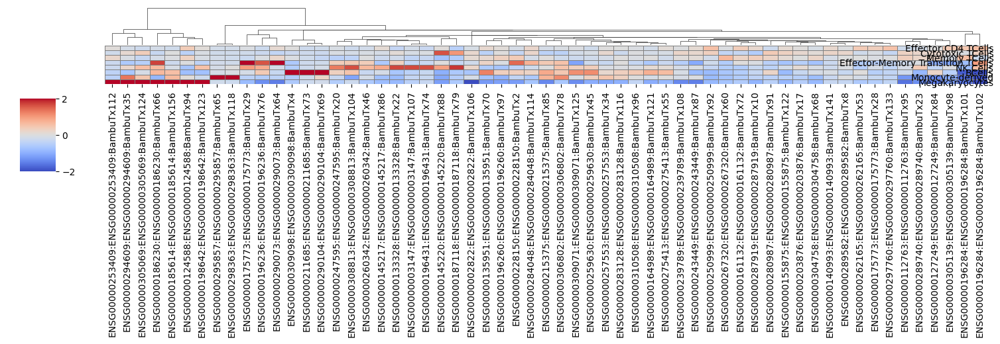

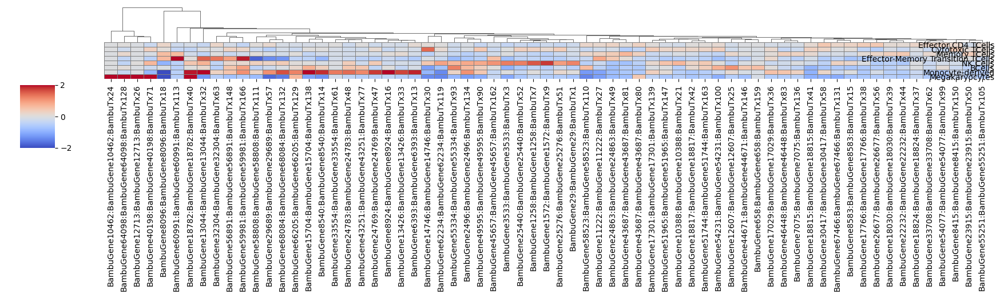

In [8]:
# -------- calls (each subset already enforced by your split step) --------
celltype_order = [
    "Effector CD4 TCells", "Cytotoxic TCells", "Memory TCells",
    "Effector-Memory Transition TCells", "NK Cells", "BCells",
    "Monocyte-derived", "Megakaryocytes"
]

# ENSG:BambuTx (known gene / novel isoform)
if len(df_known):
    plot_clustermap_with_coexpression(
        df_known,
        os.path.join(FIG_DIR, "known_gene__BambuTx_subcelltype_heatmap_clustered_coexpression.pdf"),
        vmax=2, celltype_order=celltype_order
    )
else:
    print("[plot] df_known empty — skipping known plots.")

# BambuGene:BambuTx (novel gene / novel isoform)
if len(df_novel):
    plot_clustermap_with_coexpression(
        df_novel,
        os.path.join(FIG_DIR, "bambu_gene__BambuTx_subcelltype_heatmap_clustered_coexpression.pdf"),
        vmax=2, celltype_order=celltype_order
    )
else:
    print("[plot] df_novel empty — skipping novel plots.")

In [22]:
bambu_genes_present = [g for g in z_expr.index if g.startswith("BambuGene")]
print(f"✅ Found {len(bambu_genes_present)} Bambu genes in gene expression matrix.")

✅ Found 72 Bambu genes in gene expression matrix.


In [16]:
import os, re, gzip, shutil, urllib.request
import pandas as pd
from goatools.obo_parser import GODag
from goatools.associations import read_gaf

# ---------- INPUTS ----------
gtf_file = "Homo_sapiens.GRCh38.113.gtf"
clusters_csv = "Intermediate_Files/novel_bambu_cluster_labels.csv"

# Load your cluster labels produced earlier (Gene, Cluster)
clustered = pd.read_csv(clusters_csv)

# 1) Build a gene symbol -> ENSG mapping from the GTF (use only 'gene' features)
gtf = pd.read_csv(
    gtf_file, sep="\t", comment="#", header=None,
    names=["chrom","source","feature","start","end","score","strand","frame","attribute"],
    dtype=str
)
genes = gtf[gtf["feature"] == "gene"].copy()
genes["gene_id"]   = genes["attribute"].str.extract(r'gene_id "([^"]+)"')
genes["gene_name"] = genes["attribute"].str.extract(r'gene_name "([^"]+)"')

symbol_to_ensg = genes.dropna(subset=["gene_name","gene_id"]) \
                      .drop_duplicates(subset=["gene_name"]) \
                      .set_index("gene_name")["gene_id"]

# 2) Create ENSG column in your clustered table
# Try to extract ENSG directly from the Gene string (handles cases like "FOO:ENSG...:ENST..." or pure ENSG ids)
clustered["ENSG"] = clustered["Gene"].str.extract(r'(ENSG\d{11})', expand=False)

# For rows still missing ENSG, try symbol -> ENSG via GTF
mask_missing = clustered["ENSG"].isna()
if mask_missing.any():
    clustered.loc[mask_missing, "ENSG"] = clustered.loc[mask_missing, "Gene"].map(symbol_to_ensg)

# Optional: if your var_names look like "GENE:ENSG:ENST", try splitting as a fallback
mask_missing = clustered["ENSG"].isna()
if mask_missing.any():
    # If Gene contains colon-separated fields, the middle might be ENSG
    def try_split_get_ensg(x):
        parts = str(x).split(":")
        for p in parts:
            if re.fullmatch(r"ENSG\d{11}", p):
                return p
        return None
    clustered.loc[mask_missing, "ENSG"] = clustered.loc[mask_missing, "Gene"].map(try_split_get_ensg)

# Keep only rows where we actually have an ENSG (Bambu-only entries without ENSG can't be mapped to UniProt)
clustered = clustered.dropna(subset=["ENSG"]).copy()

print("Preview clustered with ENSG:")
print(clustered.head())
print("Rows with ENSG:", len(clustered))

Preview clustered with ENSG:
                      Gene  Cluster             ENSG
72  TSPAN6:ENSG00000000003        5  ENSG00000000003
73    DPM1:ENSG00000000419        1  ENSG00000000419
74   SCYL3:ENSG00000000457        1  ENSG00000000457
75   FIRRM:ENSG00000000460        7  ENSG00000000460
76     FGR:ENSG00000000938        1  ENSG00000000938
Rows with ENSG: 23749


In [23]:
import os, gzip, shutil, urllib.request
import pandas as pd
from goatools.obo_parser import GODag
from goatools.associations import read_gaf

# ---------- CONFIG ----------
GO_DIR = "go_files"
OBO_PATH = os.path.join(GO_DIR, "go-basic.obo")
GAF_GZ_PATH = os.path.join(GO_DIR, "goa_human.gaf.gz")
GAF_PATH = os.path.join(GO_DIR, "goa_human.gaf")

OBO_URL = "http://geneontology.org/ontology/go-basic.obo"
GAF_URL = "http://current.geneontology.org/annotations/goa_human.gaf.gz"  # UniProtKB-based human annotation
# ----------------------------

os.makedirs(GO_DIR, exist_ok=True)

def _download(url, dest):
    print(f"⬇️  Downloading {os.path.basename(dest)} …")
    urllib.request.urlretrieve(url, dest)

def ensure_go_files():
    # Ontology
    if not os.path.isfile(OBO_PATH):
        _download(OBO_URL, OBO_PATH)
    # GAF
    if not os.path.isfile(GAF_PATH):
        if not os.path.isfile(GAF_GZ_PATH):
            _download(GAF_URL, GAF_GZ_PATH)
        # gunzip
        print("🗜️  Decompressing goa_human.gaf.gz …")
        with gzip.open(GAF_GZ_PATH, "rb") as f_in, open(GAF_PATH, "wb") as f_out:
            shutil.copyfileobj(f_in, f_out)

ensure_go_files()

print("🔎 Mapping Ensembl → UniProt …")

# --- Build ENSG -> UniProt mapping from GOA Human GAF (no extra downloads) ---
# GAF columns (0-based): 0 DB, 1 DB_Object_ID (UniProt), ..., 10 Synonym
# Synonym often contains entries like 'Ensembl:ENSG00000123456'
ensembl_to_uniprot = {}

with open(GAF_PATH, "r", encoding="utf-8") as fh:
    for line in fh:
        if not line or line[0] == "!":
            continue  # comments/header
        parts = line.rstrip("\n").split("\t")
        if len(parts) < 11 or parts[0] != "UniProtKB":
            continue
        uniprot_acc = parts[1]                     # e.g., P12345 or Q9XXXX
        synonyms = parts[10] or ""                 # may be empty
        for syn in synonyms.split("|"):
            # Expect formats like 'Ensembl:ENSG00000123456' or 'Ensembl_TRS:ENST...'
            if syn.startswith("Ensembl:ENSG"):
                ensg = syn.split(":", 1)[1]
                ensembl_to_uniprot.setdefault(ensg, set()).add(uniprot_acc)

# Turn sets into deterministic lists (sorted) for stable behavior
ensembl_to_uniprot = {k: sorted(v) for k, v in ensembl_to_uniprot.items()}

def choose_uniprot(hit):
    """
    hit can be None/NaN/[], a list, or a comma/semicolon-separated string.
    If multiple UniProt accessions, pick the first deterministically.
    (If you want to prefer Swiss-Prot, you can add a 'reviewed' set and prefer those.)
    """
    if hit is None or (isinstance(hit, float) and pd.isna(hit)):
        return pd.NA
    if isinstance(hit, str):
        parts = [p.strip() for p in hit.replace(",", ";").split(";") if p.strip()]
    elif isinstance(hit, (list, set, tuple)):
        parts = list(hit)
    else:
        return pd.NA
    return parts[0] if parts else pd.NA

# Map and report
clustered["UniProt"] = clustered["ENSG"].map(lambda x: choose_uniprot(ensembl_to_uniprot.get(x)))
n_dups  = (clustered["ENSG"].value_counts() > 1).sum()
n_nohit = clustered["UniProt"].isna().sum()
print(f"   • Ensembl entries with duplicate rows in your table: {n_dups}")
print(f"   • Ensembl IDs with no UniProt mapping (via GOA): {n_nohit}")

# Keep only rows with a UniProt accession
clustered_up = clustered.dropna(subset=["UniProt"]).copy()

# 2) Load GO resources
print("📖 Loading GO DAG and human annotations …")
obodag = GODag(OBO_PATH)
geneid2gos_all = read_gaf(GAF_PATH)

# Filter to Biological Process (or MF/CC if you prefer)
def filter_namespace(g2g, dag, namespace="biological_process"):
    out = {}
    for acc, gos in g2g.items():
        keep = {go for go in gos if go in dag and dag[go].namespace == namespace}
        if keep:
            out[acc] = keep
    return out

geneid2gos_bp = filter_namespace(geneid2gos_all, obodag, "biological_process")

study_uniprot = set(clustered_up["UniProt"])
background_uniprot = set(geneid2gos_bp.keys()).union(study_uniprot)

print(f"✅ Study genes (UniProt): {len(study_uniprot)}")
print(f"✅ Background genes (UniProt): {len(background_uniprot)}")
print(f"✅ GOs in BP namespace: {len({go for s in geneid2gos_bp.values() for go in s})}")

🔎 Mapping Ensembl → UniProt …
   • Ensembl entries with duplicate rows in your table: 0
   • Ensembl IDs with no UniProt mapping (via GOA): 23749
📖 Loading GO DAG and human annotations …
go_files/go-basic.obo: fmt(1.2) rel(2025-07-22) 43,230 Terms
HMS:0:00:20.690908 993,392 annotations READ: go_files/goa_human.gaf 
36540 IDs in loaded association branch, BP
✅ Study genes (UniProt): 0
✅ Background genes (UniProt): 36540
✅ GOs in BP namespace: 12305


In [25]:
import os, re, csv, gzip, shutil, urllib.request
import pandas as pd

# -------------------- Load cluster labels --------------------
clusters = pd.read_csv("Intermediate_Files/novel_bambu_cluster_labels.csv")

# 0) Sanity
if "Cluster" not in clusters.columns:
    raise ValueError("Expected a 'Cluster' column in novel_bambu_cluster_labels.csv")

# 1) Build/normalize an ENSG column if needed
if "ENSG" not in clusters.columns:
    if "Gene" in clusters.columns:
        clusters["ENSG"] = clusters["Gene"].str.extract(r"(ENSG\d{11})", expand=False)
    else:
        clusters["ENSG"] = pd.NA

In [26]:
# -------------------- Ensure GO resources & ENSG→UniProt mapping --------------------
GO_DIR = "go_files"
OBO_PATH = os.path.join(GO_DIR, "go-basic.obo")
GAF_GZ_PATH = os.path.join(GO_DIR, "goa_human.gaf.gz")
GAF_PATH = os.path.join(GO_DIR, "goa_human.gaf")

os.makedirs(GO_DIR, exist_ok=True)
if not os.path.isfile(OBO_PATH):
    urllib.request.urlretrieve("http://geneontology.org/ontology/go-basic.obo", OBO_PATH)
if not os.path.isfile(GAF_PATH):
    if not os.path.isfile(GAF_GZ_PATH):
        urllib.request.urlretrieve("http://current.geneontology.org/annotations/goa_human.gaf.gz", GAF_GZ_PATH)
    with gzip.open(GAF_GZ_PATH, "rb") as fin, open(GAF_PATH, "wb") as fout:
        shutil.copyfileobj(fin, fout)

# Build ENSG -> UniProt mapping from GOA GAF synonyms (UniProtKB ↔ Ensembl)
def build_ensembl_to_uniprot_from_gaf(gaf_path: str) -> dict:
    mapping = {}
    with open(gaf_path, "r", encoding="utf-8") as fh:
        for line in fh:
            if not line or line[0] == "!":
                continue
            p = line.rstrip("\n").split("\t")
            if len(p) < 11 or p[0] != "UniProtKB":
                continue
            up = p[1]
            syns = (p[10] or "").split("|")
            for syn in syns:
                if syn.startswith("Ensembl:ENSG"):
                    ensg = syn.split(":", 1)[1]
                    mapping.setdefault(ensg, set()).add(up)
    return {k: sorted(v) for k, v in mapping.items()}

ensembl_to_uniprot = build_ensembl_to_uniprot_from_gaf(GAF_PATH)

# 2) If a UniProt column already exists, keep it; otherwise map from ENSG
if "UniProt" not in clusters.columns:
    def choose_uniprot(hit):
        if hit is None or (isinstance(hit, float) and pd.isna(hit)):
            return pd.NA
        if isinstance(hit, (list, set, tuple)):
            hit = list(hit)
            return hit[0] if hit else pd.NA
        parts = [p.strip() for p in str(hit).replace(",", ";").split(";") if p.strip()]
        return parts[0] if parts else pd.NA

    clusters["UniProt"] = clusters["ENSG"].map(lambda x: choose_uniprot(ensembl_to_uniprot.get(x)))

# 3) Optional: keep only Bambu genes for this analysis (and any row with an ENSG)
if "Gene" in clusters.columns:
    clusters = clusters[clusters["Gene"].fillna("").str.startswith("BambuGene") | clusters["ENSG"].notna()].copy()

# 4) Drop NA UniProt safely
clusters_up = clusters.dropna(subset=["UniProt"]).copy()

print("Preview after mapping:")
print(clusters_up[["Gene", "ENSG", "UniProt", "Cluster"]].head())
print("Counts per cluster (mapped to UniProt):")
print(clusters_up["Cluster"].value_counts())

Preview after mapping:
Empty DataFrame
Columns: [Gene, ENSG, UniProt, Cluster]
Index: []
Counts per cluster (mapped to UniProt):
Series([], Name: count, dtype: int64)


In [34]:
import os, csv

out_tsv = "Intermediate_Files/Bambu_GOATOOLS_Enrichment.tsv"
os.makedirs(os.path.dirname(out_tsv), exist_ok=True)

n_rows = 0
FDR_CUTOFF = 0.01
MIN_STUDY_COUNT = 5

with open(out_tsv, "w", newline="") as f:
    w = csv.writer(f, delimiter="\t")
    # NOTE: "Genes" holds a SINGLE UniProt per row (the gene that actually annotated the term)
    w.writerow(["Cluster", "GO ID", "Term", "FDR", "Enrichment", "Genes"])

    for cl in clusters_up["Cluster"].unique():
        study_ids = set(clusters_up.loc[clusters_up["Cluster"] == cl, "UniProt"])
        study_ids &= background_uniprot
        if len(study_ids) < 2:
            continue

        res = goeaobj.run_study(list(study_ids))

        # keep stricter terms only
        sig = [r for r in res
               if getattr(r, "p_fdr_bh", 1.0) < FDR_CUTOFF and r.study_count >= MIN_STUDY_COUNT]

        for r in sig:
            # assign term only to genes that actually annotated to it
            for gid in sorted(r.study_items):
                w.writerow([
                    cl,
                    r.GO,
                    r.name,
                    f"{r.p_fdr_bh:.3g}",
                    r.enrichment,     # 'e' or 'p'
                    gid               # UniProt ID (single)
                ])
                n_rows += 1

print(f"✅ Wrote: {out_tsv}  (rows: {n_rows})")


Runing  Ontology Analysis: current study set of 32 IDs.
100%     32 of     32 study items found in association
100%     32 of     32 study items found in population(36540)
Calculating 14,626 uncorrected p-values using fisher_scipy_stats
  14,626 terms are associated with 36,540 of 36,540 population items
   1,011 terms are associated with     32 of     32 study items
  METHOD fdr_bh:
       2 GO terms found significant (< 0.05=alpha) (  2 enriched +   0 purified): statsmodels fdr_bh
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Runing  Ontology Analysis: current study set of 7990 IDs.
100%  7,990 of  7,990 study items found in association
100%  7,990 of  7,990 study items found in population(36540)
Calculating 14,626 uncorrected p-values using fisher_scipy_stats
  14,626 terms are associated with 36,540 of 36,540 population items
  12,174 terms are associated with  7,990 of  7,990 study items
  ME

In [35]:
import pandas as pd

# Load data
clusters = pd.read_csv("Intermediate_Files/novel_bambu_cluster_labels.csv")
go_terms = pd.read_csv("Intermediate_Files/Bambu_GOATOOLS_Enrichment.tsv", sep="\t")

# Filter for Bambu genes
bambu_genes = clusters[clusters["Gene"].str.startswith("BambuGene")]

# Merge to assign GO terms by cluster
merged = bambu_genes.merge(go_terms, how="left", left_on="Cluster", right_on="Cluster")

# Save long-format
long_df = merged[["Gene", "Cluster", "GO ID", "Term", "FDR", "Enrichment", "Genes"]]
long_df.to_csv("Intermediate_Files/Bambu_Predicted_Functions_Long.tsv", sep="\t", index=False)

# Build summary per gene
summary_df = long_df.groupby("Gene").agg({
    "Cluster": "first",
    "GO ID": lambda x: "; ".join(x.dropna().unique()),
    "Term": lambda x: "; ".join(x.dropna().unique()),
    "FDR": lambda x: "; ".join(map(lambda v: f"{v:.3g}", x.dropna())),
}).reset_index()

summary_df.to_csv("Intermediate_Files/Bambu_Predicted_Functions_Summary.tsv", sep="\t", index=False)

print("✅ Functional predictions saved:")
print("  • Long format: Bambu_Predicted_Functions_Long.tsv")
print("  • Summary per gene: Bambu_Predicted_Functions_Summary.tsv")

✅ Functional predictions saved:
  • Long format: Bambu_Predicted_Functions_Long.tsv
  • Summary per gene: Bambu_Predicted_Functions_Summary.tsv


/tmp/ipykernel_595913/782895164.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=term_counts.head(15), y="GO Term", x="Count", palette="viridis")


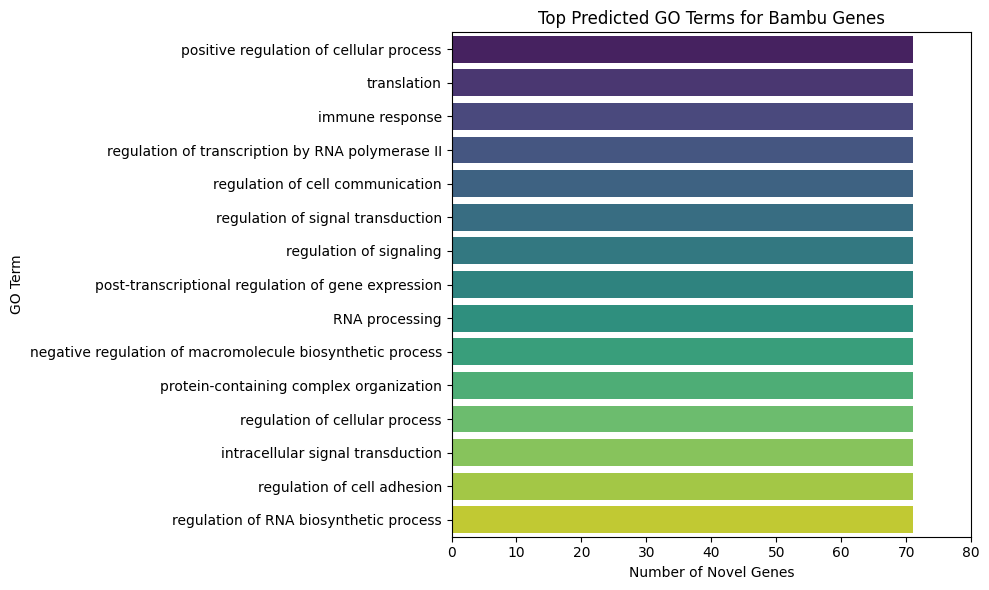

In [36]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load long-format predictions
df = pd.read_csv("Intermediate_Files/Bambu_Predicted_Functions_Long.tsv", sep="\t")

# Count how often each GO term is predicted
term_counts = df[["Gene", "Term"]].drop_duplicates()
term_counts = term_counts["Term"].value_counts().reset_index()
term_counts.columns = ["GO Term", "Count"]

# Plot top 20 terms
plt.figure(figsize=(10, 6))
sns.barplot(data=term_counts.head(15), y="GO Term", x="Count", palette="viridis")
plt.title("Top Predicted GO Terms for Bambu Genes")
plt.xlabel("Number of Novel Genes")
plt.ylabel("GO Term")
plt.xlim(0, 80)  # adjust dynamically or set manually
plt.tight_layout()
plt.savefig("Intermediate_Files/Paper_Figs/Bambu_GO_Barplot.pdf", dpi=600)
plt.show()

In [37]:
df = pd.read_csv("Intermediate_Files/Bambu_Predicted_Functions_Long.tsv", sep="\t")
print(df.groupby("Term")["Gene"].nunique().sort_values(ascending=False).head(10))

Term
negative regulation of gene expression                       71
regulation of transcription by RNA polymerase II             71
negative regulation of macromolecule biosynthetic process    71
negative regulation of biosynthetic process                  71
negative regulation of multicellular organismal process      71
negative regulation of response to stimulus                  71
multicellular organismal-level homeostasis                   71
multicellular organismal process                             71
system process                                               71
organelle organization                                       71
Name: Gene, dtype: int64


In [33]:
gene_term_counts = df.groupby("Gene")["Term"].nunique()
print(gene_term_counts.describe())

count      72.000000
mean     2566.263889
std      1820.705234
min         0.000000
25%       415.000000
50%      4210.000000
75%      4210.000000
max      4210.000000
Name: Term, dtype: float64


In [90]:
df = pd.read_csv("Intermediate_Files/Bambu_Predicted_Functions_Long.tsv", sep="\t")
print("🔍 Unique clusters among Bambu genes:", df["Cluster"].nunique())
print("🔍 GO terms per Bambu gene (top 5):") 
print(df.groupby("Gene")["Term"].nunique().sort_values(ascending=False).head())

🔍 Unique clusters among Bambu genes: 6
🔍 GO terms per Bambu gene (top 5):
Gene
BambuGene1145     30
BambuGene1277     30
BambuGene13114    30
BambuGene13851    30
BambuGene14461    30
Name: Term, dtype: int64


In [11]:
import pandas as pd
from goatools.obo_parser import GODag
from goatools.associations import read_gaf
from goatools.go_enrichment import GOEnrichmentStudy
from mygene import MyGeneInfo

# Step 1: Load your clustered gene table
clustered = pd.read_csv("Intermediate_Files/novel_bambu_cluster_labels.csv")

# Step 2: Define your target genes
target_genes = [
    "TRBV7-4", "IGLC2", "ENSG00000305069", "SUPT3H", "TALAM1", "LYAR", "CMC1", "TARP",
    "ENSG00000306802", "ENSG00000294609", "ANAPC16", "ENSG00000308813", "TSGA10", "MYL5",
    "lnc-NMNAT1-1", "HSF5", "ENSG00000309071", "RLN1", "ZBTB44", "SLC26A1", "C4orf48", "CRYBA4",
    "PLAAT2", "lnc-SNAPC5-1", "SFTA2", "MMP28", "ENSG00000298413", "ENSG00000294968", "RLN2",
    "ENSG00000308992", "ATP13A4", "RPS9P4", "ENSG00000309098", "MAD1L", "XPNPEP3", "RARRES2P11",
    "ENSG00000299127", "lnc-SMARCC2-2", "ENSG00000305139", "lnc-UQCRFS1"
]

# Step 3: Extract matching rows from clustered file
clustered["GeneName"] = clustered["Gene"].str.split(":").str[0]
targets_df = clustered[clustered["GeneName"].isin(target_genes)]

# Step 4: Map ENSG → UniProt
mg = MyGeneInfo()
ensg_ids = clustered["Gene"].str.extract(r"(ENSG\d+)", expand=False).dropna().unique().tolist()
query = mg.querymany(ensg_ids, scopes="ensembl.gene", fields="uniprot.Swiss-Prot", species="human", as_dataframe=True)
query = query[~query.index.duplicated(keep='first')]
ensg_to_uniprot = query["uniprot.Swiss-Prot"].dropna().map(lambda x: x[0] if isinstance(x, list) else x).to_dict()
clustered["ENSG"] = clustered["Gene"].str.extract(r"(ENSG\d+)", expand=False)
clustered["UniProt"] = clustered["ENSG"].map(ensg_to_uniprot)

# Step 5: Load GO annotations
obodag = GODag("go-basic.obo")
geneid2gos = read_gaf("goa_human.gaf", namespace="BP")
background_genes = set(geneid2gos.keys())

# Step 6: Run GO enrichment per gene's cluster
results = []

for gene in target_genes:
    gene_row = targets_df[targets_df["GeneName"] == gene]
    if gene_row.empty:
        continue
    cluster_id = gene_row["Cluster"].values[0]
    cluster_genes = clustered[clustered["Cluster"] == cluster_id]

    known_uniprot = cluster_genes[cluster_genes["Gene"].str.contains("ENSG")]["UniProt"].dropna().tolist()
    known_uniprot = [g for g in known_uniprot if g in geneid2gos]

    if len(known_uniprot) < 5:
        continue

    goea = GOEnrichmentStudy(background_genes, geneid2gos, obodag, methods=["fdr_bh"], alpha=0.05)
    enriched = [r for r in goea.run_study(known_uniprot) if r.p_fdr_bh < 0.05]

    for r in sorted(enriched, key=lambda x: x.p_fdr_bh)[:20]:
        results.append({
            "Gene": gene,
            "Cluster": cluster_id,
            "GO ID": r.GO,
            "Term": r.name,
            "FDR": r.p_fdr_bh,
            "Enrichment": r.enrichment,
            "Genes": ";".join(r.study_items)
        })

# Step 7: Save results
df = pd.DataFrame(results)
df.to_csv("Intermediate_Files/Bambu_GeneswithNovelTranscripts_GO_Enrichment.tsv", sep="\t", index=False)
print("✅ GO enrichment complete for gene-level targets.")

Input sequence provided is already in string format. No operation performed
Input sequence provided is already in string format. No operation performed
11 input query terms found dup hits:	[('ENSG00000215156', 2), ('ENSG00000234162', 2), ('ENSG00000268595', 2), ('ENSG00000275405', 4), ('E
1 input query terms found no hit:	['ENSG00000189144']


go-basic.obo: fmt(1.2) rel(2025-03-16) 43,544 Terms
HMS:0:00:19.326530 969,176 annotations READ: goa_human.gaf 
36411 IDs in loaded association branch, BP

Load  Ontology Enrichment Analysis ...
Propagating term counts up: is_a
100% 36,411 of 36,411 population items found in association

Runing  Ontology Analysis: current study set of 1847 IDs.
100%  1,833 of  1,833 study items found in association
 99%  1,833 of  1,847 study items found in population(36411)
Calculating 14,716 uncorrected p-values using fisher_scipy_stats
  14,716 terms are associated with 36,411 of 36,411 population items
   8,144 terms are associated with  1,833 of  1,833 study items
  METHOD fdr_bh:
   2,073 GO terms found significant (< 0.05=alpha) (2036 enriched +  37 purified): statsmodels fdr_bh
   1,833 study items associated with significant GO IDs (enriched)
     883 study items associated with significant GO IDs (purified)

Load  Ontology Enrichment Analysis ...
Propagating term counts up: is_a
100% 36,411 o

In [12]:
import pandas as pd

# Load results from your gene-level GO enrichment
enriched = pd.read_csv("Intermediate_Files/Bambu_GeneswithNovelTranscripts_GO_Enrichment.tsv", sep="\t")

# Save long format directly
long_df = enriched[["Gene", "Cluster", "GO ID", "Term", "FDR", "Enrichment", "Genes"]]
long_df.to_csv("Intermediate_Files/Bambu_GeneswithNovelTranscripts_PredictedFunctions_Long.tsv", sep="\t", index=False)

# Build summary per gene
summary_df = long_df.groupby("Gene").agg({
    "Cluster": "first",
    "GO ID": lambda x: "; ".join(x.dropna().unique()),
    "Term": lambda x: "; ".join(x.dropna().unique()),
    "FDR": lambda x: "; ".join(map(lambda v: f"{v:.3g}", x.dropna())),
}).reset_index()

summary_df.to_csv("Intermediate_Files/Bambu_GeneswithNovelTranscripts_PredictedFunctions_Summary.tsv", sep="\t", index=False)

print("✅ Functional predictions saved for target genes:")
print("  • Long format: Bambu_GeneswithNovelTranscripts_PredictedFunctions_Long.tsv")
print("  • Summary:     Bambu_GeneswithNovelTranscripts_PredictedFunctions_Summary.tsv")

✅ Functional predictions saved for target genes:
  • Long format: Bambu_GeneswithNovelTranscripts_PredictedFunctions_Long.tsv
  • Summary:     Bambu_GeneswithNovelTranscripts_PredictedFunctions_Summary.tsv


/tmp/ipykernel_3790678/844359962.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=term_counts.head(15), y="GO Term", x="Count", palette="magma")


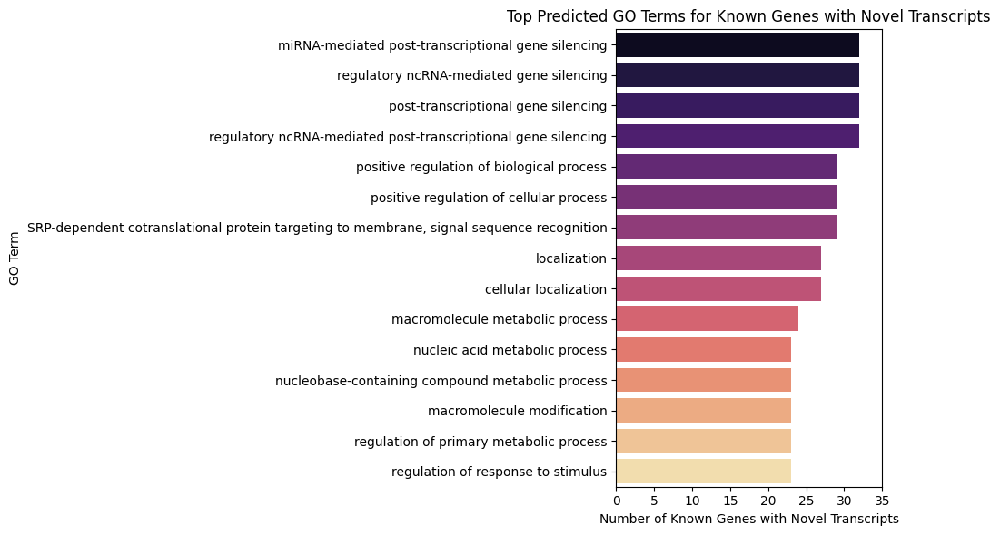

In [13]:
import seaborn as sns
import matplotlib.pyplot as plt

# Load long-format predictions
df = pd.read_csv("Intermediate_Files/Bambu_GeneswithNovelTranscripts_PredictedFunctions_Long.tsv", sep="\t")


# Count how often each GO term is predicted
term_counts = df[["Gene", "Term"]].drop_duplicates()
term_counts = term_counts["Term"].value_counts().reset_index()
term_counts.columns = ["GO Term", "Count"]

# Plot top 15 terms
plt.figure(figsize=(10, 6))
sns.barplot(data=term_counts.head(15), y="GO Term", x="Count", palette="magma")
plt.title("Top Predicted GO Terms for Known Genes with Novel Transcripts")
plt.xlabel("Number of Known Genes with Novel Transcripts")
plt.ylabel("GO Term")
plt.xlim(0,35)  # adjust if needed
plt.tight_layout()
plt.savefig("Intermediate_Files/Paper_Figs/Bambu_GeneswithNovelTranscripts_GO_Barplot.pdf", dpi=600)
plt.show()

In [10]:
df = pd.read_csv("Intermediate_Files/Bambu_GeneswithNovelTranscripts_PredictedFunctions_Long.tsv", sep="\t")
print(df.groupby("Term")["Gene"].nunique().sort_values(ascending=False).head(10))

Term
regulatory ncRNA-mediated gene silencing                                                    32
miRNA-mediated post-transcriptional gene silencing                                          32
regulatory ncRNA-mediated post-transcriptional gene silencing                               32
post-transcriptional gene silencing                                                         32
positive regulation of cellular process                                                     29
SRP-dependent cotranslational protein targeting to membrane, signal sequence recognition    29
positive regulation of biological process                                                   29
localization                                                                                27
cellular localization                                                                       27
macromolecule metabolic process                                                             24
Name: Gene, dtype: int64


In [15]:
df = pd.read_csv("Intermediate_Files/Bambu_GeneswithNovelTranscripts_GO_Enrichment.tsv", sep="\t")
print(df["Cluster"].nunique())

5


In [16]:
print("Unique GO terms:", df["Term"].nunique())

Unique GO terms: 66


In [ ]:
### NOW I want to perform GO enrichment on the isoform level

In [23]:
# ========== Step 0: Parse GTF and identify pseudogenes ==========
gtf_file = "Homo_sapiens.GRCh38.113.gtf"  # Update this as needed

transcript_biotype_dict = {}

with open(gtf_file, 'r') as f:
    for line in f:
        if line.startswith("#"):
            continue
        fields = line.strip().split('\t')
        if fields[2] != "transcript":
            continue
        attr_field = fields[8]
        attr_dict = {}
        for attr in attr_field.strip().split(';'):
            if attr.strip():
                key, value = attr.strip().split(' ', 1)
                attr_dict[key] = value.strip('"')
        transcript_id = attr_dict.get("transcript_id")
        biotype = attr_dict.get("transcript_biotype")
        if transcript_id and biotype:
            transcript_biotype_dict[transcript_id] = biotype

# Convert to DataFrame
transcript_biotype_df = pd.DataFrame(list(transcript_biotype_dict.items()), columns=['transcript_id', 'biotype'])

# Identify pseudogenes
pseudogenes = set(
    transcript_biotype_df.loc[
        transcript_biotype_df['biotype'].str.contains("pseudogene", na=False, case=False),
        'transcript_id'
    ]
)
print(f"Identified {len(pseudogenes)} pseudogenes.")

Identified 15209 pseudogenes.


In [25]:
import pandas as pd
import numpy as np
import requests
from tqdm import tqdm
import re
import seaborn as sns
import matplotlib.pyplot as plt

# ================================
# Step 1: Expression matrix (genes x cell types)
# ================================
X = adata_i_filtered.X.toarray() if hasattr(adata_i_filtered.X, "toarray") else adata_i_filtered.X
expr_df = pd.DataFrame(
    X,
    columns=adata_i_filtered.var_names,
    index=adata_i_filtered.obs["sub_cell_type"]
)

# ================================
# Step 2: Average expression per gene per cell type
# ================================
expr_avg = expr_df.groupby(expr_df.index, observed=False).mean().T  # genes x cell types

# ================================
# Step 3: Z-score by gene across cell types
# ================================
z_expr = expr_avg.sub(expr_avg.mean(axis=1), axis=0).div(expr_avg.std(axis=1), axis=0).fillna(0)

# ================================
# Step 4: Select top N genes per cell type
# ================================
top_n = 200
cell_types = expr_avg.columns

# Function to extract gene symbol from label
def extract_symbol(label):
    symbol = label.split(":")[0]
    return symbol if re.match(r"^[A-Z][A-Z0-9\-]*$", symbol) else None

# ================================
# g:Profiler API wrapper
# ================================
def query_gprofiler(gene_list):
    url = "https://biit.cs.ut.ee/gprofiler/api/gost/profile/"
    headers = {"Content-Type": "application/json"}
    payload = {
        "organism": "hsapiens",
        "query": gene_list,
        "sources": ["GO:BP", "GO:MF", "GO:CC", "KEGG", "REAC"],
        "user_threshold": 0.05,
        "significance_threshold_method": "fdr"
    }
    try:
        response = requests.post(url, headers=headers, json=payload)
        response.raise_for_status()
        return response.json().get("result", [])
    except Exception as e:
        print(f"⚠️ g:Profiler failed: {e}")
        return []

# ================================
# Step 5: Enrichment by cell type
# ================================
results = []

for cell_type in tqdm(cell_types, desc="Enriching pathways by cell type"):
    ranked_genes = expr_avg[cell_type].sort_values(ascending=False).index
    top_genes = [
        extract_symbol(g)
        for g in ranked_genes[:top_n]
        if extract_symbol(g)
    ]
    if not top_genes:
        print(f"⚠️ Skipping {cell_type}: no valid top genes.")
        continue

    enriched = query_gprofiler(top_genes)
    for e in enriched:
        results.append({
            "Cell_Type": cell_type,
            "Source": e["source"],
            "Term": e["name"],
            "P-value": e["p_value"],
            "FDR": e.get("p_value_fdr", e.get("p_value")),
            "Genes": ",".join(e.get("intersection", [])) if "intersection" in e else ""
        })

# ================================
# Step 6: Save results
# ================================
df_results = pd.DataFrame(results)
output_file = "Intermediate_Files/CellType_Pathway_Enrichment_gProfiler.tsv"
df_results.to_csv(output_file, sep="\t", index=False)
print(f"✅ Analysis complete! Results saved to {output_file}")

Enriching pathways by cell type: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:09<00:00,  1.13s/it]

✅ Analysis complete! Results saved to Intermediate_Files/CellType_Pathway_Enrichment_gProfiler.tsv


/tmp/ipykernel_2550674/3905734897.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_summary["Source"] = df_summary["Source"].replace({"REAC": "Reactome", "GO:BP": "GO"})


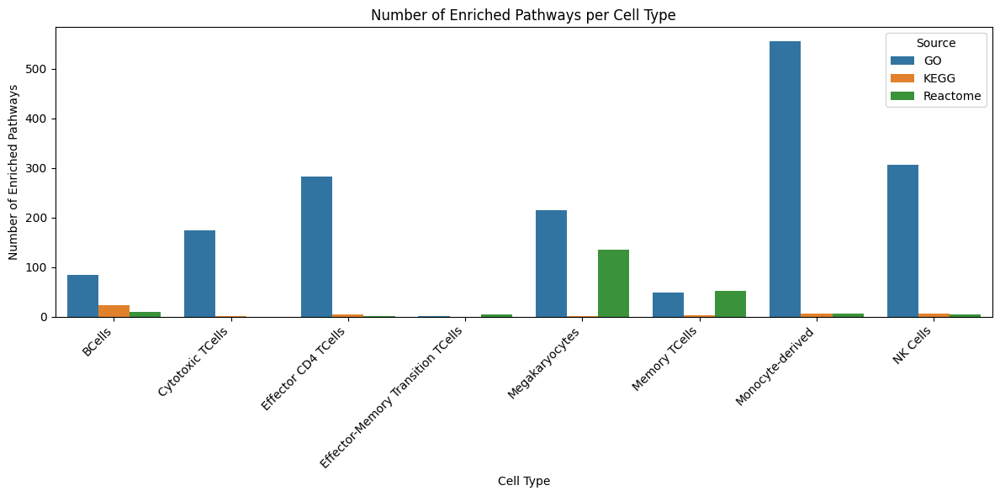

In [26]:
# ================================
# Step 7: Summary Bar Plot
# ================================
df_summary = df_results[df_results["Source"].isin(["REAC", "KEGG", "GO:BP"])]
df_summary["Source"] = df_summary["Source"].replace({"REAC": "Reactome", "GO:BP": "GO"})

summary_counts = (
    df_summary.groupby(["Cell_Type", "Source"])
    .size()
    .reset_index(name="Count")
)

plt.figure(figsize=(12, 6))
sns.barplot(data=summary_counts, x="Cell_Type", y="Count", hue="Source")
plt.title("Number of Enriched Pathways per Cell Type")
plt.xlabel("Cell Type")
plt.ylabel("Number of Enriched Pathways")
plt.xticks(rotation=45, ha='right')
plt.legend(title="Source")
plt.tight_layout()

plt.savefig("Intermediate_Files/Paper_Figs/enriched_pathways_per_cell_type.pdf",
            dpi=600, transparent=True, bbox_inches="tight")
plt.show()


🔎 Cell Type: BCells
  - B cell activation (GO:BP, FDR=2.43e-16)
  - B cell receptor signaling pathway (GO:BP, FDR=1.20e-14)
  - immune response-regulating cell surface receptor signaling pathway (GO:BP, FDR=8.63e-13)
  - lymphocyte activation (GO:BP, FDR=8.63e-13)
  - immune response (GO:BP, FDR=1.78e-12)
  - B cell receptor signaling pathway (KEGG, FDR=4.25e-11)
  - Hematopoietic cell lineage (KEGG, FDR=7.92e-11)
  - Antigen activates B Cell Receptor (BCR) leading to generation of second messengers (REAC, FDR=7.93e-09)
  - Signaling by the B Cell Receptor (BCR) (REAC, FDR=7.60e-08)
  - plasma membrane (GO:CC, FDR=7.68e-08)
  - external side of plasma membrane (GO:CC, FDR=1.17e-07)
  - cell periphery (GO:CC, FDR=1.17e-07)
  - IgM immunoglobulin complex (GO:CC, FDR=1.17e-07)
  - side of membrane (GO:CC, FDR=2.52e-07)
  - Primary immunodeficiency (KEGG, FDR=9.27e-06)
  - CD22 mediated BCR regulation (REAC, FDR=9.98e-06)
  - Epstein-Barr virus infection (KEGG, FDR=1.65e-05)
  - Intestina

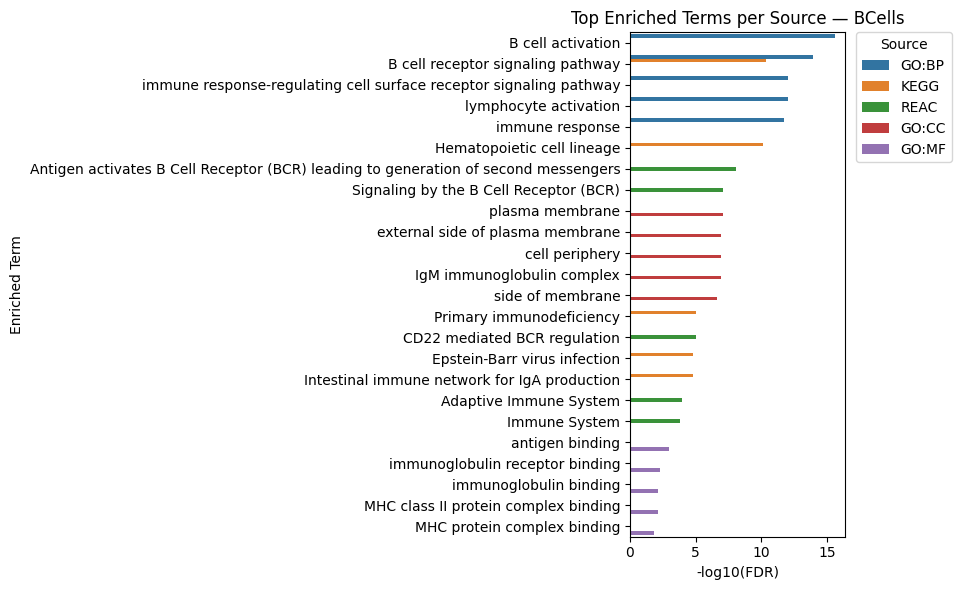


🔎 Cell Type: Cytotoxic TCells
  - response to stimulus (GO:BP, FDR=1.32e-04)
  - biological regulation (GO:BP, FDR=1.72e-04)
  - regulation of biological process (GO:BP, FDR=1.72e-04)
  - regulation of immune system process (GO:BP, FDR=1.72e-04)
  - negative regulation of biological process (GO:BP, FDR=4.32e-04)
  - chemokine binding (GO:MF, FDR=3.55e-03)
  - cytokine binding (GO:MF, FDR=5.19e-03)
  - cytokine receptor activity (GO:MF, FDR=7.04e-03)
  - chemokine receptor activity (GO:MF, FDR=8.71e-03)
  - C-C chemokine receptor activity (GO:MF, FDR=8.71e-03)
  - external side of plasma membrane (GO:CC, FDR=2.29e-02)
  - Cytokine-cytokine receptor interaction (KEGG, FDR=3.26e-02)


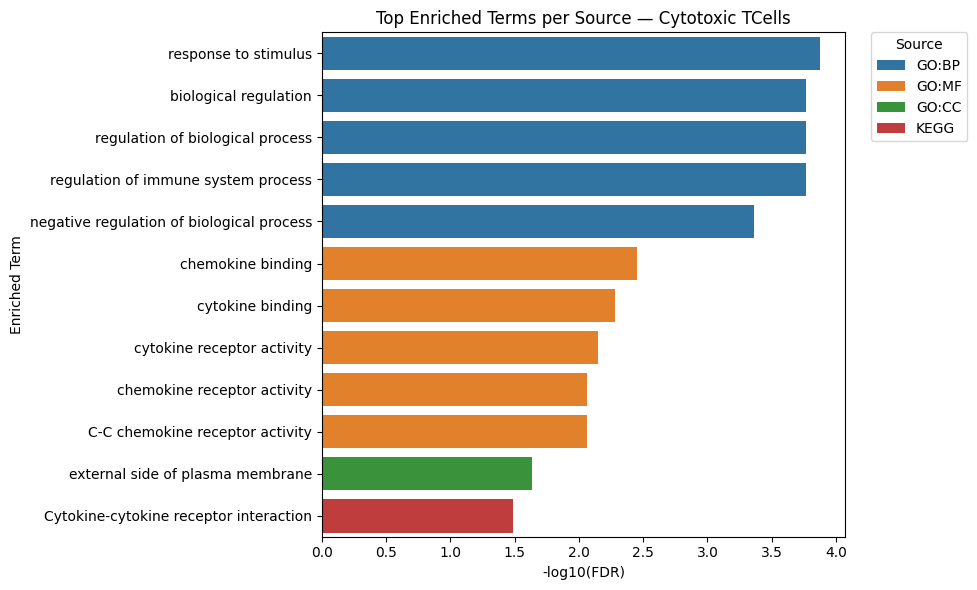


🔎 Cell Type: Effector CD4 TCells
  - positive regulation of lymphocyte activation (GO:BP, FDR=1.25e-05)
  - positive regulation of leukocyte activation (GO:BP, FDR=1.74e-05)
  - positive regulation of cell activation (GO:BP, FDR=1.98e-05)
  - cell adhesion (GO:BP, FDR=2.41e-05)
  - positive regulation of T cell activation (GO:BP, FDR=2.41e-05)
  - plasma membrane (GO:CC, FDR=1.24e-04)
  - membrane (GO:CC, FDR=1.24e-04)
  - cell periphery (GO:CC, FDR=1.24e-04)
  - external side of plasma membrane (GO:CC, FDR=2.21e-04)
  - side of membrane (GO:CC, FDR=2.33e-04)
  - Cytokine-cytokine receptor interaction (KEGG, FDR=6.16e-04)
  - NF-kappa B signaling pathway (KEGG, FDR=6.16e-04)
  - molecular transducer activity (GO:MF, FDR=2.15e-03)
  - signaling receptor activity (GO:MF, FDR=2.15e-03)
  - chemokine binding (GO:MF, FDR=2.15e-03)
  - tumor necrosis factor receptor binding (GO:MF, FDR=2.15e-03)
  - cytokine binding (GO:MF, FDR=2.84e-03)
  - Cytokine Signaling in Immune system (REAC, FDR=7.

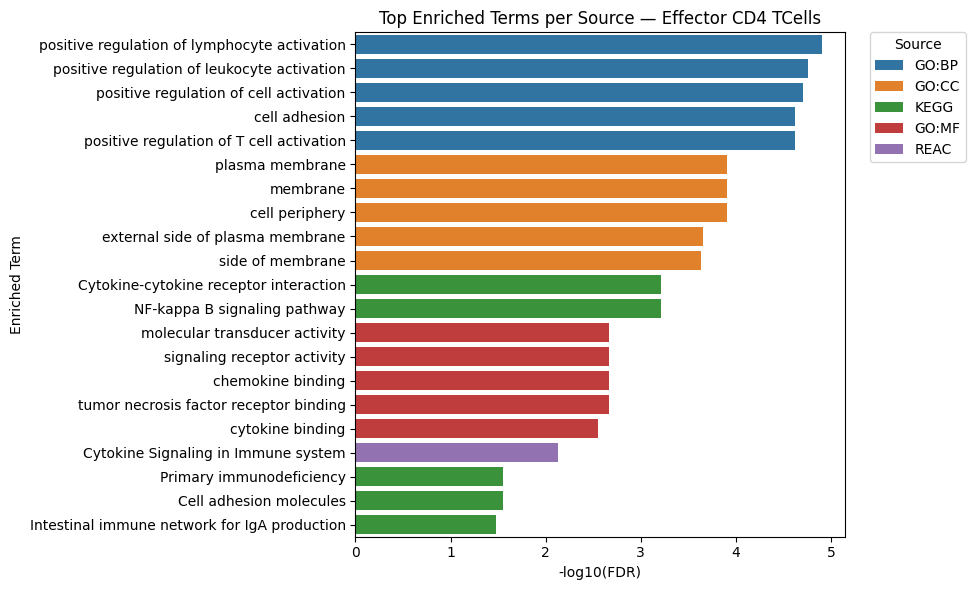


🔎 Cell Type: Effector-Memory Transition TCells
  - membrane-enclosed lumen (GO:CC, FDR=4.95e-08)
  - membrane-bounded organelle (GO:CC, FDR=4.95e-08)
  - intracellular organelle lumen (GO:CC, FDR=4.95e-08)
  - organelle lumen (GO:CC, FDR=4.95e-08)
  - nuclear lumen (GO:CC, FDR=1.42e-07)
  - protein binding (GO:MF, FDR=1.09e-04)
  - Metabolism of RNA (REAC, FDR=2.11e-03)
  - rRNA processing (REAC, FDR=5.43e-03)
  - Major pathway of rRNA processing in the nucleolus and cytosol (REAC, FDR=1.20e-02)
  - rRNA processing in the nucleus and cytosol (REAC, FDR=1.31e-02)
  - rRNA processing (GO:BP, FDR=1.31e-02)
  - rRNA metabolic process (GO:BP, FDR=2.50e-02)


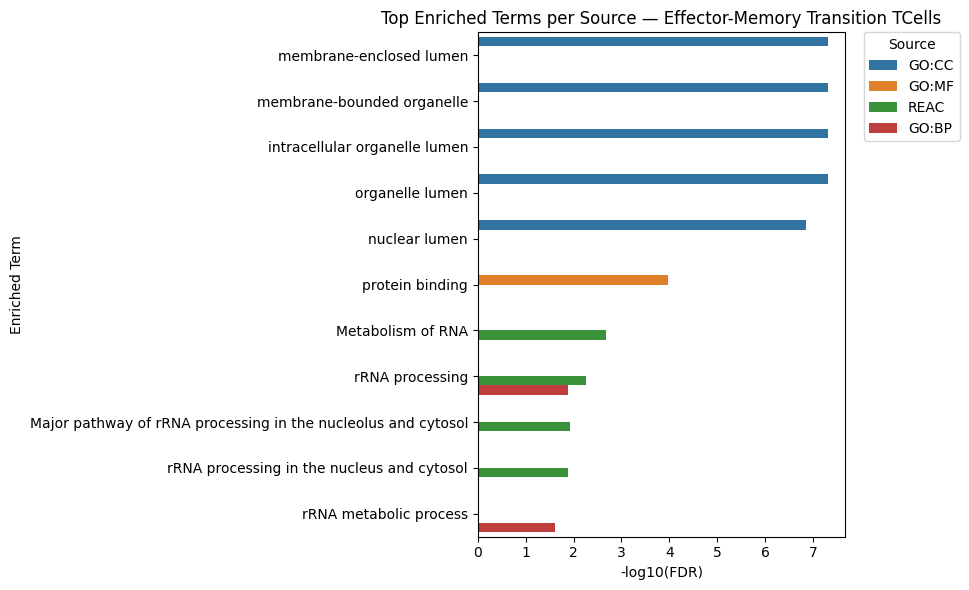


🔎 Cell Type: Megakaryocytes
  - hemostasis (GO:BP, FDR=4.91e-07)
  - vesicle (GO:CC, FDR=2.78e-06)
  - cytosol (GO:CC, FDR=7.24e-06)
  - platelet alpha granule (GO:CC, FDR=7.24e-06)
  - wound healing (GO:BP, FDR=7.76e-06)
  - response to wounding (GO:BP, FDR=7.76e-06)
  - blood coagulation (GO:BP, FDR=8.66e-06)
  - platelet activation (GO:BP, FDR=8.66e-06)
  - cytoplasm (GO:CC, FDR=2.17e-05)
  - Hemostasis (REAC, FDR=2.80e-05)
  - protein binding (GO:MF, FDR=4.07e-05)
  - Response to elevated platelet cytosolic Ca2+ (REAC, FDR=1.28e-04)
  - Factors involved in megakaryocyte development and platelet production (REAC, FDR=1.28e-04)
  - Platelet degranulation  (REAC, FDR=1.28e-04)
  - platelet alpha granule lumen (GO:CC, FDR=1.71e-04)
  - Platelet activation, signaling and aggregation (REAC, FDR=6.95e-04)
  - Gap junction (KEGG, FDR=9.89e-03)
  - protein serine/threonine kinase activity (GO:MF, FDR=2.39e-02)
  - purine nucleobase binding (GO:MF, FDR=2.39e-02)
  - nucleobase binding (GO:M

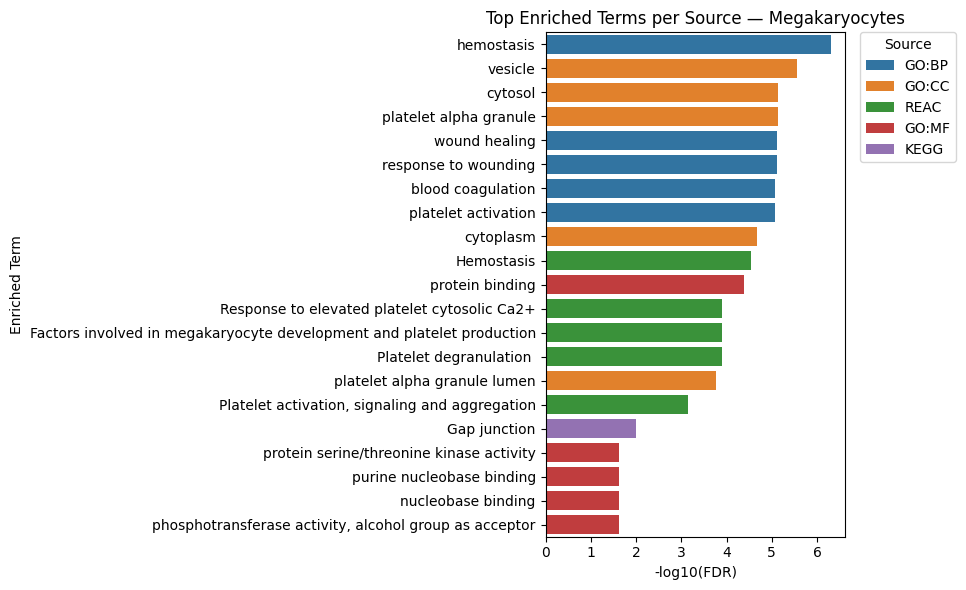


🔎 Cell Type: Memory TCells
  - Eukaryotic Translation Termination (REAC, FDR=6.97e-08)
  - Peptide chain elongation (REAC, FDR=6.97e-08)
  - Viral mRNA Translation (REAC, FDR=6.97e-08)
  - Eukaryotic Translation Elongation (REAC, FDR=6.97e-08)
  - Nonsense Mediated Decay (NMD) independent of the Exon Junction Complex (EJC) (REAC, FDR=6.97e-08)
  - cytosolic ribosome (GO:CC, FDR=5.77e-07)
  - ribosomal subunit (GO:CC, FDR=1.31e-05)
  - Ribosome (KEGG, FDR=2.39e-05)
  - Coronavirus disease - COVID-19 (KEGG, FDR=2.39e-05)
  - cell-substrate junction (GO:CC, FDR=5.07e-05)
  - focal adhesion (GO:CC, FDR=5.07e-05)
  - cytoplasmic translation (GO:BP, FDR=1.16e-04)
  - cytosolic small ribosomal subunit (GO:CC, FDR=4.08e-04)
  - positive regulation of macromolecule biosynthetic process (GO:BP, FDR=7.48e-03)
  - positive regulation of biosynthetic process (GO:BP, FDR=7.48e-03)
  - ribosomal small subunit biogenesis (GO:BP, FDR=7.48e-03)
  - negative regulation of apoptotic process (GO:BP, FDR=7

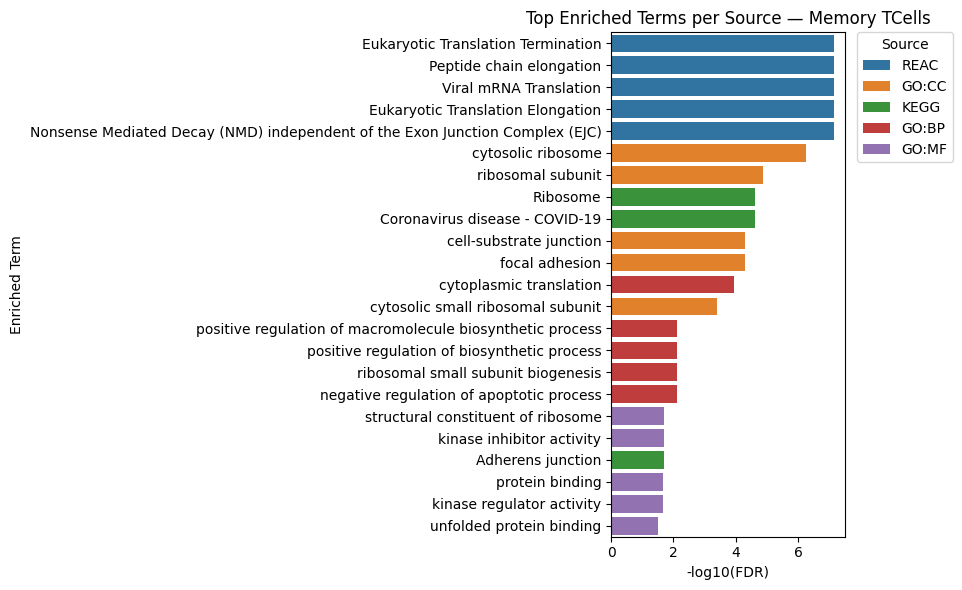


🔎 Cell Type: Monocyte-derived
  - regulation of immune system process (GO:BP, FDR=9.35e-17)
  - immune system process (GO:BP, FDR=9.35e-17)
  - Immune System (REAC, FDR=3.02e-16)
  - immune response (GO:BP, FDR=3.39e-16)
  - Innate Immune System (REAC, FDR=9.63e-16)
  - response to biotic stimulus (GO:BP, FDR=1.23e-15)
  - regulation of immune response (GO:BP, FDR=1.43e-15)
  - Neutrophil degranulation (REAC, FDR=1.98e-14)
  - secretory granule (GO:CC, FDR=1.50e-13)
  - cell periphery (GO:CC, FDR=2.70e-13)
  - secretory vesicle (GO:CC, FDR=7.89e-13)
  - plasma membrane (GO:CC, FDR=1.18e-12)
  - vesicle (GO:CC, FDR=3.44e-10)
  - molecular transducer activity (GO:MF, FDR=5.80e-06)
  - signaling receptor activity (GO:MF, FDR=5.80e-06)
  - inhibitory MHC class I receptor activity (GO:MF, FDR=5.80e-06)
  - MHC class I receptor activity (GO:MF, FDR=3.03e-05)
  - Immunoregulatory interactions between a Lymphoid and a non-Lymphoid cell (REAC, FDR=1.57e-04)
  - Osteoclast differentiation (KEGG

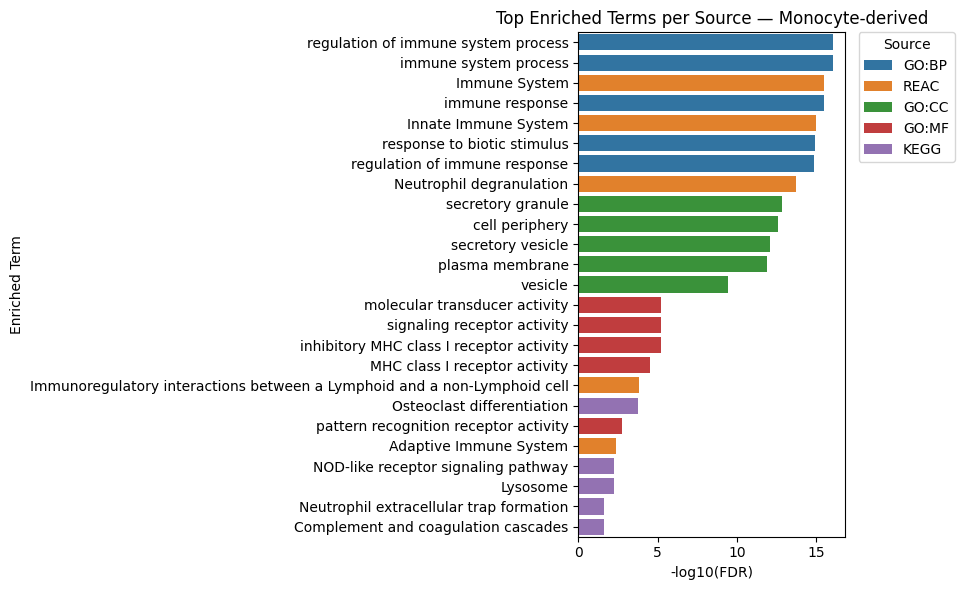


🔎 Cell Type: NK Cells
  - Natural killer cell mediated cytotoxicity (KEGG, FDR=4.82e-11)
  - leukocyte activation (GO:BP, FDR=4.23e-10)
  - immune effector process (GO:BP, FDR=4.23e-10)
  - leukocyte mediated immunity (GO:BP, FDR=4.23e-10)
  - cell activation (GO:BP, FDR=4.23e-10)
  - leukocyte mediated cytotoxicity (GO:BP, FDR=1.31e-09)
  - Immunoregulatory interactions between a Lymphoid and a non-Lymphoid cell (REAC, FDR=5.53e-06)
  - cell periphery (GO:CC, FDR=1.64e-05)
  - cytolytic granule (GO:CC, FDR=1.64e-05)
  - external side of plasma membrane (GO:CC, FDR=1.64e-05)
  - plasma membrane (GO:CC, FDR=1.74e-05)
  - cell surface (GO:CC, FDR=3.10e-05)
  - molecular transducer activity (GO:MF, FDR=4.97e-05)
  - immune receptor activity (GO:MF, FDR=4.97e-05)
  - transmembrane signaling receptor activity (GO:MF, FDR=4.97e-05)
  - signaling receptor activity (GO:MF, FDR=4.97e-05)
  - Graft-versus-host disease (KEGG, FDR=5.14e-05)
  - MHC class Ib receptor activity (GO:MF, FDR=8.23e-05)

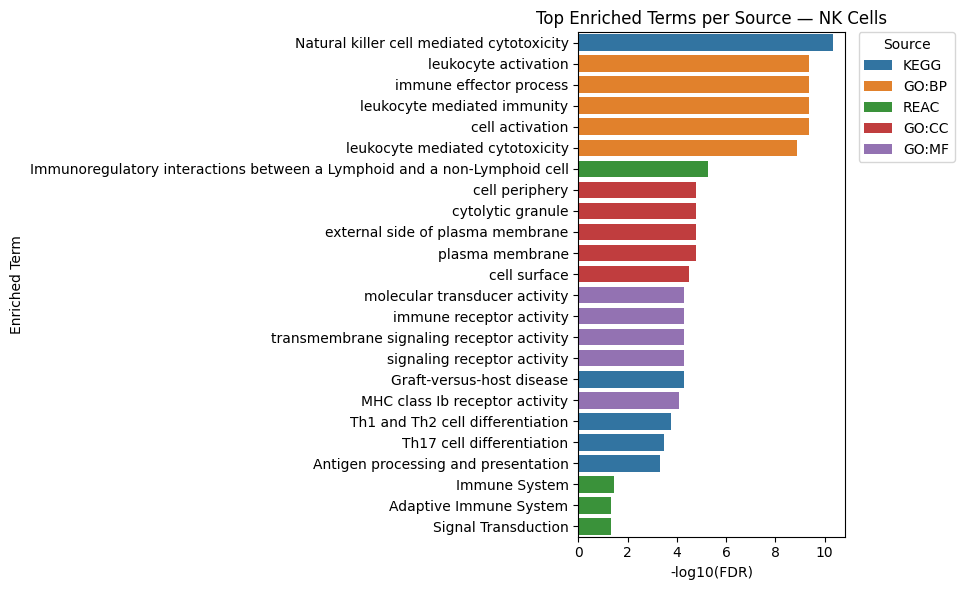

In [27]:
# ================================
# Step 8: Top Terms per Cell Type Plot
# ================================
df_results["-log10(FDR)"] = -np.log10(df_results["FDR"].replace(0, 1e-300))
df_results_filtered = df_results[df_results["Source"].isin(["REAC", "KEGG", "GO:BP", "GO:CC", "GO:MF"])]

for cell_type in df_results_filtered["Cell_Type"].unique():
    subset = df_results_filtered[df_results_filtered["Cell_Type"] == cell_type]
    top_terms = (
        subset.sort_values("FDR")
        .groupby("Source", group_keys=False)
        .head(5)
    )
    term_order = top_terms.sort_values("FDR")["Term"].unique()

    # Print the top terms with their sources and FDRs
    print(f"\n🔎 Cell Type: {cell_type}")
    for idx, row in top_terms.iterrows():
        print(f"  - {row['Term']} ({row['Source']}, FDR={row['FDR']:.2e})")

    plt.figure(figsize=(10, 6))
    sns.barplot(
        data=top_terms,
        y="Term",
        x="-log10(FDR)",
        hue="Source",
        order=term_order
    )
    plt.xlabel("-log10(FDR)")
    plt.ylabel("Enriched Term")
    plt.title(f"Top Enriched Terms per Source — {cell_type}")
    plt.legend(title="Source", bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
    plt.tight_layout()
    plt.show()

In [28]:
# ================================
# Step 9: Print top terms for each cell type
# ================================
print("\n📊 Top enriched terms per cell type:")
for cell_type in df_results["Cell_Type"].unique():
    subset = df_results[df_results["Cell_Type"] == cell_type]
    # Sort by FDR and take the top 5
    top_terms = subset.sort_values("FDR").head(5)
    print(f"\n🔎 Cell Type: {cell_type}")
    for i, row in top_terms.iterrows():
        term = row["Term"]
        source = row["Source"]
        fdr = row["FDR"]
        print(f"  - {term} ({source}, FDR={fdr:.2e})")


📊 Top enriched terms per cell type:

🔎 Cell Type: BCells
  - B cell activation (GO:BP, FDR=2.43e-16)
  - B cell receptor signaling pathway (GO:BP, FDR=1.20e-14)
  - immune response-regulating cell surface receptor signaling pathway (GO:BP, FDR=8.63e-13)
  - lymphocyte activation (GO:BP, FDR=8.63e-13)
  - immune response (GO:BP, FDR=1.78e-12)

🔎 Cell Type: Cytotoxic TCells
  - response to stimulus (GO:BP, FDR=1.32e-04)
  - biological regulation (GO:BP, FDR=1.72e-04)
  - regulation of biological process (GO:BP, FDR=1.72e-04)
  - regulation of immune system process (GO:BP, FDR=1.72e-04)
  - negative regulation of biological process (GO:BP, FDR=4.32e-04)

🔎 Cell Type: Effector CD4 TCells
  - positive regulation of lymphocyte activation (GO:BP, FDR=1.25e-05)
  - positive regulation of leukocyte activation (GO:BP, FDR=1.74e-05)
  - positive regulation of cell activation (GO:BP, FDR=1.98e-05)
  - cell adhesion (GO:BP, FDR=2.41e-05)
  - positive regulation of T cell activation (GO:BP, FDR=2.4

In [29]:
custom_order = [
    "Memory TCells",
    "Effector CD4 TCells",
    "Cytotoxic TCells",
    "Effector-Memory Transition TCells",
    "NK Cells",
    "BCells",
    "Monocyte-derived",
    "Megakaryocytes"
]
# Reorder columns using the custom order
heatmap_data = heatmap_data[custom_order]

NameError: name 'heatmap_data' is not defined

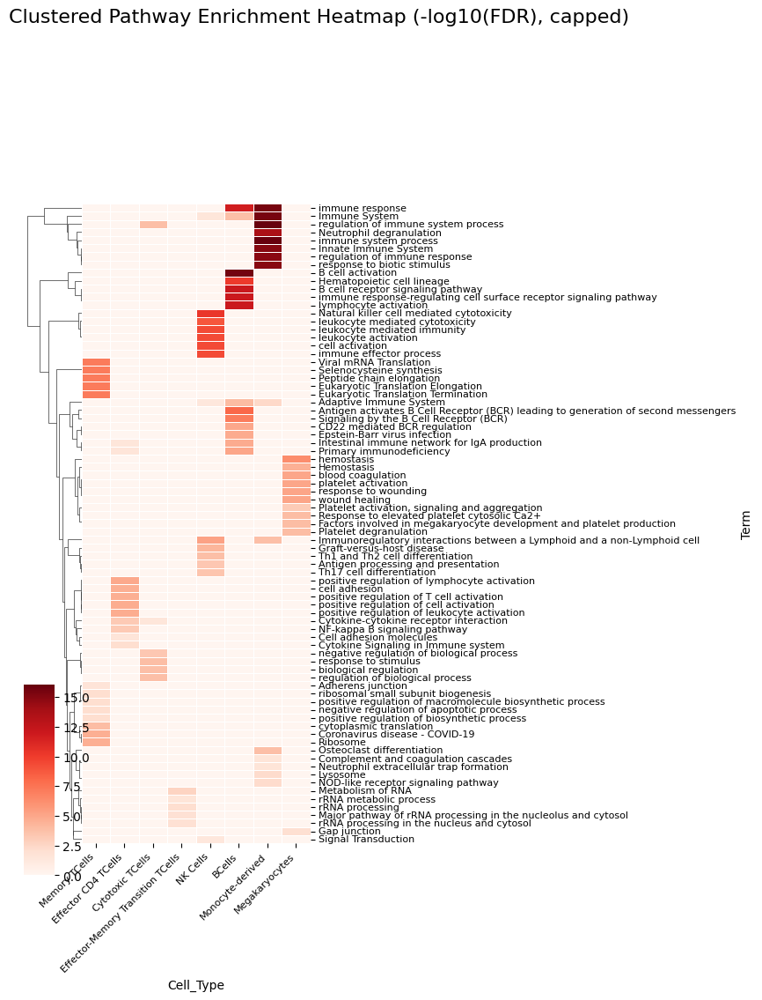

In [30]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Load enrichment results
df_results = pd.read_csv("Intermediate_Files/CellType_Pathway_Enrichment_gProfiler.tsv", sep="\t")

# Calculate -log10(FDR)
df_results["-log10(FDR)"] = -np.log10(df_results["FDR"].replace(0, 1e-300))

# Filter to selected sources
sources = ["GO:BP", "REAC", "KEGG"]
df_results = df_results[df_results["Source"].isin(sources)]

# Select top N pathways per cell type and source
top_n = 5
df_top = df_results.sort_values("FDR").groupby(["Cell_Type", "Source"], group_keys=False).head(top_n)

# Pivot table: Rows=Terms, Columns=Cell Types
heatmap_data = df_top.pivot_table(
    index="Term",
    columns="Cell_Type",
    values="-log10(FDR)",
    fill_value=0
)

# Define custom cell type order
custom_order = [
    "Memory TCells",
    "Effector CD4 TCells",
    "Cytotoxic TCells",
    "Effector-Memory Transition TCells",
    "NK Cells",
    "BCells",
    "Monocyte-derived",
    "Megakaryocytes"
]

# Reorder columns
heatmap_data = heatmap_data.reindex(columns=custom_order)

# Clip values to cap high significance
cap_value = 30
heatmap_data = heatmap_data.clip(upper=cap_value)

import matplotlib.pyplot as plt
import seaborn as sns

import matplotlib.pyplot as plt
import seaborn as sns

# Generate the clustermap
g = sns.clustermap(
    heatmap_data,
    cmap="Reds",   # using Reds colormap
    figsize=(7, 12),
    row_cluster=True,
    col_cluster=False,
    dendrogram_ratio=(.2, .2),
    cbar_pos=(0.02, 0.2, 0.05, 0.18),
    linewidths=0.5
)

# Extract the reordered row indices from the dendrogram
row_order = g.dendrogram_row.reordered_ind

# Calculate y-tick positions (offset by +0.5 to align with cell centers)
ytick_positions = np.arange(len(row_order)) + 0.55

# Set y-tick labels using the dendrogram order
g.ax_heatmap.set_yticks(ytick_positions)
g.ax_heatmap.set_yticklabels(
    [heatmap_data.index[i] for i in row_order],
    rotation=0,
    fontsize=8,
    va='center'
)

# Fix x-axis labels if needed
g.ax_heatmap.set_xticklabels(
    g.ax_heatmap.get_xticklabels(),
    rotation=45,
    ha='right',
    fontsize=8
)

# Add a centered title
g.fig.suptitle(
    "Clustered Pathway Enrichment Heatmap (-log10(FDR), capped)",
    x=0.5, y=1.02, ha='center', fontsize=16
)

# Save the figure
plt.savefig(
    "Intermediate_Files/Paper_Figs/clustered_heatmap_pathways_per_cell_type_custom_order.pdf",
    dpi=600, transparent=True, bbox_inches="tight"
)

plt.show()

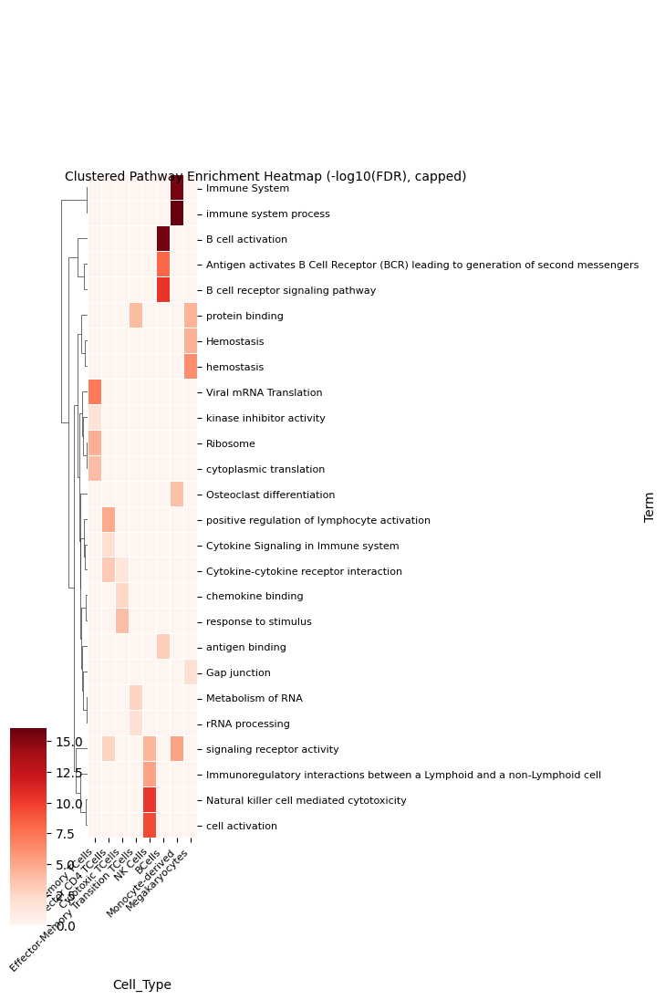

In [32]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Load enrichment results
df_results = pd.read_csv("Intermediate_Files/CellType_Pathway_Enrichment_gProfiler.tsv", sep="\t")

# Calculate -log10(FDR)
df_results["-log10(FDR)"] = -np.log10(df_results["FDR"].replace(0, 1e-300))

# Filter to selected sources
sources = ["GO:BP", "GO:MF", "REAC", "KEGG"]
df_results = df_results[df_results["Source"].isin(sources)]

# Select top N pathways per cell type and source
top_n = 1
df_top = df_results.sort_values("FDR").groupby(["Cell_Type", "Source"], group_keys=False).head(top_n)

# Pivot table: Rows=Terms, Columns=Cell Types
heatmap_data = df_top.pivot_table(
    index="Term",
    columns="Cell_Type",
    values="-log10(FDR)",
    fill_value=0
)

# Define custom cell type order
custom_order = [
    "Memory TCells",
    "Effector CD4 TCells",
    "Cytotoxic TCells",
    "Effector-Memory Transition TCells",
    "NK Cells",
    "BCells",
    "Monocyte-derived",
    "Megakaryocytes"
]

# Reorder columns
heatmap_data = heatmap_data.reindex(columns=custom_order)

# Clip values to cap high significance
cap_value = 30
heatmap_data = heatmap_data.clip(upper=cap_value)

import matplotlib.pyplot as plt
import seaborn as sns

import matplotlib.pyplot as plt
import seaborn as sns

# Generate the clustermap
g = sns.clustermap(
    heatmap_data,
    cmap="Reds",   # using Reds colormap
    figsize=(8, 12),
    row_cluster=True,
    col_cluster=False,
    dendrogram_ratio=(.2, .2),
    cbar_pos=(-0.05, 0.15, 0.05, 0.18),
    linewidths=0.5
)

# Extract the reordered row indices from the dendrogram
row_order = g.dendrogram_row.reordered_ind

# Calculate y-tick positions (offset by +0.5 to align with cell centers)
ytick_positions = np.arange(len(row_order)) + 0.55

# Set y-tick labels using the dendrogram order
g.ax_heatmap.set_yticks(ytick_positions)
g.ax_heatmap.set_yticklabels(
    [heatmap_data.index[i] for i in row_order],
    rotation=0,
    fontsize=8,
    va='center'
)

# Fix x-axis labels if needed
g.ax_heatmap.set_xticklabels(
    g.ax_heatmap.get_xticklabels(),
    rotation=45,
    ha='right',
    fontsize=8
)

# Add a centered title
g.fig.suptitle(
    "Clustered Pathway Enrichment Heatmap (-log10(FDR), capped)",
    x=0.3, y=0.84, ha='center', fontsize=10
)

# Save the figure
plt.savefig(
    "Intermediate_Files/Paper_Figs/clustered_heatmap_pathways_per_cell_type_custom_order.pdf",
    dpi=600, transparent=True, bbox_inches="tight"
)

plt.show()

In [42]:
import numpy as np
import pandas as pd
import time
import requests
from tqdm import tqdm

# 1) Expression Matrix & Z-Scoring
X = adata_i_filtered.X.toarray() if hasattr(adata_i_filtered.X, "toarray") else adata_i_filtered.X
expr_df = pd.DataFrame(X,
                       columns=adata_i_filtered.var_names,
                       index=adata_i_filtered.obs["sub_cell_type"])
expr_avg = expr_df.groupby(expr_df.index, observed=False).mean().T
z_expr = expr_avg.sub(expr_avg.mean(axis=1), axis=0).div(expr_avg.std(axis=1), axis=0).fillna(0)

# 2) Utilities
def extract_left(label: str) -> str:
    """Return the substring before ':' (e.g., 'ENSG...', 'BambuGene...')."""
    return str(label).split(":", 1)[0]

def is_ensg(x: str) -> bool:
    return isinstance(x, str) and x.startswith("ENSG")

def is_bambu_gene(x: str) -> bool:
    return isinstance(x, str) and x.startswith("BambuGene")

def query_gprofiler(gene_list, max_retries=3, sleep_s=0.6):
    """POST to g:Profiler with small retry; returns [] on failure/empty."""
    if not gene_list:
        return []
    url = "https://biit.cs.ut.ee/gprofiler/api/gost/profile/"
    headers = {"Content-Type": "application/json"}
    payload = {
        "organism": "hsapiens",
        "query": gene_list,
        "sources": ["GO:BP", "GO:MF", "GO:CC", "KEGG", "REAC"],
        "user_threshold": 0.05,
        "significance_threshold_method": "fdr",
    }
    for attempt in range(1, max_retries+1):
        try:
            r = requests.post(url, headers=headers, json=payload, timeout=60)
            r.raise_for_status()
            j = r.json()
            return j.get("result", [])
        except Exception as e:
            if attempt == max_retries:
                print(f"⚠️ g:Profiler failed after {max_retries} tries: {e}")
                return []
            time.sleep(sleep_s * attempt)
    return []

def get_top_similar_genes(target_gene, reference_genes, expr_avg, top_n=20):
    # Corr across cell-type means
    target_expr = expr_avg.loc[target_gene]
    ref_expr = expr_avg.loc[reference_genes]
    corr = ref_expr.corrwith(target_expr, axis=1)
    return corr.abs().sort_values(ascending=False).head(top_n).index.tolist()

def safe_write_tsv(df: pd.DataFrame, path: str, columns=None):
    """Always create a file with headers; if df empty, write empty frame with columns."""
    if df is None:
        df = pd.DataFrame(columns=columns or [])
    elif df.empty and columns is not None:
        df = pd.DataFrame(columns=columns)
    df.to_csv(path, sep="\t", index=False)

# ========================== FIX SIMILARITY-BASED ENRICHMENT ==========================
# Utilities to turn your matrix labels into g:Profiler-friendly IDs
def label_left(x: str) -> str:
    return str(x).split(":", 1)[0]

def to_gprof_id(x: str):
    """Return an identifier g:Profiler understands: ENSG or gene symbol. Else None."""
    if not isinstance(x, str) or x == "":
        return None
    left = label_left(x)  # e.g., "ENSG...", "BambuGene...", "TP53", etc.
    if left.startswith("BambuGene"):
        return None                      # not resolvable
    if left.startswith("ENSG"):
        return left                      # Ensembl gene id OK
    # Otherwise assume it's a gene symbol-like token; keep it
    # (You can tighten this with a regex if needed.)
    return left

# Rebuild known set: keep only labels that map to a valid ID for g:Profiler
known_genes_all = [g for g in expr_avg.index if "BambuTx" not in g]   # drop isoforms
known_gprof_ids = {g: to_gprof_id(g) for g in known_genes_all}
known_genes_mappable = [g for g, gid in known_gprof_ids.items() if gid is not None]

print(f"[sim] reference labels: {len(known_genes_all)}; mappable to g:Profiler: {len(known_genes_mappable)}")

# Targets = your novel genes & novel isoforms (unchanged)
novel_genes = [g for g in expr_avg.index if g.startswith("BambuGene")]
novel_isoforms = [g for g in expr_avg.index if label_left(g).startswith("ENSG") and "BambuTx" in g]
target_genes = novel_genes + novel_isoforms

# Reuse your correlation function
def get_top_similar_genes(target_gene, reference_genes, expr_avg, top_n=30):
    target_expr = expr_avg.loc[target_gene]
    ref_expr = expr_avg.loc[reference_genes]
    corr = ref_expr.corrwith(target_expr, axis=1)
    return corr.abs().sort_values(ascending=False).head(top_n).index.tolist()

# Run similarity-based enrichment with ID mapping and safeguards
results_similarity = []
for target_gene in tqdm(target_genes, desc="Similarity-based enrichment"):
    # pick top similar *labels* first (correlation is on your matrix labels)
    top_similar_labels = get_top_similar_genes(target_gene, known_genes_mappable, expr_avg, top_n=40)

    # map those labels to g:Profiler IDs (ENSG/symbol), drop Nones, de-duplicate
    top_similar_ids = [known_gprof_ids[lbl] for lbl in top_similar_labels if known_gprof_ids.get(lbl) is not None]
    top_similar_ids = list(dict.fromkeys(top_similar_ids))  # stable de-dup

    if len(top_similar_ids) == 0:
        continue

    enriched = query_gprofiler(top_similar_ids)
    for e in enriched:
        results_similarity.append({
            "Target": target_gene,
            "Source": e.get("source", ""),
            "Term": e.get("name", ""),
            "P-value": e.get("p_value", np.nan),
            "FDR": e.get("p_value_fdr", e.get("p_value", np.nan)),
            "Genes": ",".join(e.get("intersection", [])) if "intersection" in e else "",
            "QuerySize": len(top_similar_ids)
        })

df_similarity = pd.DataFrame(results_similarity)
safe_write_tsv(
    df_similarity,
    "Intermediate_Files/NovelGenes_NovelIsoforms_SimilarityEnrichment.tsv",
    columns=["Target","Source","Term","P-value","FDR","Genes","QuerySize"]
)

if df_similarity.empty:
    print("[plot] similarity enrichment still empty — likely your labels don’t map to resolvable IDs. "
          "Check a few examples from 'known_genes_mappable' and ensure they are symbols or ENSG.")
else:
    print(f"[sim] wrote {len(df_similarity)} rows to NovelGenes_NovelIsoforms_SimilarityEnrichment.tsv")
# =====================================================================================

[sim] reference labels: 87153; mappable to g:Profiler: 87153


Similarity-based enrichment: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 126/126 [21:36<00:00, 10.29s/it]

[sim] wrote 3607 rows to NovelGenes_NovelIsoforms_SimilarityEnrichment.tsv


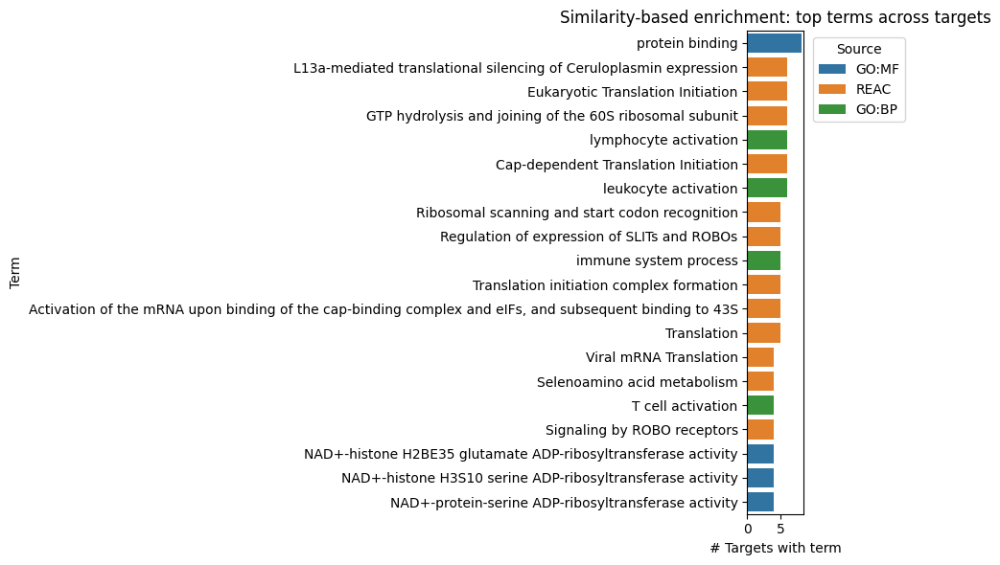

In [46]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os

paths = {
    "genes": "Intermediate_Files/NovelGenes_Pathway_Enrichment_gProfiler.tsv",
    "isoforms": "Intermediate_Files/NovelIsoforms_Pathway_Enrichment_gProfiler.tsv",
    "similarity": "Intermediate_Files/NovelGenes_NovelIsoforms_SimilarityEnrichment.tsv",
}

def safe_read_tsv(p):
    if not os.path.isfile(p) or os.path.getsize(p) == 0:
        return pd.DataFrame(columns=["Target","Source","Term","P-value","FDR","Genes"])
    return pd.read_csv(p, sep="\t")

df_novel_genes = safe_read_tsv(paths["genes"])
df_novel_iso   = safe_read_tsv(paths["isoforms"])
df_sim         = safe_read_tsv(paths["similarity"])

# Add -log10(FDR) if rows exist
for df in (df_novel_genes, df_novel_iso, df_sim):
    if not df.empty and "FDR" in df.columns:
        df["-log10(FDR)"] = -np.log10(df["FDR"].replace(0, 1e-300))

# Filter by sources
keep_sources = {"GO:BP",
                "GO:MF",
                #"GO:CC",
                "REAC",
                "KEGG"}
for df in (df_novel_genes, df_novel_iso, df_sim):
    if not df.empty and "Source" in df.columns:
        df.drop(df[~df["Source"].isin(keep_sources)].index, inplace=True)

# Simple barplot example for the similarity-based results
if not df_sim.empty:
    top_terms = (
        df_sim[["Term", "Target", "Source"]].drop_duplicates()
        .groupby(["Term", "Source"])["Target"].nunique()
        .reset_index(name="Count")
    )
    # Keep top 20 by count
    top_terms = (
        top_terms.sort_values("Count", ascending=False)
        .groupby("Term")
        .head(1)  # in case same term appears in multiple sources
        .nlargest(20, "Count")
    )

    plt.figure(figsize=(10, 6))
    sns.barplot(data=top_terms, y="Term", x="Count", hue="Source", dodge=False)
    plt.title("Similarity-based enrichment: top terms across targets")
    plt.xlabel("# Targets with term")
    plt.ylabel("Term")
    plt.legend(title="Source", bbox_to_anchor=(1.05, 1), loc="upper left")
    plt.tight_layout()
    os.makedirs("Intermediate_Files/Paper_Figs", exist_ok=True)
    plt.savefig("Intermediate_Files/Paper_Figs/Similarity_Enrichment_TopTerms.pdf", dpi=600)
    plt.show()
else:
    print("[plot] similarity enrichment is empty — skipping figure.")

In [34]:
import numpy as np
import pandas as pd
import requests
from tqdm import tqdm

# 1️⃣ Expression Matrix & Z-Scoring
X = adata_i_filtered.X.toarray() if hasattr(adata_i_filtered.X, "toarray") else adata_i_filtered.X
expr_df = pd.DataFrame(X, 
                       columns=adata_i_filtered.var_names,
                       index=adata_i_filtered.obs["sub_cell_type"])
expr_avg = expr_df.groupby(expr_df.index, observed=False).mean().T
z_expr = expr_avg.sub(expr_avg.mean(axis=1), axis=0).div(expr_avg.std(axis=1), axis=0).fillna(0)

# 2️⃣ Utilities
def extract_symbol(label):
    return label.split(":")[0]

def query_gprofiler(gene_list):
    url = "https://biit.cs.ut.ee/gprofiler/api/gost/profile/"
    headers = {"Content-Type": "application/json"}
    payload = {
        "organism": "hsapiens",
        "query": gene_list,
        "sources": ["GO:BP", "GO:MF", "GO:CC", "KEGG", "REAC"],
        "user_threshold": 0.05,
        "significance_threshold_method": "fdr"
    }
    try:
        response = requests.post(url, headers=headers, json=payload)
        response.raise_for_status()
        return response.json()["result"]
    except Exception as e:
        print(f"⚠️ g:Profiler failed: {e}")
        return []

def get_top_similar_genes(target_gene, reference_genes, expr_avg, top_n=20):
    target_expr = expr_avg.loc[target_gene]
    ref_expr = expr_avg.loc[reference_genes]
    corr = ref_expr.corrwith(target_expr, axis=1)
    return corr.abs().sort_values(ascending=False).head(top_n).index.tolist()

# 3️⃣ Known Genes
known_genes = [g for g in expr_avg.index if not g.startswith("BambuGene") and "BambuTx" not in g]

# 4️⃣ Targets
novel_genes = [g for g in expr_avg.index if g.startswith("BambuGene")]
novel_isoforms = [g for g in expr_avg.index if g.startswith("ENSG") and "BambuTx" in g]
target_genes = novel_genes + novel_isoforms

# 5️⃣ Enrichment by Similarity
results_similarity = []
for target_gene in tqdm(target_genes, desc="Similarity-based enrichment"):
    top_similar = get_top_similar_genes(target_gene, known_genes, expr_avg, top_n=30)
    enriched = query_gprofiler(top_similar)
    for e in enriched:
        results_similarity.append({
            "Target": target_gene,
            "Source": e["source"],
            "Term": e["name"],
            "P-value": e["p_value"],
            "FDR": e.get("p_value_fdr", e.get("p_value")),
            "Genes": ",".join(e.get("intersection", [])) if "intersection" in e else ""
        })

df_similarity = pd.DataFrame(results_similarity)
df_similarity.to_csv("Intermediate_Files/NovelGenes_NovelIsoforms_SimilarityEnrichment.tsv", sep="\t", index=False)

# 6️⃣ Direct Enrichment (no similarity)
results_direct_novel_genes = []
for gene_id in tqdm(novel_genes, desc="Direct enrichment (novel genes)"):
    gene_symbol = extract_symbol(gene_id)
    enriched = query_gprofiler([gene_symbol])
    for e in enriched:
        results_direct_novel_genes.append({
            "Target": gene_symbol,
            "Source": e["source"],
            "Term": e["name"],
            "P-value": e["p_value"],
            "FDR": e.get("p_value_fdr", e.get("p_value")),
            "Genes": ",".join(e.get("intersection", [])) if "intersection" in e else ""
        })

df_direct_novel_genes = pd.DataFrame(results_direct_novel_genes)
df_direct_novel_genes.to_csv("Intermediate_Files/NovelGenes_Pathway_Enrichment_gProfiler.tsv", sep="\t", index=False)

results_direct_novel_isoforms = []
for gene_id in tqdm(novel_isoforms, desc="Direct enrichment (novel isoforms)"):
    gene_symbol = extract_symbol(gene_id)
    enriched = query_gprofiler([gene_symbol])
    for e in enriched:
        results_direct_novel_isoforms.append({
            "Target": gene_symbol,
            "Source": e["source"],
            "Term": e["name"],
            "P-value": e["p_value"],
            "FDR": e.get("p_value_fdr", e.get("p_value")),
            "Genes": ",".join(e.get("intersection", [])) if "intersection" in e else ""
        })

df_direct_novel_isoforms = pd.DataFrame(results_direct_novel_isoforms)
df_direct_novel_isoforms.to_csv("Intermediate_Files/NovelIsoforms_Pathway_Enrichment_gProfiler.tsv", sep="\t", index=False)

print("✅ All enrichment steps complete!")

Direct enrichment (novel isoforms): 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 59/59 [00:27<00:00,  2.11it/s]

✅ All enrichment steps complete!


In [38]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Load enrichment results
#df_novel_genes = pd.read_csv("Intermediate_Files/NovelGenes_Pathway_Enrichment_gProfiler.tsv", sep="\t")
df_novel_isoforms = pd.read_csv("Intermediate_Files/NovelIsoforms_Pathway_Enrichment_gProfiler.tsv", sep="\t")

# Add -log10(FDR)
for df in [df_novel_isoforms]:
    df["-log10(FDR)"] = -np.log10(df["FDR"].replace(0, 1e-300))

# Filter by Source if desired
sources = ["GO:BP", "GO:MF","REAC", "KEGG"]
for df in  [df_novel_isoforms]:
    df.drop(df[~df["Source"].isin(sources)].index, inplace=True)

In [39]:
# Plot bar plots for each novel gene
for gene in df_novel_genes["BambuGene"].unique():
    subset = df_novel_genes[df_novel_genes["BambuGene"] == gene]
    top_terms = subset.sort_values("FDR").groupby("Source", group_keys=False).head(5)
    term_order = top_terms.sort_values("FDR")["Term"].unique()

    plt.figure(figsize=(10, 6))
    sns.barplot(data=top_terms, y="Term", x="-log10(FDR)", hue="Source", order=term_order)
    plt.title(f"Top Enriched Pathways — {gene}")
    plt.xlabel("-log10(FDR)")
    plt.ylabel("Enriched Term")
    plt.legend(title="Source", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.savefig(f"Intermediate_Files/Paper_Figs/NovelGene_{gene}_Enrichment_Barplot.pdf",
                dpi=600, transparent=True)
    plt.close()

# Repeat for novel isoforms
for isoform in df_novel_isoforms["GeneIsoform"].unique():
    subset = df_novel_isoforms[df_novel_isoforms["GeneIsoform"] == isoform]
    top_terms = subset.sort_values("FDR").groupby("Source", group_keys=False).head(5)
    term_order = top_terms.sort_values("FDR")["Term"].unique()

    plt.figure(figsize=(10, 6))
    sns.barplot(data=top_terms, y="Term", x="-log10(FDR)", hue="Source", order=term_order)
    plt.title(f"Top Enriched Pathways — {isoform}")
    plt.xlabel("-log10(FDR)")
    plt.ylabel("Enriched Term")
    plt.legend(title="Source", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.savefig(f"Intermediate_Files/Paper_Figs/NovelIsoform_{isoform}_Enrichment_Barplot.pdf",
                dpi=600, transparent=True)
    plt.close()

KeyError: 'GeneIsoform'

In [87]:
import pandas as pd
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate similarities for each BambuGene#
similarity_results_novel_genes = []

for novel_gene in tqdm([g for g in expr_avg.index if g.startswith("BambuGene")], desc="Calculating similarities for Novel Genes"):
    target_expr = expr_avg.loc[novel_gene]
    known_genes = [g for g in expr_avg.index if not g.startswith("BambuGene")]
    known_expr = expr_avg.loc[known_genes]
    
    # Calculate Pearson correlation
    corr = known_expr.corrwith(target_expr, axis=1)
    
    # Select top 10
    top_similar = corr.abs().sort_values(ascending=False).head(10)
    
    # Save results
    for gene, score in top_similar.items():
        similarity_results_novel_genes.append({
            "NovelGene": novel_gene,
            "KnownGene": gene,
            "Similarity": score
        })

df_novel_gene_similarities = pd.DataFrame(similarity_results_novel_genes)

Calculating similarities for Novel Genes: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 33/33 [03:55<00:00,  7.15s/it]


In [92]:
print(df_novel_gene_similarities.head())
print(df_novel_isoform_similarities.head())

                NovelGene                                KnownGene  Similarity
0  BambuGene1277:BambuTx5     GNG2:ENSG00000186469:ENST00000335281    0.996208
1  BambuGene1277:BambuTx5    KLRC2:ENSG00000205809:ENST00000381902    0.994617
2  BambuGene1277:BambuTx5          ENSG00000288915:ENST00000686939    0.993765
3  BambuGene1277:BambuTx5   TGFBR3:ENSG00000069702:ENST00000525962    0.993722
4  BambuGene1277:BambuTx5  PLEKHF1:ENSG00000166289:ENST00000436066    0.992768
                 NovelIsoform              SiblingIsoform  Similarity
0   ENSG00000166295:BambuTx14   ENSG00000166295:BambuTx15    0.733205
1   ENSG00000166295:BambuTx15   ENSG00000166295:BambuTx14    0.733205
2  ENSG00000243829:BambuTx106  ENSG00000243829:BambuTx111    0.040709
3  ENSG00000243829:BambuTx106  ENSG00000243829:BambuTx113   -0.184666
4  ENSG00000243829:BambuTx111  ENSG00000243829:BambuTx106    0.040709


/tmp/ipykernel_3152855/1074319157.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=subset_sorted, x="Similarity", y="KnownGene", palette="Reds_r")


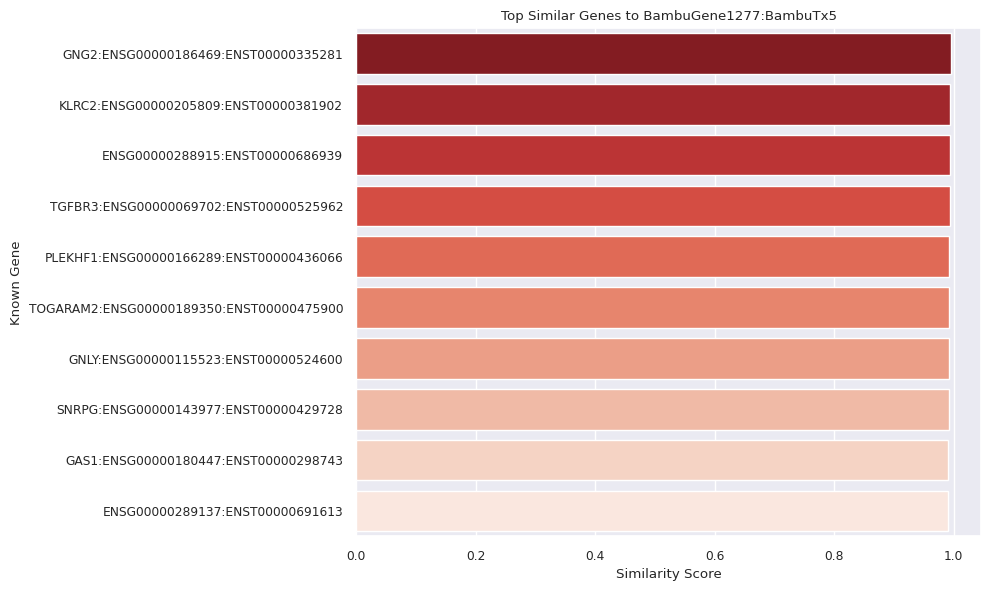

/tmp/ipykernel_3152855/1074319157.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=subset_sorted, x="Similarity", y="KnownGene", palette="Reds_r")


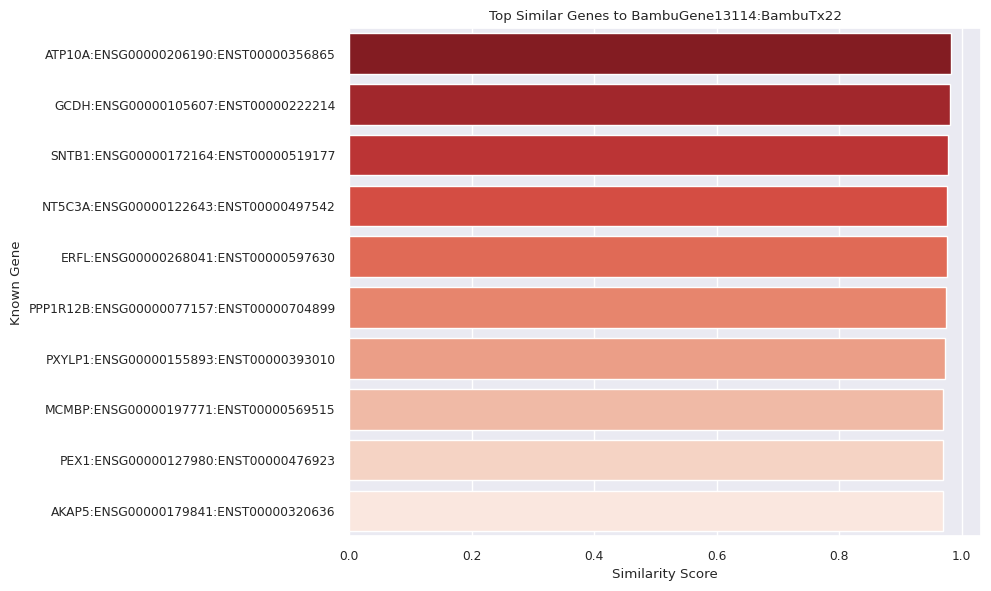

/tmp/ipykernel_3152855/1074319157.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=subset_sorted, x="Similarity", y="KnownGene", palette="Reds_r")


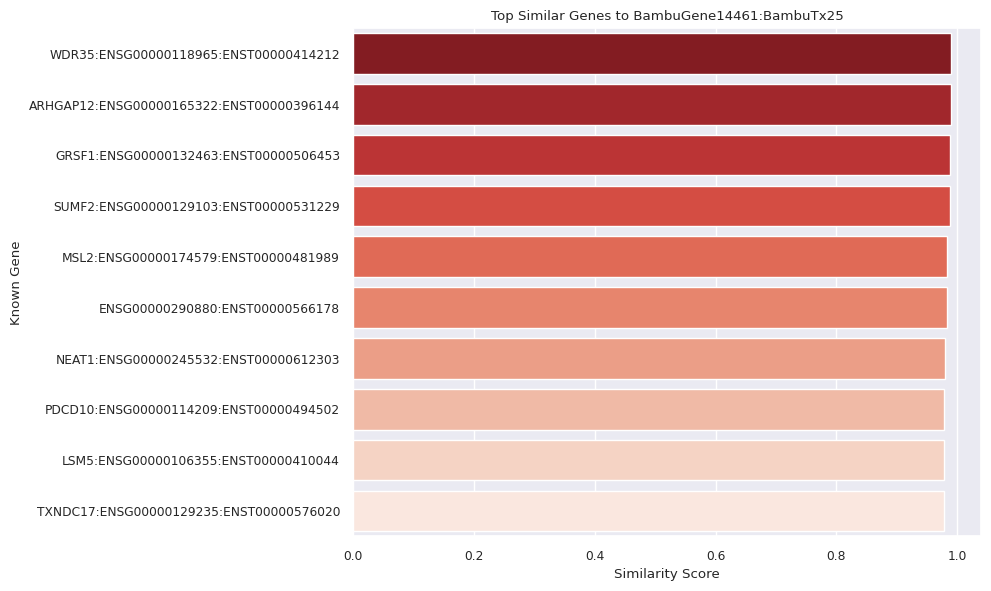

/tmp/ipykernel_3152855/1074319157.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=subset_sorted, x="Similarity", y="KnownGene", palette="Reds_r")


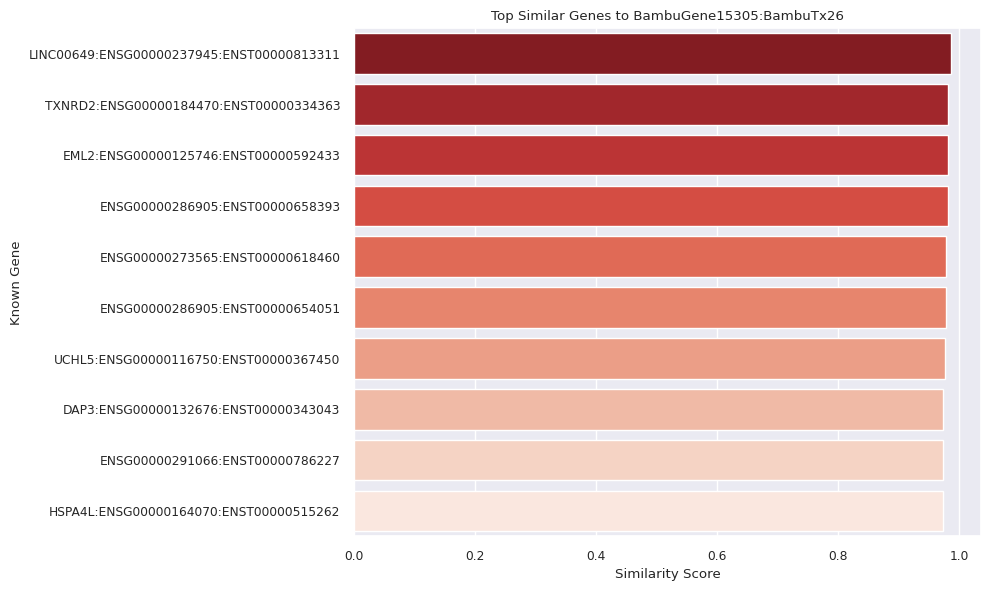

/tmp/ipykernel_3152855/1074319157.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=subset_sorted, x="Similarity", y="KnownGene", palette="Reds_r")


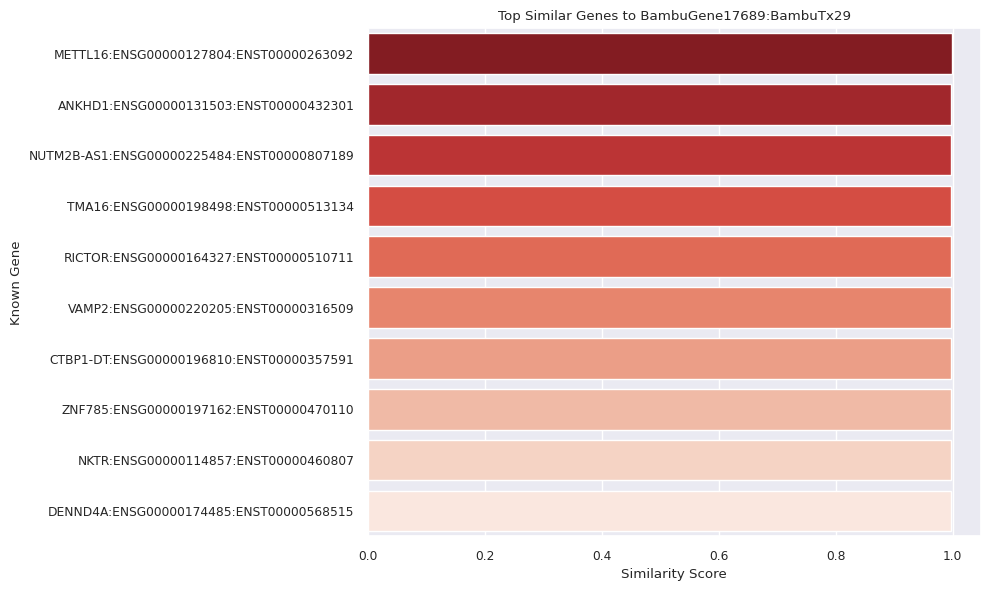

/tmp/ipykernel_3152855/1074319157.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=subset_sorted, x="Similarity", y="KnownGene", palette="Reds_r")


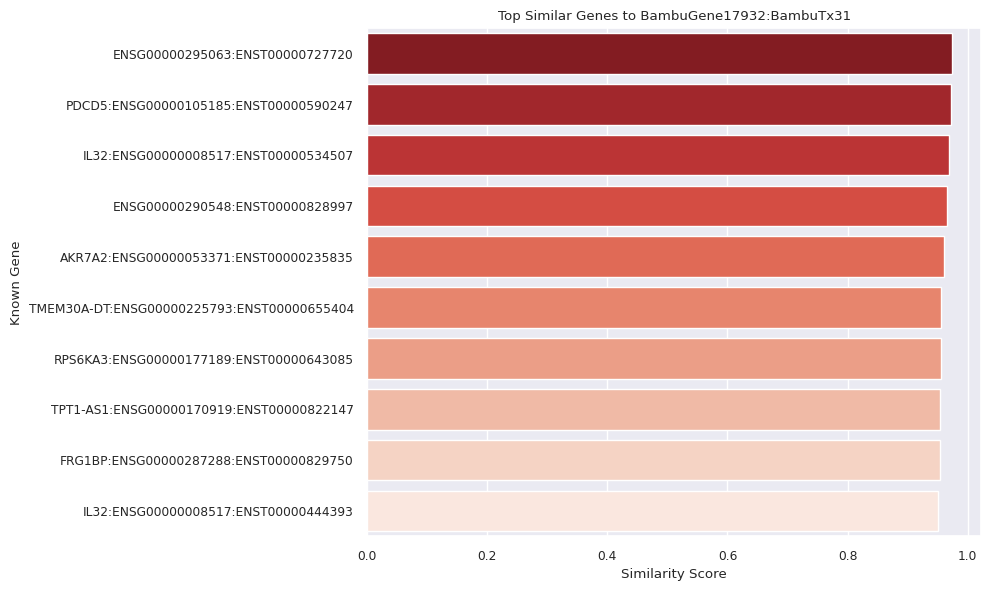

/tmp/ipykernel_3152855/1074319157.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=subset_sorted, x="Similarity", y="KnownGene", palette="Reds_r")


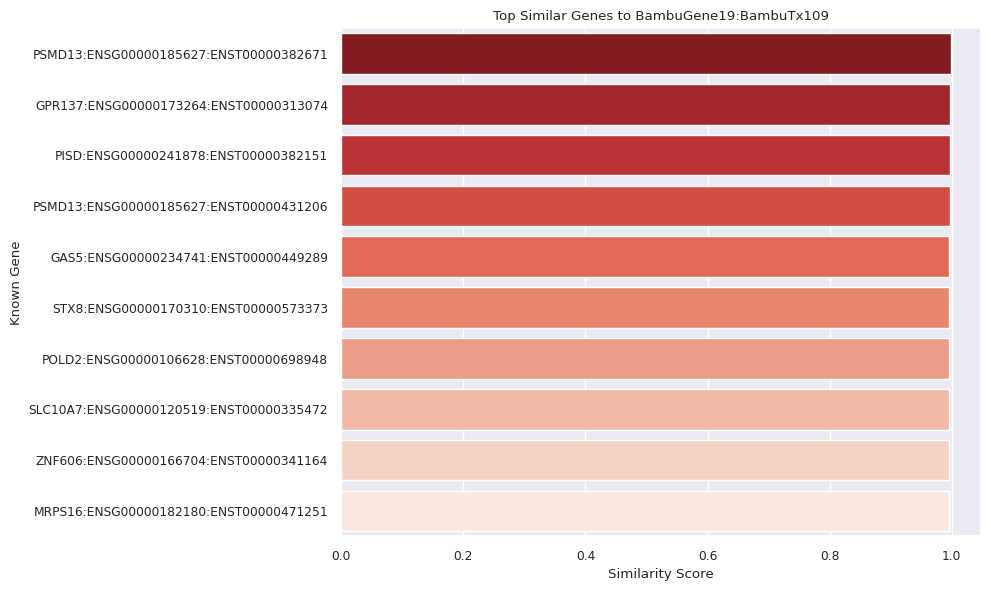

/tmp/ipykernel_3152855/1074319157.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=subset_sorted, x="Similarity", y="KnownGene", palette="Reds_r")


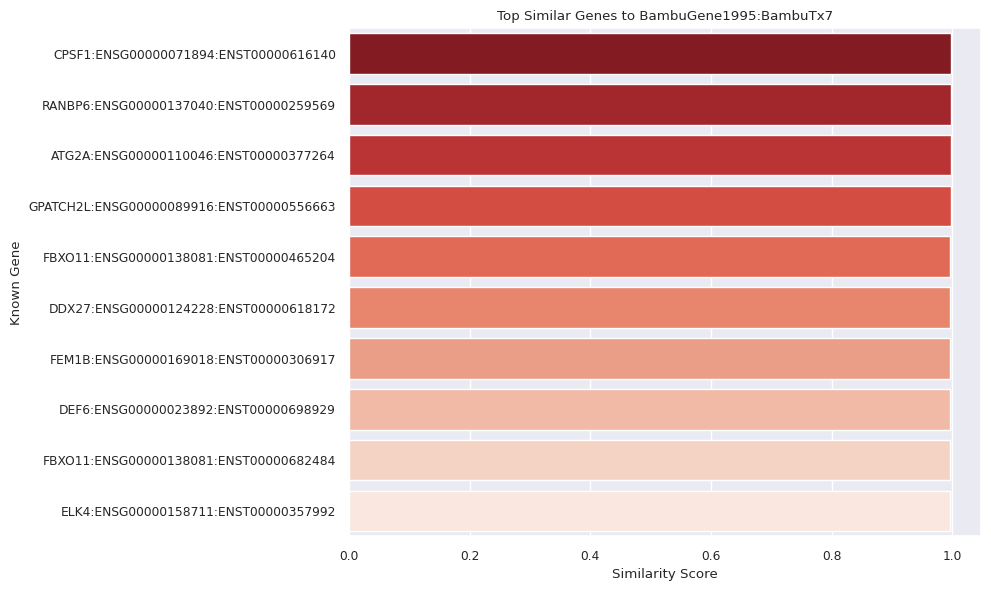

/tmp/ipykernel_3152855/1074319157.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=subset_sorted, x="Similarity", y="KnownGene", palette="Reds_r")


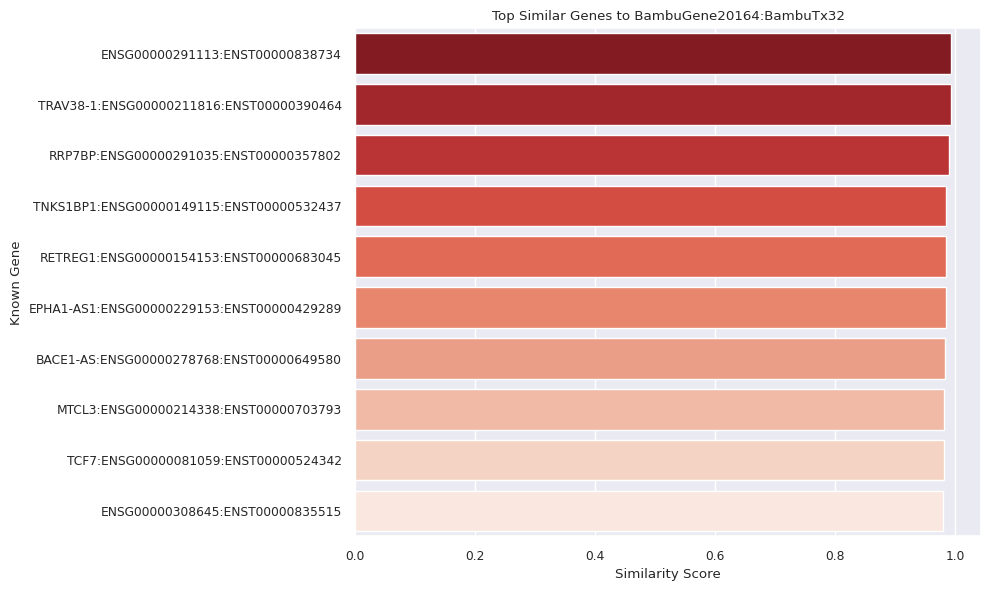

/tmp/ipykernel_3152855/1074319157.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=subset_sorted, x="Similarity", y="KnownGene", palette="Reds_r")


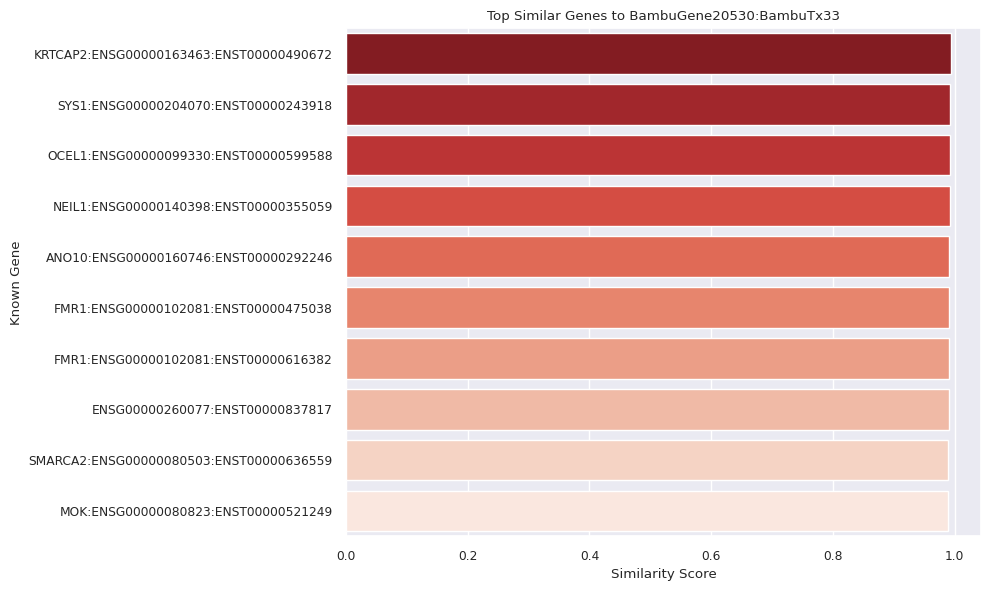

/tmp/ipykernel_3152855/1074319157.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=subset_sorted, x="Similarity", y="KnownGene", palette="Reds_r")


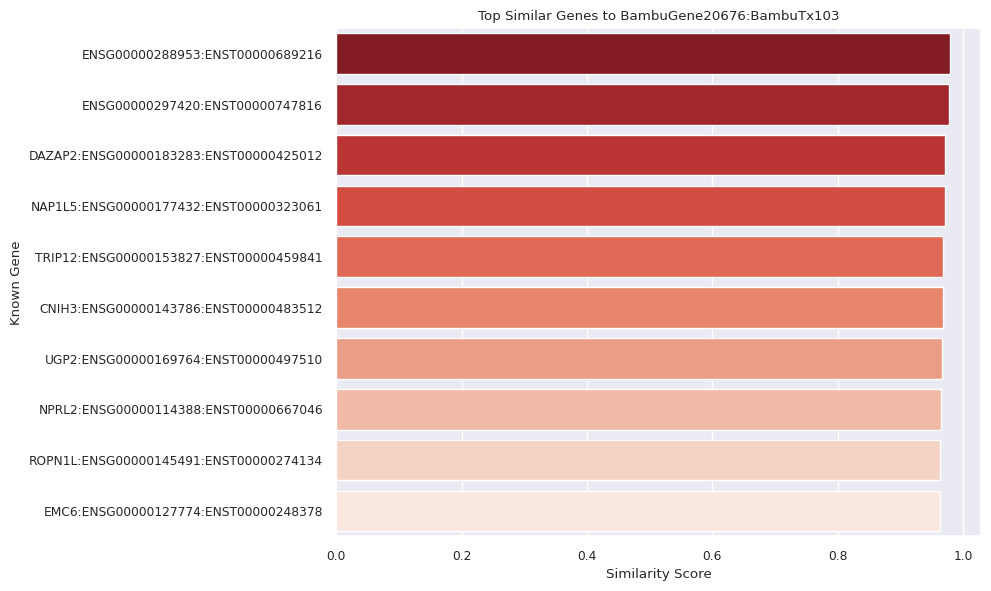

/tmp/ipykernel_3152855/1074319157.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=subset_sorted, x="Similarity", y="KnownGene", palette="Reds_r")


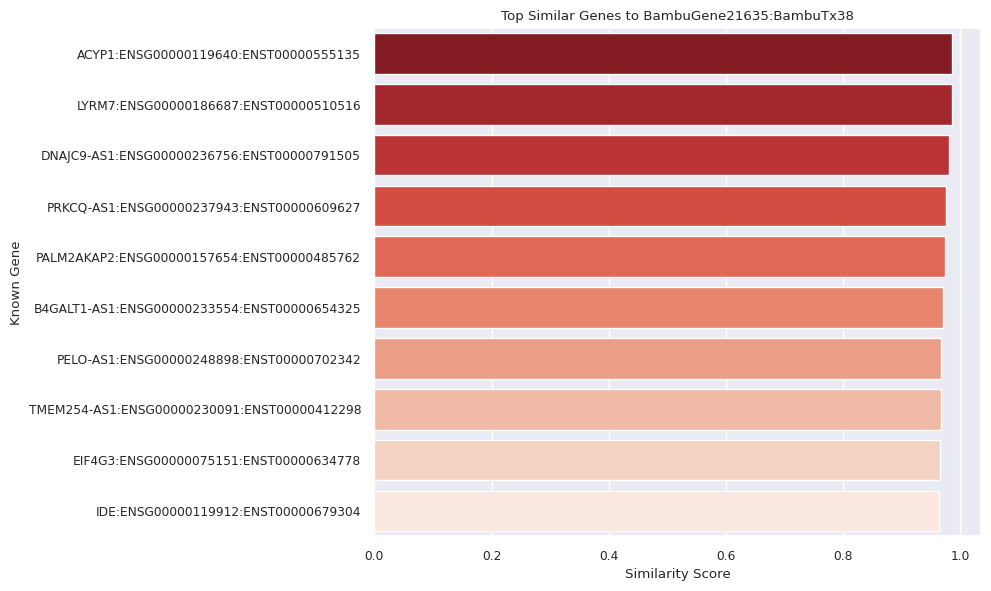

/tmp/ipykernel_3152855/1074319157.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=subset_sorted, x="Similarity", y="KnownGene", palette="Reds_r")


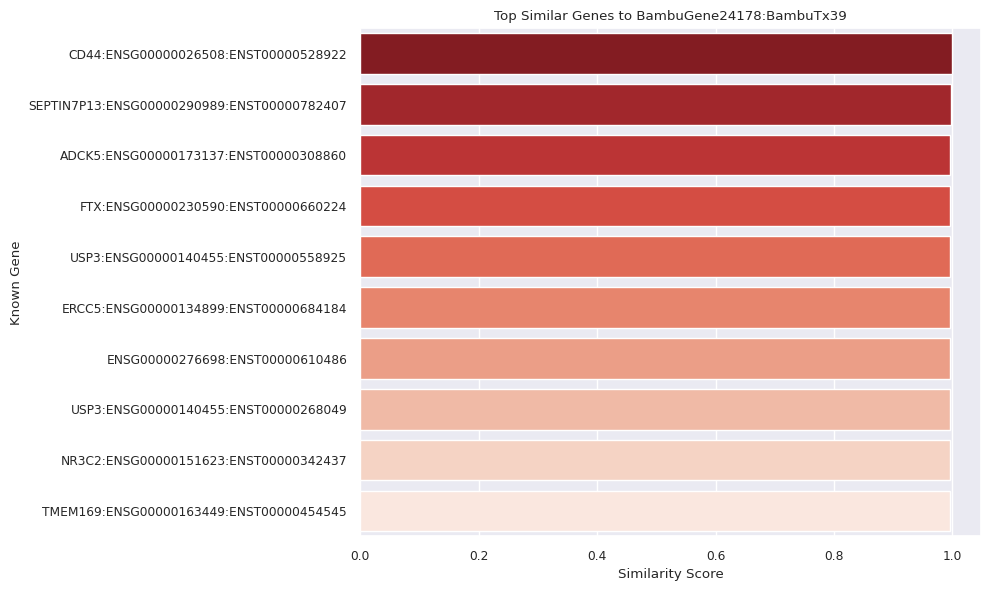

/tmp/ipykernel_3152855/1074319157.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=subset_sorted, x="Similarity", y="KnownGene", palette="Reds_r")


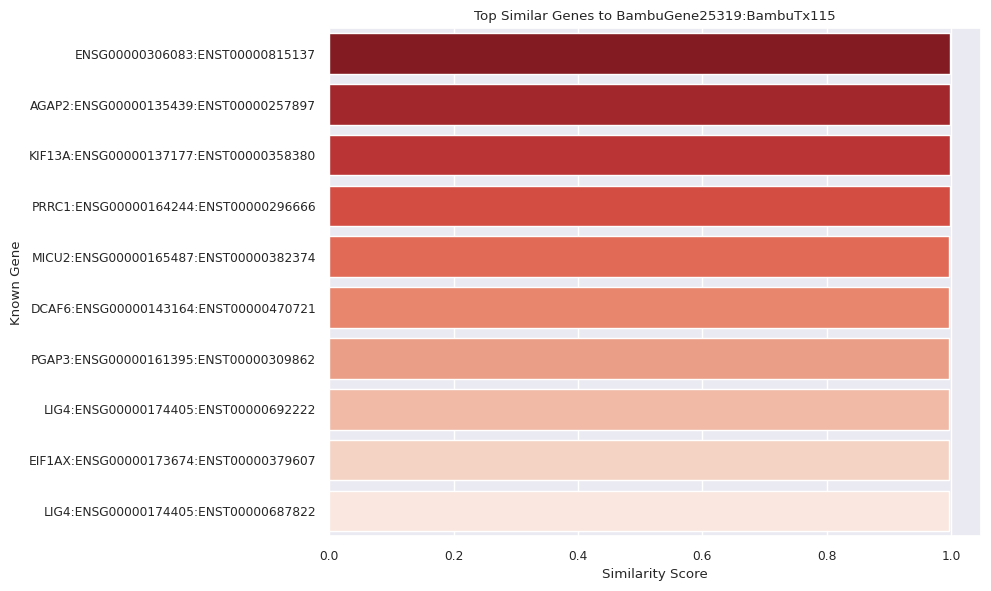

/tmp/ipykernel_3152855/1074319157.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=subset_sorted, x="Similarity", y="KnownGene", palette="Reds_r")


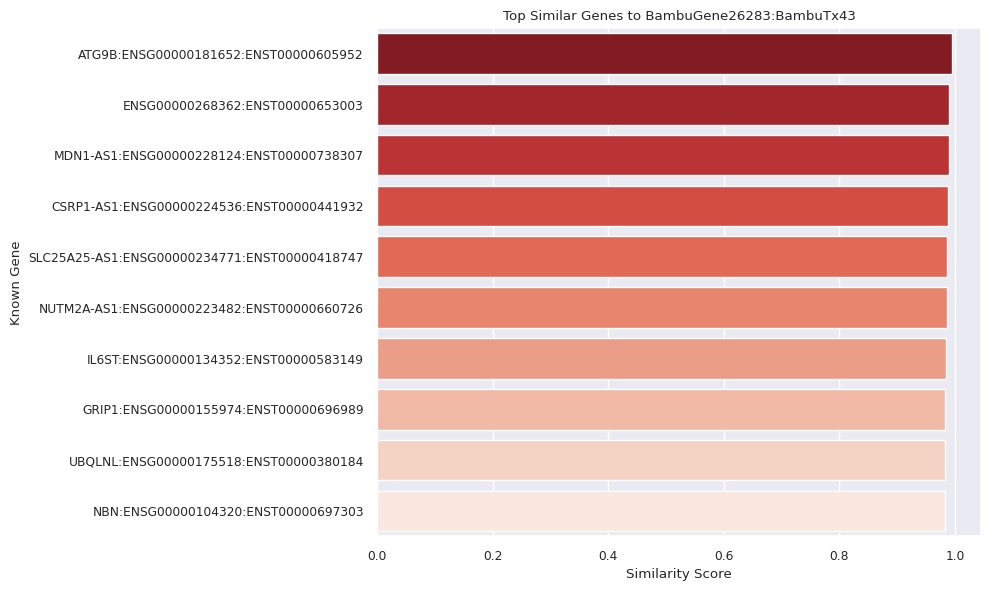

/tmp/ipykernel_3152855/1074319157.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=subset_sorted, x="Similarity", y="KnownGene", palette="Reds_r")


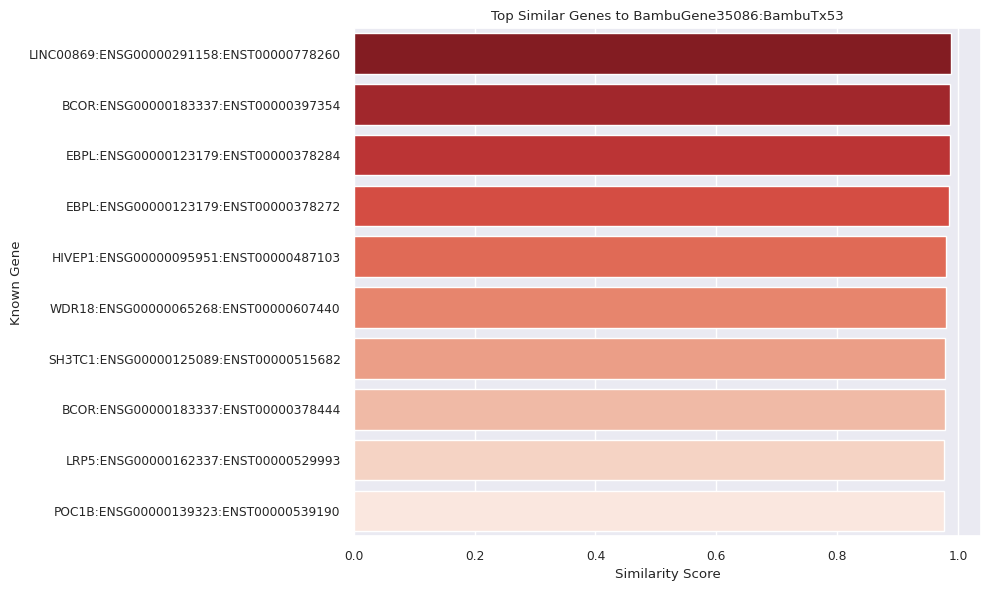

/tmp/ipykernel_3152855/1074319157.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=subset_sorted, x="Similarity", y="KnownGene", palette="Reds_r")


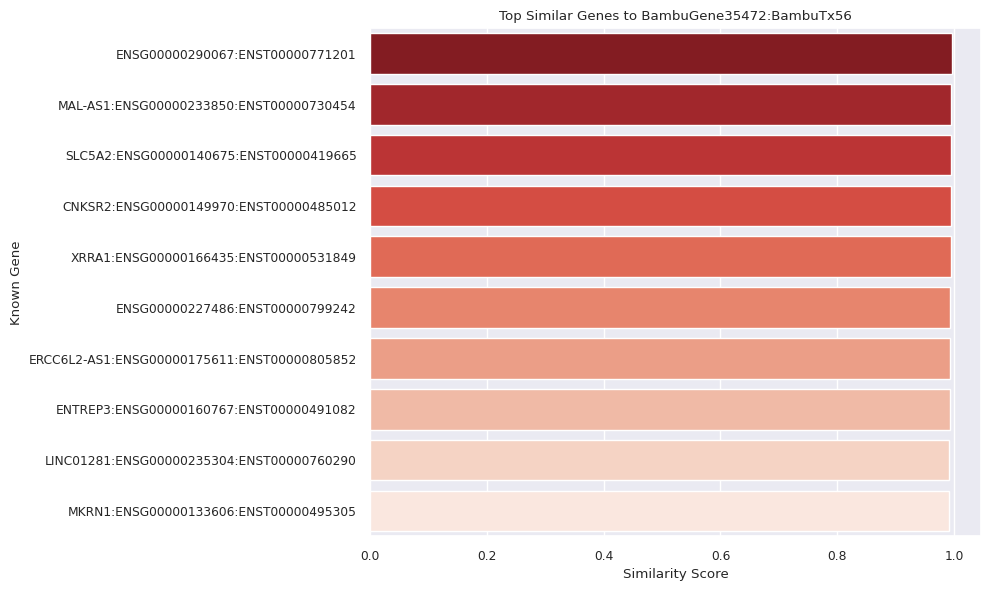

/tmp/ipykernel_3152855/1074319157.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=subset_sorted, x="Similarity", y="KnownGene", palette="Reds_r")


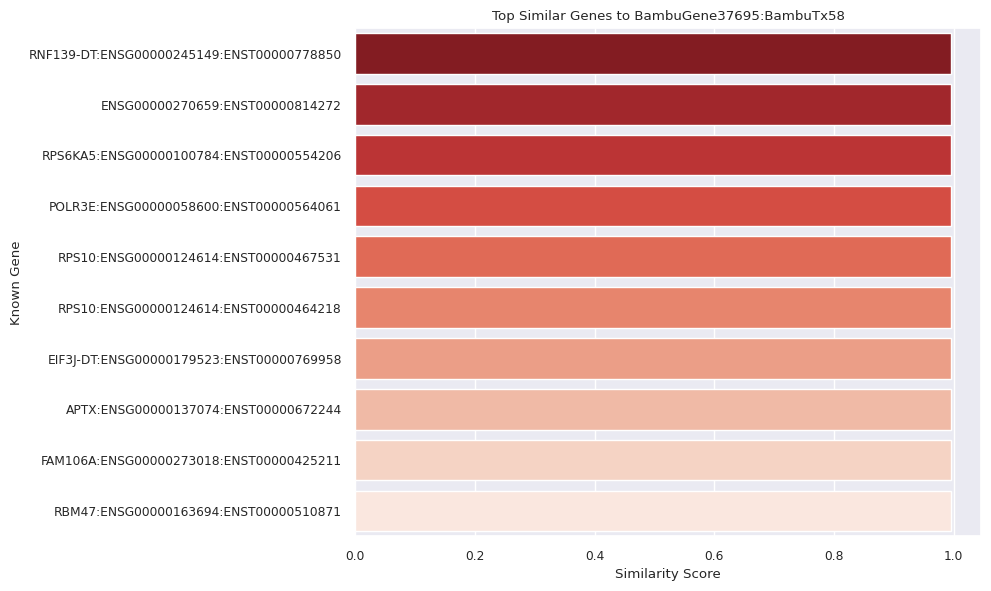

/tmp/ipykernel_3152855/1074319157.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=subset_sorted, x="Similarity", y="KnownGene", palette="Reds_r")


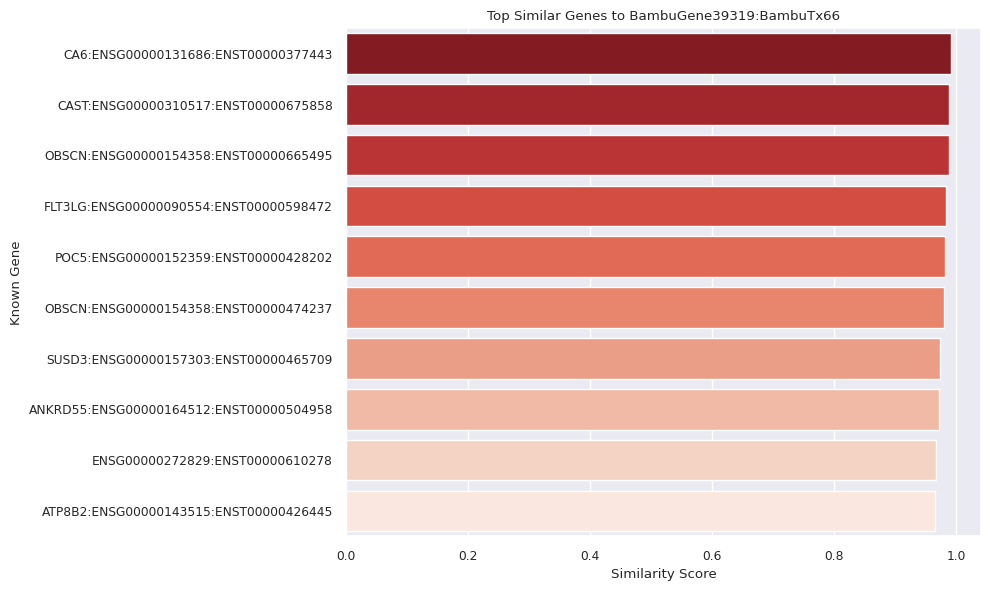

/tmp/ipykernel_3152855/1074319157.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=subset_sorted, x="Similarity", y="KnownGene", palette="Reds_r")


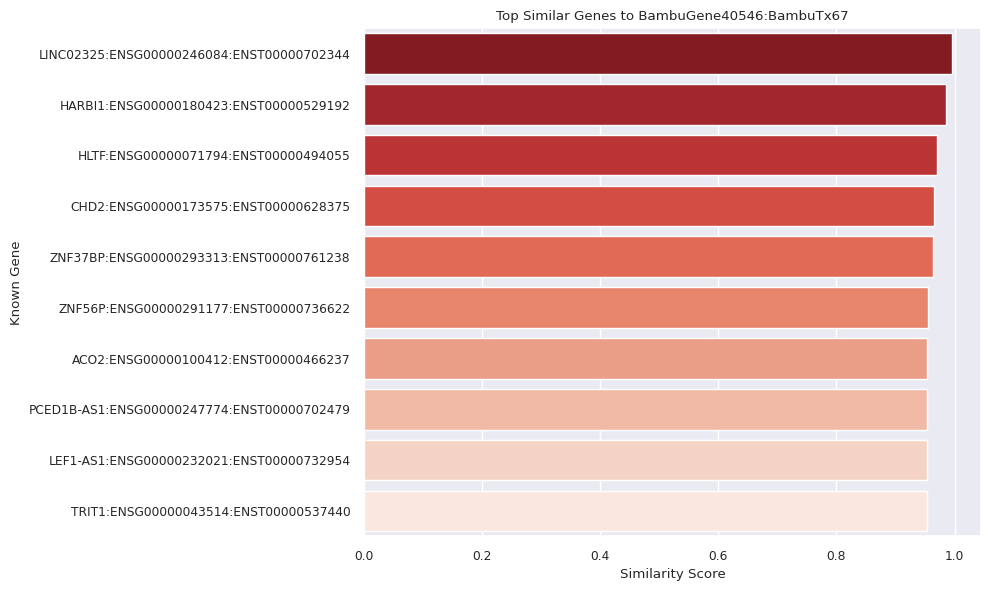

/tmp/ipykernel_3152855/1074319157.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=subset_sorted, x="Similarity", y="KnownGene", palette="Reds_r")


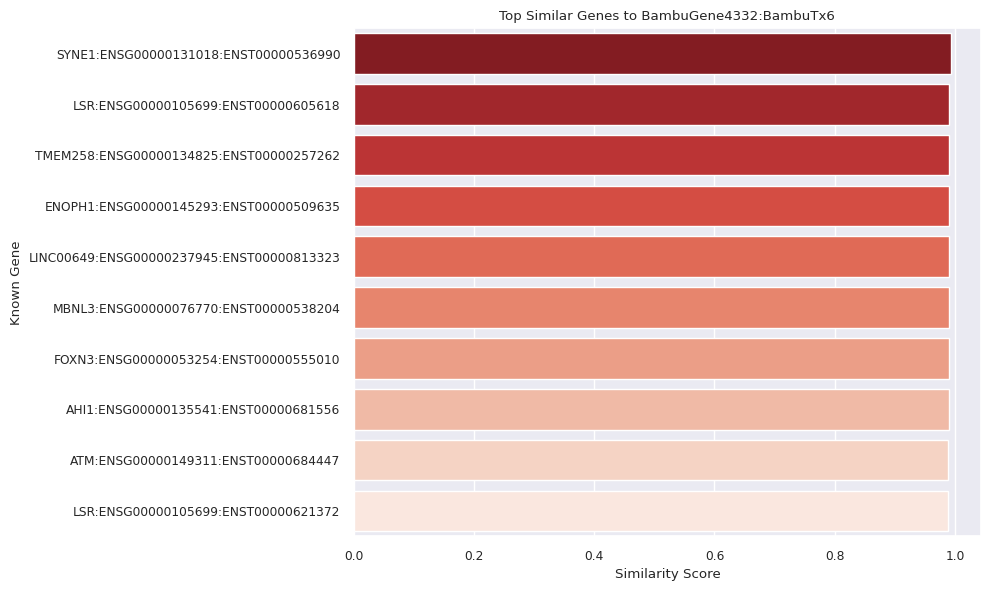

/tmp/ipykernel_3152855/1074319157.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=subset_sorted, x="Similarity", y="KnownGene", palette="Reds_r")


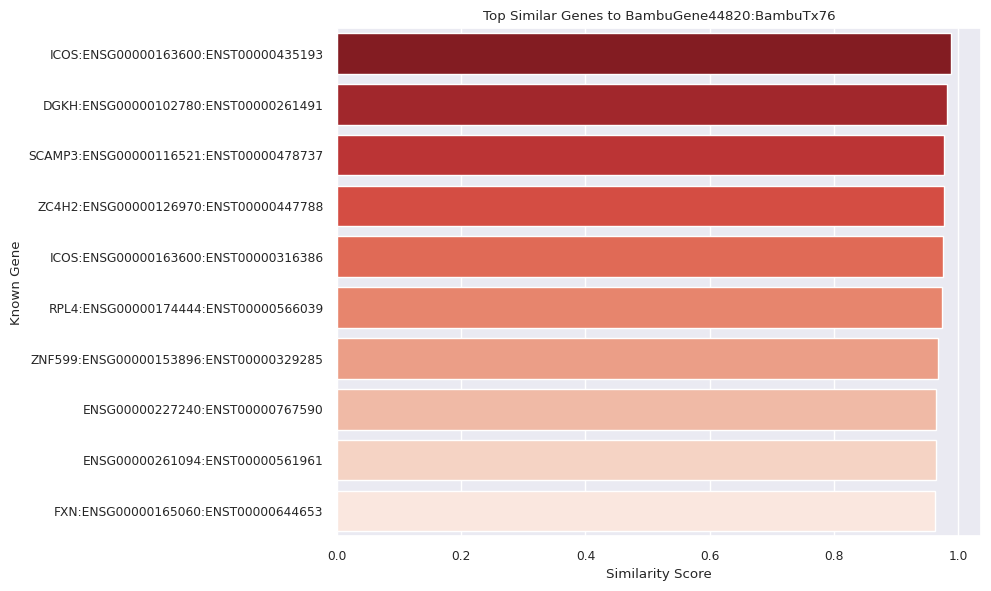

/tmp/ipykernel_3152855/1074319157.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=subset_sorted, x="Similarity", y="KnownGene", palette="Reds_r")


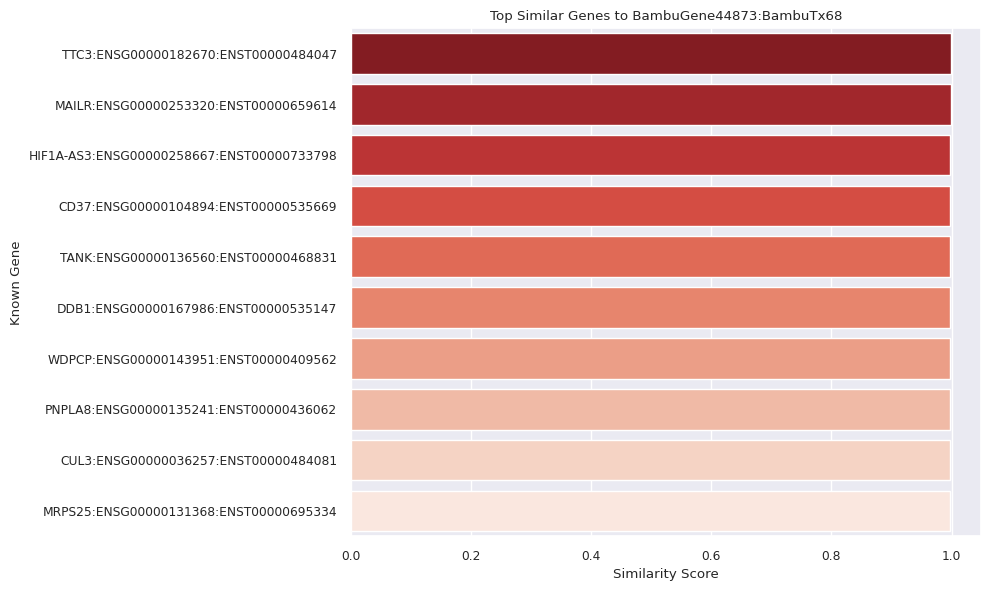

/tmp/ipykernel_3152855/1074319157.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=subset_sorted, x="Similarity", y="KnownGene", palette="Reds_r")


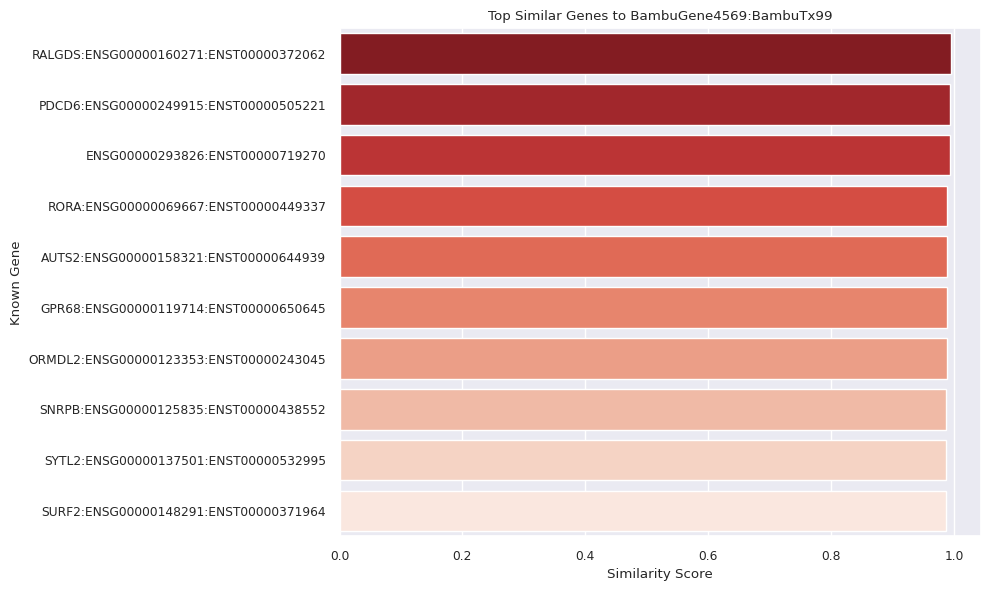

/tmp/ipykernel_3152855/1074319157.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=subset_sorted, x="Similarity", y="KnownGene", palette="Reds_r")


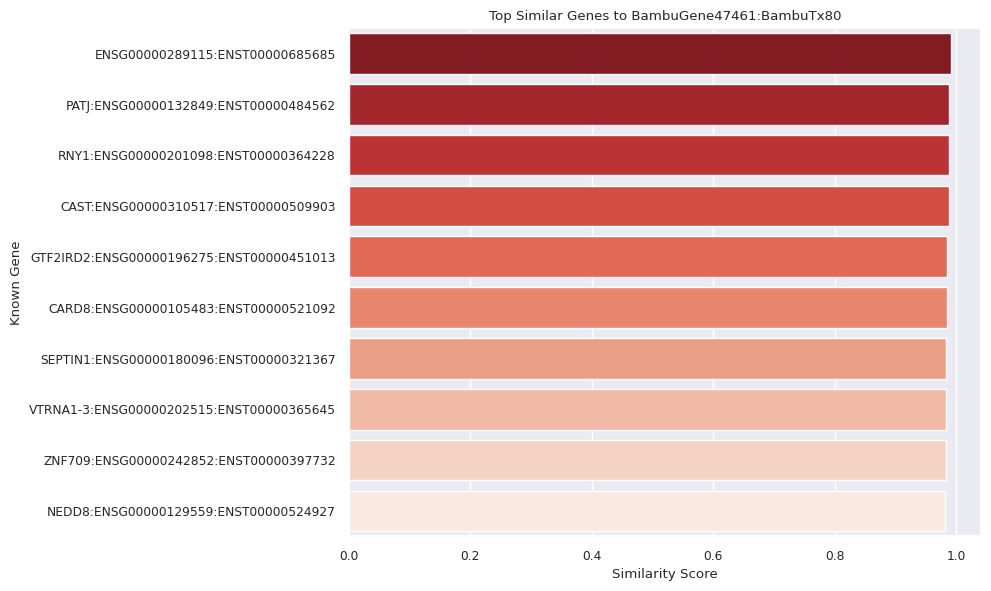

/tmp/ipykernel_3152855/1074319157.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=subset_sorted, x="Similarity", y="KnownGene", palette="Reds_r")


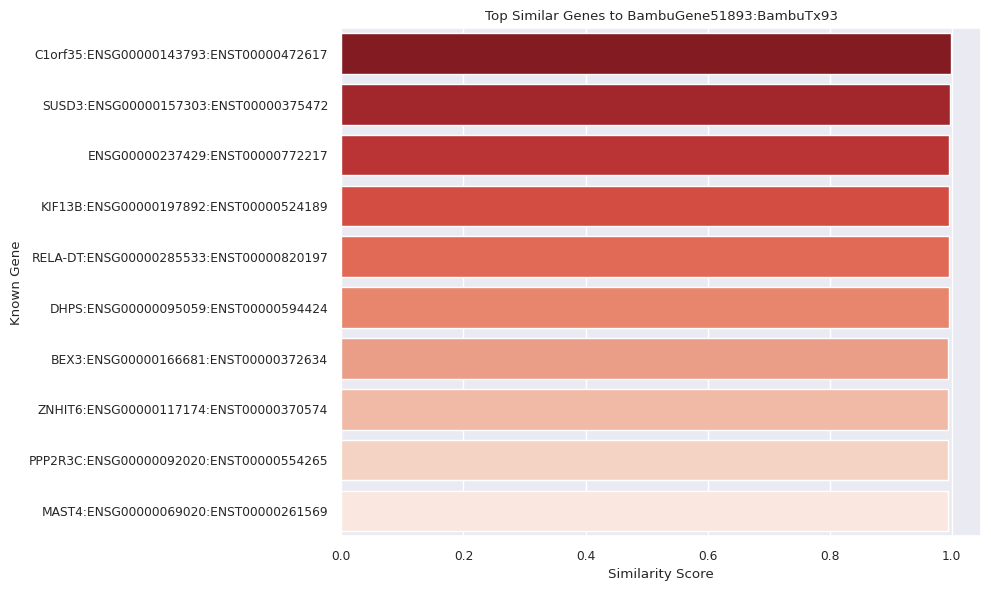

/tmp/ipykernel_3152855/1074319157.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=subset_sorted, x="Similarity", y="KnownGene", palette="Reds_r")


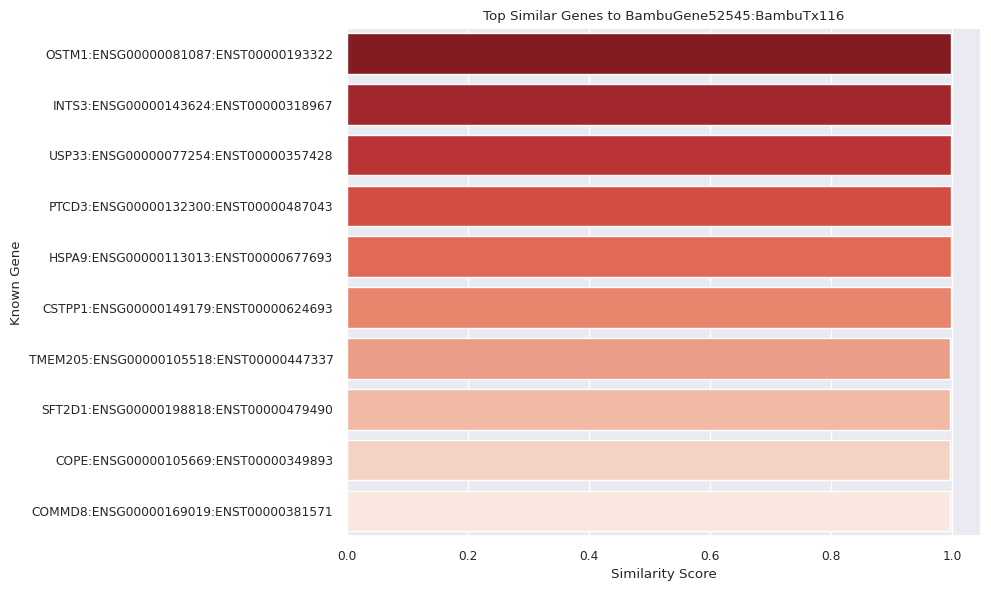

/tmp/ipykernel_3152855/1074319157.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=subset_sorted, x="Similarity", y="KnownGene", palette="Reds_r")


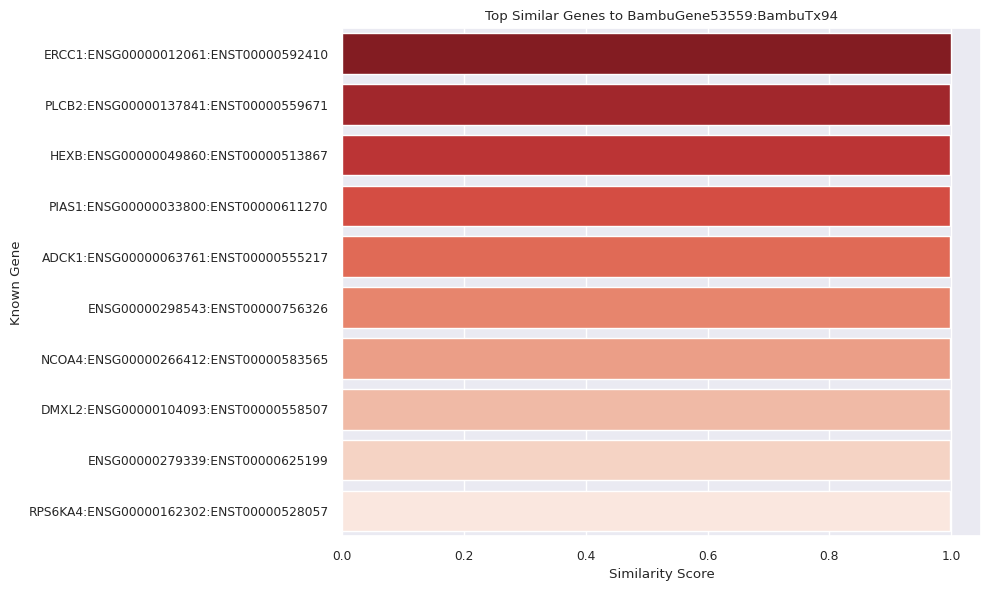

/tmp/ipykernel_3152855/1074319157.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=subset_sorted, x="Similarity", y="KnownGene", palette="Reds_r")


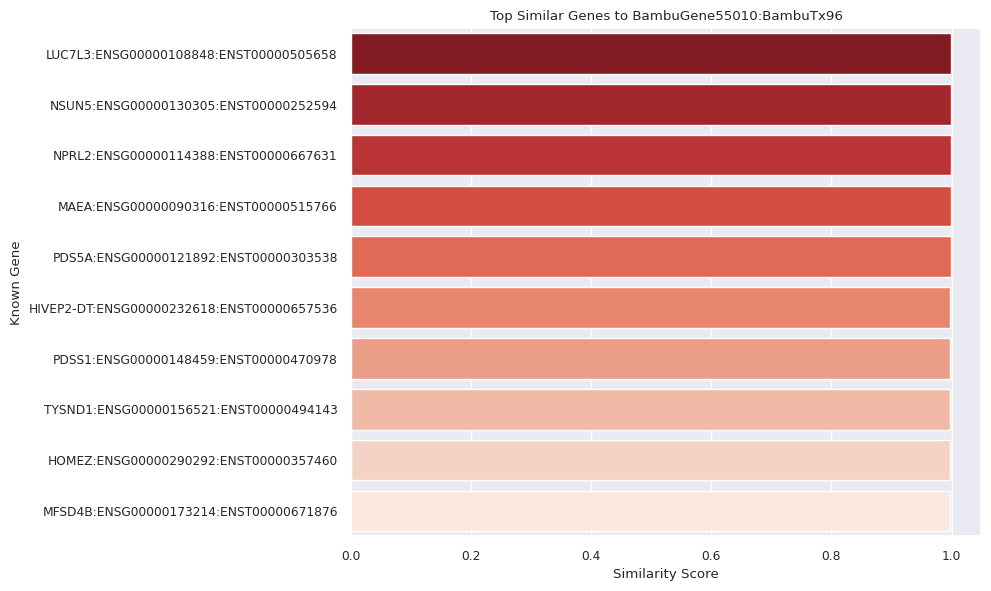

/tmp/ipykernel_3152855/1074319157.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=subset_sorted, x="Similarity", y="KnownGene", palette="Reds_r")


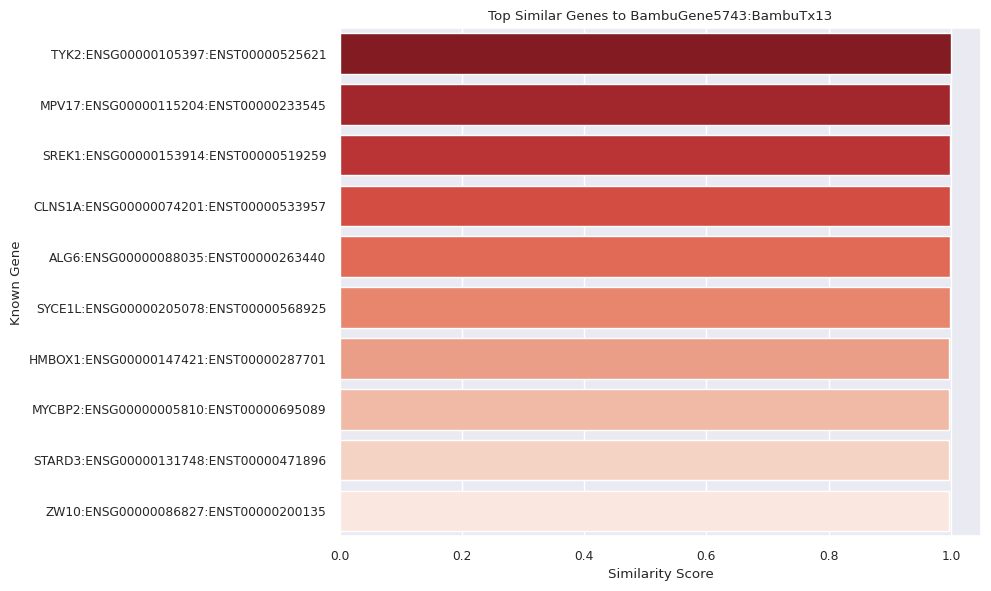

/tmp/ipykernel_3152855/1074319157.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=subset_sorted, x="Similarity", y="KnownGene", palette="Reds_r")


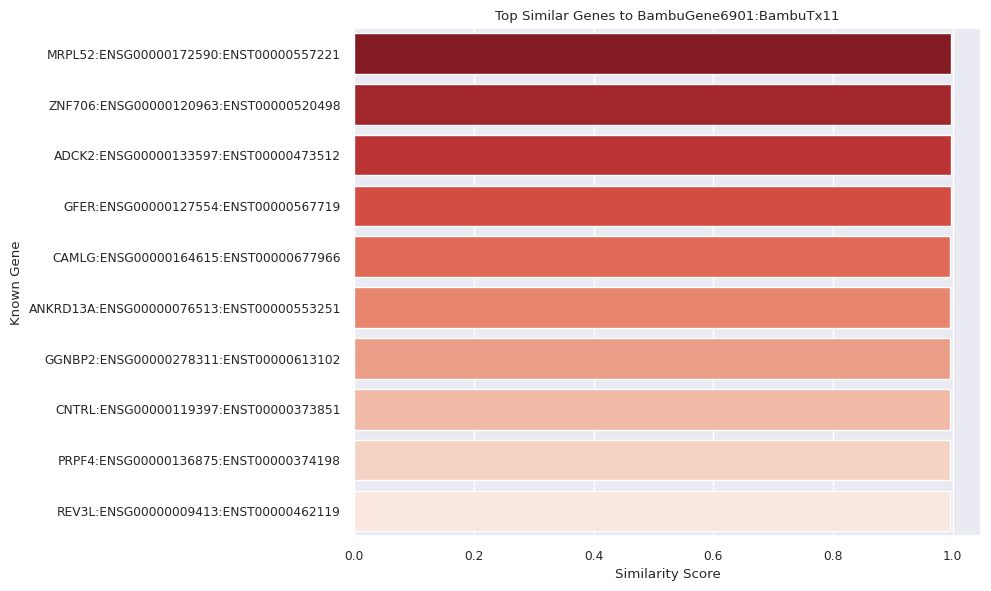

/tmp/ipykernel_3152855/1074319157.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=subset_sorted, x="Similarity", y="KnownGene", palette="Reds_r")


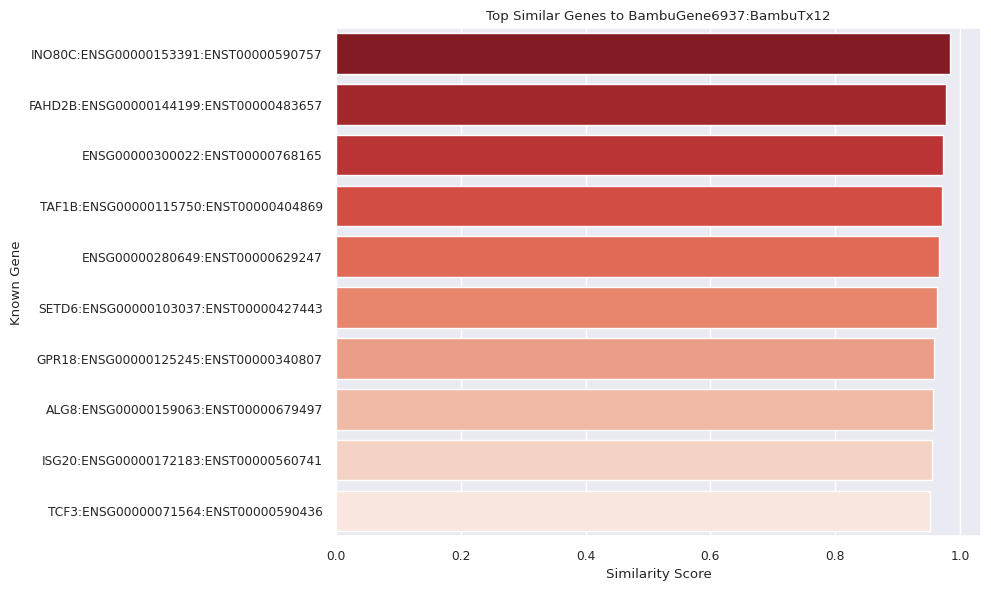

/tmp/ipykernel_3152855/1074319157.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=subset_sorted, x="Similarity", y="KnownGene", palette="Reds_r")


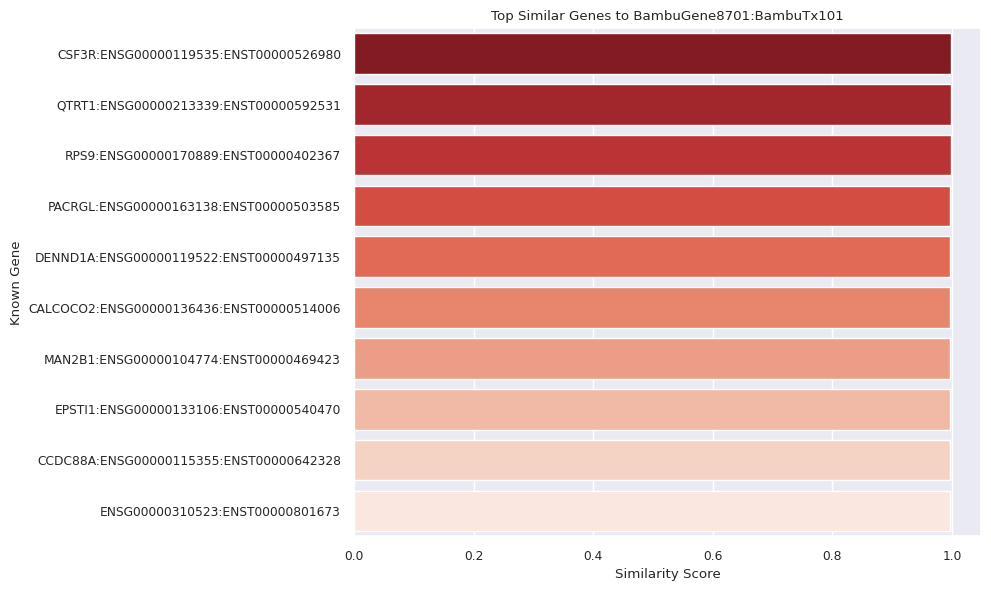

In [93]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plot for Novel Genes
for novel_gene in df_novel_gene_similarities["NovelGene"].unique():
    subset = df_novel_gene_similarities[df_novel_gene_similarities["NovelGene"] == novel_gene]
    subset_sorted = subset.sort_values("Similarity", ascending=False)
    plt.figure(figsize=(10, 6))
    sns.barplot(data=subset_sorted, x="Similarity", y="KnownGene", palette="Reds_r")
    plt.xlabel("Similarity Score")
    plt.ylabel("Known Gene")
    plt.title(f"Top Similar Genes to {novel_gene}")
    plt.tight_layout()
    plt.show()

In [115]:
import pandas as pd
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming expr_avg is already defined elsewhere and contains expression data

# Calculate similarities for each novel isoform of known genes
similarity_results_novel_isoforms = []

# Filter for novel isoforms of known genes
novel_isoforms = [g for g in expr_avg.index if ("ENSG" in g and "BambuTx" in g)]

for novel_isoform in tqdm(novel_isoforms, desc="Calculating similarities for Novel Isoforms"):
    target_expr = expr_avg.loc[novel_isoform]
    
    # Filter for sibling isoforms (same gene ENSG part but different BambuTx)
    ensg_id = novel_isoform.split(":")[0]
    sibling_isoforms = [
        g for g in expr_avg.index 
        if (ensg_id in g) and (g != novel_isoform)
    ]
    sibling_expr = expr_avg.loc[sibling_isoforms]
    
    # Calculate Pearson correlation
    corr = sibling_expr.corrwith(target_expr, axis=1)
    
    # Select top 10 most similar (positive or negative)
    top_similar = corr.sort_values(ascending=False).head(10)
    
    # Save results
    for gene, score in top_similar.items():
        similarity_results_novel_isoforms.append({
            "NovelIsoform": novel_isoform,
            "SiblingIsoform": gene,
            "Similarity": score
        })

# Create DataFrame
df_novel_isoform_similarities = pd.DataFrame(similarity_results_novel_isoforms)

# Save to file
df_novel_isoform_similarities.to_csv("Intermediate_Files/NovelIsoforms_Similarities.tsv", sep="\t", index=False)
print("✅ Similarity analysis for novel isoforms complete and saved!")

Calculating similarities for Novel Isoforms: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 44/44 [00:00<00:00, 112.17it/s]

✅ Similarity analysis for novel isoforms complete and saved!



🔎 Novel Isoform: ENSG00000002822:BambuTx77
  - MAD1L1:ENSG00000002822:ENST00000406869 (Similarity=0.74)
  - MAD1L1:ENSG00000002822:ENST00000265854 (Similarity=0.72)
  - MAD1L1:ENSG00000002822:ENST00000399654 (Similarity=0.57)
  - MAD1L1:ENSG00000002822:ENST00000468372 (Similarity=0.42)
  - MAD1L1:ENSG00000002822:ENST00000402746 (Similarity=0.35)
  - MAD1L1:ENSG00000002822:ENST00000481633 (Similarity=0.34)
  - MAD1L1:ENSG00000002822:ENST00000496548 (Similarity=0.29)
  - MAD1L1:ENSG00000002822:ENST00000437877 (Similarity=-0.18)


/tmp/ipykernel_3152855/2119223376.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(


✅ Saved plot: Intermediate_Files/Paper_Figs/SimilarityPlots/NovelIsoform_ENSG00000002822_BambuTx77_similarity.pdf


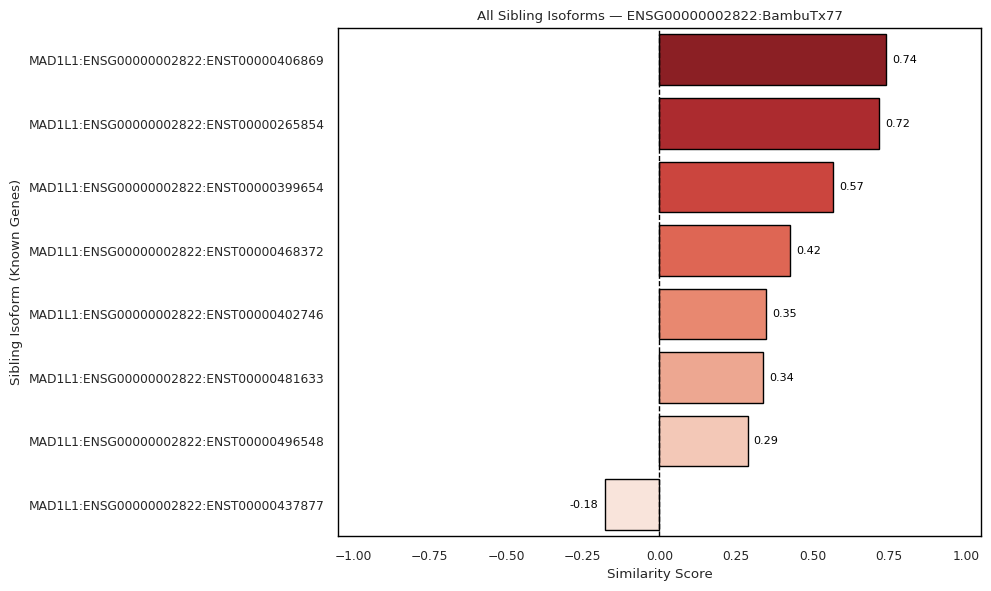


🔎 Novel Isoform: ENSG00000107014:BambuTx87
  - RLN2:ENSG00000107014:ENST00000416837 (Similarity=0.73)
  - RLN2:ENSG00000107014:ENST00000381627 (Similarity=0.67)
✅ Saved plot: Intermediate_Files/Paper_Figs/SimilarityPlots/NovelIsoform_ENSG00000107014_BambuTx87_similarity.pdf


/tmp/ipykernel_3152855/2119223376.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(


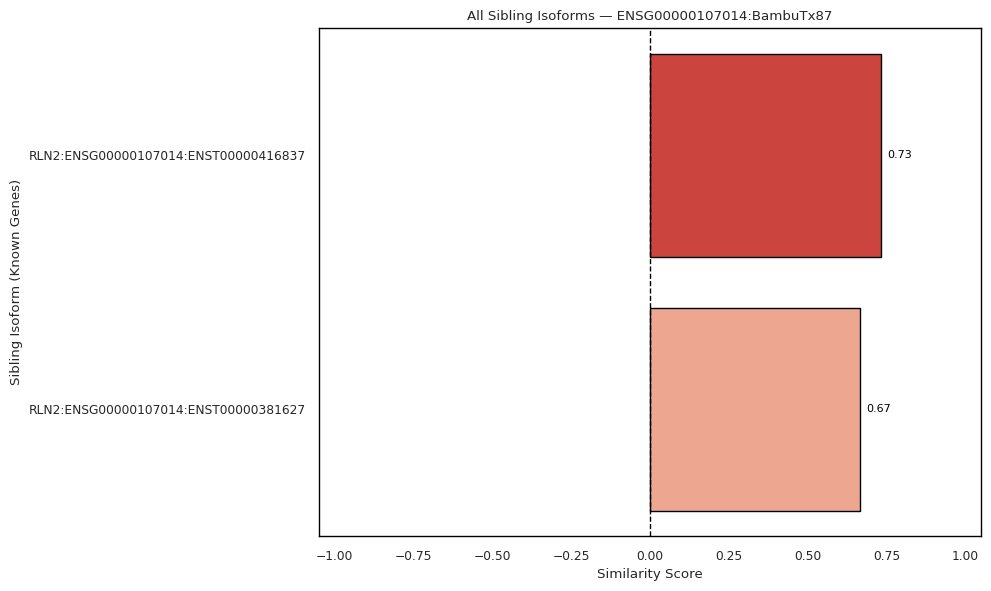

/tmp/ipykernel_3152855/2119223376.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(



🔎 Novel Isoform: ENSG00000107018:BambuTx88
  - RLN1:ENSG00000107018:ENST00000487557 (Similarity=-0.72)
✅ Saved plot: Intermediate_Files/Paper_Figs/SimilarityPlots/NovelIsoform_ENSG00000107018_BambuTx88_similarity.pdf


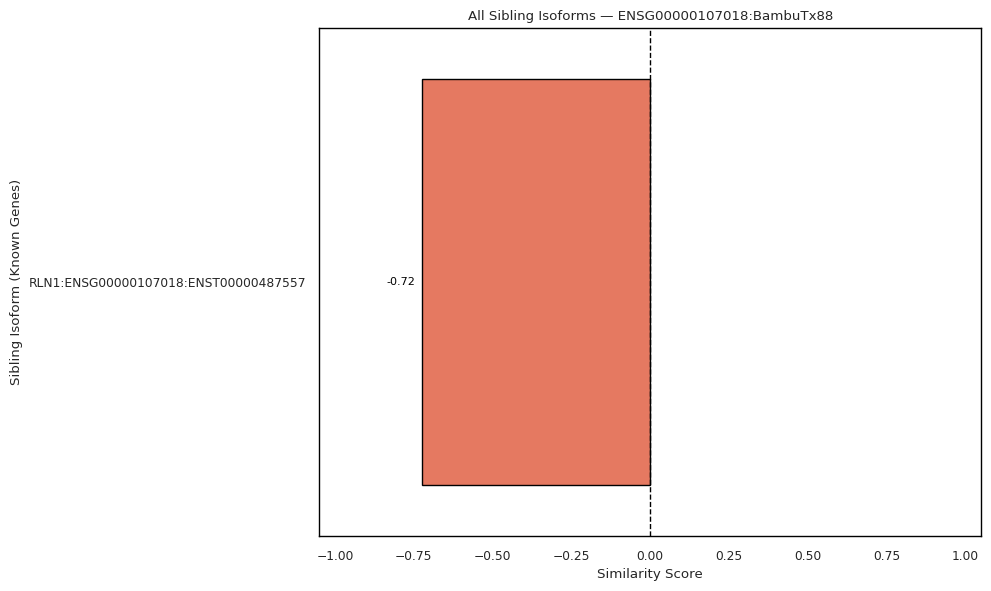


🔎 Novel Isoform: ENSG00000127249:BambuTx60
  - ATP13A4:ENSG00000127249:ENST00000342695 (Similarity=0.37)


/tmp/ipykernel_3152855/2119223376.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(


✅ Saved plot: Intermediate_Files/Paper_Figs/SimilarityPlots/NovelIsoform_ENSG00000127249_BambuTx60_similarity.pdf


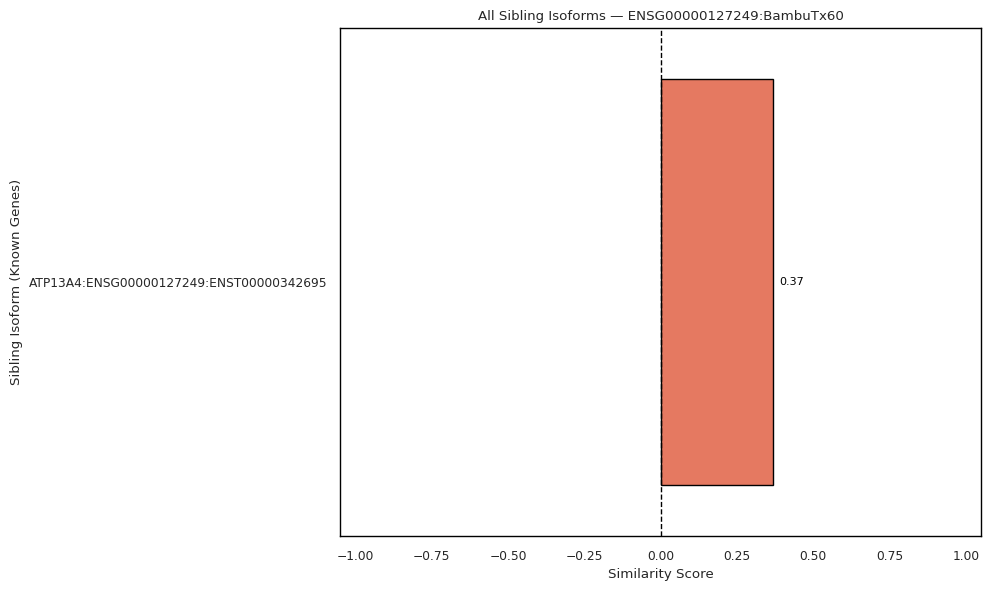


🔎 Novel Isoform: ENSG00000135951:BambuTx47
  - TSGA10:ENSG00000135951:ENST00000498097 (Similarity=0.57)
  - TSGA10:ENSG00000135951:ENST00000409564 (Similarity=0.49)
  - TSGA10:ENSG00000135951:ENST00000674128 (Similarity=0.45)
  - TSGA10:ENSG00000135951:ENST00000464459 (Similarity=0.38)
  - TSGA10:ENSG00000135951:ENST00000489348 (Similarity=0.20)
  - TSGA10:ENSG00000135951:ENST00000410001 (Similarity=0.08)
  - TSGA10:ENSG00000135951:ENST00000465216 (Similarity=0.07)
  - TSGA10:ENSG00000135951:ENST00000393482 (Similarity=0.00)
  - TSGA10:ENSG00000135951:ENST00000393483 (Similarity=0.00)
  - TSGA10:ENSG00000135951:ENST00000483914 (Similarity=-0.11)
  - TSGA10:ENSG00000135951:ENST00000355053 (Similarity=-0.13)
  - TSGA10:ENSG00000135951:ENST00000478090 (Similarity=-0.29)


/tmp/ipykernel_3152855/2119223376.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(


✅ Saved plot: Intermediate_Files/Paper_Figs/SimilarityPlots/NovelIsoform_ENSG00000135951_BambuTx47_similarity.pdf


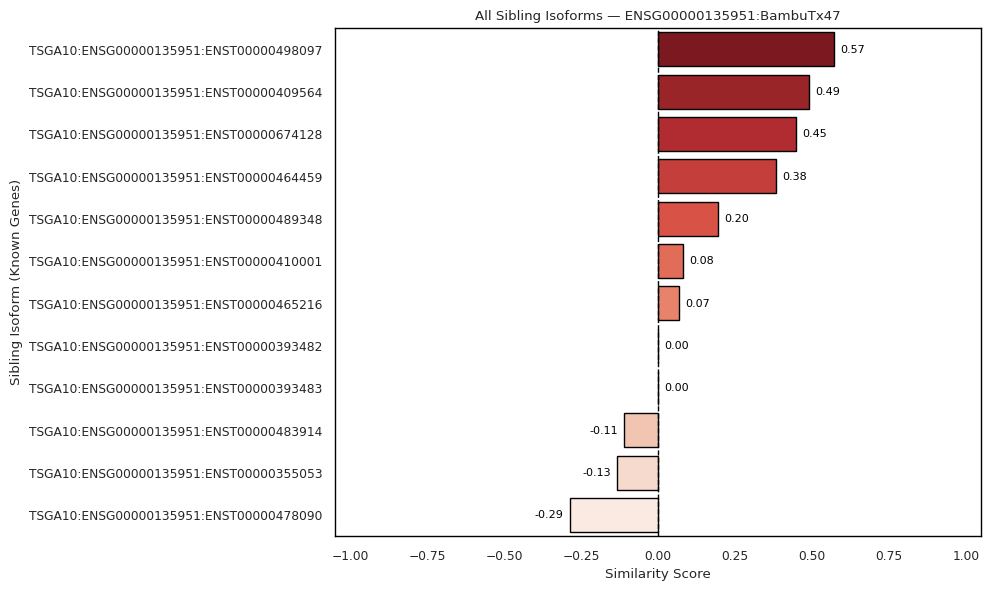


🔎 Novel Isoform: ENSG00000145220:BambuTx64
  - LYAR:ENSG00000145220:ENST00000343470 (Similarity=0.95)
  - LYAR:ENSG00000145220:ENST00000502917 (Similarity=0.70)
  - LYAR:ENSG00000145220:ENST00000452476 (Similarity=0.35)
✅ Saved plot: Intermediate_Files/Paper_Figs/SimilarityPlots/NovelIsoform_ENSG00000145220_BambuTx64_similarity.pdf


/tmp/ipykernel_3152855/2119223376.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(


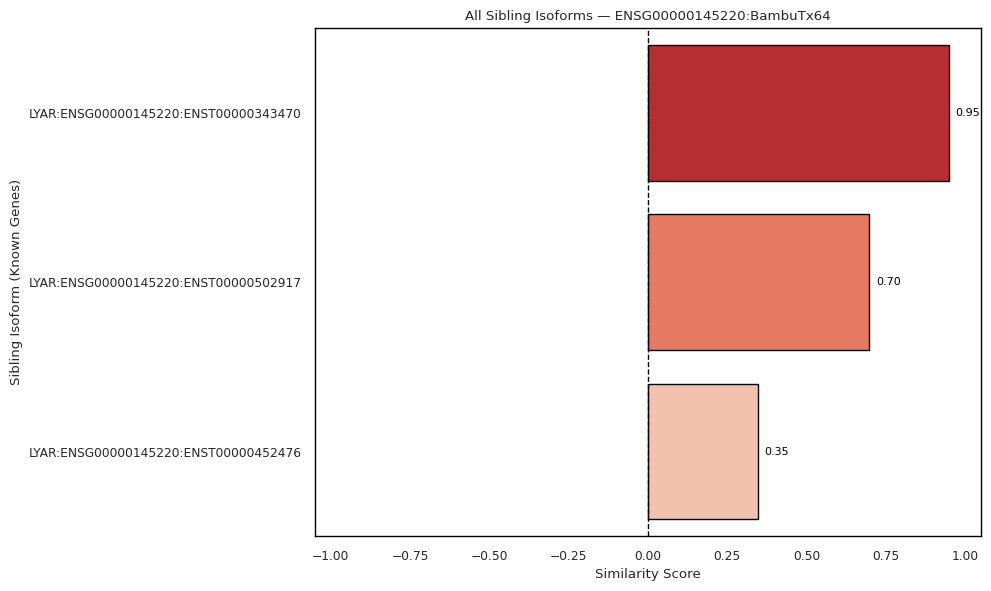


🔎 Novel Isoform: ENSG00000166295:BambuTx14
  - ENSG00000166295:BambuTx15 (Similarity=0.73)
  - ANAPC16:ENSG00000166295:ENST00000299381 (Similarity=0.69)
  - ANAPC16:ENSG00000166295:ENST00000478193 (Similarity=0.37)
  - ANAPC16:ENSG00000166295:ENST00000621663 (Similarity=0.34)
  - ANAPC16:ENSG00000166295:ENST00000470481 (Similarity=-0.34)
  - ANAPC16:ENSG00000166295:ENST00000615507 (Similarity=-0.35)
✅ Saved plot: Intermediate_Files/Paper_Figs/SimilarityPlots/NovelIsoform_ENSG00000166295_BambuTx14_similarity.pdf


/tmp/ipykernel_3152855/2119223376.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(


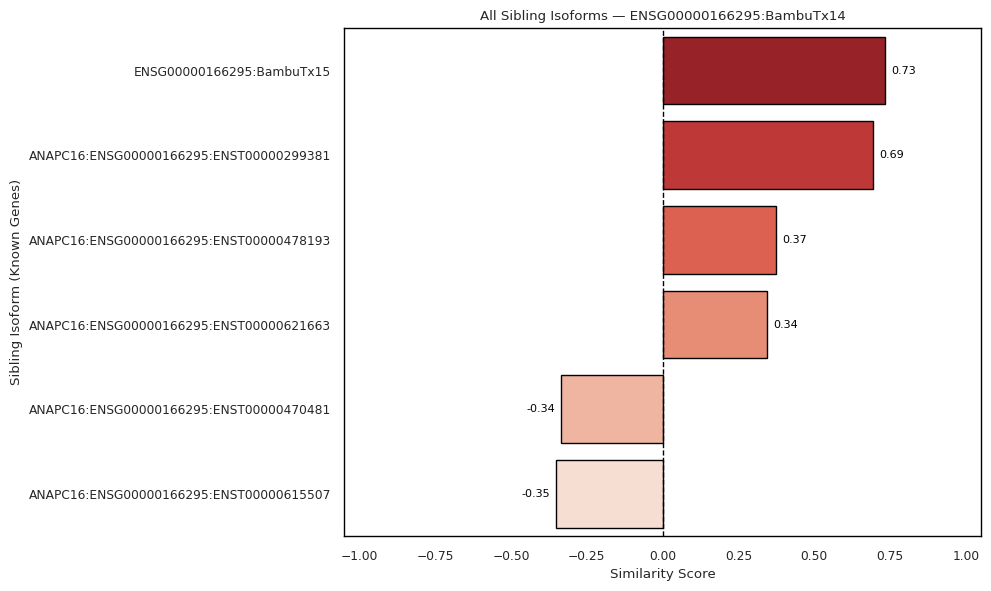


🔎 Novel Isoform: ENSG00000166295:BambuTx15
  - ANAPC16:ENSG00000166295:ENST00000299381 (Similarity=0.90)
  - ANAPC16:ENSG00000166295:ENST00000621663 (Similarity=0.87)
  - ENSG00000166295:BambuTx14 (Similarity=0.73)
  - ANAPC16:ENSG00000166295:ENST00000478193 (Similarity=0.66)
  - ANAPC16:ENSG00000166295:ENST00000470481 (Similarity=0.02)
  - ANAPC16:ENSG00000166295:ENST00000615507 (Similarity=-0.01)
✅ Saved plot: Intermediate_Files/Paper_Figs/SimilarityPlots/NovelIsoform_ENSG00000166295_BambuTx15_similarity.pdf


/tmp/ipykernel_3152855/2119223376.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(


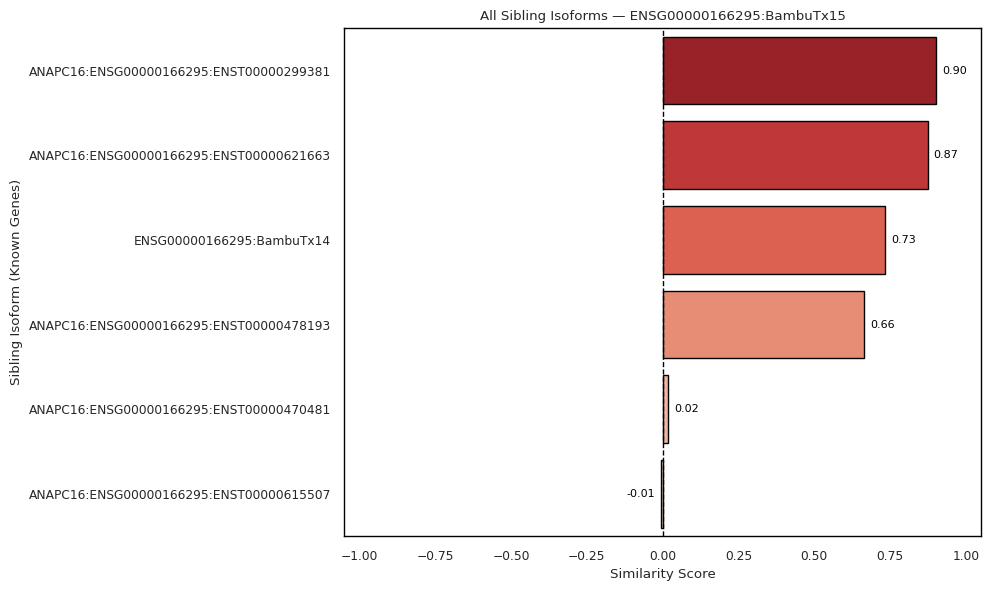


🔎 Novel Isoform: ENSG00000176160:BambuTx110
  - HSF5:ENSG00000176160:ENST00000323777 (Similarity=-0.30)
✅ Saved plot: Intermediate_Files/Paper_Figs/SimilarityPlots/NovelIsoform_ENSG00000176160_BambuTx110_similarity.pdf


/tmp/ipykernel_3152855/2119223376.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(


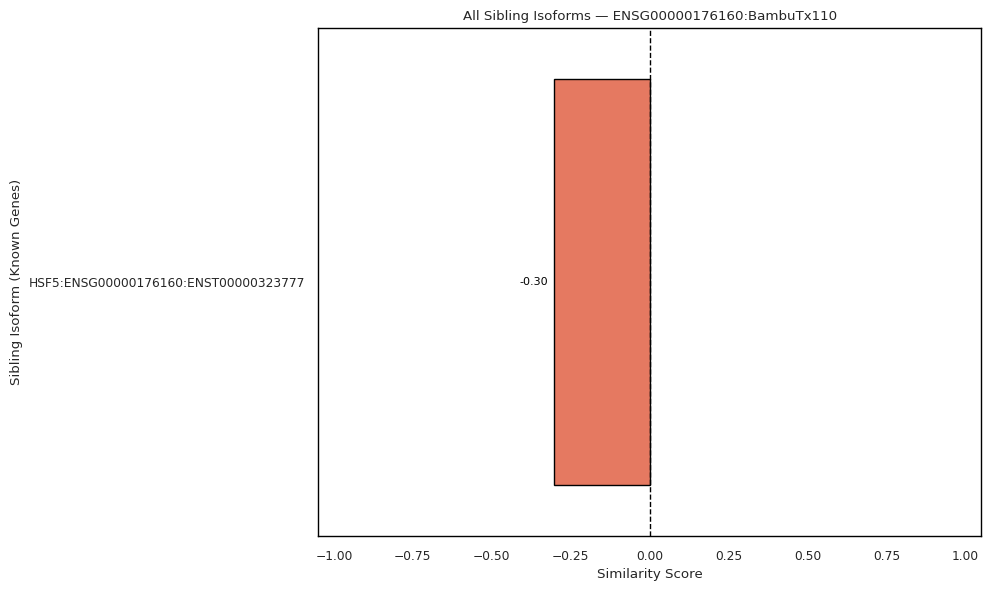


🔎 Novel Isoform: ENSG00000187118:BambuTx55
  - CMC1:ENSG00000187118:ENST00000482499 (Similarity=0.89)
  - CMC1:ENSG00000187118:ENST00000396610 (Similarity=0.86)
  - CMC1:ENSG00000187118:ENST00000468330 (Similarity=0.85)
  - CMC1:ENSG00000187118:ENST00000469102 (Similarity=0.82)
  - CMC1:ENSG00000187118:ENST00000423894 (Similarity=0.77)
  - CMC1:ENSG00000187118:ENST00000477739 (Similarity=0.63)
  - CMC1:ENSG00000187118:ENST00000418849 (Similarity=0.59)
  - CMC1:ENSG00000187118:ENST00000466830 (Similarity=0.56)
  - CMC1:ENSG00000187118:ENST00000334841 (Similarity=0.19)


/tmp/ipykernel_3152855/2119223376.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(


✅ Saved plot: Intermediate_Files/Paper_Figs/SimilarityPlots/NovelIsoform_ENSG00000187118_BambuTx55_similarity.pdf


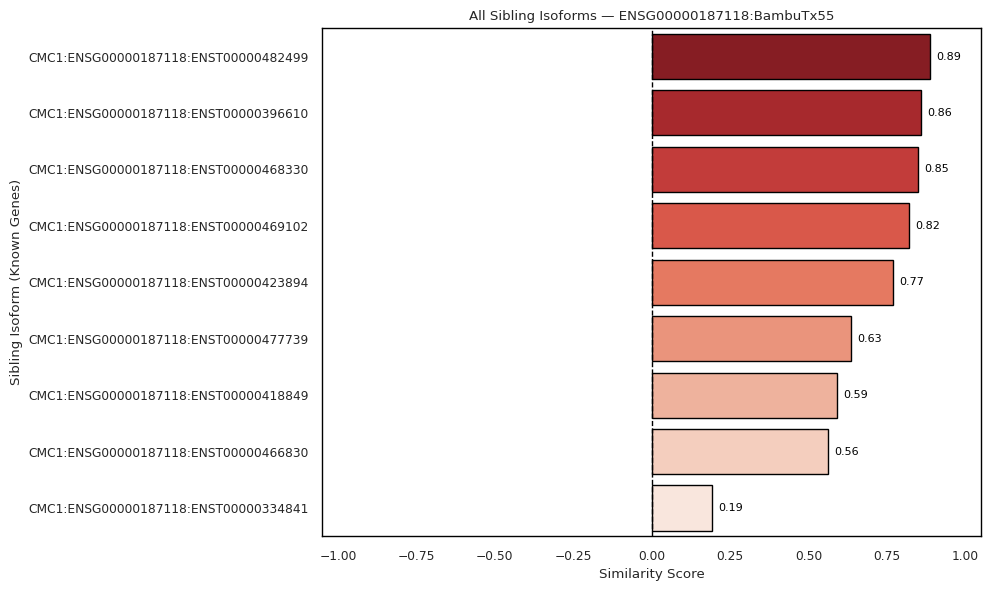


🔎 Novel Isoform: ENSG00000196236:BambuTx52
  - XPNPEP3:ENSG00000196236:ENST00000482652 (Similarity=-0.02)
  - XPNPEP3:ENSG00000196236:ENST00000428799 (Similarity=-0.27)
  - XPNPEP3:ENSG00000196236:ENST00000357137 (Similarity=-0.36)
✅ Saved plot: Intermediate_Files/Paper_Figs/SimilarityPlots/NovelIsoform_ENSG00000196236_BambuTx52_similarity.pdf


/tmp/ipykernel_3152855/2119223376.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(


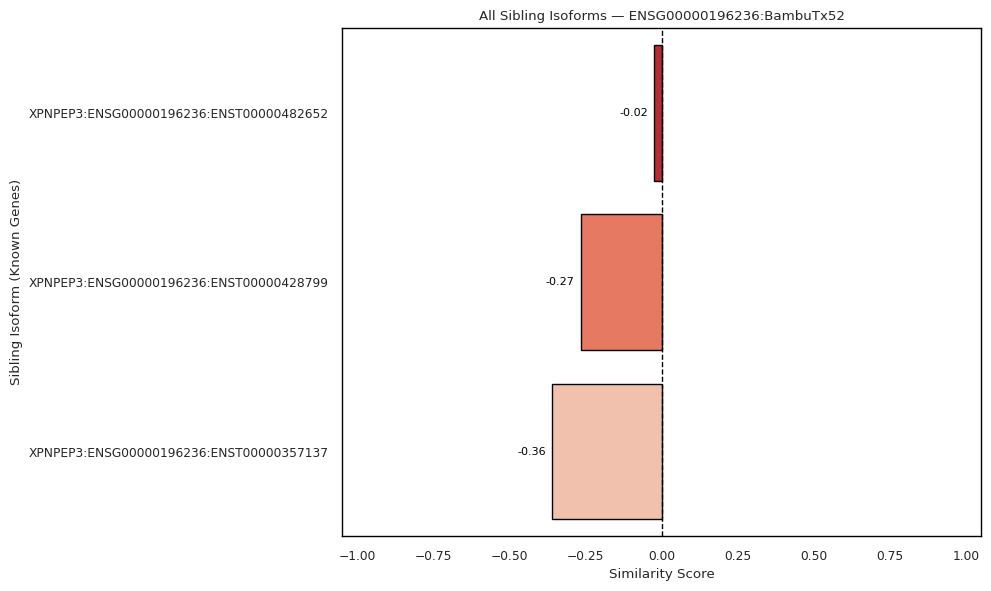


🔎 Novel Isoform: ENSG00000196284:BambuTx73
  - SUPT3H:ENSG00000196284:ENST00000371459 (Similarity=0.71)
  - SUPT3H:ENSG00000196284:ENST00000475057 (Similarity=0.56)
✅ Saved plot: Intermediate_Files/Paper_Figs/SimilarityPlots/NovelIsoform_ENSG00000196284_BambuTx73_similarity.pdf


/tmp/ipykernel_3152855/2119223376.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(


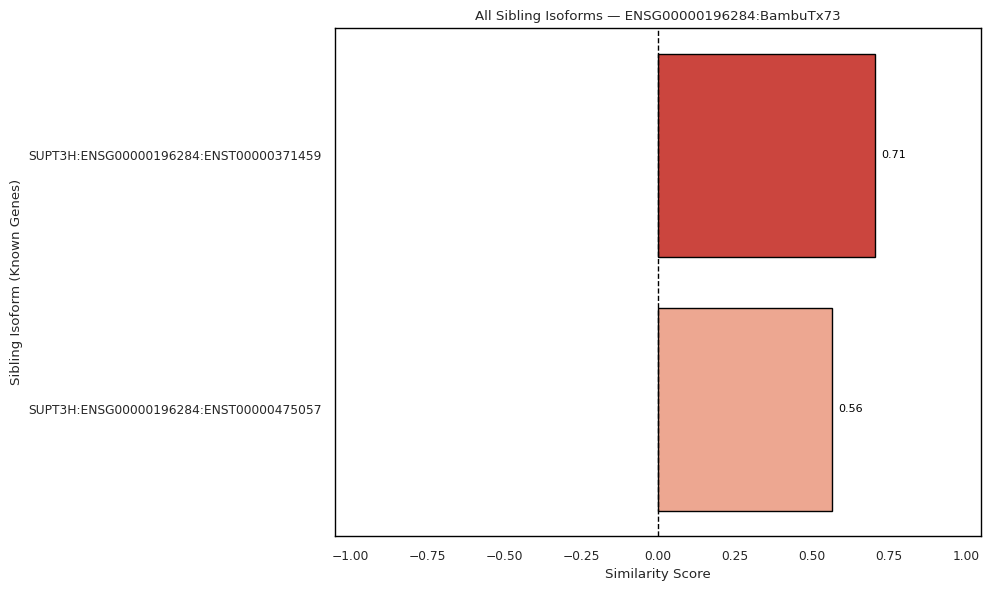

/tmp/ipykernel_3152855/2119223376.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(



🔎 Novel Isoform: ENSG00000211677:BambuTx48
  - IGLC2:ENSG00000211677:ENST00000390323 (Similarity=0.98)
✅ Saved plot: Intermediate_Files/Paper_Figs/SimilarityPlots/NovelIsoform_ENSG00000211677_BambuTx48_similarity.pdf


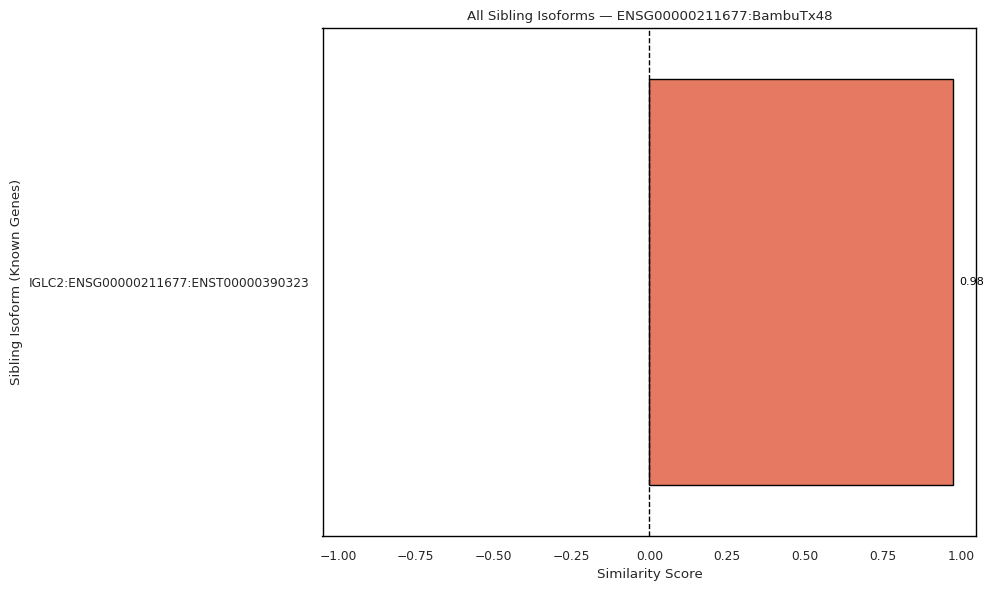


🔎 Novel Isoform: ENSG00000215375:BambuTx61
  - MYL5:ENSG00000215375:ENST00000503300 (Similarity=0.94)
  - MYL5:ENSG00000215375:ENST00000400159 (Similarity=0.79)
  - MYL5:ENSG00000215375:ENST00000506838 (Similarity=0.75)
  - MYL5:ENSG00000215375:ENST00000511290 (Similarity=0.72)
  - MYL5:ENSG00000215375:ENST00000503612 (Similarity=0.70)


/tmp/ipykernel_3152855/2119223376.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(


✅ Saved plot: Intermediate_Files/Paper_Figs/SimilarityPlots/NovelIsoform_ENSG00000215375_BambuTx61_similarity.pdf


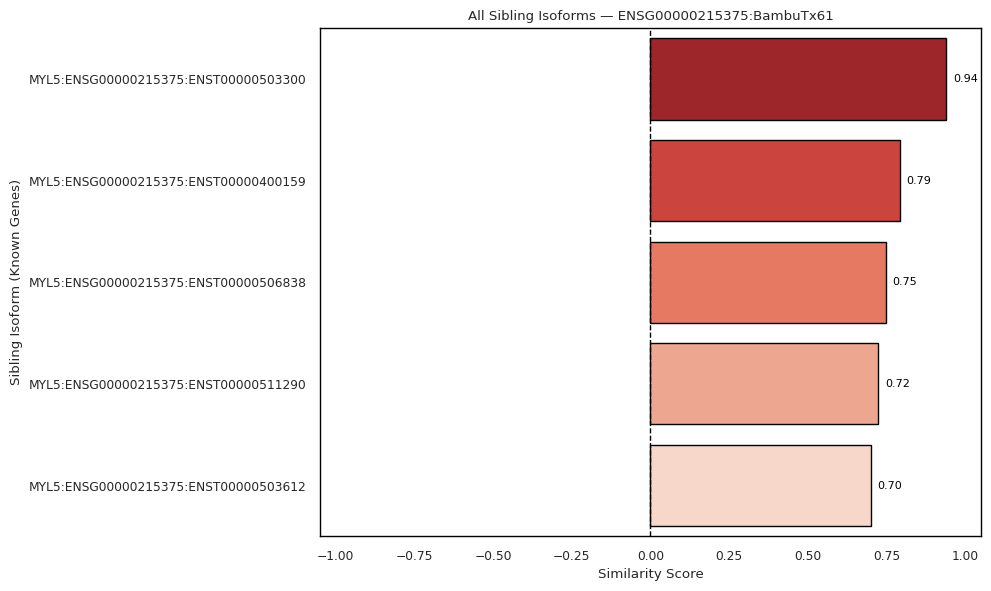


🔎 Novel Isoform: ENSG00000243449:BambuTx63
  - NICOL1:ENSG00000243449:ENST00000409248 (Similarity=0.49)
  - NICOL1:ENSG00000243449:ENST00000409860 (Similarity=0.47)
✅ Saved plot: Intermediate_Files/Paper_Figs/SimilarityPlots/NovelIsoform_ENSG00000243449_BambuTx63_similarity.pdf


/tmp/ipykernel_3152855/2119223376.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(


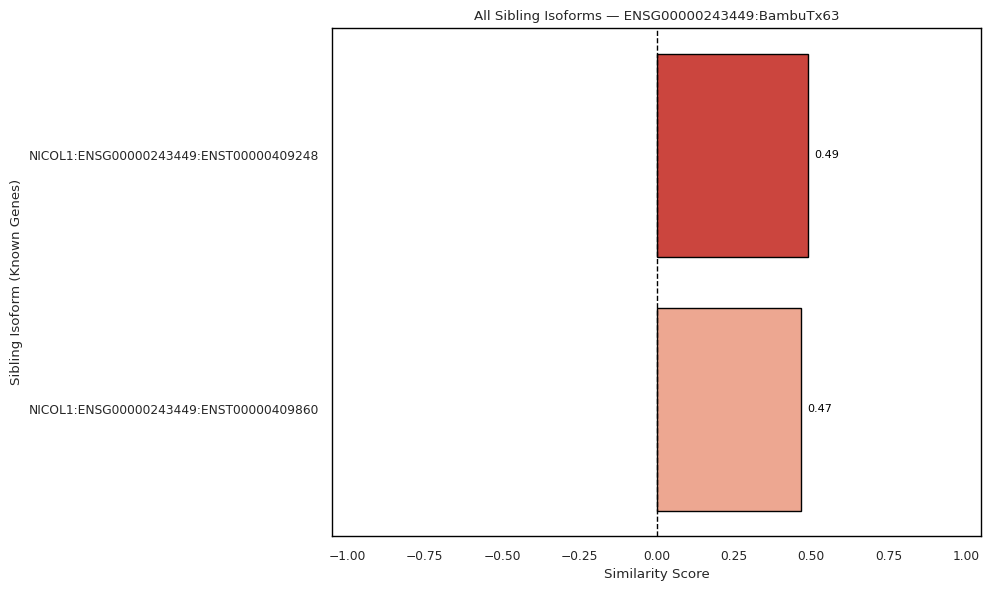

/tmp/ipykernel_3152855/2119223376.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(



🔎 Novel Isoform: ENSG00000243829:BambuTx106
  - ENSG00000243829:BambuTx111 (Similarity=0.04)
  - ENSG00000243829:BambuTx113 (Similarity=-0.18)
✅ Saved plot: Intermediate_Files/Paper_Figs/SimilarityPlots/NovelIsoform_ENSG00000243829_BambuTx106_similarity.pdf


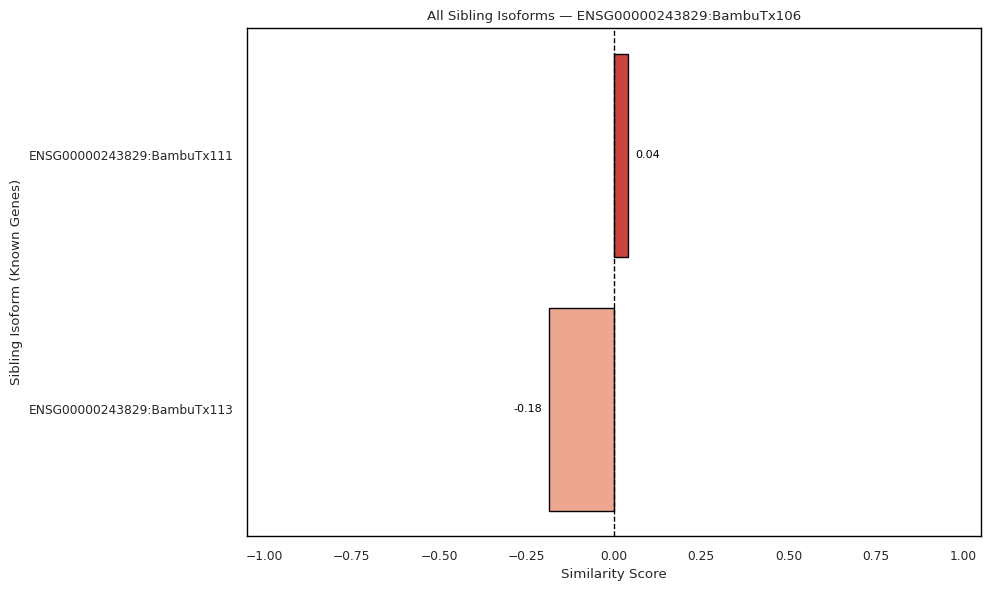

/tmp/ipykernel_3152855/2119223376.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(



🔎 Novel Isoform: ENSG00000243829:BambuTx111
  - ENSG00000243829:BambuTx113 (Similarity=0.44)
  - ENSG00000243829:BambuTx106 (Similarity=0.04)
✅ Saved plot: Intermediate_Files/Paper_Figs/SimilarityPlots/NovelIsoform_ENSG00000243829_BambuTx111_similarity.pdf


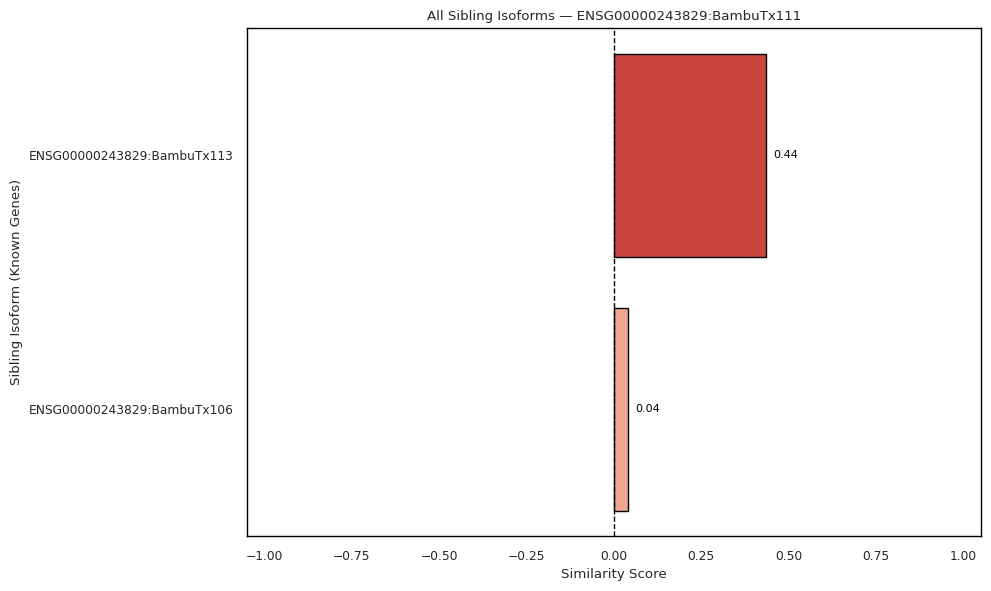

/tmp/ipykernel_3152855/2119223376.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(



🔎 Novel Isoform: ENSG00000243829:BambuTx113
  - ENSG00000243829:BambuTx111 (Similarity=0.44)
  - ENSG00000243829:BambuTx106 (Similarity=-0.18)
✅ Saved plot: Intermediate_Files/Paper_Figs/SimilarityPlots/NovelIsoform_ENSG00000243829_BambuTx113_similarity.pdf


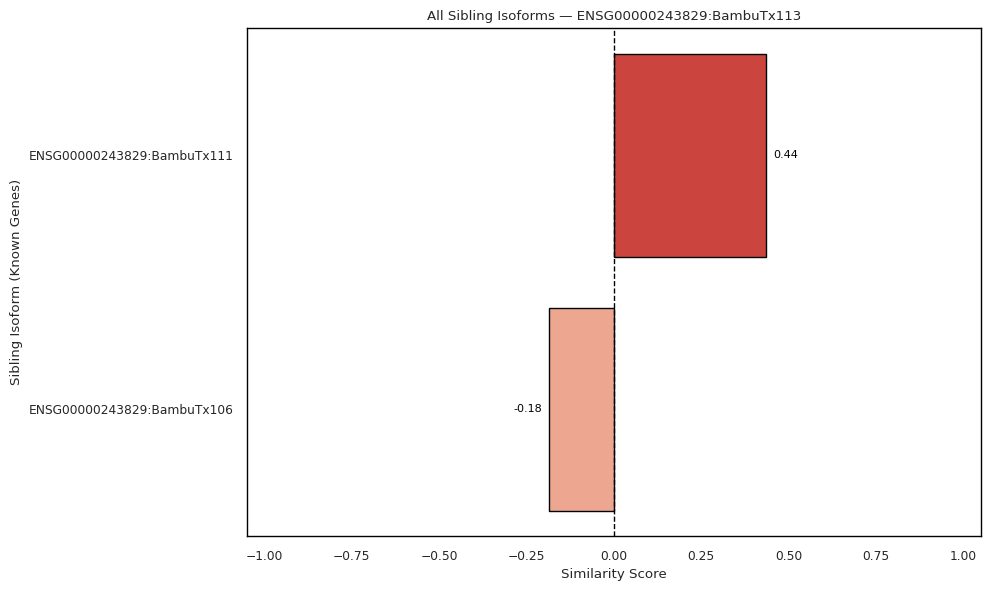


🔎 Novel Isoform: ENSG00000253409:BambuTx81
  - TRBV7-4:ENSG00000253409:ENST00000390369 (Similarity=1.00)


/tmp/ipykernel_3152855/2119223376.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(


✅ Saved plot: Intermediate_Files/Paper_Figs/SimilarityPlots/NovelIsoform_ENSG00000253409_BambuTx81_similarity.pdf


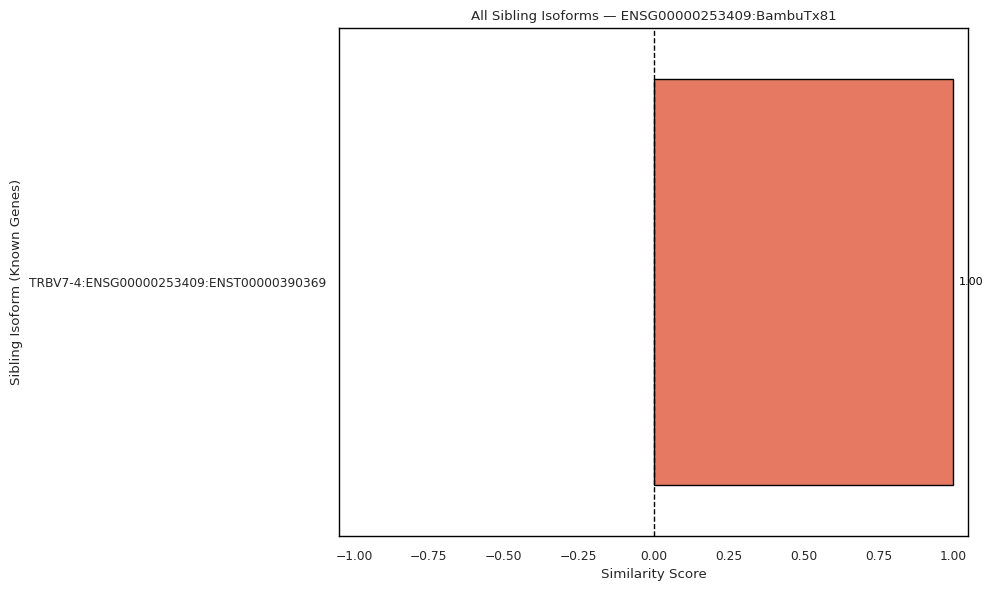


🔎 Novel Isoform: ENSG00000261351:BambuTx30
  - ENSG00000261351:ENST00000565387 (Similarity=0.49)


/tmp/ipykernel_3152855/2119223376.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(


✅ Saved plot: Intermediate_Files/Paper_Figs/SimilarityPlots/NovelIsoform_ENSG00000261351_BambuTx30_similarity.pdf


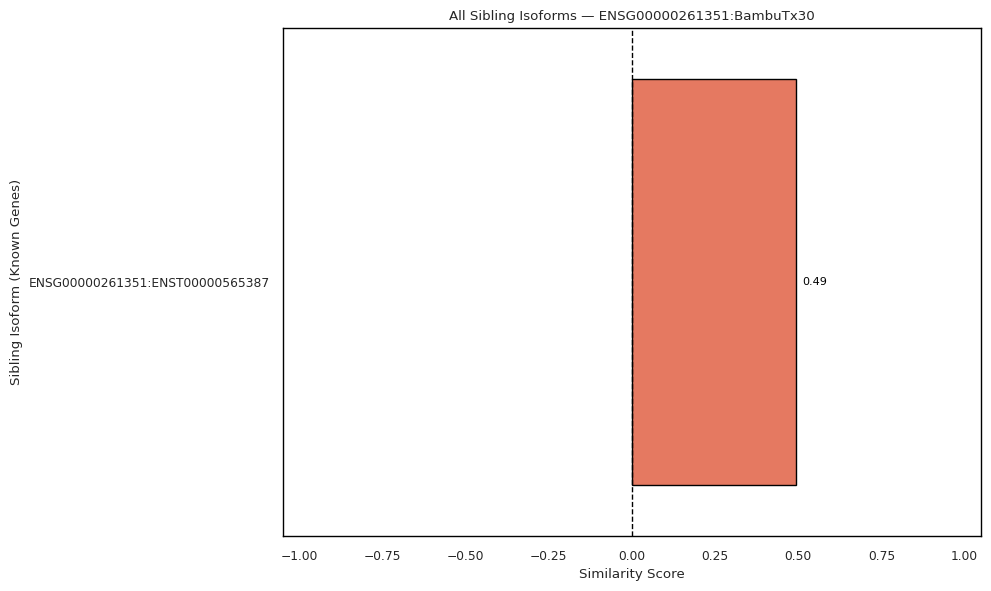


🔎 Novel Isoform: ENSG00000271447:BambuTx36
  - MMP28:ENSG00000271447:ENST00000605424 (Similarity=0.71)
  - MMP28:ENSG00000271447:ENST00000612672 (Similarity=-0.04)
  - MMP28:ENSG00000271447:ENST00000616383 (Similarity=-0.10)


/tmp/ipykernel_3152855/2119223376.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(


✅ Saved plot: Intermediate_Files/Paper_Figs/SimilarityPlots/NovelIsoform_ENSG00000271447_BambuTx36_similarity.pdf


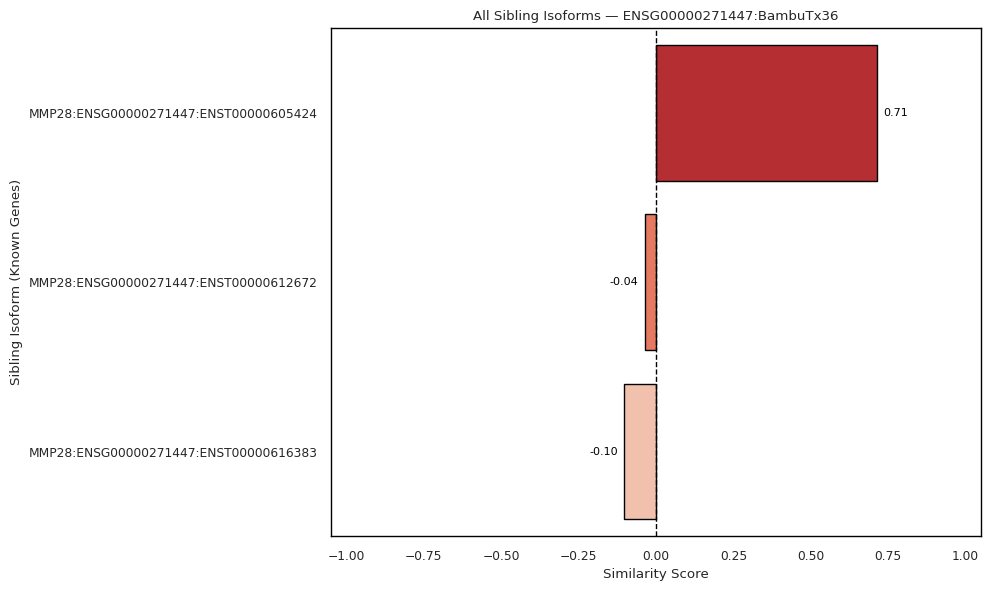


🔎 Novel Isoform: ENSG00000289746:BambuTx78
  - TARP:ENSG00000289746:ENST00000698248 (Similarity=0.89)
✅ Saved plot: Intermediate_Files/Paper_Figs/SimilarityPlots/NovelIsoform_ENSG00000289746_BambuTx78_similarity.pdf


/tmp/ipykernel_3152855/2119223376.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(


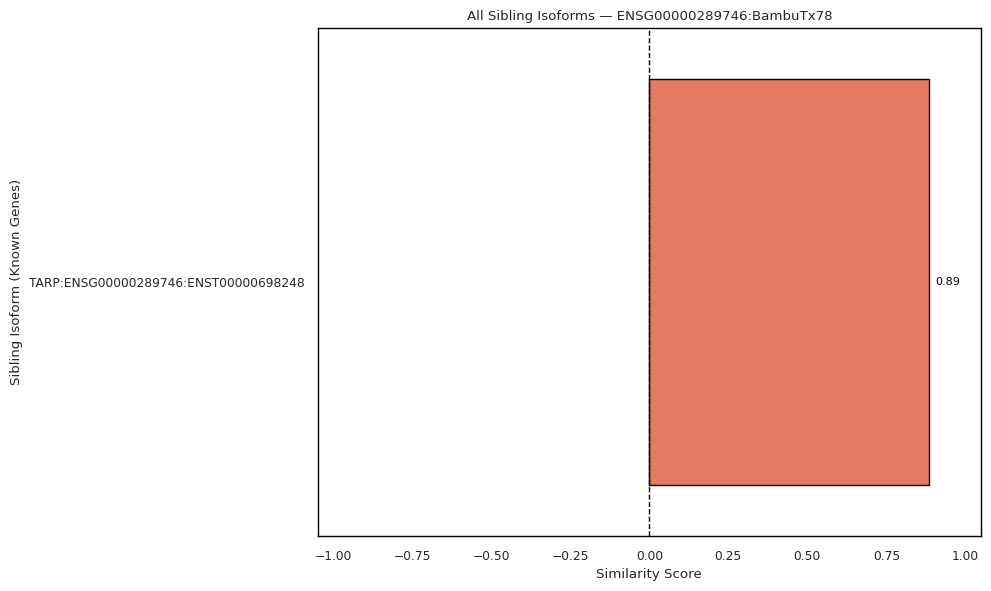


🔎 Novel Isoform: ENSG00000294968:BambuTx51
  - ENSG00000294968:ENST00000727103 (Similarity=0.46)
  - ENSG00000294968:ENST00000727104 (Similarity=0.09)
  - ENSG00000294968:ENST00000727105 (Similarity=0.07)


/tmp/ipykernel_3152855/2119223376.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(


✅ Saved plot: Intermediate_Files/Paper_Figs/SimilarityPlots/NovelIsoform_ENSG00000294968_BambuTx51_similarity.pdf


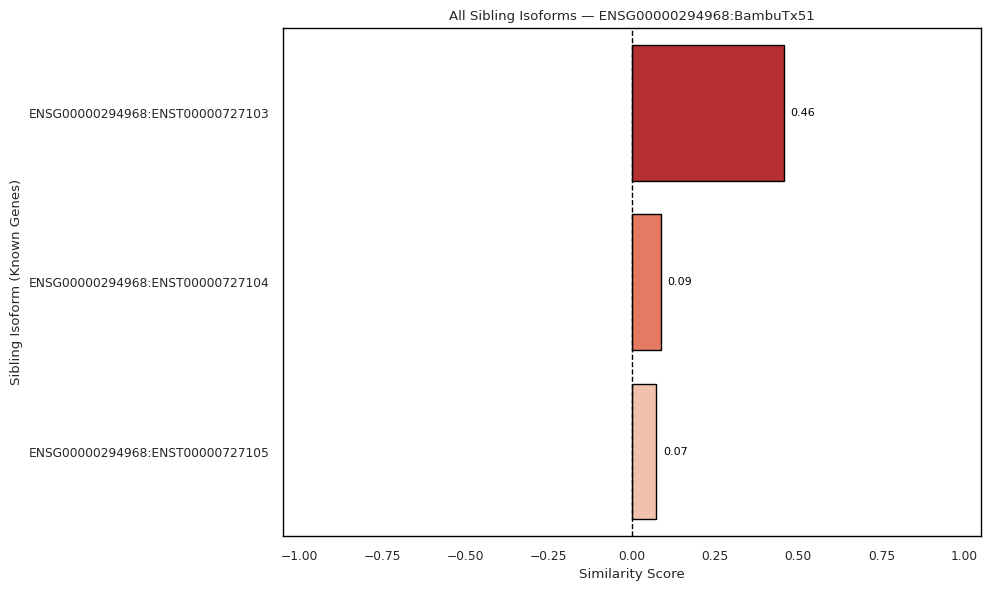

/tmp/ipykernel_3152855/2119223376.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(



🔎 Novel Isoform: ENSG00000308813:BambuTx75
  - ENSG00000308813:ENST00000836544 (Similarity=0.08)
✅ Saved plot: Intermediate_Files/Paper_Figs/SimilarityPlots/NovelIsoform_ENSG00000308813_BambuTx75_similarity.pdf


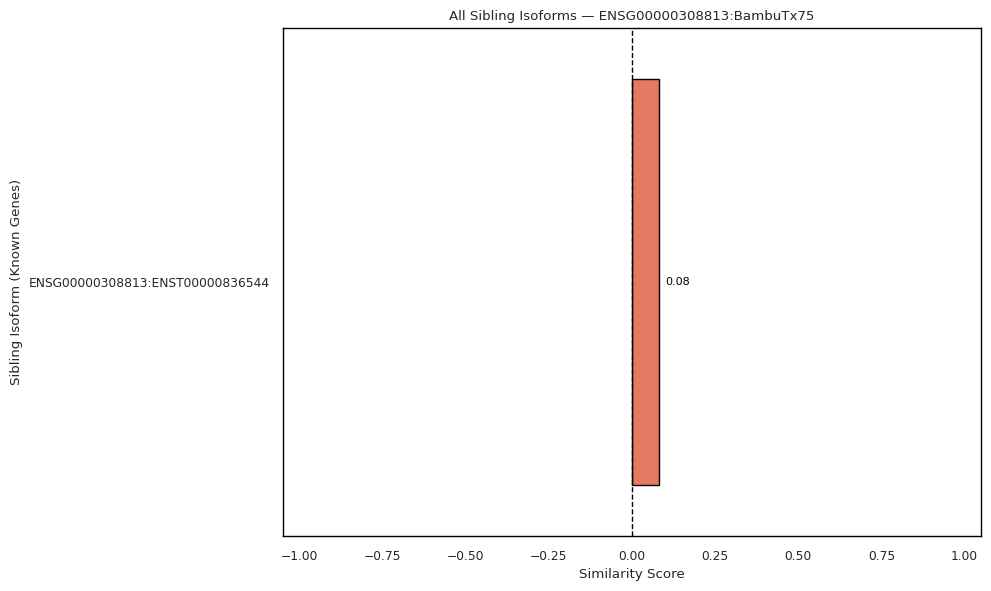


🔎 Novel Isoform: ENSG00000309098:BambuTx2
  - ENSG00000309098:ENST00000838594 (Similarity=0.75)


/tmp/ipykernel_3152855/2119223376.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(


✅ Saved plot: Intermediate_Files/Paper_Figs/SimilarityPlots/NovelIsoform_ENSG00000309098_BambuTx2_similarity.pdf


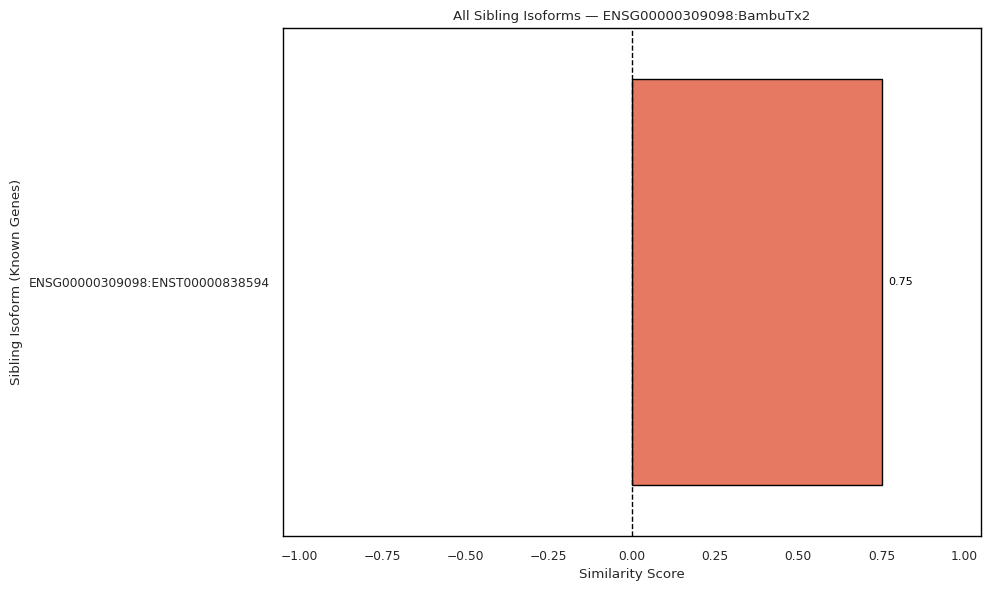

In [128]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Create output directory if it doesn't exist
output_dir = "Intermediate_Files/Paper_Figs/SimilarityPlots"
os.makedirs(output_dir, exist_ok=True)

for novel_isoform in df_novel_isoform_similarities["NovelIsoform"].unique():
    ensg_id = novel_isoform.split(":")[0]
    # Find all sibling isoforms (same ENSG)
    all_siblings = [g for g in expr_avg.index if ensg_id in g and g != novel_isoform]
    
    # Create a DataFrame with all siblings
    df_all_siblings = pd.DataFrame({"SiblingIsoform": all_siblings})
    df_all_siblings["NovelIsoform"] = novel_isoform
    
    # Merge with similarity scores (left join to keep all siblings)
    subset = df_all_siblings.merge(
        df_novel_isoform_similarities,
        on=["NovelIsoform", "SiblingIsoform"],
        how="left"
    ).fillna({"Similarity": 0})
    
    subset_sorted = subset.sort_values("Similarity", ascending=False)
    
    # Print results
    print(f"\n🔎 Novel Isoform: {novel_isoform}")
    for idx, row in subset_sorted.iterrows():
        print(f"  - {row['SiblingIsoform']} (Similarity={row['Similarity']:.2f})")
    
    fig, ax = plt.subplots(figsize=(10, 6), facecolor='white')
    ax.set_facecolor('white')
    
    barplot = sns.barplot(
        data=subset_sorted,
        x="Similarity",
        y="SiblingIsoform",
        palette="Reds_r",
        ax=ax,
        edgecolor='black'
    )
    
    ax.axvline(0, color='black', linewidth=1, linestyle='--')
    ax.set_xticks(np.arange(-1, 1.1, 0.25))
    ax.set_xlim(-1.05, 1.05)
    
    # Annotate each bar
    for p in barplot.patches:
        width = p.get_width()
        y = p.get_y() + p.get_height() / 2
        ha = 'left' if width >= 0 else 'right'
        offset = 0.02 if width >= 0 else -0.02
        ax.text(width + offset, y, f"{width:.2f}", ha=ha, va='center', 
                fontsize=8, color='black', clip_on=False)
    
    plt.xlabel("Similarity Score")
    plt.ylabel("Sibling Isoform (Known Genes)")
    plt.title(f"All Sibling Isoforms — {novel_isoform}")
    
    for spine in ax.spines.values():
        spine.set_visible(True)
        spine.set_color('black')
        spine.set_linewidth(1)
    
    plt.tight_layout()
    
    # Save the figure
    safe_name = novel_isoform.replace(":", "_")
    output_path = os.path.join(output_dir, f"NovelIsoform_{safe_name}_similarity.pdf")
    plt.savefig(output_path, dpi=600, transparent=True, bbox_inches="tight")
    print(f"✅ Saved plot: {output_path}")
    
    # Show the figure immediately
    plt.show()
    
    # Close the figure to avoid overlap
    plt.close()

/tmp/ipykernel_3152855/595511113.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=subset_sorted, x="Similarity", y="SiblingIsoform", palette="Reds_r")


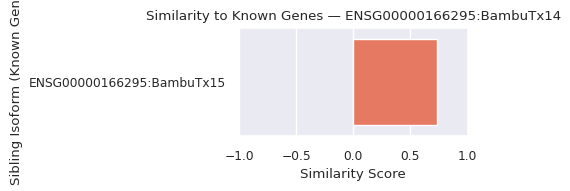

/tmp/ipykernel_3152855/595511113.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=subset_sorted, x="Similarity", y="SiblingIsoform", palette="Reds_r")


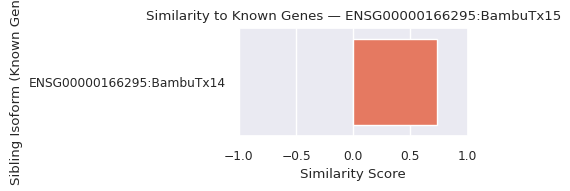

/tmp/ipykernel_3152855/595511113.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=subset_sorted, x="Similarity", y="SiblingIsoform", palette="Reds_r")


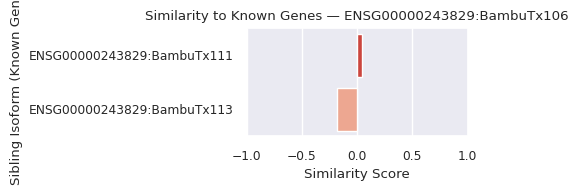

/tmp/ipykernel_3152855/595511113.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=subset_sorted, x="Similarity", y="SiblingIsoform", palette="Reds_r")


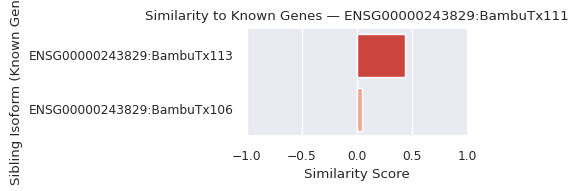

/tmp/ipykernel_3152855/595511113.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=subset_sorted, x="Similarity", y="SiblingIsoform", palette="Reds_r")


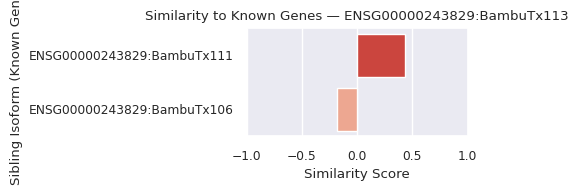

/tmp/ipykernel_3152855/595511113.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=subset_sorted, x="Similarity", y="SiblingIsoform", palette="Reds_r")


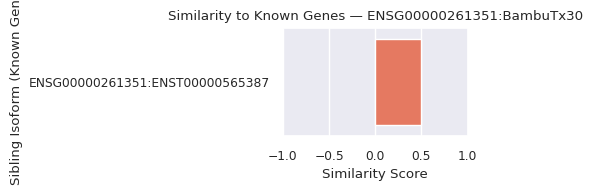

/tmp/ipykernel_3152855/595511113.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=subset_sorted, x="Similarity", y="SiblingIsoform", palette="Reds_r")


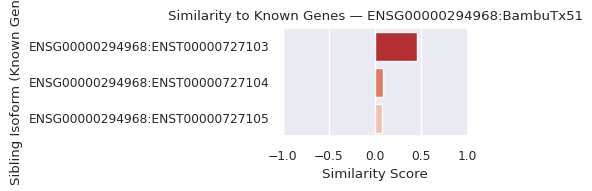

/tmp/ipykernel_3152855/595511113.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=subset_sorted, x="Similarity", y="SiblingIsoform", palette="Reds_r")


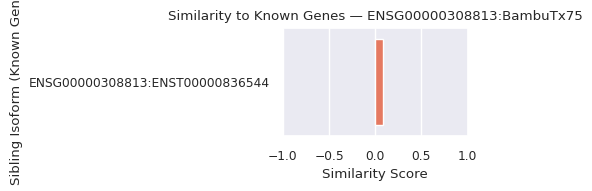

/tmp/ipykernel_3152855/595511113.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=subset_sorted, x="Similarity", y="SiblingIsoform", palette="Reds_r")


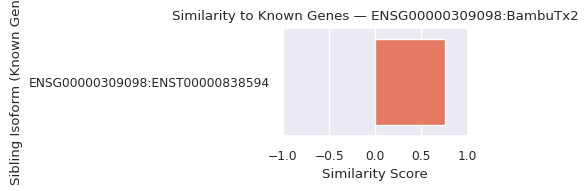

In [113]:
def is_known_gene(gene_id):
    # Return True if the gene ID contains 'ENSG' anywhere
    return "ENSG" in gene_id

# Filter known genes only
filtered_df = df_novel_isoform_similarities[
    df_novel_isoform_similarities["SiblingIsoform"].apply(is_known_gene)
]

# Plot for Novel Isoforms
for novel_isoform in filtered_df["NovelIsoform"].unique():
    subset = filtered_df[filtered_df["NovelIsoform"] == novel_isoform]
    subset_sorted = subset.sort_values("Similarity", ascending=False)
    plt.figure(figsize=(5, 2))
    sns.barplot(data=subset_sorted, x="Similarity", y="SiblingIsoform", palette="Reds_r")
    plt.xlabel("Similarity Score")
    plt.ylabel("Sibling Isoform (Known Genes)")
    plt.xlim(-1.0,1.0)
    plt.title(f"Similarity to Known Genes — {novel_isoform}")
    plt.tight_layout()
    plt.show()

/tmp/ipykernel_3152855/2190326297.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=subset_sorted, x="Similarity", y="SiblingIsoform", palette="Reds_r")


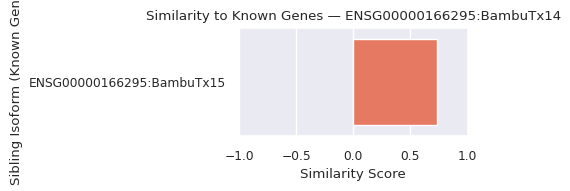

/tmp/ipykernel_3152855/2190326297.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=subset_sorted, x="Similarity", y="SiblingIsoform", palette="Reds_r")


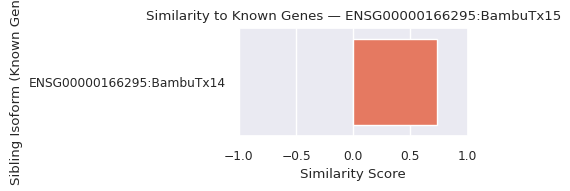

/tmp/ipykernel_3152855/2190326297.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=subset_sorted, x="Similarity", y="SiblingIsoform", palette="Reds_r")


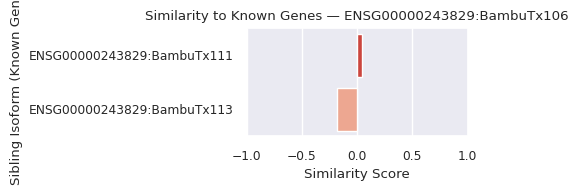

/tmp/ipykernel_3152855/2190326297.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=subset_sorted, x="Similarity", y="SiblingIsoform", palette="Reds_r")


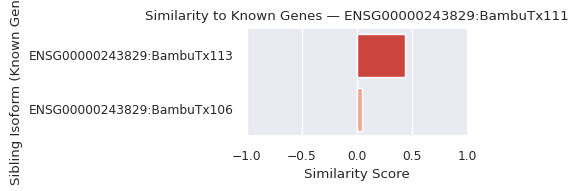

/tmp/ipykernel_3152855/2190326297.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=subset_sorted, x="Similarity", y="SiblingIsoform", palette="Reds_r")


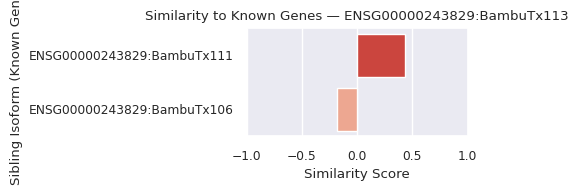

/tmp/ipykernel_3152855/2190326297.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=subset_sorted, x="Similarity", y="SiblingIsoform", palette="Reds_r")


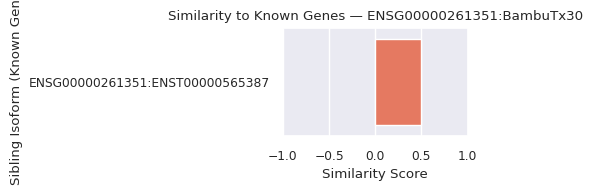

/tmp/ipykernel_3152855/2190326297.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=subset_sorted, x="Similarity", y="SiblingIsoform", palette="Reds_r")


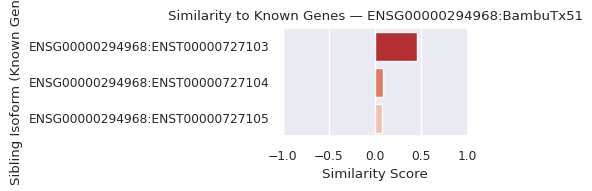

/tmp/ipykernel_3152855/2190326297.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=subset_sorted, x="Similarity", y="SiblingIsoform", palette="Reds_r")


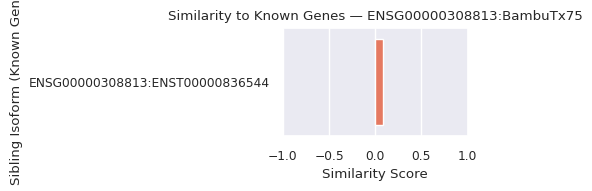

/tmp/ipykernel_3152855/2190326297.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=subset_sorted, x="Similarity", y="SiblingIsoform", palette="Reds_r")


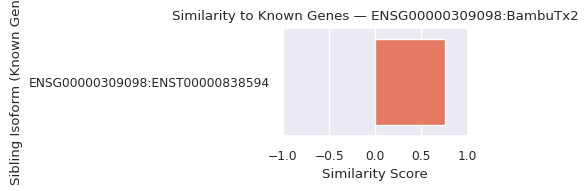

In [112]:
for novel_isoform in filtered_df["NovelIsoform"].unique():
    subset = filtered_df[filtered_df["NovelIsoform"] == novel_isoform]
    subset_sorted = subset.sort_values("Similarity", ascending=False)
    plt.figure(figsize=(5, 2))
    sns.barplot(data=subset_sorted, x="Similarity", y="SiblingIsoform", palette="Reds_r")
    plt.xlabel("Similarity Score")
    plt.ylabel("Sibling Isoform (Known Genes)")
    plt.xlim(-1.0,1.0)
    plt.title(f"Similarity to Known Genes — {novel_isoform}")
    plt.tight_layout()
    plt.show()    
    # Save plot
    safe_name = novel_isoform.replace(":", "_")
    plt.savefig(f"Intermediate_Files/Paper_Figs/SimilarityPlots/NovelIsoform_{safe_name}_similarity.pdf",
                dpi=600, transparent=True, bbox_inches="tight")
    plt.close()

In [89]:
similarity_results_novel_isoforms = []

for target_isoform in tqdm([g for g in expr_avg.index if "BambuTx" in g and g.startswith("ENSG")], desc="Calculating similarities for Novel Isoforms"):
    ensg_id = target_isoform.split(":")[0]
    siblings = [g for g in expr_avg.index if g.startswith(ensg_id) and g != target_isoform]
    
    if len(siblings) < 1:
        continue
    
    target_expr = expr_avg.loc[target_isoform]
    sibling_expr = expr_avg.loc[siblings]
    corr = sibling_expr.corrwith(target_expr, axis=1)
    
    for gene, score in corr.items():
        similarity_results_novel_isoforms.append({
            "NovelIsoform": target_isoform,
            "SiblingIsoform": gene,
            "Similarity": score
        })

df_novel_isoform_similarities = pd.DataFrame(similarity_results_novel_isoforms)

Calculating similarities for Novel Isoforms: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 44/44 [00:00<00:00, 99.81it/s]


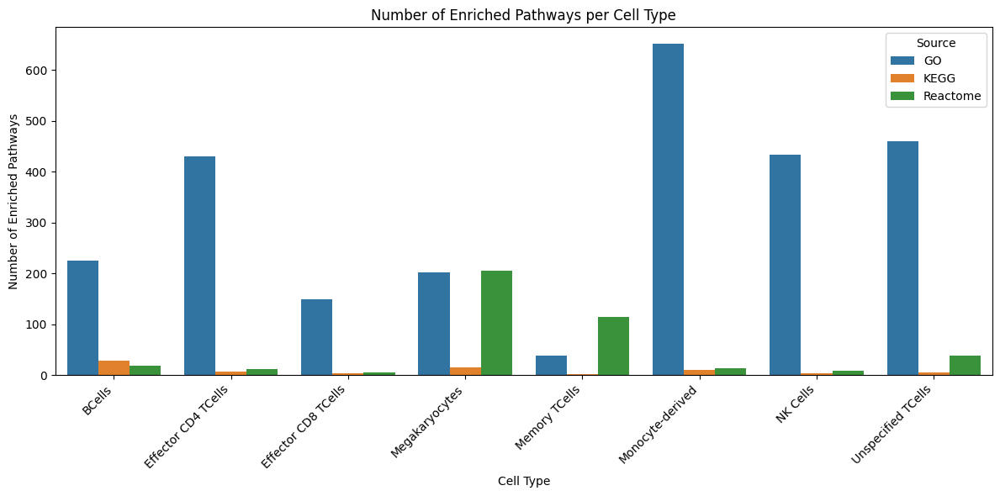

In [5]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the results
df_results = pd.read_csv("Intermediate_Files/CellType_Pathway_Enrichment_gProfiler.tsv", sep="\t")

# Filter to only Reactome, KEGG, and GO:BP
df_results = df_results[df_results["Source"].isin(["REAC", "KEGG", "GO:BP"])]

# Rename REAC to Reactome
df_results["Source"] = df_results["Source"].replace({
    "REAC": "Reactome",
    "GO:BP": "GO"  # collapse to "GO" to match your figure if needed
})

# Group by Cell Type and Source
summary = df_results.groupby(["Cell_Type", "Source"]).size().reset_index(name="Count")

# Plot
plt.figure(figsize=(12, 6))
sns.barplot(data=summary, x="Cell_Type", y="Count", hue="Source")
plt.title("Number of Enriched Pathways per Cell Type")
plt.xlabel("Cell Type")
plt.ylabel("Number of Enriched Pathways")
plt.xticks(rotation=45, ha='right')
plt.legend(title="Source")
plt.tight_layout()

plt.savefig("Intermediate_Files/Paper_Figs/enriched_pathways_per_cell_type.pdf",
            dpi=600, transparent=True, bbox_inches="tight")
plt.show()

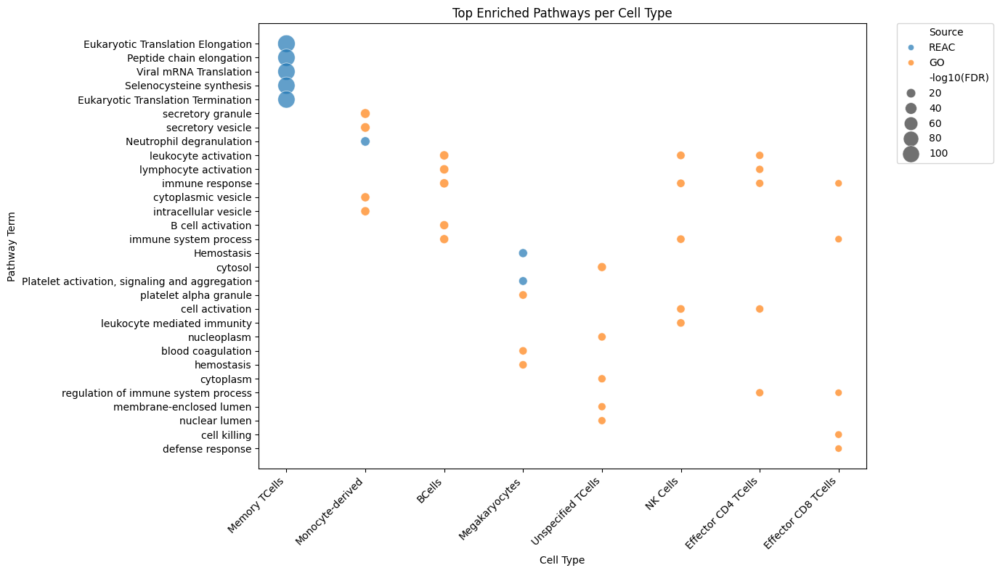

In [8]:
df_results["-log10(FDR)"] = -np.log10(df_results["FDR"].replace(0, 1e-300))

# Take top 5 pathways per cell type for readability
top_terms = df_results.sort_values("FDR").groupby("Cell_Type").head(5)

plt.figure(figsize=(14, 8))
sns.scatterplot(data=top_terms, x="Cell_Type", y="Term", size="-log10(FDR)", hue="Source",
                sizes=(50, 300), alpha=0.7)
plt.xlabel("Cell Type")
plt.ylabel("Pathway Term")
plt.title("Top Enriched Pathways per Cell Type")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

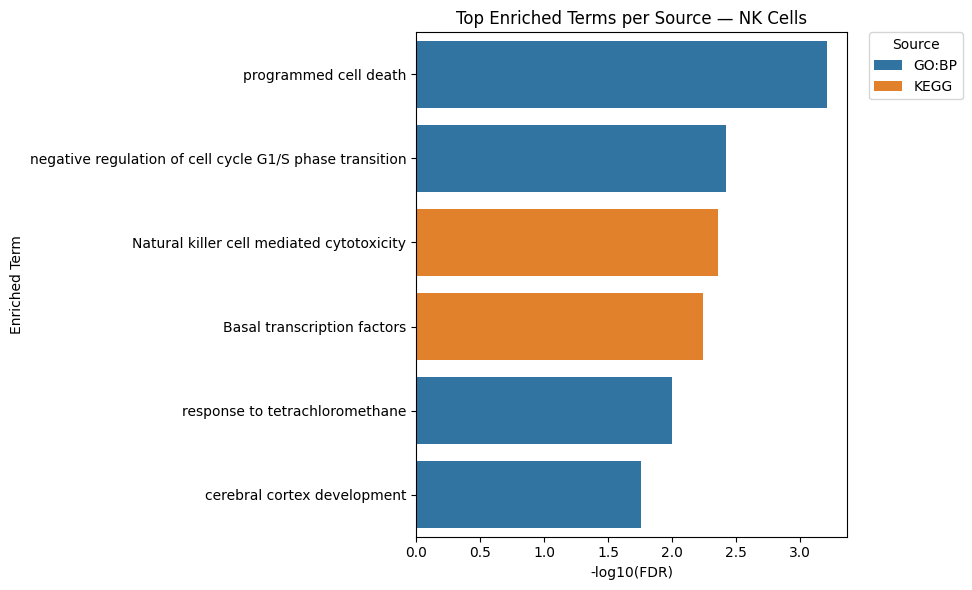

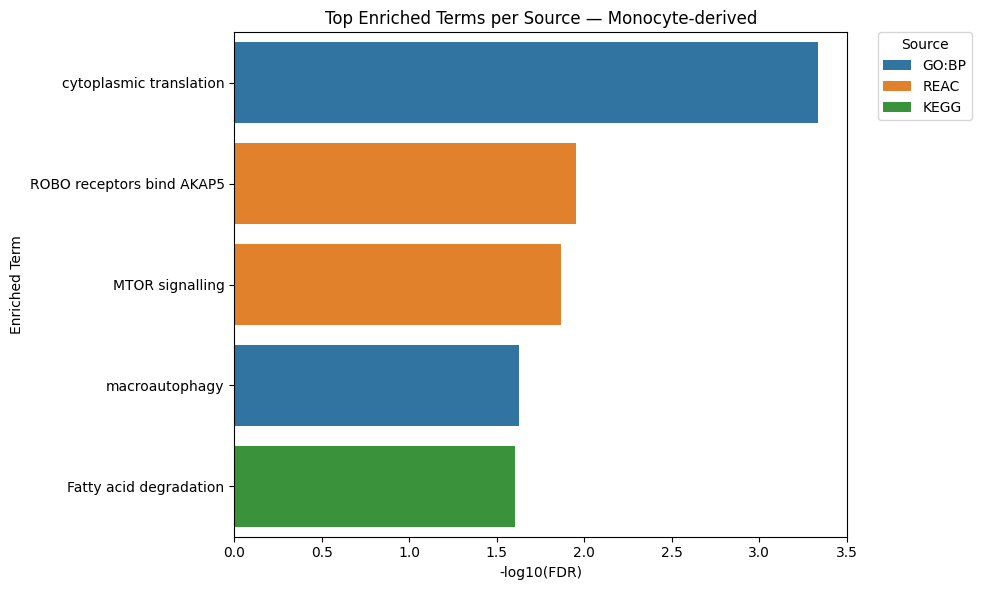

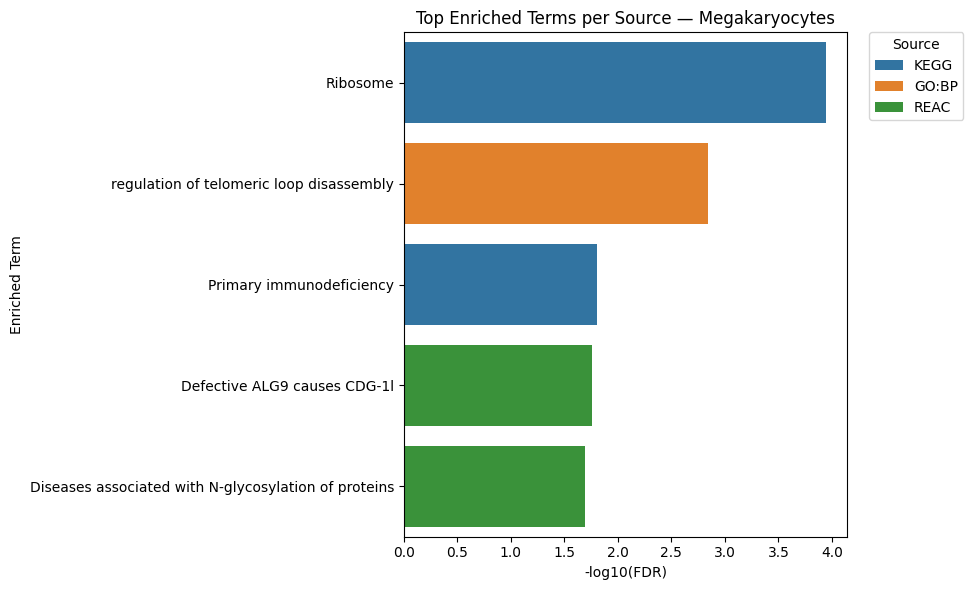

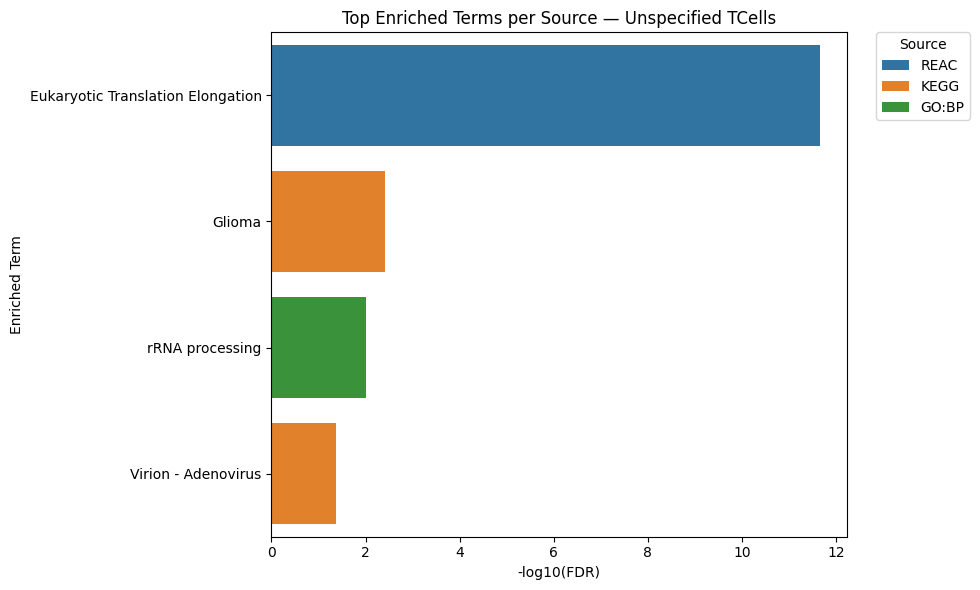

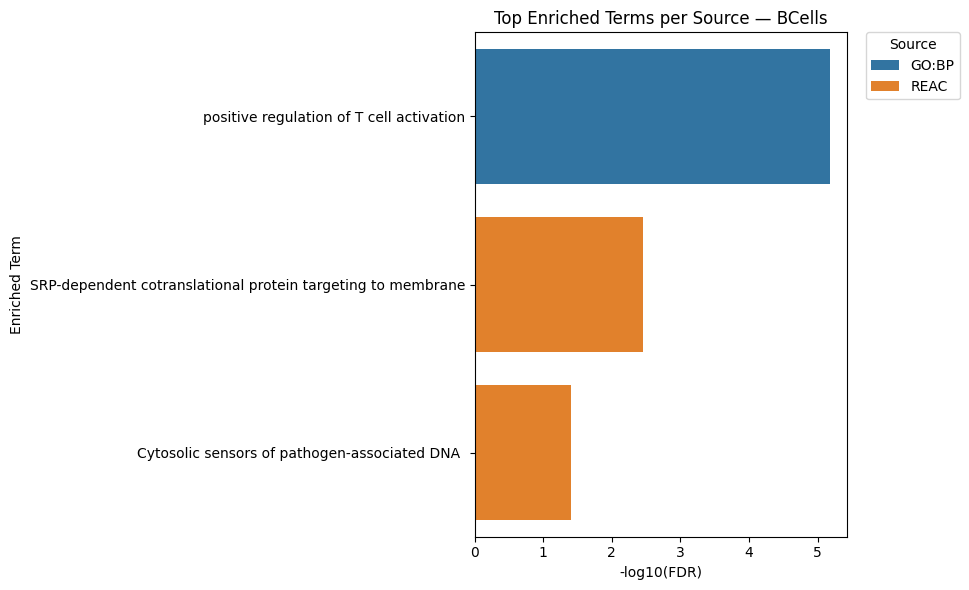

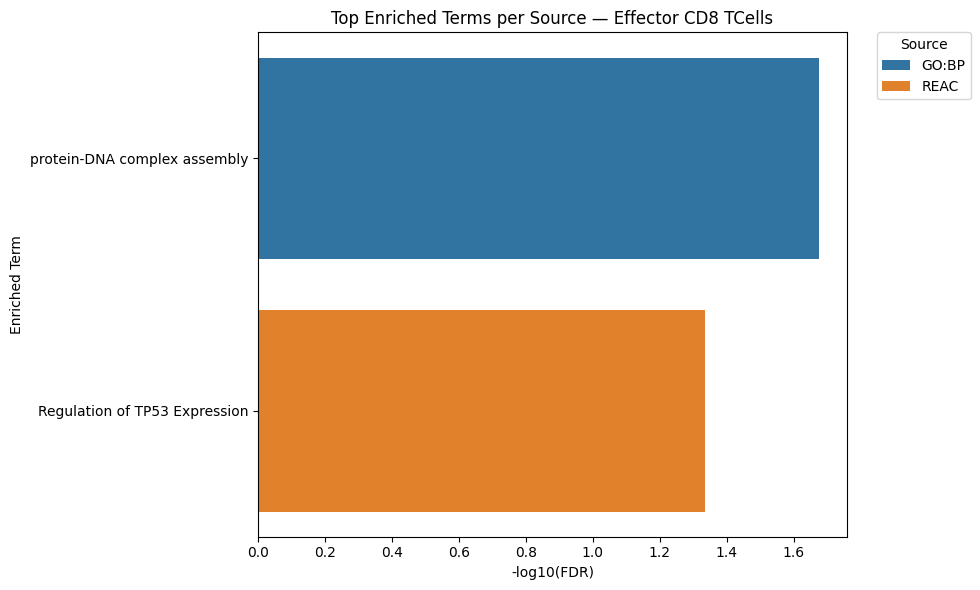

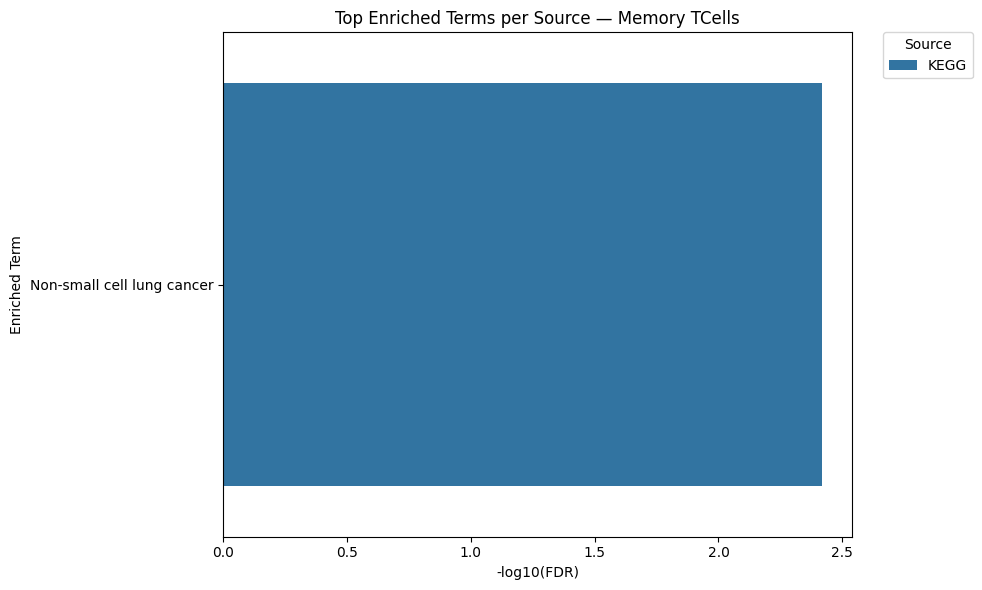

In [6]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Load gProfiler enrichment results
df_results = pd.read_csv("Intermediate_Files/Bambu_TopSimilar_Gene_Enrichment_gProfiler.tsv", sep="\t")

# Filter to only Reactome, KEGG, and GO:BP
df_results = df_results[df_results["Source"].isin(["REAC", "KEGG", "GO:BP"])]

# Calculate -log10(FDR) column
df_results["-log10(FDR)"] = -np.log10(df_results["FDR"].replace(0, 1e-300))

# Loop through unique cell types
for cell_type in df_results["Cell_Type"].unique():
    subset = df_results[df_results["Cell_Type"] == cell_type]

    # Select top 5 terms per source (GO, KEGG, Reactome)
    top_terms = (
        subset.sort_values("FDR")
        .groupby("Source", group_keys=False)
        .head(5)
    )

    # Order terms by ascending FDR (smaller = more significant)
    term_order = top_terms.sort_values("FDR")["Term"].unique()

    plt.figure(figsize=(10, 6))
    sns.barplot(
        data=top_terms,
        y="Term",
        x="-log10(FDR)",
        hue="Source",
        order=term_order
    )
    plt.xlabel("-log10(FDR)")
    plt.ylabel("Enriched Term")
    plt.title(f"Top Enriched Terms per Source — {cell_type}")
    plt.legend(title="Source", bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
    plt.tight_layout()
    plt.show()

/tmp/ipykernel_3042557/2183361728.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered["Source"] = df_filtered["Source"].replace({"REAC": "Reactome"})


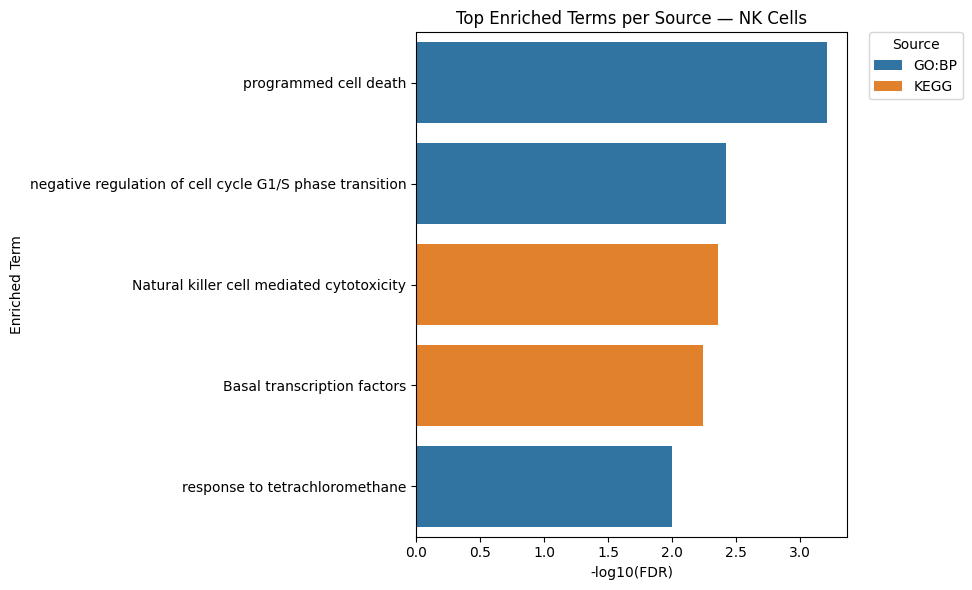

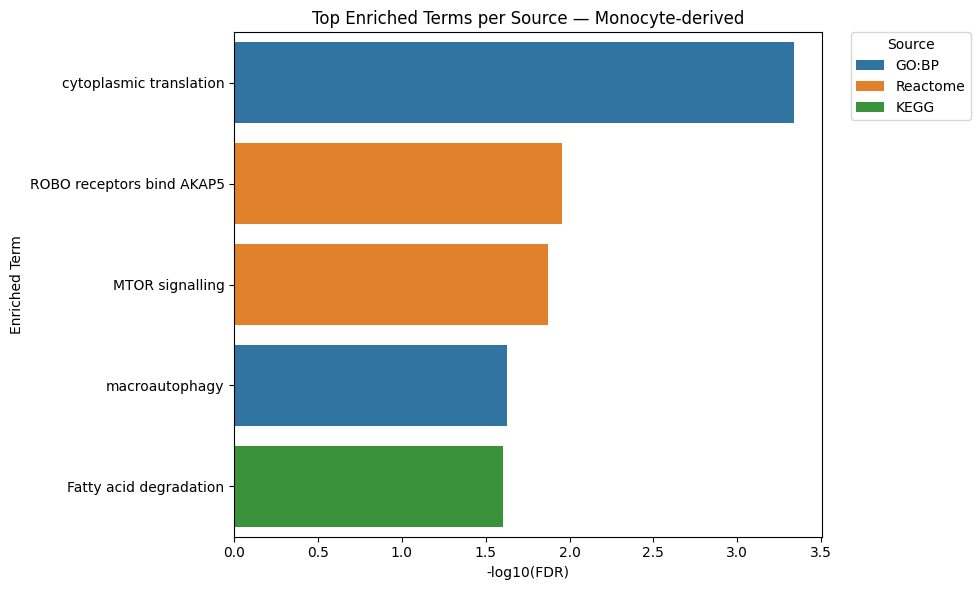

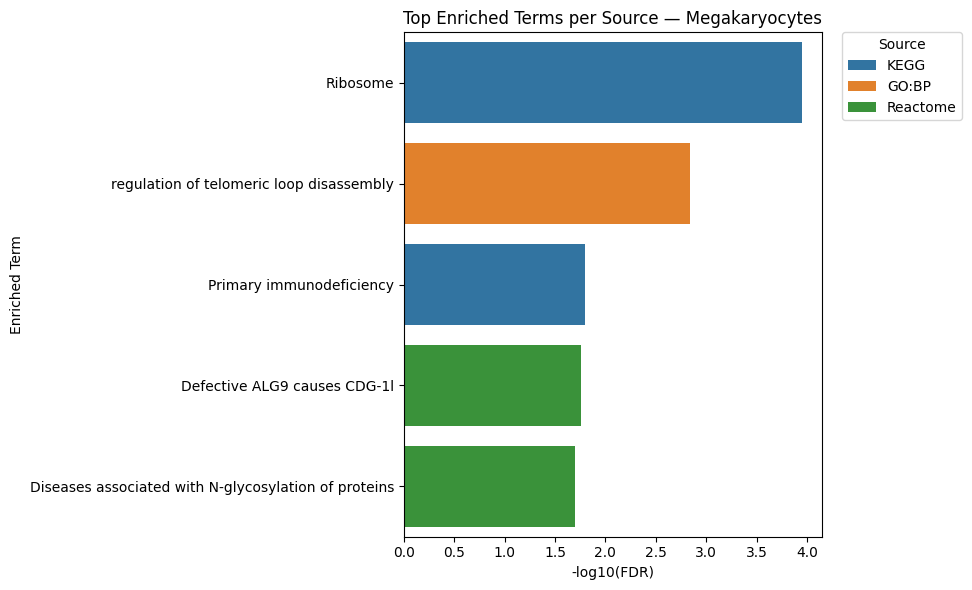

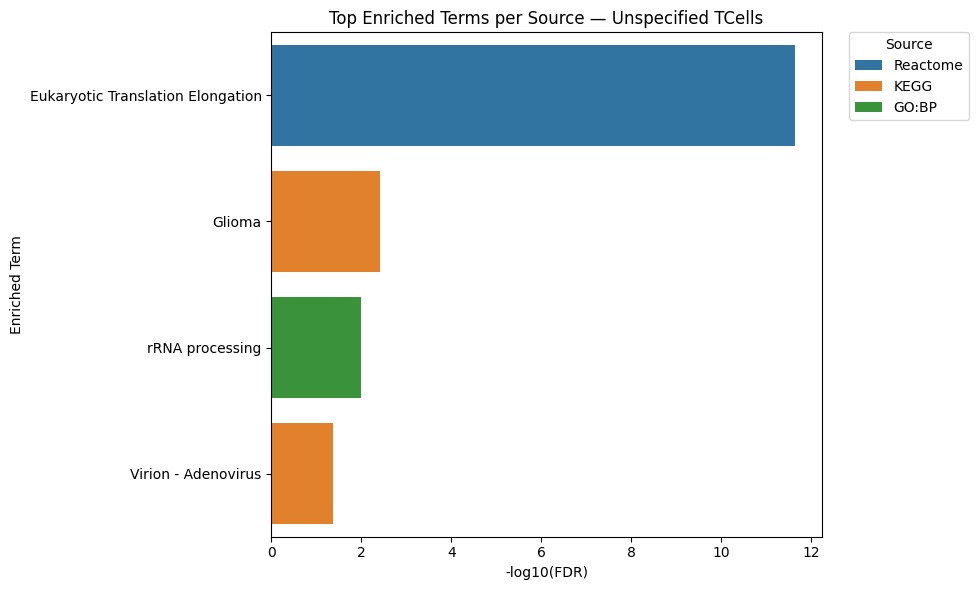

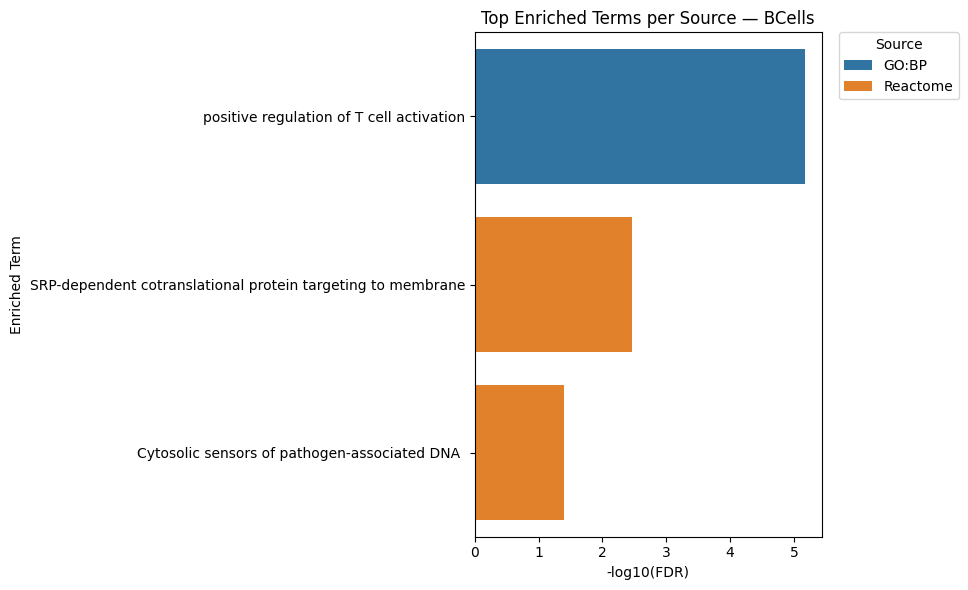

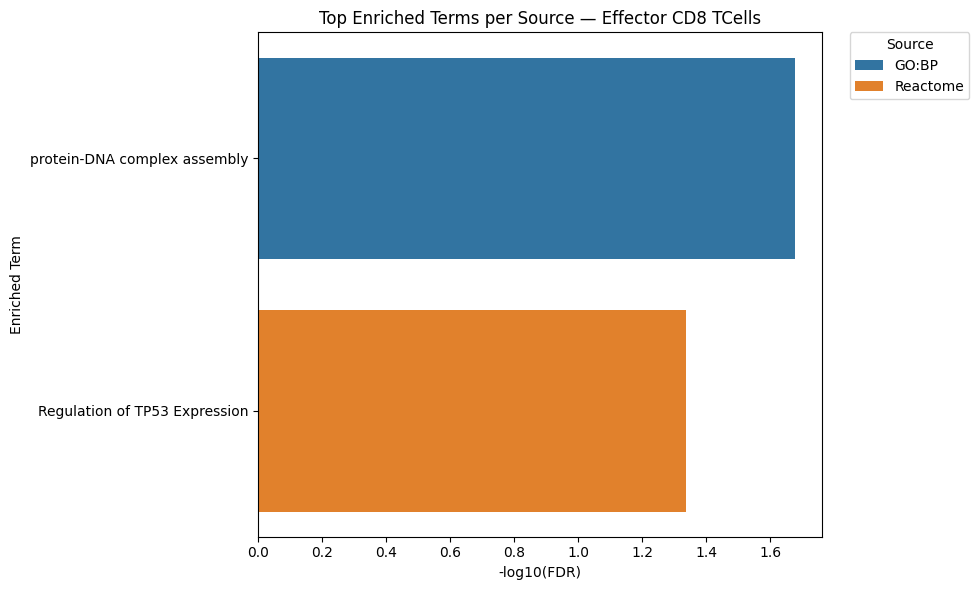

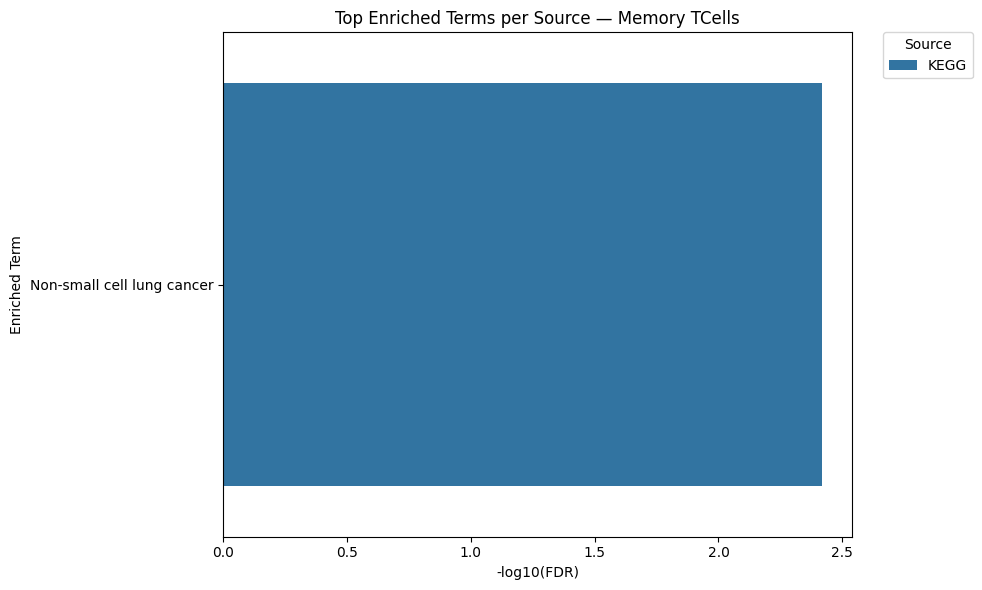

In [15]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Load gProfiler enrichment results
df_results = pd.read_csv("Intermediate_Files/Bambu_TopSimilar_Gene_Enrichment_gProfiler.tsv", sep="\t")

# Calculate -log10(FDR) column
df_results["-log10(FDR)"] = -np.log10(df_results["FDR"].replace(0, 1e-300))

# Filter to only GO:BP, KEGG, and Reactome
df_filtered = df_results[df_results["Source"].isin(["GO:BP", "KEGG", "REAC"])]

# Optional: rename REAC to Reactome for clarity
df_filtered["Source"] = df_filtered["Source"].replace({"REAC": "Reactome"})

# Loop through unique cell types
for cell_type in df_filtered["Cell_Type"].unique():
    subset = df_filtered[df_filtered["Cell_Type"] == cell_type]

    # Select top 5 terms per source (GO:BP, KEGG, Reactome)
    top_terms = (
        subset.sort_values("FDR")
        .groupby("Source", group_keys=False)
        .head(3)
    )

    # Order terms by ascending FDR (smaller = more significant)
    term_order = top_terms.sort_values("FDR")["Term"].unique()

    plt.figure(figsize=(10, 6))
    sns.barplot(
        data=top_terms,
        y="Term",
        x="-log10(FDR)",
        hue="Source",
        order=term_order
    )
    plt.xlabel("-log10(FDR)")
    plt.ylabel("Enriched Term")
    plt.title(f"Top Enriched Terms per Source — {cell_type}")
    plt.legend(title="Source", bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
    plt.tight_layout()
    plt.show()

/tmp/ipykernel_3042557/3500224454.py:8: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(


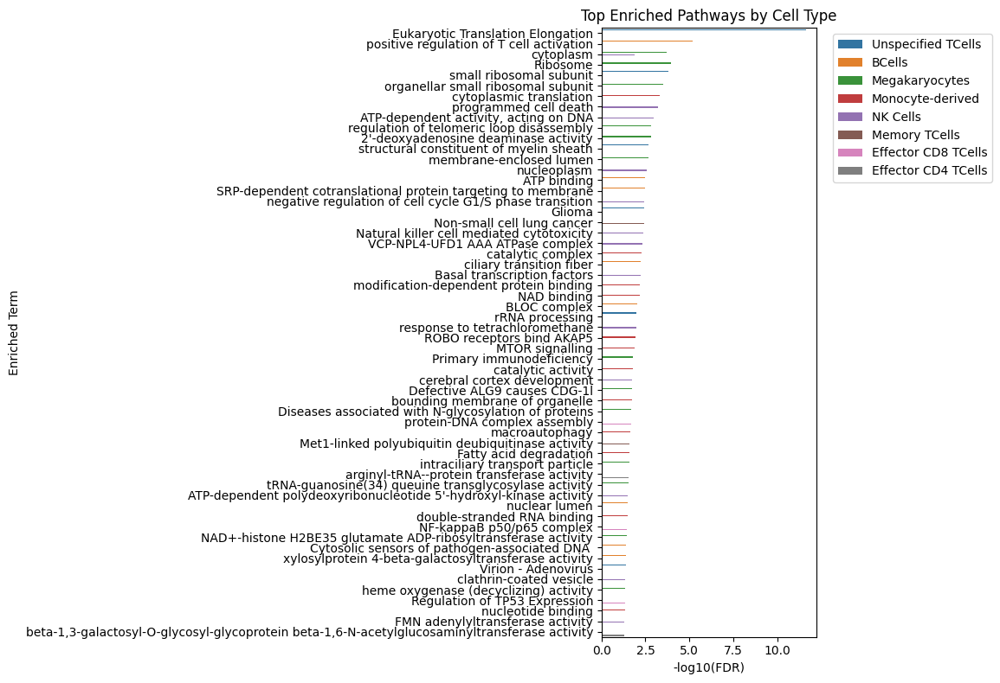

In [12]:
import seaborn as sns
import matplotlib.pyplot as plt

df_results["-log10(FDR)"] = -np.log10(df_results["FDR"].replace(0, 1e-300))
top_terms = df_results.sort_values("FDR").groupby(["Cell_Type", "Source"]).head(5)

plt.figure(figsize=(12, 8))
sns.barplot(
    data=top_terms,
    x="-log10(FDR)",
    y="Term",
    hue="Cell_Type",
    ci=None
)
plt.xlabel("-log10(FDR)")
plt.ylabel("Enriched Term")
plt.title("Top Enriched Pathways by Cell Type")
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()

In [105]:
import pandas as pd
import numpy as np
import requests
import re
from tqdm import tqdm

# Step 1: Compute expression matrix (genes x cell types)
X = adata_i_filtered.X.toarray() if hasattr(adata_i_filtered.X, "toarray") else adata_i_filtered.X

expr_df = pd.DataFrame(X, 
                       columns=adata_i_filtered.var_names,
                       index=adata_i_filtered.obs["gen_cell_type_reannotated"])
expr_avg = expr_df.groupby(expr_df.index, observed=False).mean().T  # genes x cell types

# Step 2: Z-score across cell types
z_expr = expr_avg.sub(expr_avg.mean(axis=1), axis=0).div(expr_avg.std(axis=1), axis=0).fillna(0)

# Step 3: Filter to query genes
query_genes = z_expr.index[z_expr.index.str.startswith("BambuGene") | z_expr.index.str.contains("BambuTx")]

# Step 4: Spearman correlation for similarity
corr = z_expr.T.corr(method="spearman")  # genes x genes
top_similar_genes = {}

for gene in query_genes:
    if gene not in corr.index:
        continue
    similar_genes = corr.loc[gene].drop(labels=[gene], errors='ignore').sort_values(ascending=False)
    standard_genes = [g for g in similar_genes.index if not g.startswith("BambuGene") and "BambuTx" not in g]
    top_similar_genes[gene] = standard_genes[:30]

# Step 5: Extract gene symbol
def extract_symbol(label):
    """Extract the gene symbol from GeneSymbol:ENSG:ENST or GeneSymbol format."""
    symbol = label.split(":")[0]
    return symbol if re.match(r"^[A-Z][A-Z0-9\-]*$", symbol) else None

# Step 6: Enrichment using g:Profiler (GO + KEGG + Reactome)
def query_gprofiler(gene_list):
    url = "https://biit.cs.ut.ee/gprofiler/api/gost/profile/"
    headers = {"Content-Type": "application/json"}
    payload = {
        "organism": "hsapiens",
        "query": gene_list,
        "sources": ["GO:BP", "GO:MF", "GO:CC", "KEGG", "REAC"],
        "user_threshold": 0.05,
        "significance_threshold_method": "fdr"
    }
    try:
        response = requests.post(url, headers=headers, json=payload)
        response.raise_for_status()
        return response.json()["result"]
    except Exception as e:
        print(f"⚠️ g:Profiler failed: {e}")
        return []

# Step 7: Run enrichment
results = []

for query_gene, neighbors in tqdm(top_similar_genes.items()):
    gene_list = [extract_symbol(g) for g in neighbors if extract_symbol(g)]
    if len(gene_list) < 5:
        print(f"⚠️ Skipping {query_gene}: <5 valid gene symbols.")
        continue

    enriched = query_gprofiler(gene_list)
    if enriched:
        top = enriched[0]
        results.append({
            "Query": query_gene,
            "Source": top["source"],
            "Term": top["name"],
            "P-value": top["p_value"],
            "FDR": top.get("p_value_fdr", top.get("p_value")),
            "Genes": ",".join(top.get("intersection", [])) if "intersection" in top else ""
        })


# Step 8: Save results
df_results = pd.DataFrame(results)
df_results["Gene_Type"] = df_results["Query"].apply(lambda x: "Novel" if "Bambu" in x else "Known")
# Optional: Define the dominant cell type where each query gene is most expressed
max_celltype = z_expr.loc[df_results["Query"].unique()].idxmax(axis=1)  # most enriched cell type per gene
df_results["Cell_Type"] = df_results["Query"].map(max_celltype)

df_results.to_csv("Intermediate_Files/Bambu_TopSimilar_Gene_Enrichment_gProfiler.tsv", sep="\t", index=False)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 77/77 [00:42<00:00,  1.80it/s]


In [106]:
df_results.head(10)

,Query,Source,Term,P-value,FDR,Genes,Gene_Type,Cell_Type
0,BambuGene1277:BambuTx5,KEGG,Natural killer cell mediated cytotoxicity,0.004368,0.004368,,Novel,NK Cells
1,BambuGene13114:BambuTx22,REAC,ROBO receptors bind AKAP5,0.011100,0.011100,,Novel,Monocyte-derived
2,BambuGene14461:BambuTx25,GO:BP,regulation of telomeric loop disassembly,0.001446,0.001446,,Novel,Megakaryocytes
3,BambuGene15305:BambuTx26,GO:MF,heme oxygenase (decyclizing) activity,0.045187,0.045187,,Novel,Megakaryocytes
4,BambuGene17689:BambuTx29,GO:BP,cerebral cortex development,0.017391,0.017391,,Novel,NK Cells
5,BambuGene19:BambuTx109,GO:MF,double-stranded RNA binding,0.033661,0.033661,,Novel,Monocyte-derived
6,BambuGene1995:BambuTx7,GO:CC,cytoplasm,0.013585,0.013585,,Novel,NK Cells
7,BambuGene20530:BambuTx33,GO:MF,"ATP-dependent activity, acting on DNA",0.001066,0.001066,,Novel,NK Cells
8,BambuGene20676:BambuTx103,GO:CC,clathrin-coated vesicle,0.044962,0.044962,,Novel,NK Cells
9,BambuGene24178:BambuTx39,GO:MF,catalytic activity,0.016438,0.016438,,Novel,Monocyte-derived


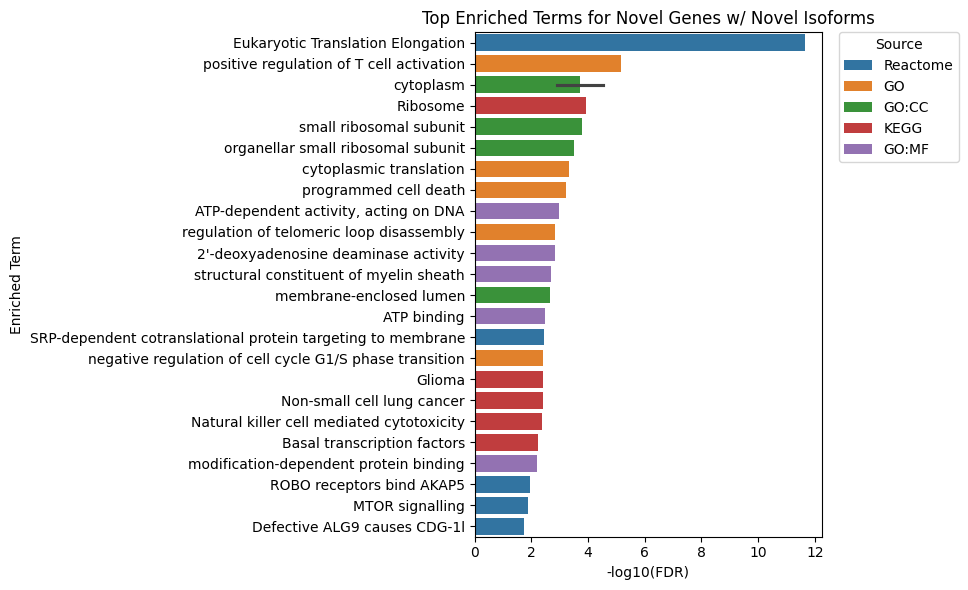

/tmp/ipykernel_3042557/2601007343.py:40: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Source", bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)


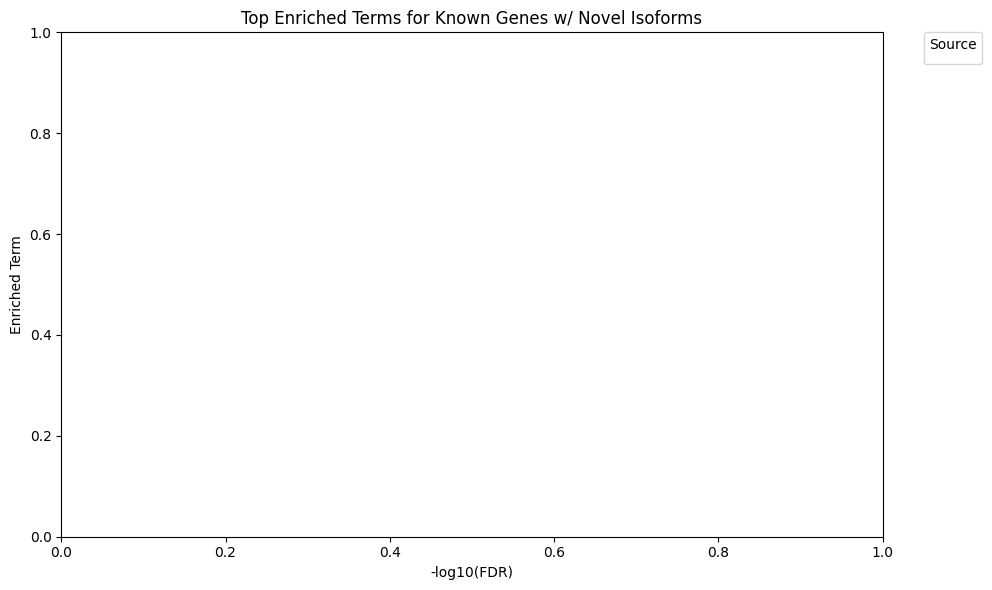

In [47]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Load results
df_results = pd.read_csv("Intermediate_Files/Bambu_TopSimilar_Gene_Enrichment_gProfiler.tsv", sep="\t")

# Calculate -log10(FDR) safely
df_results["-log10(FDR)"] = -np.log10(df_results["FDR"].replace(0, 1e-300))

# Replace source labels for consistency (optional)
df_results["Source"] = df_results["Source"].replace({"GO:BP": "GO", "REAC": "Reactome"})

# Loop through gene types
for gene_type in ["Novel", "Known"]:
    subset = df_results[df_results["Gene_Type"] == gene_type]

    # Select top 5 terms per source
    top_terms = (
        subset.sort_values("FDR")
        .groupby("Source", group_keys=False)
        .head(5)
    )

    # Order terms by ascending FDR (smallest = most significant)
    term_order = top_terms.sort_values("FDR")["Term"].unique()

    plt.figure(figsize=(10, 6))
    sns.barplot(
        data=top_terms,
        y="Term",
        x="-log10(FDR)",
        hue="Source",
        order=term_order
    )
    plt.xlabel("-log10(FDR)")
    plt.ylabel("Enriched Term")
    plt.title(f"Top Enriched Terms for {gene_type} Genes w/ Novel Isoforms")
    plt.legend(title="Source", bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
    plt.tight_layout()
    plt.show()

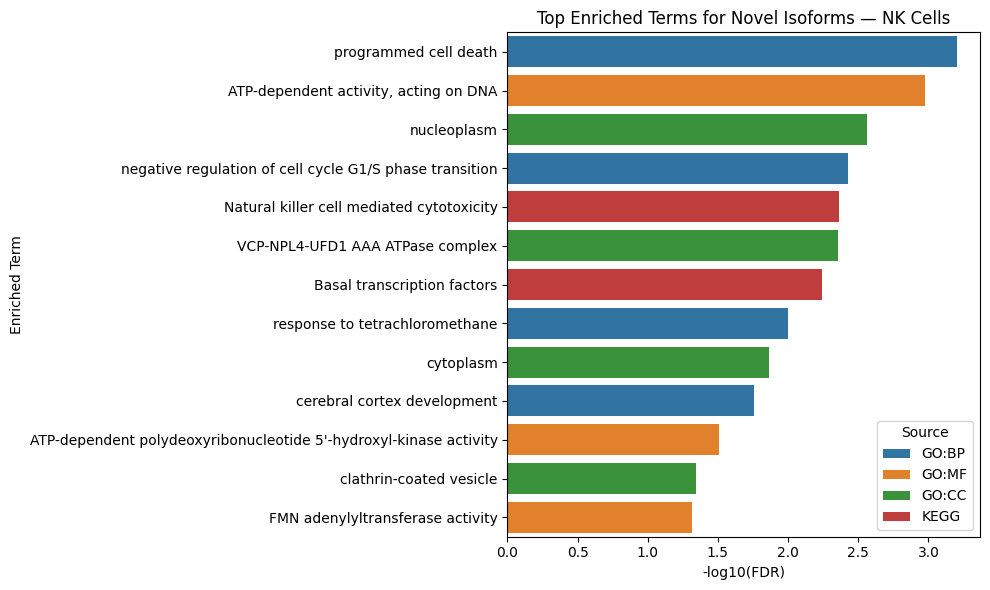

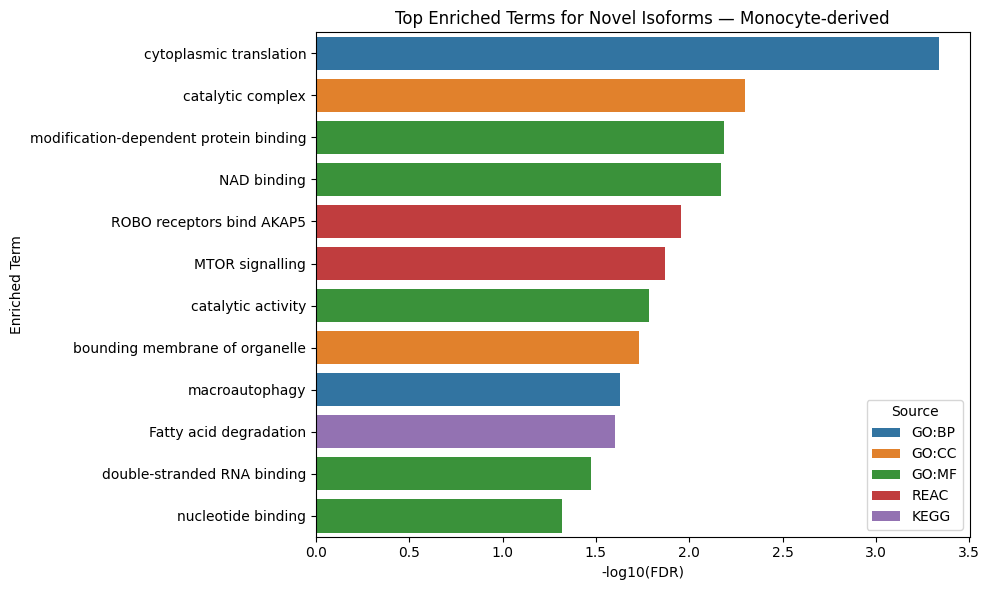

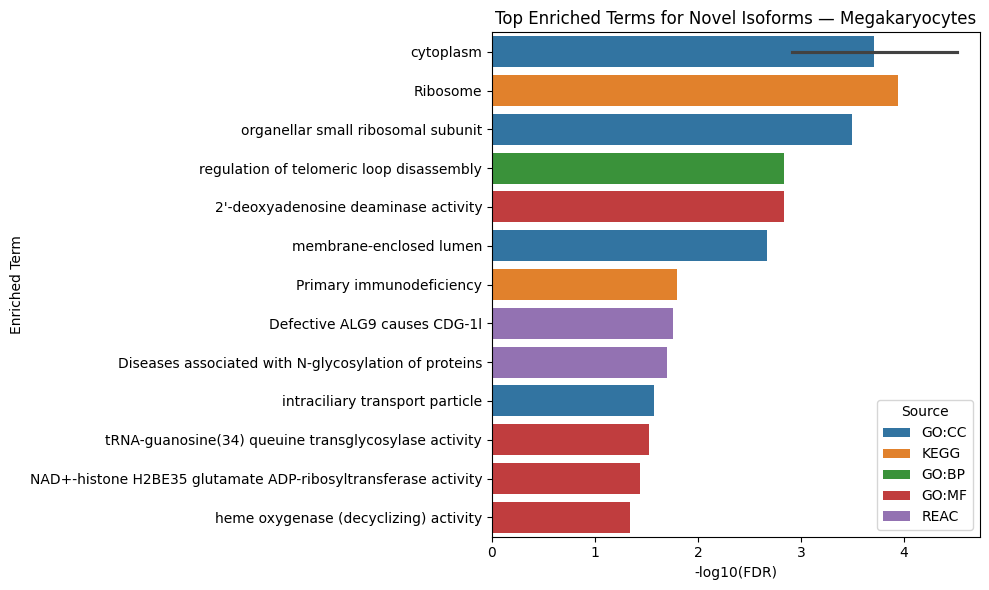

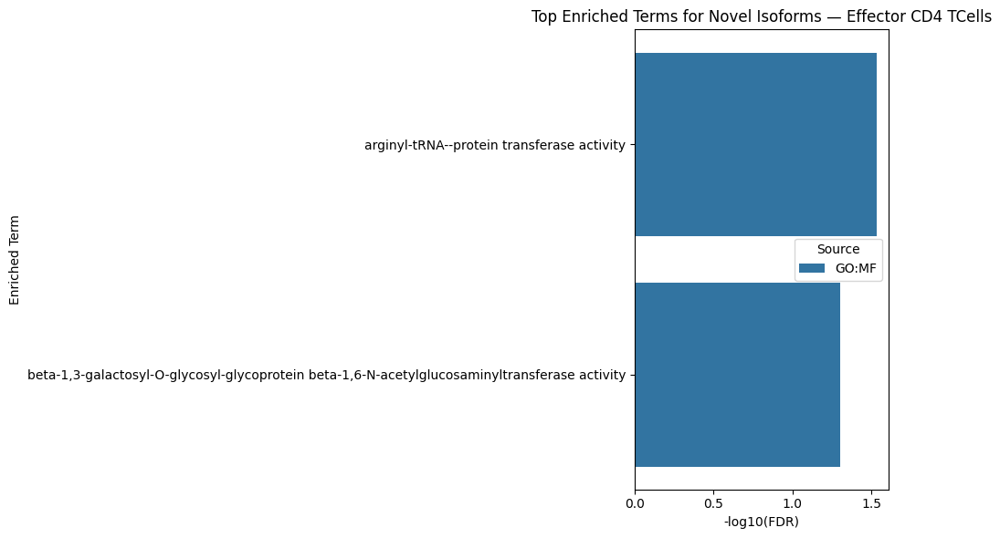

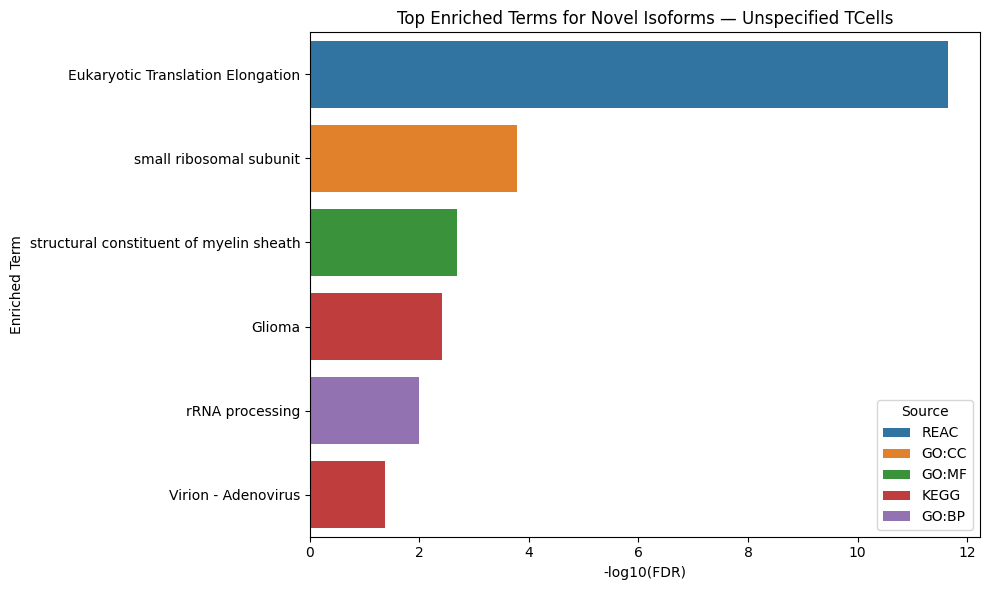

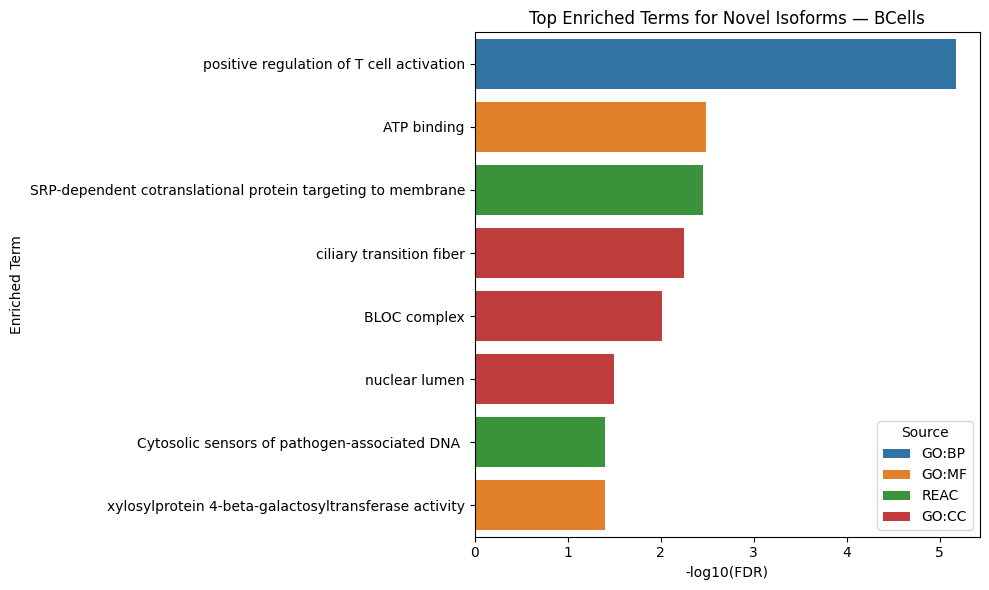

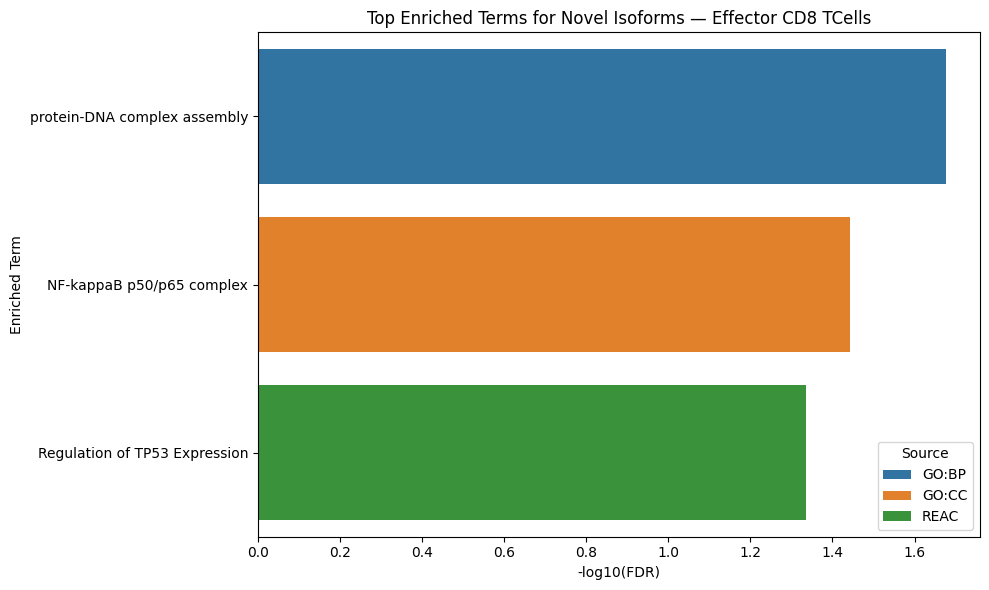

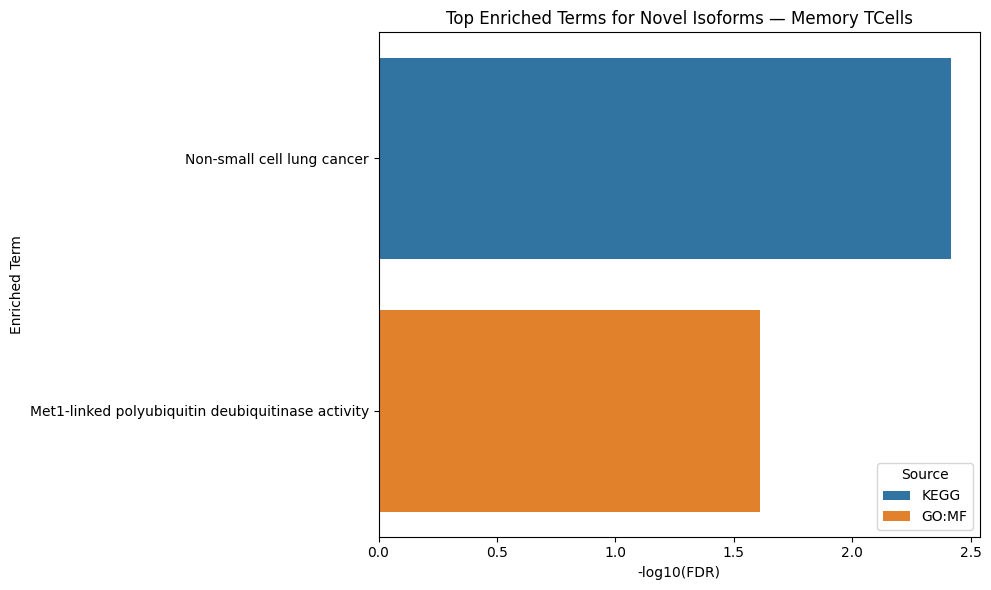

In [3]:
# Load gProfiler enrichment results
df_results = pd.read_csv("Intermediate_Files/Bambu_TopSimilar_Gene_Enrichment_gProfiler.tsv", sep="\t")

import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Calculate -log10(FDR) column
df_results["-log10(FDR)"] = -np.log10(df_results["FDR"].replace(0, 1e-300))

# Loop through unique cell types
for cell_type in df_results["Cell_Type"].unique():
    subset = df_results[df_results["Cell_Type"] == cell_type]

    # Select top 5 terms per source (GO:BP, KEGG, REAC, etc.)
    top_terms = subset.sort_values("FDR").groupby("Source").head(5)

    # Plot
    plt.figure(figsize=(10, 6))
    sns.barplot(
        data=top_terms, 
        y="Term", 
        x="-log10(FDR)", 
        hue="Source",
        order=top_terms.sort_values("FDR")["Term"]
    )
    plt.xlabel("-log10(FDR)")
    plt.ylabel("Enriched Term")
    plt.title(f"Top Enriched Terms for Novel Isoforms — {cell_type}")
    plt.tight_layout()
    plt.show()

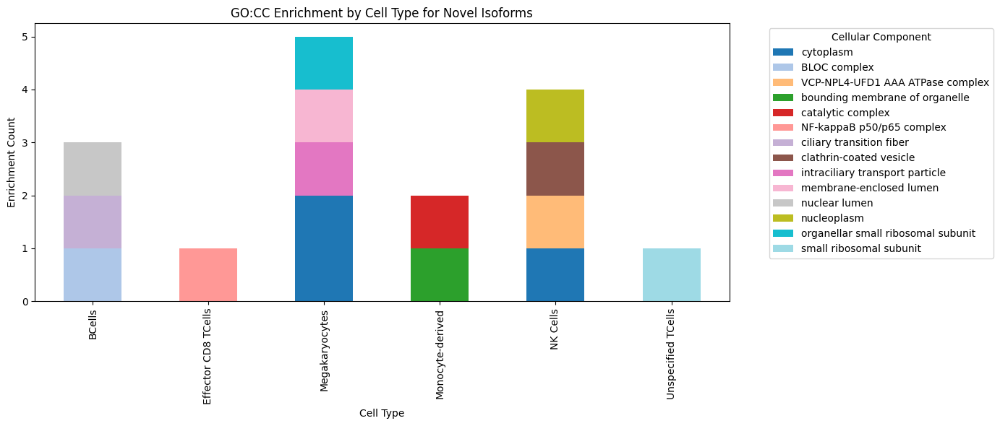

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load gProfiler enrichment results
df = pd.read_csv("Intermediate_Files/Bambu_TopSimilar_Gene_Enrichment_gProfiler.tsv", sep="\t")

# Filter to GO:CC only
go_cc = df[df["Source"] == "GO:CC"].copy()

# Clean term names for grouping if needed
go_cc["Term"] = go_cc["Term"].str.strip()

# Count number of times each GO:CC term appears per cell type
cc_counts = (
    go_cc.groupby(["Cell_Type", "Term"])
    .size()
    .unstack(fill_value=0)
)

# Sort terms by total abundance
term_order = cc_counts.sum(axis=0).sort_values(ascending=False).index
cc_counts = cc_counts[term_order]

# Plot stacked bar chart
ax = cc_counts.plot(kind="bar", stacked=True, figsize=(14, 6), colormap="tab20")
ax.set_title("GO:CC Enrichment by Cell Type for Novel Isoforms")
ax.set_ylabel("Enrichment Count")
ax.set_xlabel("Cell Type")
ax.legend(title="Cellular Component", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()

In [88]:
isoform_to_term = df_results.groupby("Query")["Term"].apply(list)

In [89]:
summary = (
    df_results.groupby("GO_Cluster")
    .agg(
        Top_Terms=("Term", lambda x: ", ".join(x.value_counts().head(3).index)),
        Num_Unique_Terms=("Term", "nunique"),
        Num_Isoforms=("Query", "nunique")
    )
    .reset_index()
)

print(summary)

KeyError: 'GO_Cluster'

In [114]:
print(df["Source"].unique())

['KEGG' 'REAC' 'GO:BP' 'GO:MF' 'GO:CC']


In [113]:
print(df["Term"].head(20))

0             Natural killer cell mediated cytotoxicity
1                             ROBO receptors bind AKAP5
2              regulation of telomeric loop disassembly
3                 heme oxygenase (decyclizing) activity
4                           cerebral cortex development
5                           double-stranded RNA binding
6                                             cytoplasm
7                 ATP-dependent activity, acting on DNA
8                               clathrin-coated vesicle
9                                    catalytic activity
10    beta-1,3-galactosyl-O-glycosyl-glycoprotein be...
11                                          NAD binding
12    tRNA-guanosine(34) queuine transglycosylase ac...
13                               Fatty acid degradation
14              structural constituent of myelin sheath
15    ATP-dependent polydeoxyribonucleotide 5'-hydro...
16                             Primary immunodeficiency
17                     FMN adenylyltransferase a

In [115]:
import pandas as pd
from goatools.obo_parser import GODag

# Load your enrichment results
df = pd.read_csv("Intermediate_Files/Bambu_TopSimilar_Gene_Enrichment_gProfiler.tsv", sep="\t")

# Load GO ontology
go_dag = GODag("go-basic.obo")  # assumes you already have this file

# Build name-to-id dictionary (lowercased for robustness)
name_to_id = {term.name.lower(): go_id for go_id, term in go_dag.items()}

# Map term names to GO IDs (if possible)
df["GO_ID"] = df["Term"].str.lower().map(name_to_id)

# Drop terms that could not be mapped
df_mapped = df.dropna(subset=["GO_ID"])

# Check mapping success
print(f"Mapped {df_mapped.shape[0]} of {df.shape[0]} terms.")
print(df_mapped[["Term", "GO_ID"]].drop_duplicates().head(10))

go-basic.obo: fmt(1.2) rel(2025-03-16) 43,544 Terms
Mapped 47 of 60 terms.
                                                 Term       GO_ID
0           Natural killer cell mediated cytotoxicity  GO:0042267
2            regulation of telomeric loop disassembly  GO:1904533
3               heme oxygenase (decyclizing) activity  GO:0004392
4                         cerebral cortex development  GO:0021987
5                         double-stranded RNA binding  GO:0003725
6                                           cytoplasm  GO:0005737
7               ATP-dependent activity, acting on DNA  GO:0004011
8                             clathrin-coated vesicle  GO:0030136
9                                  catalytic activity  GO:0003824
10  beta-1,3-galactosyl-O-glycosyl-glycoprotein be...  GO:0003829


/opt/conda/lib/python3.10/site-packages/seaborn/axisgrid.py:123: UserWarning: Tight layout not applied. tight_layout cannot make Axes width small enough to accommodate all Axes decorations
  self._figure.tight_layout(*args, **kwargs)


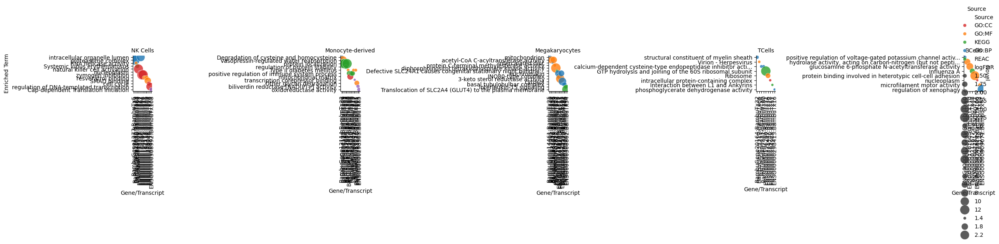

In [92]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Load your results
df = pd.read_csv("Intermediate_Files/Bambu_TopSimilar_Gene_Enrichment_gProfiler.tsv", sep="\t")

# Preprocess: compute -log10(FDR) and drop any missing values
df["logFDR"] = -np.log10(df["FDR"].replace(0, 1e-300))
df = df.dropna(subset=["logFDR", "Query", "Term", "Gene_Type", "Cell_Type", "Source"])

# Optional: filter top terms or genes if needed
# df = df[df["logFDR"] > threshold]

# Clean/shorten long GO/Reactome names for visualization (optional)
df["Short_Term"] = df["Term"].apply(lambda x: x[:60] + "..." if len(x) > 60 else x)

# Create bubble plot
g = sns.FacetGrid(
    df,
    row="Gene_Type",
    col="Cell_Type",
    margin_titles=True,
    sharex=False,
    sharey=False,
    height=4,
    aspect=1.2
)
g.map_dataframe(
    sns.scatterplot,
    x="Query",
    y="Short_Term",
    size="logFDR",
    hue="Source",
    alpha=0.8,
    sizes=(20, 300)
)

g.set_titles(row_template="{row_name}", col_template="{col_name}")
g.set_axis_labels("Gene/Transcript", "Enriched Term")
g.add_legend(title="Source")
for ax in g.axes.flatten():
    ax.tick_params(axis='x', rotation=90)
plt.tight_layout()
plt.show()

In [93]:
# Load your enrichment file
df_results = pd.read_csv("Intermediate_Files/Bambu_TopSimilar_Gene_Enrichment_gProfiler.tsv", sep="\t")

# Infer gene type
def categorize_gene(query):
    if query.startswith("BambuTx"):
        return "New Isoform"
    elif query.startswith("BambuGene"):
        return "New Gene"
    else:
        return "Known"

df_results["Gene_Type"] = df_results["Query"].apply(categorize_gene)

# Find cell type with highest expression
max_celltype = z_expr.loc[df_results["Query"]].idxmax(axis=1)
df_results["Cell_Type"] = max_celltype.values

# Save this for plotting
df_results.to_csv("Intermediate_Files/Bambu_TopSimilar_Gene_Enrichment_gProfiler_CellType.tsv", sep="\t", index=False)

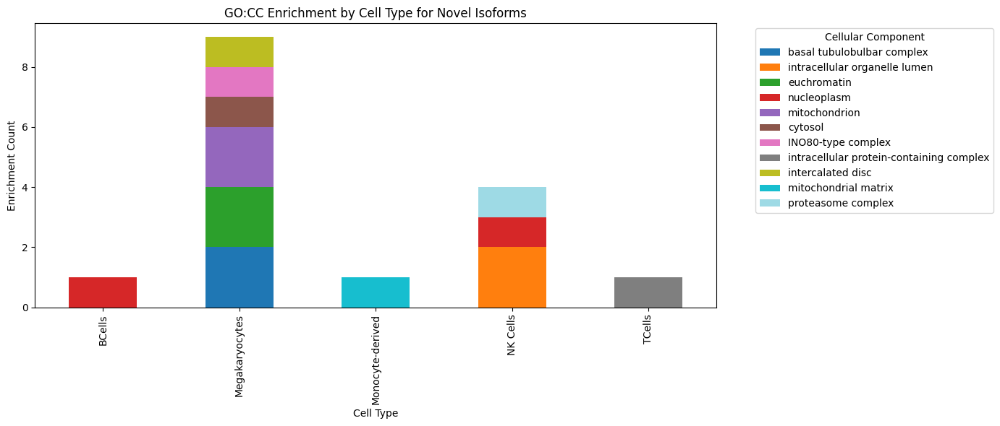

In [104]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load gProfiler enrichment results
df = pd.read_csv("Intermediate_Files/Bambu_TopSimilar_Gene_Enrichment_gProfiler.tsv", sep="\t")

# Filter to GO:CC only
go_cc = df[df["Source"] == "GO:CC"].copy()

# Clean term names for grouping if needed
go_cc["Term"] = go_cc["Term"].str.strip()

# Count number of times each GO:CC term appears per cell type
cc_counts = (
    go_cc.groupby(["Cell_Type", "Term"])
    .size()
    .unstack(fill_value=0)
)

# Sort terms by total abundance
term_order = cc_counts.sum(axis=0).sort_values(ascending=False).index
cc_counts = cc_counts[term_order]

# Plot stacked bar chart
ax = cc_counts.plot(kind="bar", stacked=True, figsize=(14, 6), colormap="tab20")
ax.set_title("GO:CC Enrichment by Cell Type for Novel Isoforms")
ax.set_ylabel("Enrichment Count")
ax.set_xlabel("Cell Type")
ax.legend(title="Cellular Component", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()

In [100]:
import pandas as pd
import numpy as np
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import pairwise_distances
from scipy.spatial.distance import squareform
from ast import literal_eval

# Load enrichment file
df = pd.read_csv("Intermediate_Files/Bambu_TopSimilar_Gene_Enrichment_gProfiler_CellType.tsv", sep="\t")

# Convert comma-separated gene strings to sets
df["Gene_Set"] = df["Genes"].apply(lambda x: set(x.split(",")) if pd.notna(x) else set())

# Filter rows with at least 1 gene
df = df[df["Gene_Set"].apply(len) > 0].reset_index(drop=True)

# Compute Jaccard distance matrix
n = len(df)
jaccard_matrix = np.zeros((n, n))

for i in range(n):
    for j in range(i, n):
        set_i = df.loc[i, "Gene_Set"]
        set_j = df.loc[j, "Gene_Set"]
        if not set_i and not set_j:
            dist = 1.0
        else:
            intersection = len(set_i & set_j)
            union = len(set_i | set_j)
            dist = 1 - (intersection / union) if union != 0 else 1.0
        jaccard_matrix[i, j] = jaccard_matrix[j, i] = dist

# Cluster terms using Agglomerative Clustering
clustering = AgglomerativeClustering(n_clusters=None, distance_threshold=0.6, metric='precomputed', linkage='average')
labels = clustering.fit_predict(jaccard_matrix)
df["Jaccard_Cluster"] = labels

# Save updated results
df.to_csv("Intermediate_Files/Bambu_Enrichment_With_Jaccard_Clusters.tsv", sep="\t", index=False)

# Optional: print cluster summaries
summary = (
    df.groupby("Jaccard_Cluster")
    .agg(
        Top_Terms=("Term", lambda x: ", ".join(x.value_counts().head(3).index)),
        Num_Unique_Terms=("Term", "nunique"),
        Num_Isoforms=("Query", "nunique")
    )
    .reset_index()
)
print(summary)

ValueError: Found array with 0 sample(s) (shape=(0, 0)) while a minimum of 2 is required by AgglomerativeClustering.


=== New Gene w/ New Isoform Pathway Cluster Summary ===
                                                          Top_Term  Num_Terms  \
Pathway_Cluster                                                                 
43                                            protein localization          1   
16                        Vasopressin-regulated water reabsorption          1   
40                                              proteasome complex          1   
34                                  natural killer cell activation          1   
18                           acetyl-CoA C-acyltransferase activity          1   
29                                   intracellular organelle lumen          1   
48                         structural constituent of myelin sheath          1   
32                                            mitochondrial matrix          1   
38                    positive regulation of immune system process          1   
21               calcium-dependent cysteine-type end

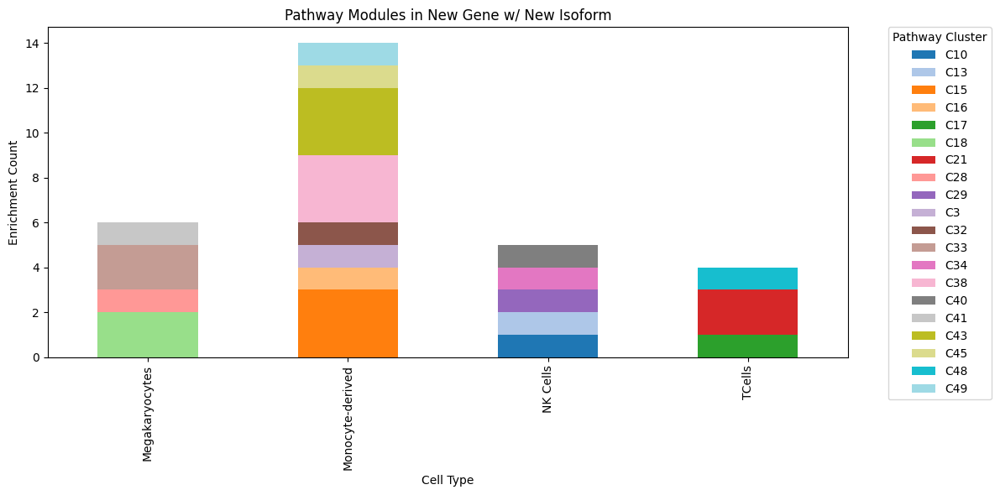

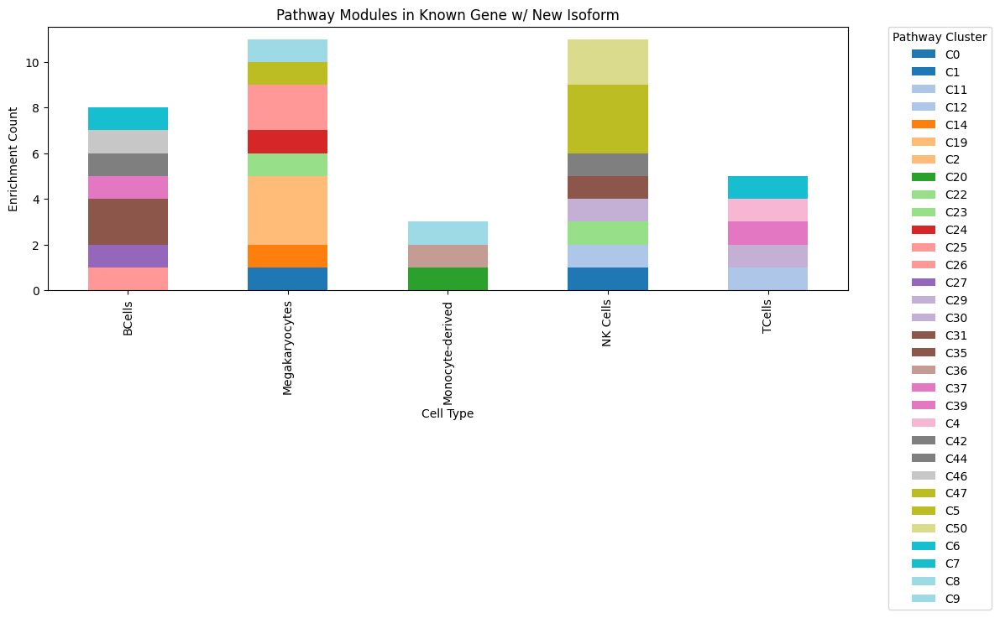

In [98]:
import pandas as pd
import matplotlib.pyplot as plt

# Load enrichment results
df = pd.read_csv("Intermediate_Files/Bambu_TopSimilar_Gene_Enrichment_gProfiler_CellType.tsv", sep="\t")

# Categorize gene class
df["Gene_Class"] = df["Query"].apply(
    lambda x: "New Gene w/ New Isoform" if x.startswith("BambuGene") else "Known Gene w/ New Isoform"
)

# Assign unique pathway clusters across all sources
df["Pathway_Cluster"] = df.groupby("Term").ngroup()
df["Cluster_Label"] = "C" + df["Pathway_Cluster"].astype(str)

# Summarize cluster significance per gene class
for gene_class in df["Gene_Class"].unique():
    print(f"\n=== {gene_class} Pathway Cluster Summary ===")
    subset = df[df["Gene_Class"] == gene_class]

    summary = (
        subset.groupby("Pathway_Cluster")
        .agg(
            Top_Term=("Term", lambda x: x.value_counts().idxmax()),
            Num_Terms=("Term", "nunique"),
            Num_Isoforms=("Query", "nunique"),
            Num_Cell_Types=("Cell_Type", "nunique"),
            Min_FDR=("FDR", "min"),
            Median_FDR=("FDR", "median")
        )
        .sort_values("Min_FDR")
    )
    print(summary.head(10))  # top 10 clusters
    
# Plot one per gene class
for gene_class in df["Gene_Class"].unique():
    subset = df[df["Gene_Class"] == gene_class]

    if subset.empty:
        continue

    counts = subset.groupby(["Cell_Type", "Cluster_Label"]).size().unstack(fill_value=0)
    counts = counts.reindex(sorted(counts.columns), axis=1)

    ax = counts.plot(kind="bar", stacked=True, colormap="tab20", figsize=(12, 6))
    ax.set_title(f"Pathway Modules in {gene_class}")
    ax.set_ylabel("Enrichment Count")
    ax.set_xlabel("Cell Type")
    ax.legend(title="Pathway Cluster", bbox_to_anchor=(1.05, 1), loc="upper left", borderaxespad=0.)
    plt.tight_layout()
    plt.show()

Cluster 0:
  - natural killer cell activation
  - cell cycle
Cluster 1:
  - Degradation of cysteine and homocysteine
  - Other glycan degradation
Cluster 2:
  - Type II diabetes mellitus
Cluster 3:
  - inhibition of cysteine-type endopeptidase activity
Cluster 4:
  - positive regulation of type 2 immune response
  - positive regulation of immune system process
Cluster 5:
  - Cap-dependent Translation Initiation
Cluster 6:
  - regulation of xenophagy
Cluster 7:
  - Interaction between L1 and Ankyrins
Cluster 8:
  - DNA-templated transcription
Cluster 9:
  - protein localization
Cluster 10:
  - trans-Golgi Network Vesicle Budding
Cluster 11:
  - Interleukin-15 signaling
Cluster 12:
  - vesicle transport along actin filament
Cluster 13:
  - immunological synapse formation
Cluster 14:
  - Purine salvage
Cluster 15:
  - positive regulation of voltage-gated potassium channel activity
Cluster 16:
  - Synthesis of IPs in the nucleus
Cluster 17:
  - Systemic lupus erythematosus
Cluster 18:
  - 

/tmp/ipykernel_1089799/3743080823.py:47: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(


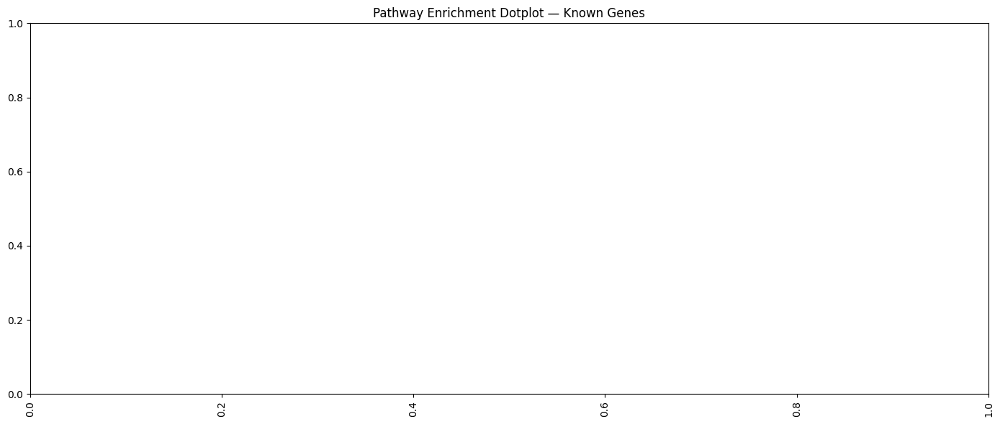

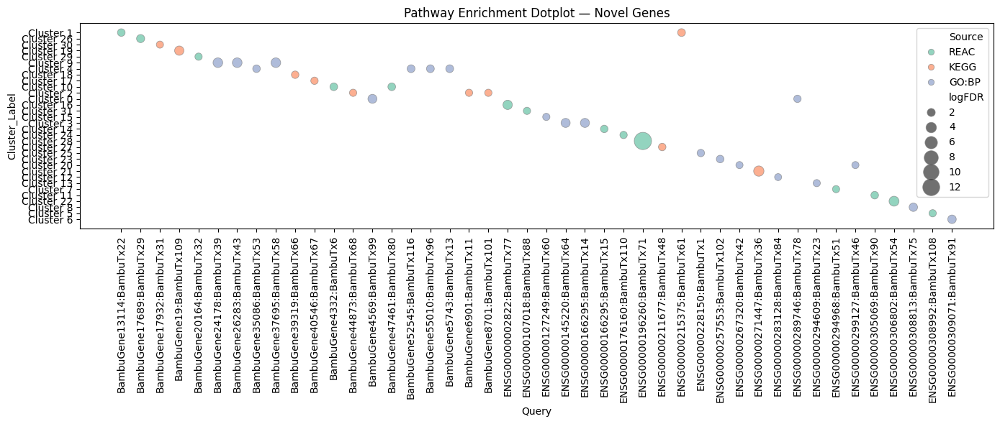

In [59]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.cluster import AgglomerativeClustering

# Load results
df = pd.read_csv("Intermediate_Files/Bambu_TopSimilar_Gene_Enrichment_gProfiler.tsv", sep="\t")

# Clean FDR values for plotting
df['logFDR'] = -np.log10(df['FDR'].replace(0, 1e-300))  # avoid -inf

# Label novel vs known genes
df["Gene_Type"] = df["Query"].apply(lambda x: "Novel" if "Bambu" in x else "Known")

# Cluster terms by semantic similarity
vectorizer = TfidfVectorizer(stop_words="english")
X = vectorizer.fit_transform(df["Term"])
cos_sim = cosine_similarity(X)

clustering = AgglomerativeClustering(n_clusters=None, distance_threshold=0.7, linkage='average', metric='precomputed')
labels = clustering.fit_predict(1 - cos_sim)
df["Term_Cluster"] = labels

# Optional: print what terms belong to each cluster
for cl in sorted(df["Term_Cluster"].unique()):
    terms = df[df["Term_Cluster"] == cl]["Term"].unique()
    print(f"Cluster {cl}:")
    for t in terms:
        print(f"  - {t}")

# Build cluster labels for plotting
cluster_labels = {i: f"Cluster {i}" for i in sorted(df["Term_Cluster"].unique())}
df["Cluster_Label"] = df["Term_Cluster"].map(cluster_labels)

# Generate color palette from unique sources
unique_sources = df["Source"].unique()
default_colors = sns.color_palette("Set2", len(unique_sources))
palette = dict(zip(unique_sources, default_colors))

# --- DOTPLOT SPLIT BY GENE TYPE ---
for gene_type in ["Known", "Novel"]:
    subset = df[df["Gene_Type"] == gene_type]
    plt.figure(figsize=(14, 6))
    sns.scatterplot(
        data=subset,
        x="Query",
        y="Cluster_Label",
        size="logFDR",
        hue="Source",
        alpha=0.7,
        palette=palette,
        sizes=(50, 300),
        edgecolor="gray"
    )
    plt.title(f"Pathway Enrichment Dotplot — {gene_type} Genes")
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

# --- OPTIONAL: SAVE TO FILE ---
# plt.savefig(f"dotplot_{gene_type.lower()}_genes.png", dpi=300)

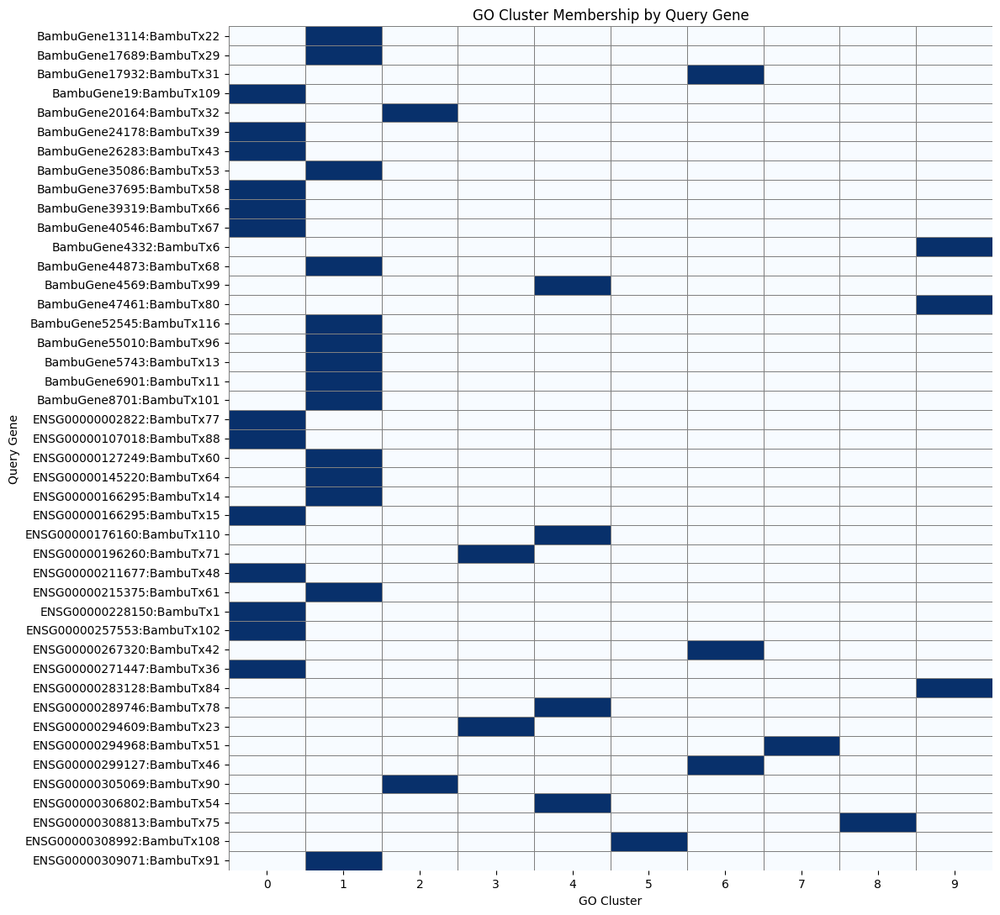

In [46]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import AgglomerativeClustering

# Extract terms
terms = df_results["Term"].fillna("").astype(str)

# TF-IDF vectorization
vectorizer = TfidfVectorizer(stop_words="english")
X = vectorizer.fit_transform(terms)

# Agglomerative clustering with cosine distance
clustering = AgglomerativeClustering(n_clusters=10, metric='cosine', linkage='average')
clusters = clustering.fit_predict(X.toarray())

# Add to df_results
df_results["Cluster"] = clusters

# Prepare binary matrix of isoforms vs cluster
rows = [(row["Query"], f'Cluster {row["Cluster"]}') for _, row in df_results.iterrows()]
df_bin = pd.DataFrame(rows, columns=["Query", "Cluster"])
heatmap_data = pd.crosstab(df_bin["Query"], df_bin["Cluster"])

# Create a binary matrix (rows = genes, cols = GO clusters)
df_bin = pd.crosstab(df_results["Query"], df_results["Cluster"])

# Sort genes by cluster for cleaner display
df_bin = df_bin.loc[df_bin.sum(axis=1).sort_values(ascending=False).index]

# Plot heatmap
plt.figure(figsize=(12, max(6, len(df_bin) * 0.25)))  # Auto height scaling
sns.heatmap(df_bin, cmap="Blues", cbar=False, linewidths=0.5, linecolor='gray')
plt.title("GO Cluster Membership by Query Gene")
plt.ylabel("Query Gene")
plt.xlabel("GO Cluster")
plt.tight_layout()
plt.show()

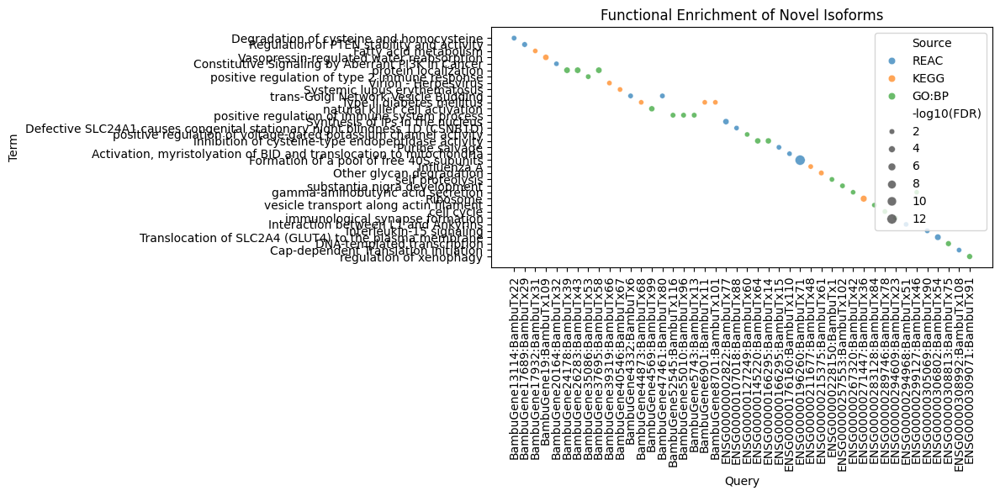

In [43]:
df_plot = df_results.copy()
df_plot["-log10(FDR)"] = -np.log10(df_plot["FDR"])
plt.figure(figsize=(12, 6))
sns.scatterplot(data=df_plot, x="Query", y="Term", size="-log10(FDR)", hue="Source", legend="brief", alpha=0.7)
plt.xticks(rotation=90)
plt.title("Functional Enrichment of Novel Isoforms")
plt.tight_layout()
plt.show()

In [39]:
from wordcloud import WordCloud

for clust in df_results["GO_Cluster"].unique():
    terms = df_results[df_results["GO_Cluster"] == clust]["Term"]
    text = " ".join(terms)
    wc = WordCloud(width=800, height=400, background_color="white").generate(text)
    
    plt.figure(figsize=(10, 5))
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.title(f"GO Cluster {clust}")
    plt.show()

ModuleNotFoundError: No module named 'wordcloud'

In [2]:
# Load the mdata object from the file
output_dir = 'Intermediate_Files/Clustering_05012025'

from scanpy import read_h5ad
adata_g_filtered = read_h5ad(os.path.join(output_dir, "PBMC_gene_AutoZI_clustered_celltypes_reannotated_AutoZILatent_05112025.h5mu"))
adata_i_filtered = read_h5ad(os.path.join(output_dir, "PBMC_iso_AutoZI_clustered_celltypes_reannotated_AutoZILatent_05112025.h5mu"))

✅ Found 24 isoforms:
   MALAT1:ENSG00000251562:ENST00000508832
   MALAT1:ENSG00000251562:ENST00000534336
   MALAT1:ENSG00000251562:ENST00000544868
   MALAT1:ENSG00000251562:ENST00000610851
   MALAT1:ENSG00000251562:ENST00000616691
   MALAT1:ENSG00000251562:ENST00000618132
   MALAT1:ENSG00000251562:ENST00000619449
   MALAT1:ENSG00000251562:ENST00000620902
   MALAT1:ENSG00000251562:ENST00000710847
   MALAT1:ENSG00000251562:ENST00000710848
   MALAT1:ENSG00000251562:ENST00000710852
   MALAT1:ENSG00000251562:ENST00000710855
   MALAT1:ENSG00000251562:ENST00000710858
   MALAT1:ENSG00000251562:ENST00000710862
   MALAT1:ENSG00000251562:ENST00000710866
   MALAT1:ENSG00000251562:ENST00000710875
   MALAT1:ENSG00000251562:ENST00000710927
   MALAT1:ENSG00000251562:ENST00000710937
   MALAT1:ENSG00000251562:ENST00000710938
   MALAT1:ENSG00000251562:ENST00000710940
   MALAT1:ENSG00000251562:ENST00000710946
   MALAT1:ENSG00000251562:ENST00000710950
   MALAT1:ENSG00000251562:ENST00000710951
   ENSG000002

/tmp/ipykernel_3648124/2434154857.py:24: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_expr = df_expr.groupby(df_expr.index).mean()


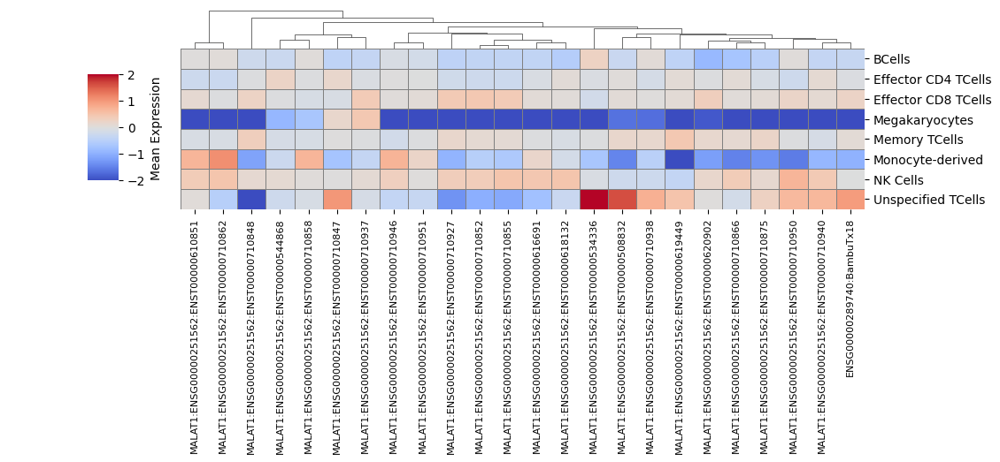

In [26]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm

# Step 1: Define ENSG IDs for MALAT1 and TALAM1
target_ensgs = ["ENSG00000251562", "ENSG00000289740"]
isoform_matches = [gene for gene in adata_i_filtered.var_names if any(ensg in gene for ensg in target_ensgs)]

print(f"✅ Found {len(isoform_matches)} isoforms:")
for g in isoform_matches:
    print("  ", g)

# Step 2: Extract expression matrix
X = adata_i_filtered.X.toarray() if hasattr(adata_i_filtered.X, "toarray") else adata_i_filtered.X
iso_indices = [adata_i_filtered.var_names.get_loc(i) for i in isoform_matches]

df_expr = pd.DataFrame(X[:, iso_indices],
                       columns=isoform_matches,
                       index=adata_i_filtered.obs["gen_cell_type_reannotated"])

# Step 3: Mean expression per cell type
mean_expr = df_expr.groupby(df_expr.index).mean()

# Step 4: Set symmetric vmin/vmax for centered colormap
abs_max = np.abs(mean_expr.values).max()
norm = TwoSlopeNorm(vmin=-2, vcenter=0, vmax=2)

# Step 5: Plot
g = sns.clustermap(mean_expr,
                   cmap="coolwarm", linewidths=0.5, linecolor="gray",
                   figsize=(len(mean_expr.columns) * 0.4 + 2, len(mean_expr.index) * 0.5 + 2),
                   col_cluster=True, row_cluster=False,
                   cbar_kws={"label": "Mean Expression"},
                   norm=TwoSlopeNorm(vmin=-2, vcenter=0, vmax=2),
                  cbar_pos=(0.09, 0.65, 0.03, 0.2))

g.ax_heatmap.set_xticklabels(g.ax_heatmap.get_xticklabels(), rotation=90, fontsize=8)
g.ax_heatmap.set_yticklabels(g.ax_heatmap.get_yticklabels(), rotation=0)
g.ax_heatmap.set_xlabel("")
g.ax_heatmap.set_ylabel("")
g.ax_heatmap.set_title("", pad=20)

g.savefig("Intermediate_Files/Paper_Figs/MALAT1_TALAM1_isoform_expression_clustermap.pdf",
          dpi=600, bbox_inches="tight", transparent=True)
plt.show()

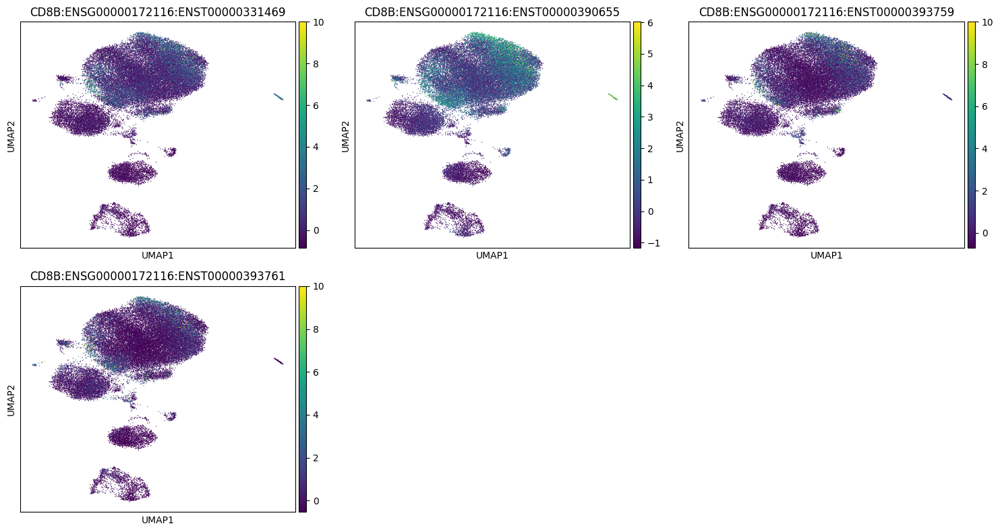

In [20]:
# Extract all gene names that start with "Bambu"
isos_CD8B = [gene for gene in adata_i_filtered.var_names if "ENSG00000172116" in gene]

# Determine grid size: adjust ncols as needed.
n_genes = len(isos_CD8B)
ncols = 3
nrows = (n_genes + ncols - 1) // ncols

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols * 5, nrows * 4))
axes = axes.flatten()

# Loop through each bambu gene and plot UMAP colored by its expression.
for i, gene in enumerate(isos_CD8B):
    sc.pl.umap(
        adata_i_filtered, 
        color=gene, 
        use_raw=False, 
        title=f"{gene}", 
        cmap="viridis", 
        show=False, 
        ax=axes[i],
        #vmax = 1
    )

# Hide any extra subplots (if nrows*ncols > number of genes)
for j in range(i+1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()

/tmp/ipykernel_3648124/2264973605.py:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  summary = df_long.groupby(["cell_type", "isoform"]).agg(


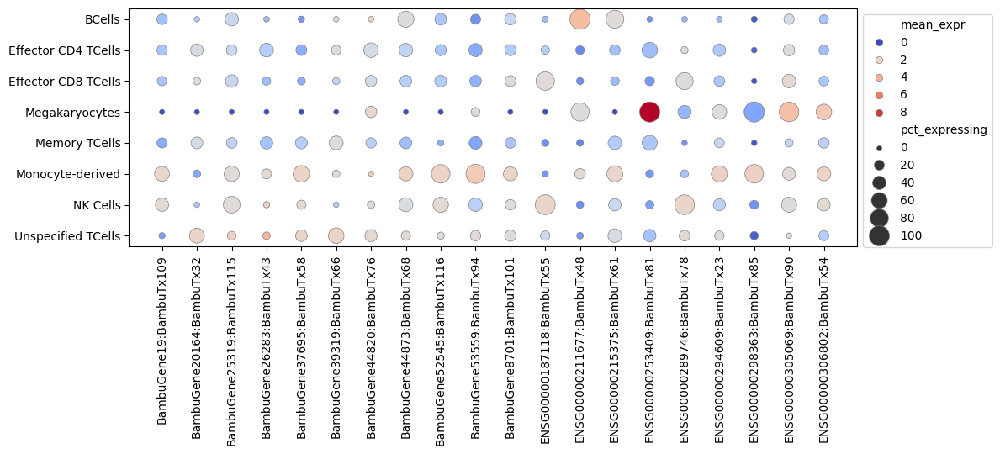

In [48]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Step 1: Get all novel isoforms (BambuTx)
novel_isoforms = [i for i in adata_i_filtered.var_names if "BambuTx" in i]

# Extract expression matrix
X = adata_i_filtered.X.toarray() if hasattr(adata_i_filtered.X, "toarray") else adata_i_filtered.X
expr_df = pd.DataFrame(X[:, [adata_i_filtered.var_names.get_loc(i) for i in novel_isoforms]],
                       columns=novel_isoforms,
                       index=adata_i_filtered.obs_names)

# Add cell type annotation
expr_df["cell_type"] = adata_i_filtered.obs["gen_cell_type_reannotated"]

# Step 2: Melt to long format
df_long = expr_df.melt(id_vars="cell_type", var_name="isoform", value_name="expression")

# Step 3: Compute % expressing and mean expression per isoform per cell type
summary = df_long.groupby(["cell_type", "isoform"]).agg(
    pct_expressing = ("expression", lambda x: (x > 0).mean() * 100),
    mean_expr = ("expression", lambda x: x[x > 0].mean() if any(x > 0) else 0)
).reset_index()

# Step 4: Optional — filter top isoforms by expression or specificity
top_isoforms = (
    summary.groupby("isoform")["mean_expr"]
    .max()
    .sort_values(ascending=False)
    .head(20)
    .index
)
plot_df = summary[summary["isoform"].isin(top_isoforms)]

from matplotlib.colors import TwoSlopeNorm

# Step 5: Plot with centered colormap
vmin = plot_df["mean_expr"].min()
vmax = plot_df["mean_expr"].max()
vcenter = plot_df["mean_expr"].mean()  # Set center to actual mean

norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)

plt.figure(figsize=(len(top_isoforms) * 0.5 + 2, 5.5))
sns.scatterplot(data=plot_df,
                x="isoform", y="cell_type",
                size="pct_expressing", hue="mean_expr",
                sizes=(20, 300), palette="coolwarm",
                edgecolor="gray", linewidth=0.5, hue_norm=norm)

plt.xticks(rotation=90)
plt.xlabel("")
plt.ylabel("")
plt.title("")
plt.legend(bbox_to_anchor=(1.0, 1), loc='upper left')

plt.tight_layout()
plt.savefig("Intermediate_Files/Paper_Figs/novel_isoform_specificity_dotplot.pdf",
            dpi=600, bbox_inches="tight", transparent=True)
plt.show()

/tmp/ipykernel_3648124/1964934279.py:27: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  summary = df_long.groupby(["cell_type", "isoform", "gene_type"]).agg(


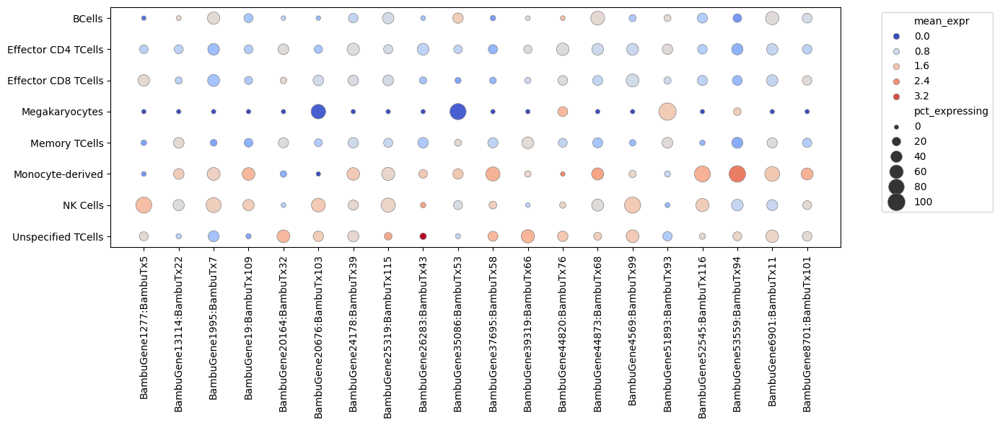

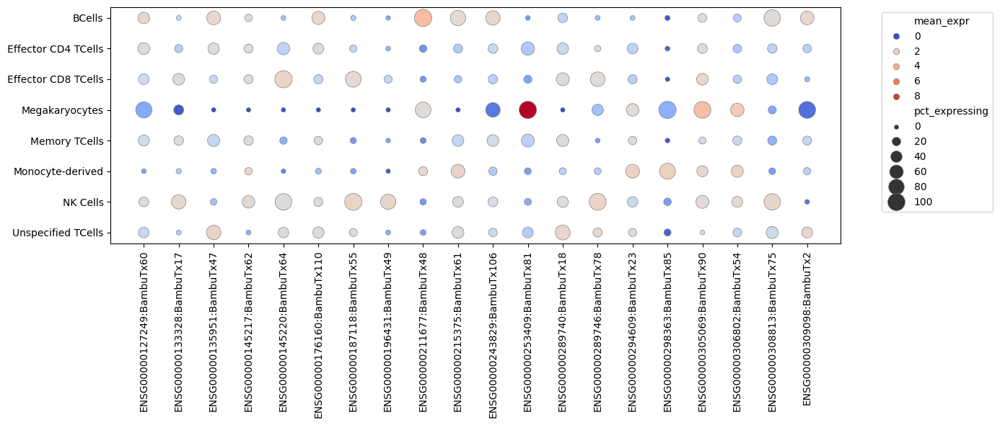

In [54]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm

# Step 1: Get all novel isoforms (BambuTx)
novel_isoforms = [i for i in adata_i_filtered.var_names if "BambuTx" in i]

# Extract expression matrix
X = adata_i_filtered.X.toarray() if hasattr(adata_i_filtered.X, "toarray") else adata_i_filtered.X
expr_df = pd.DataFrame(X[:, [adata_i_filtered.var_names.get_loc(i) for i in novel_isoforms]],
                       columns=novel_isoforms,
                       index=adata_i_filtered.obs_names)

# Add cell type annotation
expr_df["cell_type"] = adata_i_filtered.obs["gen_cell_type_reannotated"]

# Step 2: Melt to long format
df_long = expr_df.melt(id_vars="cell_type", var_name="isoform", value_name="expression")

# Add gene type annotation (Novel vs Known)
df_long["gene_type"] = df_long["isoform"].str.extract(r"^(BambuGene|ENSG)")
df_long["gene_type"] = df_long["gene_type"].map({"BambuGene": "Novel", "ENSG": "Known"}).fillna("Other")

# Step 3: Compute % expressing and mean expression per isoform per cell type
summary = df_long.groupby(["cell_type", "isoform", "gene_type"]).agg(
    pct_expressing=("expression", lambda x: (x > 0).mean() * 100),
    mean_expr=("expression", lambda x: x[x > 0].mean() if any(x > 0) else 0)
).reset_index()

# Step 4–5: Process and plot each gene type separately
for gene_type in ["Novel", "Known"]:
    sub_df = summary[summary["gene_type"] == gene_type]
    if sub_df.empty:
        continue  # skip if no data for this type

    # Top 20 isoforms for this group
    top_isoforms = (
        sub_df.groupby("isoform")["mean_expr"]
        .max()
        .sort_values(ascending=False)
        .head(20)
        .index
    )
    plot_df = sub_df[sub_df["isoform"].isin(top_isoforms)]

    # Center colormap
    vmin = plot_df["mean_expr"].min()
    vmax = plot_df["mean_expr"].max()
    vcenter = plot_df["mean_expr"].mean()
    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)

    # Plot
    plt.figure(figsize=(len(top_isoforms) * 0.6 + 2, 6))
    sns.scatterplot(data=plot_df,
                    x="isoform", y="cell_type",
                    size="pct_expressing", hue="mean_expr",
                    sizes=(20, 300), palette="coolwarm",
                    edgecolor="gray", linewidth=0.5, hue_norm=norm)

    plt.xticks(rotation=90)
    plt.xlabel(f"")
    plt.ylabel("")
    plt.title(f"")
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title="")

    plt.tight_layout()
    plt.savefig(f"Intermediate_Files/Paper_Figs/{gene_type.lower()}_isoform_specificity_dotplot.pdf",
                dpi=600, bbox_inches="tight", transparent=True)
    plt.show()

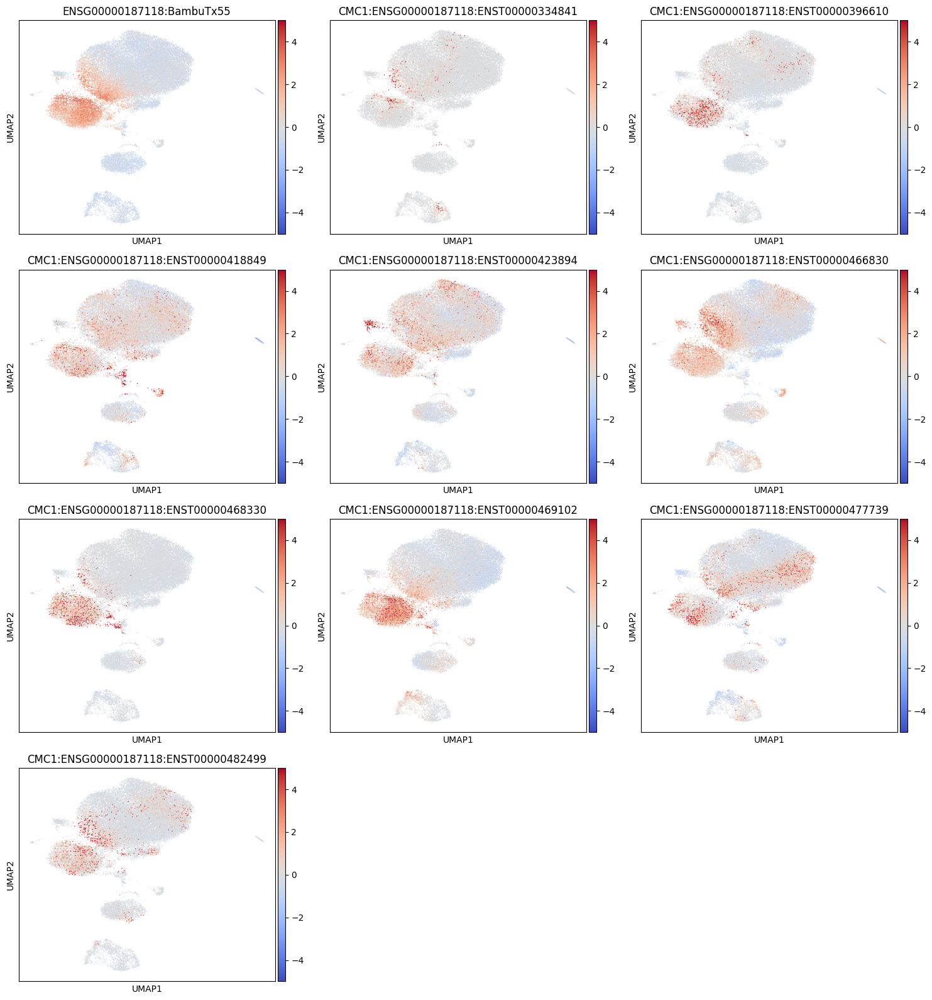

In [24]:
# Extract all gene names that start with "Bambu"
isos_CMC1 = [gene for gene in adata_i_filtered.var_names if "ENSG00000187118" in gene]

# Determine grid size: adjust ncols as needed.
n_genes = len(isos_CMC1)
ncols = 3
nrows = (n_genes + ncols - 1) // ncols

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols * 5, nrows * 4))
axes = axes.flatten()

# Loop through each bambu gene and plot UMAP colored by its expression.
for i, gene in enumerate(isos_CMC1):
    sc.pl.umap(
        adata_i_filtered, 
        color=gene, 
        use_raw=False, 
        title=f"{gene}", 
        cmap="coolwarm", 
        show=False, 
        ax=axes[i],
        vmax = 5,
        vmin = -5
    )

# Hide any extra subplots (if nrows*ncols > number of genes)
for j in range(i+1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()

✅ Found 10 isoforms:
   ENSG00000187118:BambuTx55
   CMC1:ENSG00000187118:ENST00000334841
   CMC1:ENSG00000187118:ENST00000396610
   CMC1:ENSG00000187118:ENST00000418849
   CMC1:ENSG00000187118:ENST00000423894
   CMC1:ENSG00000187118:ENST00000466830
   CMC1:ENSG00000187118:ENST00000468330
   CMC1:ENSG00000187118:ENST00000469102
   CMC1:ENSG00000187118:ENST00000477739
   CMC1:ENSG00000187118:ENST00000482499


/tmp/ipykernel_3648124/3147334769.py:24: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_expr = df_expr.groupby(df_expr.index).mean()


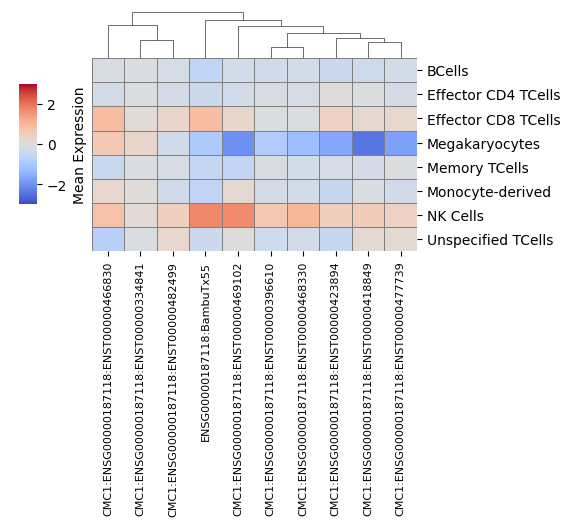

In [32]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm

# Step 1: Define ENSG IDs for MALAT1 and TALAM1
target_ensgs = ["ENSG00000187118"]
isoform_matches = [gene for gene in adata_i_filtered.var_names if any(ensg in gene for ensg in target_ensgs)]

print(f"✅ Found {len(isoform_matches)} isoforms:")
for g in isoform_matches:
    print("  ", g)

# Step 2: Extract expression matrix
X = adata_i_filtered.X.toarray() if hasattr(adata_i_filtered.X, "toarray") else adata_i_filtered.X
iso_indices = [adata_i_filtered.var_names.get_loc(i) for i in isoform_matches]

df_expr = pd.DataFrame(X[:, iso_indices],
                       columns=isoform_matches,
                       index=adata_i_filtered.obs["gen_cell_type_reannotated"])

# Step 3: Mean expression per cell type
mean_expr = df_expr.groupby(df_expr.index).mean()

# Step 4: Set symmetric vmin/vmax for centered colormap
abs_max = np.abs(mean_expr.values).max()
norm = TwoSlopeNorm(vmin=-2, vcenter=0, vmax=2)

# Step 5: Plot
g = sns.clustermap(mean_expr,
                   cmap="coolwarm", linewidths=0.5, linecolor="gray",
                   figsize=(len(mean_expr.columns) * 0.4 + 2, len(mean_expr.index) * 0.5 + 2),
                   col_cluster=True, row_cluster=False,
                   cbar_kws={"label": "Mean Expression"},
                   norm=TwoSlopeNorm(vmin=-3, vcenter=0, vmax=3),
                  cbar_pos=(0.04, 0.65, 0.03, 0.2))

g.ax_heatmap.set_xticklabels(g.ax_heatmap.get_xticklabels(), rotation=90, fontsize=8)
g.ax_heatmap.set_yticklabels(g.ax_heatmap.get_yticklabels(), rotation=0)
g.ax_heatmap.set_xlabel("")
g.ax_heatmap.set_ylabel("")
g.ax_heatmap.set_title("", pad=20)

g.savefig("Intermediate_Files/Paper_Figs/CMC1_isoform_expression_clustermap.pdf",
          dpi=600, bbox_inches="tight", transparent=True)
plt.show()

✅ Found 10 isoforms:
   ENSG00000187118:BambuTx55
   CMC1:ENSG00000187118:ENST00000334841
   CMC1:ENSG00000187118:ENST00000396610
   CMC1:ENSG00000187118:ENST00000418849
   CMC1:ENSG00000187118:ENST00000423894
   CMC1:ENSG00000187118:ENST00000466830
   CMC1:ENSG00000187118:ENST00000468330
   CMC1:ENSG00000187118:ENST00000469102
   CMC1:ENSG00000187118:ENST00000477739
   CMC1:ENSG00000187118:ENST00000482499


/tmp/ipykernel_3079175/3998692909.py:30: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  summary = df_long.groupby(["cell_type", "isoform"]).agg(


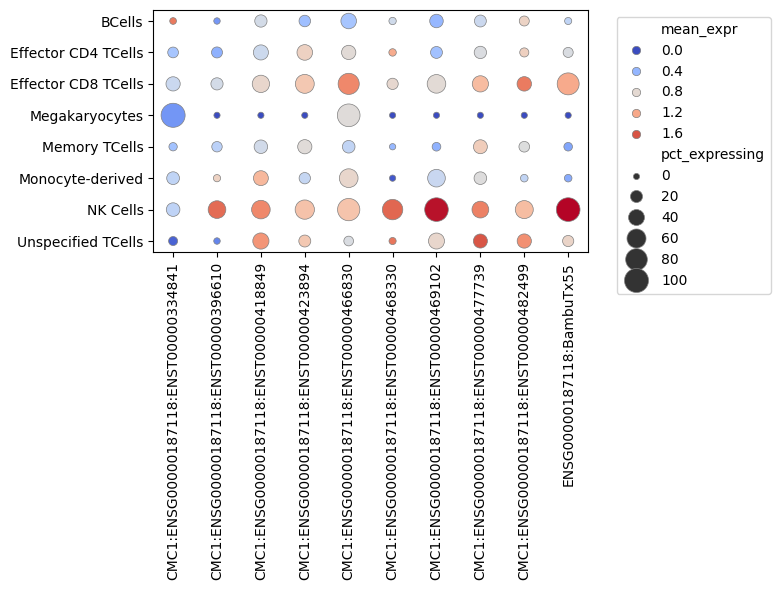

In [13]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm

# Step 1: Define ENSG ID for CMC1
target_ensgs = ["ENSG00000187118"]
isoform_matches = [gene for gene in adata_i_filtered.var_names if any(ensg in gene for ensg in target_ensgs)]

print(f"✅ Found {len(isoform_matches)} isoforms:")
for g in isoform_matches:
    print("  ", g)

# Step 2: Extract expression matrix
X = adata_i_filtered.X.toarray() if hasattr(adata_i_filtered.X, "toarray") else adata_i_filtered.X
iso_indices = [adata_i_filtered.var_names.get_loc(i) for i in isoform_matches]

df_expr = pd.DataFrame(X[:, iso_indices],
                       columns=isoform_matches,
                       index=adata_i_filtered.obs_names)

# Add cell type annotation
df_expr["cell_type"] = adata_i_filtered.obs["gen_cell_type_reannotated"]

# Step 3: Melt to long format
df_long = df_expr.melt(id_vars="cell_type", var_name="isoform", value_name="expression")

# Step 4: Compute % expressing and mean expression per isoform per cell type
summary = df_long.groupby(["cell_type", "isoform"]).agg(
    pct_expressing=("expression", lambda x: (x > 0).mean() * 100),
    mean_expr=("expression", lambda x: x[x > 0].mean() if any(x > 0) else 0)
).reset_index()

# Step 5: Set colormap centering
vmin = summary["mean_expr"].min()
vmax = summary["mean_expr"].max()
vcenter = summary["mean_expr"].mean()
norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)

# Step 6: Plot
plt.figure(figsize=(len(isoform_matches) * 0.6 + 2, 6))
sns.scatterplot(data=summary,
                x="isoform", y="cell_type",
                size="pct_expressing", hue="mean_expr",
                sizes=(20, 300), palette="coolwarm",
                edgecolor="gray", linewidth=0.5, hue_norm=norm)

plt.xticks(rotation=90)
plt.xlabel("")
plt.ylabel("")
plt.title("")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.savefig("Intermediate_Files/Paper_Figs/CMC1_isoform_expression_dotplot.pdf",
            dpi=600, bbox_inches="tight", transparent=True)
plt.show()

✅ Found 10 isoforms:
   ENSG00000187118:BambuTx55
   CMC1:ENSG00000187118:ENST00000334841
   CMC1:ENSG00000187118:ENST00000396610
   CMC1:ENSG00000187118:ENST00000418849
   CMC1:ENSG00000187118:ENST00000423894
   CMC1:ENSG00000187118:ENST00000466830
   CMC1:ENSG00000187118:ENST00000468330
   CMC1:ENSG00000187118:ENST00000469102
   CMC1:ENSG00000187118:ENST00000477739
   CMC1:ENSG00000187118:ENST00000482499


/tmp/ipykernel_3079175/2596023358.py:25: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_expr = df_expr.groupby(df_expr.index).mean()


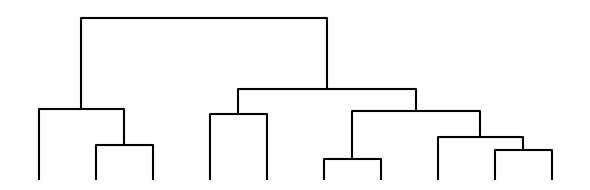

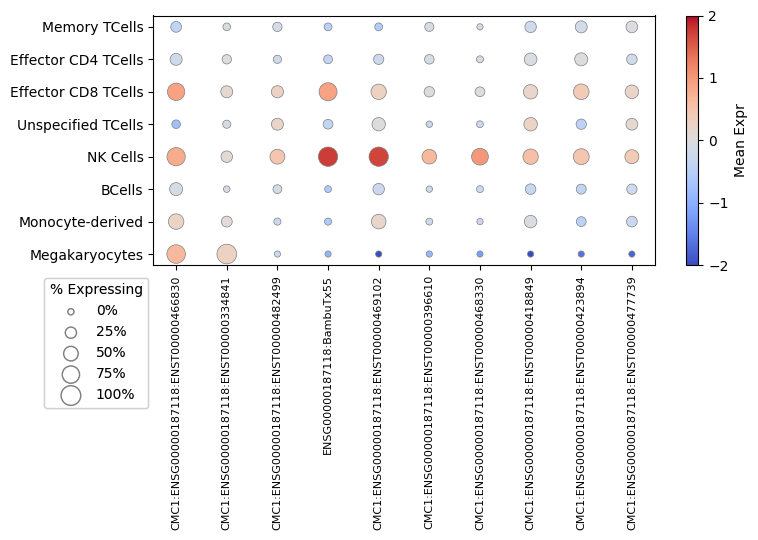

In [106]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
from scipy.cluster.hierarchy import linkage, dendrogram, leaves_list

# 1️⃣ Define target gene(s)
target_ensgs = ["ENSG00000187118"]
isoform_matches = [gene for gene in adata_i_filtered.var_names if any(ensg in gene for ensg in target_ensgs)]

print(f"✅ Found {len(isoform_matches)} isoforms:")
for g in isoform_matches:
    print("  ", g)

# 2️⃣ Extract expression matrix
X = adata_i_filtered.X.toarray() if hasattr(adata_i_filtered.X, "toarray") else adata_i_filtered.X
iso_indices = [adata_i_filtered.var_names.get_loc(i) for i in isoform_matches]

df_expr = pd.DataFrame(X[:, iso_indices],
                       columns=isoform_matches,
                       index=adata_i_filtered.obs["gen_cell_type_reannotated"])

# 3️⃣ Calculate mean expression per cell type for dendrogram
mean_expr = df_expr.groupby(df_expr.index).mean()

# 4️⃣ Hierarchical clustering on isoforms (columns)
linkage_matrix = linkage(mean_expr.T, method="ward")
ordered_cols = mean_expr.columns[leaves_list(linkage_matrix)]

# 5️⃣ Save Dendrogram Figure
fig, ax = plt.subplots(figsize=(len(isoform_matches) * 0.4 + 2, 2))
dendro = dendrogram(linkage_matrix,
                    labels=ordered_cols,
                    orientation='top',
                    color_threshold=0,
                    above_threshold_color='black')
ax.set_xticks([])
ax.set_yticks([])
ax.spines[['right', 'left', 'top', 'bottom']].set_visible(False)
plt.tight_layout()
plt.savefig("Intermediate_Files/Paper_Figs/CMC1_isoform_dendrogram.pdf",
            dpi=600, bbox_inches="tight", transparent=True)
plt.show()

# 6️⃣ Prepare single-cell level data for % expressing
df_expr_long = df_expr.copy()
df_expr_long["cell_type"] = df_expr_long.index
df_long = df_expr_long.melt(id_vars="cell_type", var_name="isoform", value_name="expression")

summary_pct = df_long.groupby(["cell_type", "isoform"], observed=False).agg(
    pct_expressing=("expression", lambda x: (x > 0).mean() * 100)
).reset_index()

# 7️⃣ Calculate mean expression per isoform per cell type
summary_mean = df_long.groupby(["cell_type", "isoform"], observed=False).agg(
    mean_expr=("expression", "mean")
).reset_index()

# 8️⃣ Merge mean expression and % expressing
summary = pd.merge(summary_mean, summary_pct, on=['cell_type', 'isoform'], how='left')

# 9️⃣ Order isoforms and cell types
summary["isoform"] = pd.Categorical(summary["isoform"], categories=ordered_cols, ordered=True)
desired_cell_order = [
    "Memory TCells",
    "Effector CD4 TCells",
    "Effector CD8 TCells",
    "Unspecified TCells",
    "NK Cells",
    "BCells",
    "Monocyte-derived",
    "Megakaryocytes"
]
summary["cell_type"] = pd.Categorical(summary["cell_type"], categories=desired_cell_order, ordered=True)

# 🔟 Save Dotplot Figure with consistent color scale and size legend
fig, ax = plt.subplots(figsize=(len(isoform_matches) * 0.4 + 4, 5.5))

# Explicitly fix the color scale
norm = TwoSlopeNorm(vmin=-2, vcenter=0, vmax=2)

# Plot scatter without automatic legend
scatter = sns.scatterplot(data=summary,
                          x="isoform", y="cell_type",
                          size="pct_expressing", hue="mean_expr",
                          sizes=(20, 200), palette="coolwarm",
                          edgecolor="gray", linewidth=0.5, hue_norm=norm,
                          ax=ax, legend=False)

# Fix x-axis tick labels
ax.set_xticks(range(len(ordered_cols)))
ax.set_xticklabels(ordered_cols, rotation=90, fontsize=8)

ax.set_xlabel("")
ax.set_ylabel("")

# Add colorbar
sm = plt.cm.ScalarMappable(cmap="coolwarm", norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label("Mean Expr")
cbar.set_ticks([-2, -1, 0, 1, 2])

# Add manual size legend
size_values = [0, 25, 50, 75, 100]
size_legend = [plt.scatter([], [], s=np.interp(v, [0, 100], [20, 200]),
                           edgecolors='gray', facecolors='none') for v in size_values]
labels = [f"{v}%" for v in size_values]

legend2 = ax.legend(size_legend, labels, title="% Expressing",
                    loc='upper right', bbox_to_anchor=(-0.01, -0.05 ), borderaxespad=0.)
ax.add_artist(legend2)

plt.tight_layout()
plt.savefig("Intermediate_Files/Paper_Figs/CMC1_isoform_expression_dotplot.pdf",
            dpi=600, bbox_inches="tight", transparent=True)
plt.show()

✅ Found 3 isoforms:
   GATA3:ENSG00000107485:ENST00000346208
   GATA3:ENSG00000107485:ENST00000379328
   GATA3:ENSG00000107485:ENST00000461472


/tmp/ipykernel_3079175/1655353616.py:25: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_expr = df_expr.groupby(df_expr.index).mean()


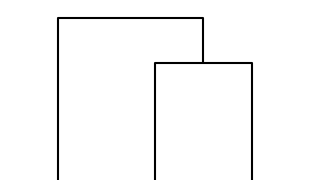

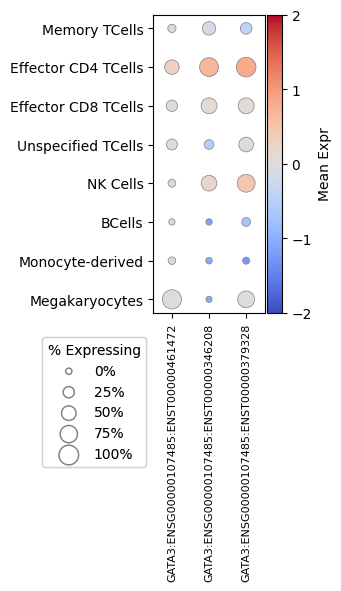

In [100]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
from scipy.cluster.hierarchy import linkage, dendrogram, leaves_list

# 1️⃣ Define target gene(s)
target_ensgs = ["ENSG00000107485"]
isoform_matches = [gene for gene in adata_i_filtered.var_names if any(ensg in gene for ensg in target_ensgs)]

print(f"✅ Found {len(isoform_matches)} isoforms:")
for g in isoform_matches:
    print("  ", g)

# 2️⃣ Extract expression matrix
X = adata_i_filtered.X.toarray() if hasattr(adata_i_filtered.X, "toarray") else adata_i_filtered.X
iso_indices = [adata_i_filtered.var_names.get_loc(i) for i in isoform_matches]

df_expr = pd.DataFrame(X[:, iso_indices],
                       columns=isoform_matches,
                       index=adata_i_filtered.obs["gen_cell_type_reannotated"])

# 3️⃣ Calculate mean expression per cell type for dendrogram
mean_expr = df_expr.groupby(df_expr.index).mean()

# 4️⃣ Hierarchical clustering on isoforms (columns)
linkage_matrix = linkage(mean_expr.T, method="ward")
ordered_cols = mean_expr.columns[leaves_list(linkage_matrix)]

# 5️⃣ Save Dendrogram Figure
fig, ax = plt.subplots(figsize=(len(isoform_matches) * 0.4 + 2, 2))
dendro = dendrogram(linkage_matrix,
                    labels=ordered_cols,
                    orientation='top',
                    color_threshold=0,
                    above_threshold_color='black')
ax.set_xticks([])
ax.set_yticks([])
ax.spines[['right', 'left', 'top', 'bottom']].set_visible(False)
plt.tight_layout()
plt.savefig("Intermediate_Files/Paper_Figs/GATA3_isoform_dendrogram.pdf",
            dpi=600, bbox_inches="tight", transparent=True)
plt.show()

# 6️⃣ Prepare single-cell level data for % expressing
df_expr_long = df_expr.copy()
df_expr_long["cell_type"] = df_expr_long.index
df_long = df_expr_long.melt(id_vars="cell_type", var_name="isoform", value_name="expression")

summary_pct = df_long.groupby(["cell_type", "isoform"], observed=False).agg(
    pct_expressing=("expression", lambda x: (x > 0).mean() * 100)
).reset_index()

# 7️⃣ Calculate mean expression per isoform per cell type
summary_mean = df_long.groupby(["cell_type", "isoform"], observed=False).agg(
    mean_expr=("expression", "mean")
).reset_index()

# 8️⃣ Merge mean expression and % expressing
summary = pd.merge(summary_mean, summary_pct, on=['cell_type', 'isoform'], how='left')

# 9️⃣ Order isoforms and cell types
summary["isoform"] = pd.Categorical(summary["isoform"], categories=ordered_cols, ordered=True)
desired_cell_order = [
    "Memory TCells",
    "Effector CD4 TCells",
    "Effector CD8 TCells",
    "Unspecified TCells",
    "NK Cells",
    "BCells",
    "Monocyte-derived",
    "Megakaryocytes"
]
summary["cell_type"] = pd.Categorical(summary["cell_type"], categories=desired_cell_order, ordered=True)

# 🔟 Save Dotplot Figure with consistent color scale and size legend
fig_width = min(len(isoform_matches) * 0.6 + 1.5, 6)  # keep width reasonable
fig_height = len(desired_cell_order) * 0.6 + 1

fig, ax = plt.subplots(figsize=(fig_width, fig_height), constrained_layout=True)

# Color scale
norm = TwoSlopeNorm(vmin=-2, vcenter=0, vmax=2)

# Plot
scatter = sns.scatterplot(data=summary,
                          x="isoform", y="cell_type",
                          size="pct_expressing", hue="mean_expr",
                          sizes=(20, 200), palette="coolwarm",
                          edgecolor="gray", linewidth=0.5, hue_norm=norm,
                          ax=ax, legend=False)

# X-axis
ax.set_xticks(range(len(ordered_cols)))
ax.set_xticklabels(ordered_cols, rotation=90, fontsize=8)
ax.set_xlim(-0.5, len(ordered_cols) - 0.5)
ax.set_xlabel("")
ax.set_ylabel("")

# Colorbar
sm = plt.cm.ScalarMappable(cmap="coolwarm", norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax, pad=0.02)
cbar.set_label("Mean Expr")
cbar.set_ticks([-2, -1, 0, 1, 2])

# Size legend
size_values = [0, 25, 50, 75, 100]
size_legend = [plt.scatter([], [], s=np.interp(v, [0, 100], [20, 200]),
                           edgecolors='gray', facecolors='none') for v in size_values]
labels = [f"{v}%" for v in size_values]

legend2 = ax.legend(size_legend, labels, title="% Expressing",
                    loc='center left', bbox_to_anchor=(-1, -0.3), borderaxespad=0.)
ax.add_artist(legend2)

# Save
plt.savefig("Intermediate_Files/Paper_Figs/GATA3_isoform_expression_dotplot.pdf",
            dpi=600, bbox_inches="tight", transparent=True)
plt.show()

✅ Found 3 isoforms:
   CCR7:ENSG00000126353:ENST00000246657
   CCR7:ENSG00000126353:ENST00000578085
   CCR7:ENSG00000126353:ENST00000579344


/tmp/ipykernel_3079175/1499556937.py:25: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_expr = df_expr.groupby(df_expr.index).mean()


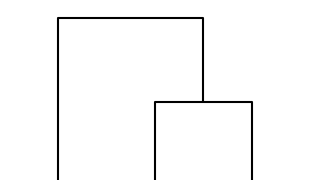

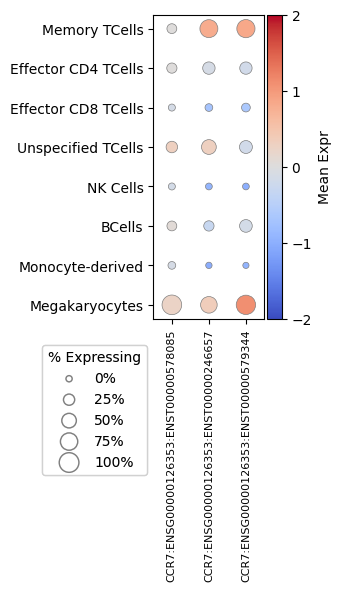

In [99]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
from scipy.cluster.hierarchy import linkage, dendrogram, leaves_list

# 1️⃣ Define target gene(s)
target_ensgs = ["ENSG00000126353"]
isoform_matches = [gene for gene in adata_i_filtered.var_names if any(ensg in gene for ensg in target_ensgs)]

print(f"✅ Found {len(isoform_matches)} isoforms:")
for g in isoform_matches:
    print("  ", g)

# 2️⃣ Extract expression matrix
X = adata_i_filtered.X.toarray() if hasattr(adata_i_filtered.X, "toarray") else adata_i_filtered.X
iso_indices = [adata_i_filtered.var_names.get_loc(i) for i in isoform_matches]

df_expr = pd.DataFrame(X[:, iso_indices],
                       columns=isoform_matches,
                       index=adata_i_filtered.obs["gen_cell_type_reannotated"])

# 3️⃣ Calculate mean expression per cell type for dendrogram
mean_expr = df_expr.groupby(df_expr.index).mean()

# 4️⃣ Hierarchical clustering on isoforms (columns)
linkage_matrix = linkage(mean_expr.T, method="ward")
ordered_cols = mean_expr.columns[leaves_list(linkage_matrix)]

# 5️⃣ Save Dendrogram Figure
fig, ax = plt.subplots(figsize=(len(isoform_matches) * 0.4 + 2, 2))
dendro = dendrogram(linkage_matrix,
                    labels=ordered_cols,
                    orientation='top',
                    color_threshold=0,
                    above_threshold_color='black')
ax.set_xticks([])
ax.set_yticks([])
ax.spines[['right', 'left', 'top', 'bottom']].set_visible(False)
plt.tight_layout()
plt.savefig("Intermediate_Files/Paper_Figs/CCR7_isoform_dendrogram.pdf",
            dpi=600, bbox_inches="tight", transparent=True)
plt.show()

# 6️⃣ Prepare single-cell level data for % expressing
df_expr_long = df_expr.copy()
df_expr_long["cell_type"] = df_expr_long.index
df_long = df_expr_long.melt(id_vars="cell_type", var_name="isoform", value_name="expression")

summary_pct = df_long.groupby(["cell_type", "isoform"], observed=False).agg(
    pct_expressing=("expression", lambda x: (x > 0).mean() * 100)
).reset_index()

# 7️⃣ Calculate mean expression per isoform per cell type
summary_mean = df_long.groupby(["cell_type", "isoform"], observed=False).agg(
    mean_expr=("expression", "mean")
).reset_index()

# 8️⃣ Merge mean expression and % expressing
summary = pd.merge(summary_mean, summary_pct, on=['cell_type', 'isoform'], how='left')

# 9️⃣ Order isoforms and cell types
summary["isoform"] = pd.Categorical(summary["isoform"], categories=ordered_cols, ordered=True)
desired_cell_order = [
    "Memory TCells",
    "Effector CD4 TCells",
    "Effector CD8 TCells",
    "Unspecified TCells",
    "NK Cells",
    "BCells",
    "Monocyte-derived",
    "Megakaryocytes"
]
summary["cell_type"] = pd.Categorical(summary["cell_type"], categories=desired_cell_order, ordered=True)

# 🔟 Save Dotplot Figure with consistent color scale and size legend
fig_width = min(len(isoform_matches) * 0.6 + 1.5, 6)  # keep width reasonable
fig_height = len(desired_cell_order) * 0.6 + 1

fig, ax = plt.subplots(figsize=(fig_width, fig_height), constrained_layout=True)

# Color scale
norm = TwoSlopeNorm(vmin=-2, vcenter=0, vmax=2)

# Plot
scatter = sns.scatterplot(data=summary,
                          x="isoform", y="cell_type",
                          size="pct_expressing", hue="mean_expr",
                          sizes=(20, 200), palette="coolwarm",
                          edgecolor="gray", linewidth=0.5, hue_norm=norm,
                          ax=ax, legend=False)

# X-axis
ax.set_xticks(range(len(ordered_cols)))
ax.set_xticklabels(ordered_cols, rotation=90, fontsize=8)
ax.set_xlim(-0.5, len(ordered_cols) - 0.5)
ax.set_xlabel("")
ax.set_ylabel("")

# Colorbar
sm = plt.cm.ScalarMappable(cmap="coolwarm", norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax, pad=0.02)
cbar.set_label("Mean Expr")
cbar.set_ticks([-2, -1, 0, 1, 2])

# Size legend
size_values = [0, 25, 50, 75, 100]
size_legend = [plt.scatter([], [], s=np.interp(v, [0, 100], [20, 200]),
                           edgecolors='gray', facecolors='none') for v in size_values]
labels = [f"{v}%" for v in size_values]

legend2 = ax.legend(size_legend, labels, title="% Expressing",
                    loc='center left', bbox_to_anchor=(-1, -0.3), borderaxespad=0.)
ax.add_artist(legend2)

# Save
plt.savefig("Intermediate_Files/Paper_Figs/CCR7_isoform_expression_dotplot.pdf",
            dpi=600, bbox_inches="tight", transparent=True)
plt.show()

In [17]:
# Exclude megakaryocytes from adata
adata_no_mk = adata_i_filtered[adata_i_filtered.obs["gen_cell_type"] != "Megakaryocyte"]

# Then re-run your analysis to see if results stabilize or improve

/tmp/ipykernel_534167/1488889440.py:21: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_expr_iso = iso_expr.groupby(iso_expr.index).mean()


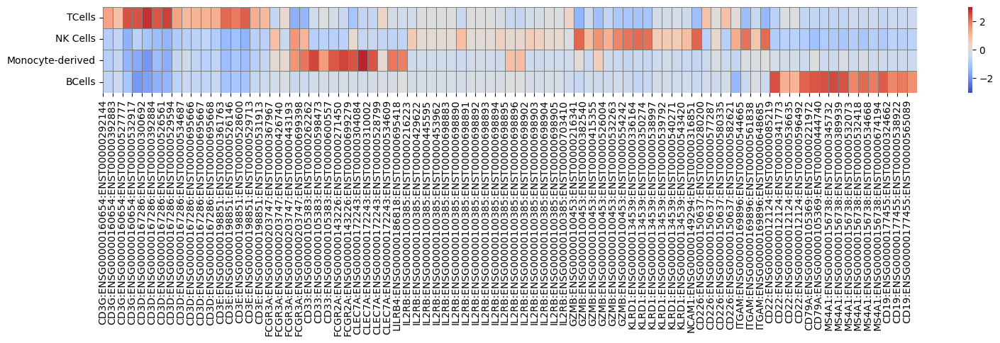

In [19]:
marker_groups_to_include = ["TCells", "Natural Killer", "BCell", "Monocyte-derived"]

# Build gene -> group mapping (only for selected groups)
gene_to_group = {}
matched_isoforms = []

for group, genes in marker_genes.items():
    if group not in marker_groups_to_include:
        continue  # skip unwanted groups
    matches = find_matching_genes(genes, adata_no_mk.var_names)
    matched_isoforms.extend(matches)
    for isoform in matches:
        gene_to_group[isoform] = group

# Get expression matrix for matched isoforms
iso_expr = pd.DataFrame(adata_no_mk[:, matched_isoforms].X.toarray(), 
                        columns=matched_isoforms, 
                        index=adata_no_mk.obs["gen_cell_type"])

# Calculate mean expression per cluster
mean_expr_iso = iso_expr.groupby(iso_expr.index).mean()

# Scale expression (z-score per isoform)
scaled_expr_iso = (mean_expr_iso - mean_expr_iso.mean(axis=1).values[:, None]) / mean_expr_iso.std(axis=1).values[:, None]

plot_df_iso = scaled_expr_iso.copy()
celltype_order = ["TCells", "NK Cells", "Monocyte-derived", "BCells"]
plot_df_iso = plot_df_iso.loc[celltype_order]
plot_df_iso = plot_df_iso.fillna(0)

from matplotlib.colors import TwoSlopeNorm

# Normalize: vmin/vmax
norm = TwoSlopeNorm(vmin=-3, vcenter=0, vmax=3)

# Remove duplicated isoform columns
plot_df_iso = plot_df_iso.loc[:, ~plot_df_iso.columns.duplicated()]

# Sort isoform columns by their marker group
isoform_to_group = {iso: gene_to_group[iso] for iso in plot_df_iso.columns if iso in gene_to_group}
group_rank = {group: i for i, group in enumerate(celltype_order)}
ordered_cols = sorted(plot_df_iso.columns, key=lambda x: group_rank.get(isoform_to_group.get(x, ""), 999))
plot_df_iso = plot_df_iso[ordered_cols]

plt.figure(figsize=(16, 5))
sns.heatmap(plot_df_iso, cmap="coolwarm", linewidths=0.7, linecolor='gray',
            cbar_kws={"label": ""}, square=False,
            norm=norm)

plt.xlabel("")
plt.ylabel("")
plt.xticks(ticks=np.arange(plot_df_iso.shape[1]), labels=plot_df_iso.columns, rotation=90)
plt.yticks(rotation=0)

plt.tight_layout()
#plt.savefig("Intermediate_Files/Paper_Figs/Markers/celltype_marker_isoform_heatmap.pdf",
#            dpi=600, transparent=True, bbox_inches="tight")
plt.show()

In [20]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load GTF cleanly
gtf_file = "Homo_sapiens.GRCh38.113.gtf"

gtf = pd.read_csv(
    gtf_file, 
    sep="\t", 
    comment="#", 
    header=None, 
    names=["chrom", "source", "feature", "start", "end", "score", "strand", "frame", "attribute"],
    dtype=str
)

# Parse attributes
gtf["transcript_id"] = gtf["attribute"].str.extract('transcript_id "([^"]+)"')
gtf["gene_id"] = gtf["attribute"].str.extract('gene_id "([^"]+)"')
gtf["gene_name"] = gtf["attribute"].str.extract('gene_name "([^"]+)"')

# Build mapping transcript_id -> gene_name (or gene_id fallback)
gtf_mapping = gtf.drop_duplicates("transcript_id").set_index("transcript_id")["gene_name"].fillna(gtf["gene_id"])

# Build isoform dataframe
isoform_df = pd.DataFrame(adata_no_mk.var.index)
isoform_df.columns = ["transcript_id"]

# Determine new isoforms
isoform_df["is_new_isoform"] = isoform_df["transcript_id"].str.contains("BambuTx")

# Add gene names
isoform_df["gene_name"] = isoform_df["transcript_id"].map(gtf_mapping)

# Make clean names
isoform_df["clean_name"] = np.where(
    isoform_df["gene_name"].notnull(),
    isoform_df["gene_name"] + ":" + isoform_df["transcript_id"],
    isoform_df["transcript_id"]
)

# Only new isoforms
new_isoform_df = isoform_df[isoform_df["is_new_isoform"]].copy()

# Get integer index for new isoforms (important fix!)
new_isoform_indices = new_isoform_df.index.to_numpy()

# Extract expression
X = adata_i_filtered.X
if hasattr(X, "toarray"):
    X = X.toarray()

In [27]:
# Subset expression
new_isoform_expr = X[:, new_isoform_indices]

# Build dataframe with correct names (FIXED)
df = pd.DataFrame(new_isoform_expr, 
                  columns=new_isoform_df["clean_name"].values, 
                  index=adata_i_filtered.obs_names)

# Add cell type
df["cell_type"] = adata_i_filtered.obs["gen_cell_type_reannotated"].values

In [28]:
# Melt
df_long = df.melt(id_vars="cell_type", var_name="isoform", value_name="expression")
df_long["expressed"] = df_long["expression"] > 0

# Calculate % of cells expressing
summary = df_long.groupby(["cell_type", "isoform"])["expressed"].mean().unstack(fill_value=0) * 100

# Sort isoforms alphabetically
summary = summary[sorted(summary.columns)]

/tmp/ipykernel_534167/2803979613.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  summary = df_long.groupby(["cell_type", "isoform"])["expressed"].mean().unstack(fill_value=0) * 100


In [29]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# --- (same up to df_long and summary) ---

# Classify isoforms based on transcript ID
new_isoform_df["is_novel_gene"] = new_isoform_df["transcript_id"].str.startswith("Bambu")

# Add classification to melted dataframe
df_long["is_novel_gene"] = df_long["isoform"].map(
    new_isoform_df.set_index("clean_name")["is_novel_gene"]
)

# Add clean_name mapping
df_long["clean_name"] = df_long["isoform"]

# Split data
df_known = df_long[df_long["is_novel_gene"] == False]  # ENSG → known gene
df_novel = df_long[df_long["is_novel_gene"] == True]   # Bambu → novel gene

/tmp/ipykernel_534167/2341708283.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  summary = df_subset.groupby(["cell_type", "clean_name"])["expression"].mean().unstack(fill_value=0)


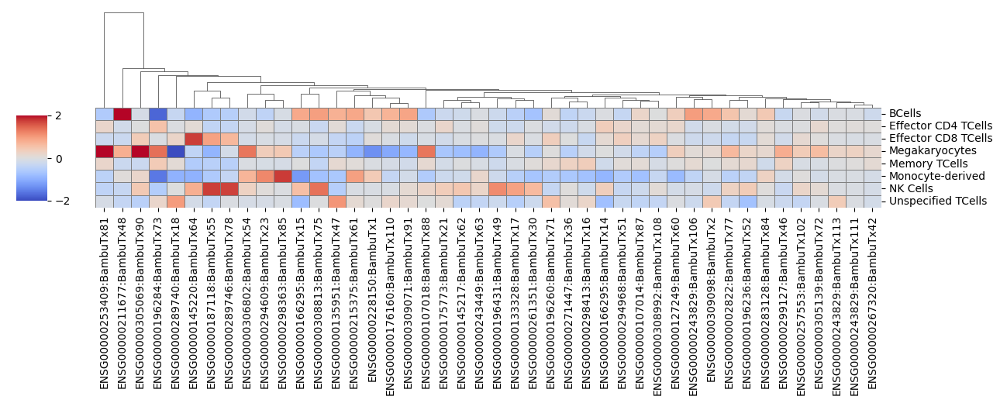

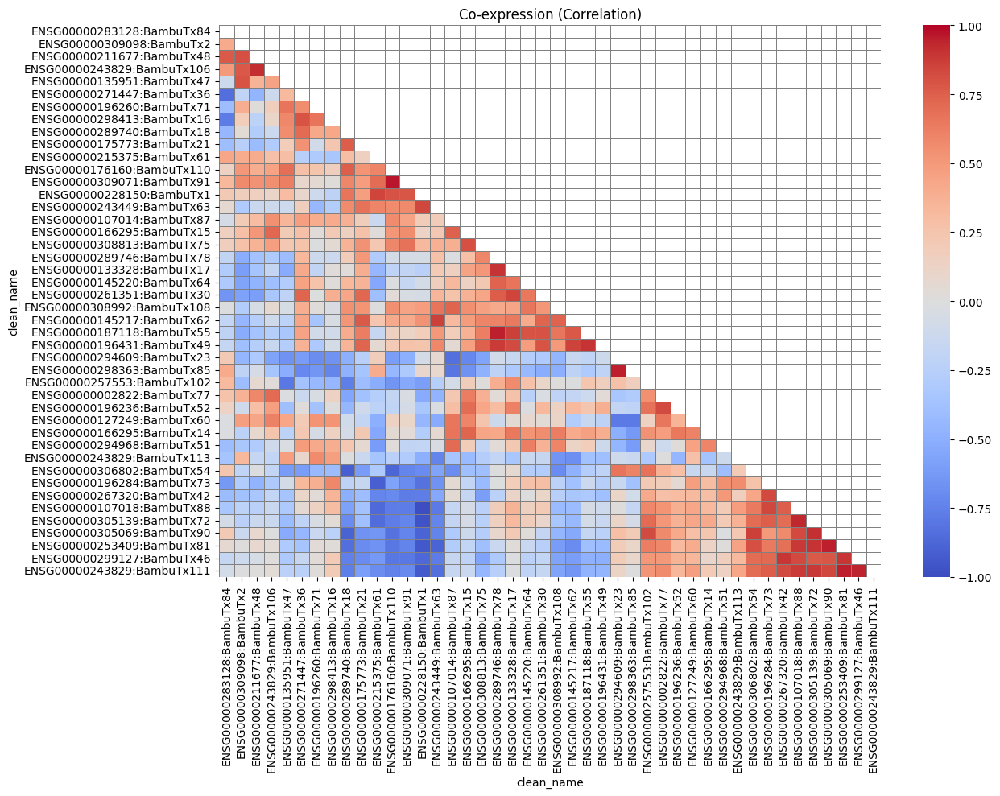

/tmp/ipykernel_534167/2341708283.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  summary = df_subset.groupby(["cell_type", "clean_name"])["expression"].mean().unstack(fill_value=0)


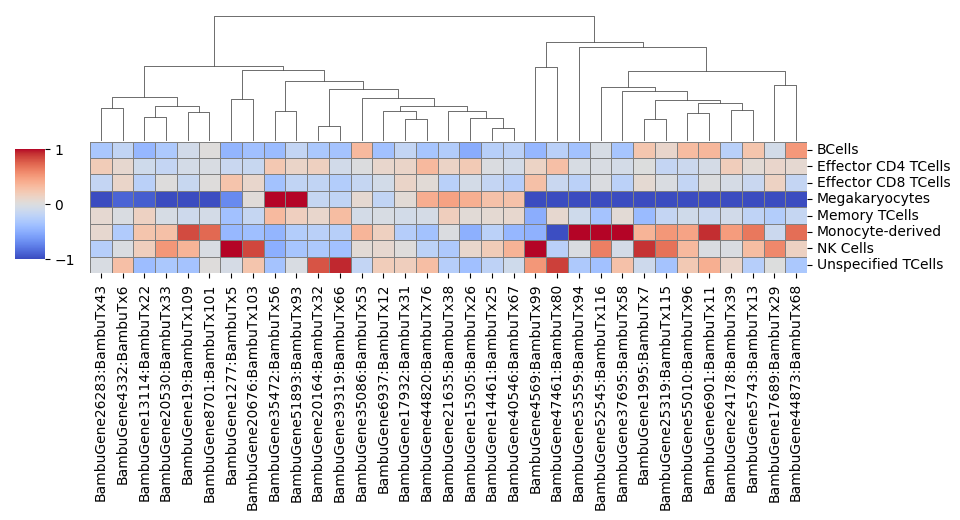

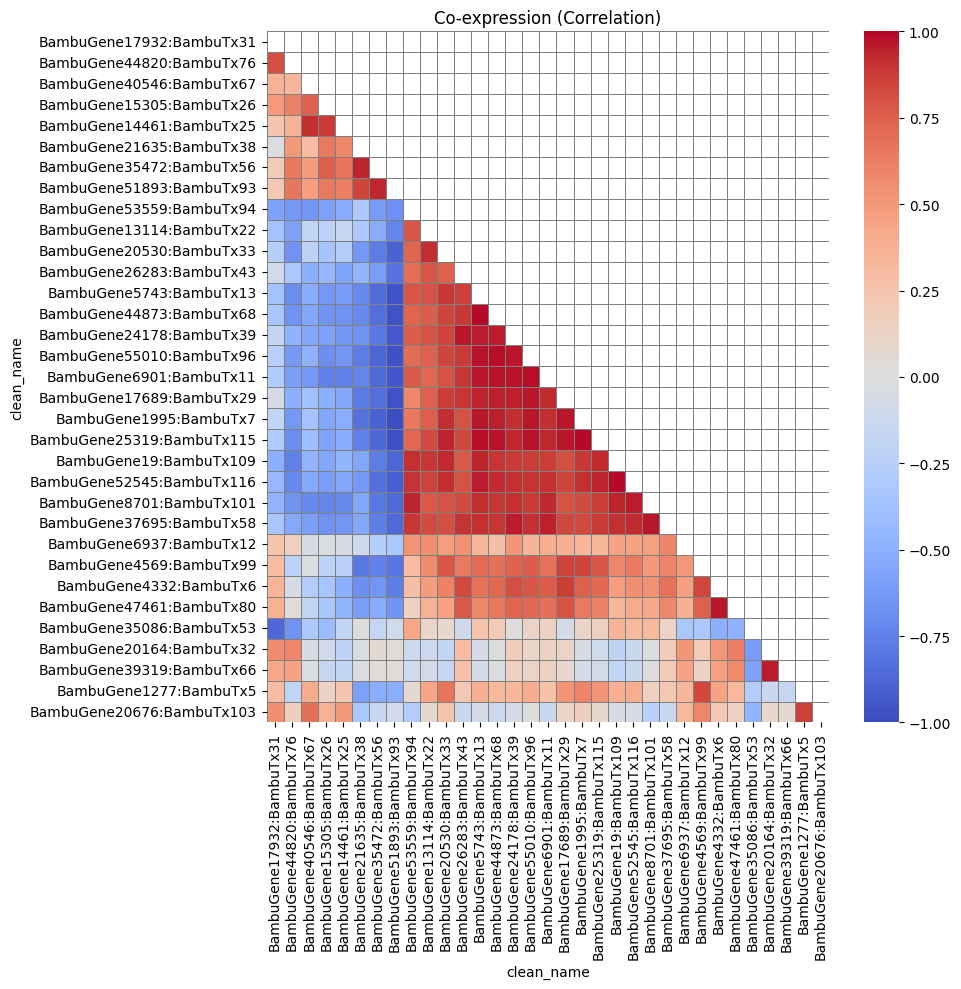

In [30]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy.spatial.distance import pdist, squareform
from scipy.cluster.hierarchy import linkage, leaves_list

def plot_clustermap_with_coexpression(df_subset, filename, vmax):
    # Step 1: Prepare mean expression matrix
    summary = df_subset.groupby(["cell_type", "clean_name"])["expression"].mean().unstack(fill_value=0)
    summary = summary[sorted(summary.columns)]

    # Step 2: Expression clustermap
    g = sns.clustermap(summary, cmap="coolwarm",
                       linewidths=0.5, linecolor='gray',
                       vmin=-vmax, vmax=vmax, center=0,
                       figsize=(len(summary.columns) * 0.3, 5.5),
                       row_cluster=False, col_cluster=True,
                       cbar_kws={"label": ""},
                       dendrogram_ratio=(0.1, 0.5),
                       cbar_pos=(0.02, 0.52, 0.03, 0.2))

    g.ax_heatmap.set_xlabel("")
    g.ax_heatmap.set_ylabel("", labelpad=20)
    g.ax_heatmap.set_xticklabels(g.ax_heatmap.get_xticklabels(), rotation=90)
    g.ax_heatmap.set_yticklabels(g.ax_heatmap.get_yticklabels(), rotation=0, ha='right', va='center', fontsize=10)

    for label in g.ax_heatmap.get_yticklabels():
        label.set_horizontalalignment('left')
        pos = label.get_position()
        label.set_position((pos[0], pos[1] - 0.3))

    g.ax_heatmap.figure.canvas.draw()

    # Step 3: Correlation matrix
    summary_reordered = summary[[summary.columns[i] for i in g.dendrogram_col.reordered_ind]]
    corr = summary_reordered.corr()

    # Step 4: Cluster the correlation matrix manually
    d = pdist(corr)
    linkage_matrix = linkage(d, method='average')
    idx = leaves_list(linkage_matrix)
    corr = corr.iloc[idx, :].iloc[:, idx]

    # Step 5: Apply mask for upper triangle
    mask = np.triu(np.ones_like(corr, dtype=bool))

    # Step 6: Plot triangle-only heatmap
    plt.figure(figsize=(len(corr.columns) * 0.3, 10))
    sns.heatmap(corr, cmap="coolwarm", linewidths=0.5, linecolor='gray',
                vmin=-1, vmax=1, center=0,
                xticklabels=True, yticklabels=True,
                mask=mask)

    plt.xticks(rotation=90)
    plt.yticks(rotation=0)
    plt.title("Co-expression (Correlation)")
    plt.tight_layout()

    # Save both figures
    g.savefig(filename.replace(".pdf", "_dendrogram.pdf"), dpi=600, transparent=True, bbox_inches="tight")
    plt.savefig(filename.replace(".pdf", "_coexpression.pdf"), dpi=600, transparent=True, bbox_inches="tight")
    plt.show()
    
plot_clustermap_with_coexpression(df_known, 
    "Intermediate_Files/Paper_Figs/new_isoform_known_subcelltype_heatmap_clustered_coexpression.pdf",
    vmax=2)

plot_clustermap_with_coexpression(df_novel, 
    "Intermediate_Files/Paper_Figs/new_isoform_novel_subcelltype_heatmap_clustered_coexpression.pdf",
    vmax=1)

In [18]:
import pandas as pd
import re

# Load the GTF file
gtf_file = "PBMC_FEB_28_2025_extended_annotations.gtf"  # update this path

gtf_data = pd.read_csv(
    gtf_file,
    sep="\t",
    comment="#",
    header=None,
    names=["seqname", "source", "feature", "start", "end", "score", "strand", "frame", "attribute"]
)

# Filter to exons or transcripts depending on GTF
if "exon" in gtf_data["feature"].unique():
    transcripts = gtf_data[gtf_data["feature"] == "exon"].copy()
else:
    transcripts = gtf_data[gtf_data["feature"] == "transcript"].copy()

# Extract transcript_id and gene_id
def extract_transcript_id(attr):
    match = re.search(r'transcript_id "([^"]+)"', attr)
    return match.group(1) if match else None

def extract_gene_id(attr):
    match = re.search(r'gene_id "([^"]+)"', attr)
    return match.group(1) if match else None

transcripts["transcript_id"] = transcripts["attribute"].apply(extract_transcript_id)
transcripts["gene_id"] = transcripts["attribute"].apply(extract_gene_id)

# For exon-based GTFs, sum exon lengths per transcript
if "exon" in transcripts["feature"].unique():
    transcripts["length"] = transcripts["end"] - transcripts["start"] + 1
    transcript_lengths = transcripts.groupby("transcript_id")["length"].sum().reset_index()
else:
    transcripts["length"] = transcripts["end"] - transcripts["start"] + 1
    transcript_lengths = transcripts[["transcript_id", "length"]].drop_duplicates()

print(transcript_lengths.head())

/tmp/ipykernel_3042557/443935572.py:7: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  gtf_data = pd.read_csv(


  transcript_id  length
0      BambuTx1     235
1     BambuTx10     271
2    BambuTx100    2086
3    BambuTx101     344
4    BambuTx102     343


In [19]:
# Extract transcript IDs from var_names
var_names = adata_i_filtered.var_names.to_series()

# Regex to find ENST IDs
var_names_transcript_ids = var_names.apply(
    lambda x: re.search(r'(ENST\d+)', x).group(1) if re.search(r'(ENST\d+)', x) else None
)

# Map transcript lengths
transcript_lengths = transcript_lengths.set_index("transcript_id")["length"]

# Map lengths to var_names
lengths = var_names_transcript_ids.map(transcript_lengths).fillna(0).values

In [40]:
X = adata_i_filtered.X
if hasattr(X, "toarray"):
    X = X.toarray()
X = np.maximum(X, 0)  # Clip to non-negative values

cell_types = adata_i_filtered.obs["gen_cell_type_reannotated"]

weighted_lengths = X * lengths
total_lengths = weighted_lengths.sum(axis=1)
total_expression = X.sum(axis=1)

mean_length_per_cell = total_lengths / (total_expression + 1e-10)

df = pd.DataFrame({
    "Cell_Type": cell_types,
    "Mean_Transcript_Length": mean_length_per_cell
})

summary = df.groupby("Cell_Type").agg(
    mean_length=("Mean_Transcript_Length", "mean"),
    median_length=("Mean_Transcript_Length", "median")
).reset_index()

print(summary)

             Cell_Type  mean_length  median_length
0               BCells  2872.193997    2885.930750
1  Effector CD4 TCells  2616.083168    2616.303743
2  Effector CD8 TCells  2612.254364    2618.954214
3       Megakaryocytes  2701.475389    2666.412329
4        Memory TCells  2467.836878    2465.120983
5     Monocyte-derived  2822.532564    2827.809730
6             NK Cells  2825.405069    2819.077050
7   Unspecified TCells  2714.089245    2700.910255


/tmp/ipykernel_3042557/4114501035.py:19: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  summary = df.groupby("Cell_Type").agg(


In [42]:
df["Mean_Transcript_Length_Capped"] = df["Mean_Transcript_Length"].clip(upper=200000)

/tmp/ipykernel_3042557/481363433.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(


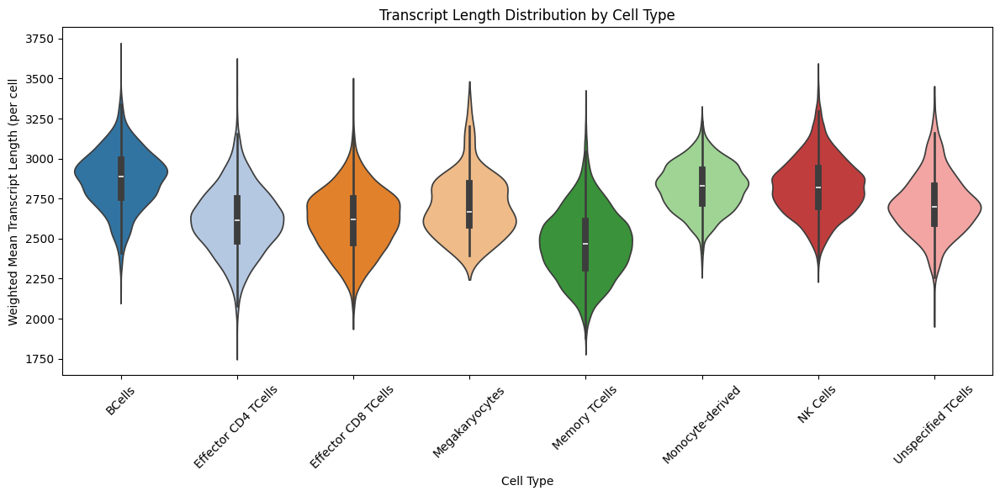

In [46]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
sns.violinplot(
    data=df, 
    x="Cell_Type", 
    y="Mean_Transcript_Length_Capped", 
    palette="tab20", 
    inner="box"
)
plt.xlabel("Cell Type")
plt.ylabel("Weighted Mean Transcript Length (per cell")
plt.title("Transcript Length Distribution by Cell Type")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()